#   <b>Proyección de precios de la distribuidora</b>

#   Resumen

Se debe entregar un pool de precios proyectado por cada licitación en punto de oferta en una ventana de 6 meses o 1 año idealmente.

<b>¿Cómo funciona el negocio?</b>

En el proceso de licitación que viene por periodo se busca obtener grandes volúmenes de energía para después venderlo a la población, participan muchos generadores y por cada proceso de licitación existe una ecuación dada por normativa que indica los índices financieros que se tienen que utilizar y la metodología de actualización, el precio depende también de la tecnología asociada al generador. Una licitación puede tener muchas empresas generadoras y a su vez las empresas generadoras pueden tener muchos contratos dependiendo de los bloques.

Los índices financieros están indicados en la normativa, muestra el cómo se actualiza, cuáles son y cuál es el precálculo.

El precio viene dado por regulación y se encuentra en la normativa el cómo se calcula dependiendo del proceso de licitación. En cuanto al precio de energía y al precio de potencia, estos se calculan por separados, en este caso sólo se solicita de energía.

La información se encuentra en la CNE (Comisión Nacional de Energía), dentro de la pestaña Tarificación Electricidad publica varios tipos de precios, el precio que se trabajará en esta oportunidad es el Precio Nudo Promedio.
Se recomienda leer la Resolución Exenta que indica el Informe Técnico Definitivo, esta resolución muestra las licitaciones vigentes.

URL: https://www.cne.cl/tarificacion/electrica/

#   Acerca del dataframe

Cada variable del dataframe corresponde a alguna componente de la fórmula para calcular el precio, sin embargo la manera en que se calculará el precio estará dada por el proceso licitatorio, esto es importante tenerlo en cuenta puesto que algunos precios se encuentran con su valor final y otros parcialmente calculados debiendo sumarlos para conocer la cantidad final y poder proyectar los precios adecuadamente.

Por ejemplo para los procesos licitatorios CGED 2006/01, CHL 2006/01, CHQ 2006/01, EMELSIC 2006/01 y EMEL-SIC 2006/01-2, se utiliza la siguiente fórmula para el cálculo de precio, pero en el dataset se encuentra cada componente en una fila distinta, para ilustrar de mejor manera suponga que aquella componente destacada en negro se encuentra en la fila 1 junto con su ponderador asociado a1, luego la componente destacada en verde se puede encontrar en la fila 8 junto con su ponderados a2, la componente en amarillo en la fila 50 y asi sucesivamente, por ende se deben encontrar estas filas, agruparlas y sumarlas para obtener el valor del precio real.

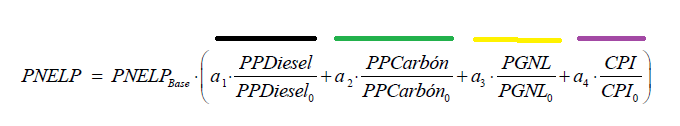

Otro ejemplo para aquellos datos que se encuentran con su precio final es para las licitaciones SIC 2015/02 y 2015/01, esto se debe a que tiene asociado un solo índice que correponde a CPI 6 meses.

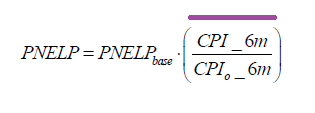

Entonces se debe tener cuidado con aquellas licitaciones que tienen asociadas más de un tipo de índice.

# Variables
1. versionindex: Versión de indexación de los precios
2. mesindexacion: Mes de indexación de los precios
3. version: Versión de indexación dentro del modelo de precios
4. idlicitaciongx: id de la licitación  de generación
5. licitacion: Nombre de licitación
6. generadora: Nombre de empresa generadora
7. tipobloque: Tipo de bloque de suministro, puede ser bloque base o bloque variable
8. bloque: Bloque de sumistro de energía
9. ptooferta: Nombre de barra donde se calculó el precio ofertado
10. precioenergiabase: Precio base de energía
11. iddecrpnudo: id del decreto de precio nudo asociado al proceso de licitación
12. decpnudo: Nombre del decreto de precio de nudo de corto plazo asociado a la licitación
13. tipodecreto: Tipo de decreto de precio de nudo
14. tipoindex: Tipo de indexación de acuerdo a lo indicado en los procesos de licitación
15. index: Nombre del indexador
16. mesreferencia: Corresponde al mes que se considera como referencia para determinar la fecha base
17. rezago: Cantidad de meses que se deben restar o sumar a las fechas de referencia, base o actual según lo indicado en la fórmula de cálculo de precio
18. ponderador: Es un valor que pondera el valor del indexador de acuerdo a lo indicado en la fórmula de calculo de precio de la licitación respectiva
19. fechabase: Mes de referencia menos el rezago para determinar el valor del indexador a utilizar
20. valorbase: Valor del indexador de acuerdo a la fecha base
21. fechaactual: Corresponde a la fecha de cálculo menos el rezago.
22. valoractual: Valor del indexador actual que se obtiene a partir de la fecha actual
23. factorindexacion: Corresponde al cuociente entre el valor actual y el valor base
24. precioindexadoponderado: Corresponde al precio base multiplicado por el factor de indexación y el ponderador
25. flagind: Indica si indexa o no
26. observacion: Observación asociada al cálculo del precio
27. created_at: Fecha de creación del registro
28. id: pk
29. tipoindexacion: Indica el tipo de indexación, si es tipo itd o mes
30. preciopotenciabase: Precio base de potencia

In [200]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import plotly.express as px
#Train data
from sklearn.model_selection import train_test_split
#FAMD
from prince import FAMD
#Normalization
from sklearn.preprocessing import StandardScaler
#Models
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier

#Evaluation
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
import pandas_profiling as pp
from sklearn.model_selection import GridSearchCV

#  Carga y limpieza de datos

En primer lugar se carga el dataset que contiene las fechas de vigencias de las licitaciones, para obtener las licitaciones que ya expiraron o expirarán este año, con el fin de no proyectar precios vencidos.

In [201]:
ruta_py=os.path.dirname(os.path.abspath("__file__"))

In [202]:

nombre_vigencia='precios_com_reg_licitaciongx.csv'
nombre_data= 'precios_com_reg_indexacioncontratodetalle_202304052006.csv'

ruta_completa_vig=ruta_py+'//'+nombre_vigencia
ruta_completa_data= ruta_py+'//'+nombre_data


In [203]:
#Se carga archivo que contiene las vigencias
precios_com_reg_licitaciongx=pd.read_csv(ruta_completa_vig,sep=';')
precios_com_reg_licitaciongx.head()

,Unnamed: 0,idlicitaciongx,idlicitacion,licitacion,rexbases,iddecrpnudo,decpnudo,tipodecreto,modalidad,mesreferencia,...,idptooferta,ptooferta,tipobloque,bloque,precioenergia,vigenciainicio,vigenciafin,observacion,created_at,update_at
0,0,10,29,SIC 2013/03_2,533/2014,8,4T/2013,Decreto PN,DS 4,2014-12-01,...,28,POLPAICO 220,BB,BS1B,88.998,2016-01-01,2030-12-31,NaN,2022-02-02 00:19:57.115012,2022-02-02 00:23:27
1,1,8,29,SIC 2013/03_2,533/2014,8,4T/2013,Decreto PN,DS 4,2014-12-01,...,28,POLPAICO 220,BB,BS1A,111.133,2016-01-01,2030-12-31,NaN,2022-02-02 00:19:57.115012,2022-02-02 00:23:27
2,2,11,29,SIC 2013/03_2,533/2014,8,4T/2013,Decreto PN,DS 4,2014-12-01,...,28,POLPAICO 220,BB,BS1B,111.133,2016-01-01,2030-12-31,NaN,2022-02-02 00:19:57.115012,2022-02-02 00:23:27
3,3,15,29,SIC 2013/03_2,533/2014,8,4T/2013,Decreto PN,DS 4,2014-12-01,...,28,POLPAICO 220,BB,BS1C,111.133,2016-01-01,2030-12-31,NaN,2022-02-02 00:19:57.115012,2022-02-02 00:23:27
4,4,41,30,SIC 2013/03_2 (EMELECTRIC),533/2014,8,4T/2013,Decreto PN,DS 4,2014-12-01,...,28,POLPAICO 220,BB,BS1A,111.133,2016-01-01,2030-12-31,Agregado por Tarificación,2022-02-02 00:19:57.115012,2022-02-02 00:23:27


Se genera un nuevo dataset con los valores de las licitaciones, su fecha de inicio y de expiración.

In [204]:
#se genera un nuevo dataset solo con las fechas de vigencias y las licitaciones
vigencias= precios_com_reg_licitaciongx[['licitacion', 'vigenciainicio','vigenciafin']]
vigencias.head()

,licitacion,vigenciainicio,vigenciafin
0,SIC 2013/03_2,2016-01-01,2030-12-31
1,SIC 2013/03_2,2016-01-01,2030-12-31
2,SIC 2013/03_2,2016-01-01,2030-12-31
3,SIC 2013/03_2,2016-01-01,2030-12-31
4,SIC 2013/03_2 (EMELECTRIC),2016-01-01,2030-12-31


Se puede observar que las fechas no se encuentran en formato datatime de manera que requieren ser modififcadas.

In [205]:
vigencias.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 236 entries, 0 to 235
Data columns (total 3 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   licitacion      236 non-null    object
 1   vigenciainicio  236 non-null    object
 2   vigenciafin     236 non-null    object
dtypes: object(3)
memory usage: 5.7+ KB


Se transforman las fechas de inicio y fin de las vigencias a formato datatime para poder trabajarlas de mejor manera.

In [206]:
#se pasa a datatime las fechas de las vigencias
vigencias['vigenciainicio'] = pd.to_datetime(vigencias['vigenciainicio'])
vigencias['vigenciafin'] = pd.to_datetime(vigencias['vigenciafin'])

C:\Users\Vskah\AppData\Local\Temp\ipykernel_5820\3530378407.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vigencias['vigenciainicio'] = pd.to_datetime(vigencias['vigenciainicio'])
C:\Users\Vskah\AppData\Local\Temp\ipykernel_5820\3530378407.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vigencias['vigenciafin'] = pd.to_datetime(vigencias['vigenciafin'])


Se calcula el tiempo de las vigencias de los contratos. 

In [207]:
vigencias['tiempovigencia'] = (vigencias['vigenciafin']-vigencias['vigenciainicio']).astype('<m8[Y]')


C:\Users\Vskah\AppData\Local\Temp\ipykernel_5820\1191411901.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vigencias['tiempovigencia'] = (vigencias['vigenciafin']-vigencias['vigenciainicio']).astype('<m8[Y]')


In [208]:
vigencias.head()

,licitacion,vigenciainicio,vigenciafin,tiempovigencia
0,SIC 2013/03_2,2016-01-01,2030-12-31,14.0
1,SIC 2013/03_2,2016-01-01,2030-12-31,14.0
2,SIC 2013/03_2,2016-01-01,2030-12-31,14.0
3,SIC 2013/03_2,2016-01-01,2030-12-31,14.0
4,SIC 2013/03_2 (EMELECTRIC),2016-01-01,2030-12-31,14.0


Se chequea si hay elementos duplicados en la base de datos.

In [209]:
duplicate_rows = vigencias[vigencias.duplicated()]
print("number of duplicate rows: ", duplicate_rows.shape)

number of duplicate rows:  (180, 4)


Se eliminan los duplicados.

In [210]:
vigencias=vigencias.drop_duplicates()
vigencias.head()

,licitacion,vigenciainicio,vigenciafin,tiempovigencia
0,SIC 2013/03_2,2016-01-01,2030-12-31,14.0
4,SIC 2013/03_2 (EMELECTRIC),2016-01-01,2030-12-31,14.0
9,SIC 2013/03,2014-01-01,2025-12-31,11.0
11,SIC 2013/03 (EMELECTRIC),2014-01-01,2025-12-31,11.0
15,EMEL-SIC 2006/01-2 (EMELECTRIC),2010-01-01,2024-12-31,14.0


In [211]:
vigencias['vigenciafin'].max()

Timestamp('2041-12-31 00:00:00')

Por otro lado se genera un nuevo dataframe donde se eliminan los duplicados dejando solo las licitaciones en valores únicos, esto con el fin de graficarlas posteriormente.

Se eliminan los duplicados y se vuelve a comprobar su existencia.

In [212]:
vigencias_unicas=vigencias.drop_duplicates(subset='licitacion')
vigencias_unicas.head()

,licitacion,vigenciainicio,vigenciafin,tiempovigencia
0,SIC 2013/03_2,2016-01-01,2030-12-31,14.0
4,SIC 2013/03_2 (EMELECTRIC),2016-01-01,2030-12-31,14.0
9,SIC 2013/03,2014-01-01,2025-12-31,11.0
11,SIC 2013/03 (EMELECTRIC),2014-01-01,2025-12-31,11.0
15,EMEL-SIC 2006/01-2 (EMELECTRIC),2010-01-01,2024-12-31,14.0


In [213]:
duplicate_rows = vigencias_unicas[vigencias_unicas.duplicated()]
print("number of duplicate rows: ", duplicate_rows.shape)

number of duplicate rows:  (0, 4)


Se filtran todas aquellas fechas cuyo vencimiento límite sea hasta final del año 2022, pues esos datos no requieren ser proyectados a futuro.

In [214]:
#Se filtran las vigencias vencidas
var=vigencias['vigenciafin'] <= '31-12-2022'
vigencias = vigencias[var]
vigencias.head()

C:\Users\Vskah\AppData\Local\Temp\ipykernel_5820\3391736610.py:2: UserWarning: Parsing dates in DD/MM/YYYY format when dayfirst=False (the default) was specified. This may lead to inconsistently parsed dates! Specify a format to ensure consistent parsing.
  var=vigencias['vigenciafin'] <= '31-12-2022'


,licitacion,vigenciainicio,vigenciafin,tiempovigencia
16,EMEL-SIC 2006/01 (EMELECTRIC),2010-01-01,2019-12-31,9.0
17,CHL 2006/02,2011-01-01,2021-12-31,10.0
20,CHL 2006/01,2010-01-01,2020-12-31,10.0
22,CHL 2006/01,2010-01-01,2022-12-31,12.0
26,EMEL-SIC 2006/01 (EMETAL),2010-01-01,2019-12-31,9.0


In [215]:
vigencias.shape

(10, 4)

Se genera una lista con todas las licitaciones expiradas.

In [216]:
#se genera una lista con las licitaciones expiradas
licitacion_expirada= list(vigencias['licitacion'])

Se carga la base de datos a utilizar en el resto del trabajo.

In [217]:
indexacion_contratos=pd.read_csv(ruta_completa_data)
indexacion_contratos.head()

,versionindex,mesindexacion,version,idlicitaciongx,licitacion,generadora,tipobloque,bloque,ptooferta,precioenergiabase,...,fechaactual,valoractual,factorindexacion,precioindexadoponderado,flagind,observacion,created_at,id,tipoindexacion,preciopotenciabase
0,240,2012-12-01,V1,76,CHL 2006/02,ENDESA,BV,BB1,POLPAICO 220,61.00,...,2012-09-01 00:00:00.000,2.58,0.352941,6.458824,0,NaN,2022-02-11 16:10:37.644,1002867,Mes,7.2492
1,240,2012-12-01,V1,81,CHL 2006/02,ENDESA,BB,BB3,POLPAICO 220,61.00,...,2012-09-01 00:00:00.000,2.58,0.352941,6.458824,0,NaN,2022-02-11 16:10:37.644,1002868,Mes,7.2492
2,240,2012-12-01,V1,82,CHL 2006/02,ENDESA,BV,BB3,POLPAICO 220,61.00,...,2012-09-01 00:00:00.000,2.58,0.352941,6.458824,0,NaN,2022-02-11 16:10:37.644,1002869,Mes,7.2492
3,240,2012-12-01,V1,75,CHL 2006/02,ENDESA,BB,BB1,POLPAICO 220,61.00,...,2012-09-01 00:00:00.000,2.58,0.352941,6.458824,0,NaN,2022-02-11 16:10:37.644,1002870,Mes,7.2492
4,240,2012-12-01,V1,123,EMEL-SING 2008/01,E-CL,BB,BS1,CRUCERO 220,89.99,...,2012-09-01 00:00:00.000,2.77,0.734748,39.275264,0,Agregado por Tarificación,2022-02-11 16:10:37.644,1002871,Mes,8.5659


Se da inicio con un dataset que contiene 109.974 filas y 30 columnas.

In [218]:
indexacion_contratos.shape

(109974, 30)

In [219]:
indexacion_contratos['mesindexacion'].max()

'2022-12-01'

Se observa que todos los datos con enteros u object, las fechas no estan en formato datatime.

In [220]:
indexacion_contratos.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 109974 entries, 0 to 109973
Data columns (total 30 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   versionindex             109974 non-null  int64  
 1   mesindexacion            109974 non-null  object 
 2   version                  109974 non-null  object 
 3   idlicitaciongx           109974 non-null  int64  
 4   licitacion               109974 non-null  object 
 5   generadora               109974 non-null  object 
 6   tipobloque               109974 non-null  object 
 7   bloque                   109974 non-null  object 
 8   ptooferta                109974 non-null  object 
 9   precioenergiabase        109974 non-null  float64
 10  iddecrpnudo              109974 non-null  int64  
 11  decpnudo                 109974 non-null  object 
 12  tipodecreto              109974 non-null  object 
 13  tipoindex                109974 non-null  object 
 14  inde

Se revisa si hay datos duplicados en la base de datos, no encontrando datos duplicados.

In [221]:
duplicate_rows = indexacion_contratos[indexacion_contratos.duplicated()]
print("number of duplicate rows: ", duplicate_rows.shape)

number of duplicate rows:  (0, 30)


Se eliminan las licitaciones vencidas, quedando con un total de filas de 77.562, y 30 columnas.

In [222]:
for i in licitacion_expirada:
    indexacion_contratos.drop(indexacion_contratos[(indexacion_contratos['licitacion'] == i)].index, inplace=True)


indexacion_contratos.shape

(77562, 30)

In [223]:
porcentaje=(77562/109974)*100
print(f'El porcentaje de datos que se mantienen en la base es de {round(porcentaje,2)}%')

El porcentaje de datos que se mantienen en la base es de 70.53%


Se cuentan los valores nulos, en donde solo la variable observaciones tiene valores de este tipo, los cuales ascienden a 33.816.

In [224]:
# Let's count number of null entries per feature
missing_values = list(indexacion_contratos.isna().sum())
# missing values is a list of the number of missing values in each column

cols = list(indexacion_contratos.columns)
col_final = []
for i in range(len(cols)):
    if (missing_values[i] == 0):
        cols[i]="Others"
d = dict(zip(cols, missing_values)) # making a dicionary for the missing values

print("Number of Missing Values per feature >>")
missing_vals = pd.DataFrame(d, index=["Missing Values"]) # Making a custom dataframe from dict d
missing_vals.head()

Number of Missing Values per feature >>


,Others,observacion
Missing Values,0,33816


Se revisan los valores únicos para cada variable, con el fin de revisar si existen variables que solo tomen un valor. Se encuentra que las variables Flagind y Version tienen un solo valor que se repite para cada elemento de la tabla.

In [225]:
for i in indexacion_contratos.columns:
    u=indexacion_contratos[i].unique()
    print('--------------------------')
    print(i,':')
    print(u)

--------------------------
versionindex :
[240 292 262 241  25  23 242 323 322 243 244 245 263 246 247 248 249 250
 293 251 252  31 253 254 255 256 257 258 294 295 296 297 298 299 300 301
 302 303 304 305 306 307 308 309 310 311 312 144 313 314 315 316 317 318
 319 320 321  32  70  33 326 328 383 332 335 337 388 264 339 353 362 259
 364 205 206 207 208 209 210 211 212 260 213 214 215 216 217 218 219 220
 221 222 223 224 261 225 226 227 228 229 230 231 232 233 234 235 236 237
 238 239 265 266 267 268 269 270 271 272 273 274 275 276 277 278 279 280
 281 282 283 284 285 286 287 288 289 290 291 377 368  34 379 373 375  30
  18  19  20  21 370  22  35  60  61  17  63  67]
--------------------------
mesindexacion :
['2012-12-01' '2017-04-01' '2014-10-01' '2013-01-01' '2021-06-01'
 '2020-07-01' '2013-02-01' '2019-12-01' '2019-11-01' '2013-03-01'
 '2013-04-01' '2013-05-01' '2014-11-01' '2013-06-01' '2013-07-01'
 '2013-08-01' '2013-09-01' '2013-10-01' '2017-05-01' '2013-11-01'
 '2013-12-01' '20

Se eliminan las columnas flagind y version debido a que es el mismo dato para cada fila del dataframe, el valor observacion y los id contenidos en la base, los cuales corresponden a id, idlicitaciongx, ididdecrpnudo  pues no son relevantes para el trabajo.

In [226]:
indexacion_contratos_2=indexacion_contratos.drop(['flagind'],axis=1)
indexacion_contratos_2=indexacion_contratos_2.drop(['version'],axis=1)
indexacion_contratos_2=indexacion_contratos_2.drop(['observacion'],axis=1)
indexacion_contratos_2=indexacion_contratos_2.drop(['id'],axis=1)
indexacion_contratos_2=indexacion_contratos_2.drop(['idlicitaciongx'],axis=1)
indexacion_contratos_2=indexacion_contratos_2.drop(['iddecrpnudo'],axis=1)


Al analizar la definición de las variables se hace evidente la necesidad de eliminar las columnas created_at, que representa la fecha de creacion del archivo, y la columna version index, que es la versión del cálculo del índice, y no influyen en el cálculo del precio.

In [227]:
indexacion_contratos_2=indexacion_contratos_2.drop(['created_at'],axis=1)
indexacion_contratos_2=indexacion_contratos_2.drop(['versionindex'],axis=1)

Se transforman las fechas a formato datatime.

In [228]:
indexacion_contratos_2[['mesindexacion', 'mesreferencia','fechaactual','fechabase']] = indexacion_contratos_2[['mesindexacion', 'mesreferencia','fechaactual','fechabase']].apply(pd.to_datetime, format='%Y-%m-%d')

In [229]:
indexacion_contratos_2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 77562 entries, 4 to 109973
Data columns (total 22 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   mesindexacion            77562 non-null  datetime64[ns]
 1   licitacion               77562 non-null  object        
 2   generadora               77562 non-null  object        
 3   tipobloque               77562 non-null  object        
 4   bloque                   77562 non-null  object        
 5   ptooferta                77562 non-null  object        
 6   precioenergiabase        77562 non-null  float64       
 7   decpnudo                 77562 non-null  object        
 8   tipodecreto              77562 non-null  object        
 9   tipoindex                77562 non-null  object        
 10  index                    77562 non-null  object        
 11  mesreferencia            77562 non-null  datetime64[ns]
 12  rezago                   77562 

Al mesidexacion se le divide en año día y mes, y se elimina la variable mesindexacion, se repite el procedimiento para las otras fechas del dataframe.

In [230]:
indexacion_contratos_2['diaindexacion'] =indexacion_contratos_2['mesindexacion'].apply(lambda x:x.strftime('%d'))
indexacion_contratos_2['añoindexacion'] = indexacion_contratos_2['mesindexacion'].apply(lambda x:x.strftime('%Y'))
indexacion_contratos_2['mesindexacion2'] =indexacion_contratos_2['mesindexacion'].apply(lambda x:x.strftime('%m'))


In [231]:
indexacion_contratos_2['diaactual'] =indexacion_contratos_2['fechaactual'].apply(lambda x:x.strftime('%d'))
indexacion_contratos_2['añoactual'] = indexacion_contratos_2['fechaactual'].apply(lambda x:x.strftime('%Y'))
indexacion_contratos_2['mesactual'] =indexacion_contratos_2['fechaactual'].apply(lambda x:x.strftime('%m'))


In [232]:
indexacion_contratos_2['diareferencia'] =indexacion_contratos_2['mesreferencia'].apply(lambda x:x.strftime('%d'))
indexacion_contratos_2['añoreferencia'] = indexacion_contratos_2['mesreferencia'].apply(lambda x:x.strftime('%Y'))
indexacion_contratos_2['mesreferencia'] =indexacion_contratos_2['mesreferencia'].apply(lambda x:x.strftime('%m'))


In [233]:
indexacion_contratos_2['diabase'] =indexacion_contratos_2['fechabase'].apply(lambda x:x.strftime('%d'))
indexacion_contratos_2['añobase'] = indexacion_contratos_2['fechabase'].apply(lambda x:x.strftime('%Y'))
indexacion_contratos_2['mesbase'] =indexacion_contratos_2['fechabase'].apply(lambda x:x.strftime('%m'))


In [234]:
indexacion_contratos_2=indexacion_contratos_2.drop(['fechaactual'],axis=1)
indexacion_contratos_2=indexacion_contratos_2.drop(['fechabase'],axis=1)

Se visualizan aquellos datos que son únicos para conocer si varía cada variable.

In [235]:
for i in indexacion_contratos_2.columns:
    u=indexacion_contratos_2[i].unique()
    print('--------------------------')
    print(i,':')
    print(u)

--------------------------
mesindexacion :
['2012-12-01T00:00:00.000000000' '2017-04-01T00:00:00.000000000'
 '2014-10-01T00:00:00.000000000' '2013-01-01T00:00:00.000000000'
 '2021-06-01T00:00:00.000000000' '2020-07-01T00:00:00.000000000'
 '2013-02-01T00:00:00.000000000' '2019-12-01T00:00:00.000000000'
 '2019-11-01T00:00:00.000000000' '2013-03-01T00:00:00.000000000'
 '2013-04-01T00:00:00.000000000' '2013-05-01T00:00:00.000000000'
 '2014-11-01T00:00:00.000000000' '2013-06-01T00:00:00.000000000'
 '2013-07-01T00:00:00.000000000' '2013-08-01T00:00:00.000000000'
 '2013-09-01T00:00:00.000000000' '2013-10-01T00:00:00.000000000'
 '2017-05-01T00:00:00.000000000' '2013-11-01T00:00:00.000000000'
 '2013-12-01T00:00:00.000000000' '2020-08-01T00:00:00.000000000'
 '2014-01-01T00:00:00.000000000' '2014-02-01T00:00:00.000000000'
 '2014-03-01T00:00:00.000000000' '2014-04-01T00:00:00.000000000'
 '2014-05-01T00:00:00.000000000' '2014-06-01T00:00:00.000000000'
 '2017-06-01T00:00:00.000000000' '2017-07-01T00

Se debe eliminar dia diaindexacion, diaactual y diareferencia pues tienen un único valor para cada fila del dataframe.

In [236]:
indexacion_contratos_2=indexacion_contratos_2.drop(['diaactual'],axis=1)
indexacion_contratos_2=indexacion_contratos_2.drop(['diareferencia'],axis=1)
indexacion_contratos_2=indexacion_contratos_2.drop(['diaindexacion'],axis=1)
indexacion_contratos_2=indexacion_contratos_2.drop(['diabase'],axis=1)

In [237]:
indexacion_contratos_2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 77562 entries, 4 to 109973
Data columns (total 27 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   mesindexacion            77562 non-null  datetime64[ns]
 1   licitacion               77562 non-null  object        
 2   generadora               77562 non-null  object        
 3   tipobloque               77562 non-null  object        
 4   bloque                   77562 non-null  object        
 5   ptooferta                77562 non-null  object        
 6   precioenergiabase        77562 non-null  float64       
 7   decpnudo                 77562 non-null  object        
 8   tipodecreto              77562 non-null  object        
 9   tipoindex                77562 non-null  object        
 10  index                    77562 non-null  object        
 11  mesreferencia            77562 non-null  object        
 12  rezago                   77562 

En conversación con el negocio, se explicó que los valores correspondientes a ITD no sirven para el cálculo, pues ellos solo necesitan la predicción para los meses, de manera que se filtra el mes.

In [238]:
var=indexacion_contratos_2['tipoindexacion'] == 'Mes'
indexacion_contratos_2 = indexacion_contratos_2[var]
indexacion_contratos_2.head()

,mesindexacion,licitacion,generadora,tipobloque,bloque,ptooferta,precioenergiabase,decpnudo,tipodecreto,tipoindex,...,precioindexadoponderado,tipoindexacion,preciopotenciabase,añoindexacion,mesindexacion2,añoactual,mesactual,añoreferencia,añobase,mesbase
4,2012-12-01,EMEL-SING 2008/01,E-CL,BB,BS1,CRUCERO 220,89.990,130/2008,Decreto PN SING,E1,...,39.275264,Mes,8.5659,2012,12,2012,09,2009,2009,06
5,2012-12-01,EMEL-SING 2008/01,E-CL,BV,BS1,CRUCERO 220,89.990,130/2008,Decreto PN SING,E1,...,39.275264,Mes,8.5659,2012,12,2012,09,2009,2009,06
6,2012-12-01,EMEL-SING 2008/01 (ELECDA),E-CL,BV,BS1,CRUCERO 220,89.990,130/2008,Decreto PN SING,E1,...,39.275264,Mes,8.5659,2012,12,2012,09,2009,2009,06
7,2012-12-01,EMEL-SING 2008/01 (ELECDA),E-CL,BB,BS1,CRUCERO 220,89.990,130/2008,Decreto PN SING,E1,...,39.275264,Mes,8.5659,2012,12,2012,09,2009,2009,06
16,2012-12-01,CHQ 2006/01,ENDESA,BB,BB1,QUILLOTA 220,51.037,283/2005,Decreto PN,E3,...,42.008249,Mes,6.9704,2012,12,2012,09,2006,2005,12


Además se menciona que aquellos tipoindex con valor P tampoco sirven para el cálculo de manera que también se filtran.

In [239]:
var2=indexacion_contratos_2['tipoindex'] != 'P'
indexacion_contratos_2 = indexacion_contratos_2[var2]
indexacion_contratos_2.head()

,mesindexacion,licitacion,generadora,tipobloque,bloque,ptooferta,precioenergiabase,decpnudo,tipodecreto,tipoindex,...,precioindexadoponderado,tipoindexacion,preciopotenciabase,añoindexacion,mesindexacion2,añoactual,mesactual,añoreferencia,añobase,mesbase
4,2012-12-01,EMEL-SING 2008/01,E-CL,BB,BS1,CRUCERO 220,89.990,130/2008,Decreto PN SING,E1,...,39.275264,Mes,8.5659,2012,12,2012,09,2009,2009,06
5,2012-12-01,EMEL-SING 2008/01,E-CL,BV,BS1,CRUCERO 220,89.990,130/2008,Decreto PN SING,E1,...,39.275264,Mes,8.5659,2012,12,2012,09,2009,2009,06
6,2012-12-01,EMEL-SING 2008/01 (ELECDA),E-CL,BV,BS1,CRUCERO 220,89.990,130/2008,Decreto PN SING,E1,...,39.275264,Mes,8.5659,2012,12,2012,09,2009,2009,06
7,2012-12-01,EMEL-SING 2008/01 (ELECDA),E-CL,BB,BS1,CRUCERO 220,89.990,130/2008,Decreto PN SING,E1,...,39.275264,Mes,8.5659,2012,12,2012,09,2009,2009,06
16,2012-12-01,CHQ 2006/01,ENDESA,BB,BB1,QUILLOTA 220,51.037,283/2005,Decreto PN,E3,...,42.008249,Mes,6.9704,2012,12,2012,09,2006,2005,12


Se queda con un total de 22.683 filas.

In [240]:
indexacion_contratos_2.shape

(22683, 27)

In [241]:
porcentaje=(22683/109974)*100
print(f'El porcentaje de datos que se mantienen en la base es de {round(porcentaje,2)}%')

El porcentaje de datos que se mantienen en la base es de 20.63%


Se revisa que se hayan eliminado los valores ITD y P del dataset.

In [242]:
print(indexacion_contratos_2['tipoindexacion'].unique())
print(indexacion_contratos_2['tipoindex'].unique())


['Mes']
['E1' 'E3' 'E2' 'E4']


Se elimina el tipo index pues cada índice tiene un significado diferente dependiendo de la fórmula en la que se utiliza, no siempre hay relación entre el índice de una columna y el de otra.

In [243]:
indexacion_contratos_2=indexacion_contratos_2.drop(['tipoindex'],axis=1)

Se elimina la columna tipoindexacion pues solo está compuesta por el valor mes.

In [244]:
indexacion_contratos_2=indexacion_contratos_2.drop(['tipoindexacion'],axis=1)

Se restablecen los índices a predeterminados.

In [245]:
indexacion_contratos_2.reset_index(drop=True)

,mesindexacion,licitacion,generadora,tipobloque,bloque,ptooferta,precioenergiabase,decpnudo,tipodecreto,index,...,factorindexacion,precioindexadoponderado,preciopotenciabase,añoindexacion,mesindexacion2,añoactual,mesactual,añoreferencia,añobase,mesbase
0,2012-12-01,EMEL-SING 2008/01,E-CL,BB,BS1,CRUCERO 220,89.990,130/2008,Decreto PN SING,GNL_4M,...,0.734748,39.275264,8.5659,2012,12,2012,09,2009,2009,06
1,2012-12-01,EMEL-SING 2008/01,E-CL,BV,BS1,CRUCERO 220,89.990,130/2008,Decreto PN SING,GNL_4M,...,0.734748,39.275264,8.5659,2012,12,2012,09,2009,2009,06
2,2012-12-01,EMEL-SING 2008/01 (ELECDA),E-CL,BV,BS1,CRUCERO 220,89.990,130/2008,Decreto PN SING,GNL_4M,...,0.734748,39.275264,8.5659,2012,12,2012,09,2009,2009,06
3,2012-12-01,EMEL-SING 2008/01 (ELECDA),E-CL,BB,BS1,CRUCERO 220,89.990,130/2008,Decreto PN SING,GNL_4M,...,0.734748,39.275264,8.5659,2012,12,2012,09,2009,2009,06
4,2012-12-01,CHQ 2006/01,ENDESA,BB,BB1,QUILLOTA 220,51.037,283/2005,Decreto PN,CPI,...,1.175849,42.008249,6.9704,2012,12,2012,09,2006,2005,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22678,2022-11-01,SIC 2013/03_2 (EMETAL),E-CL,BB,BS3,POLPAICO 220,109.480,4T/2013,Decreto PN,GNL_6M,...,1.688555,21.259250,8.9176,2022,11,2022,08,2014,2014,09
22679,2022-11-01,SIC 2013/03_2 (EMETAL),EL CAMPESINO,BB,BS4,POLPAICO 220,110.985,4T/2013,Decreto PN,GNL_6M,...,1.690141,71.280507,8.9176,2022,11,2022,08,2014,2014,09
22680,2022-11-01,SIC 2013/03_2 (ENELSA),EL CAMPESINO,BB,BS4,POLPAICO 220,110.985,4T/2013,Decreto PN,GNL_6M,...,1.690141,71.280507,8.9176,2022,11,2022,08,2014,2014,09
22681,2022-11-01,SIC 2013/03_2,EL CAMPESINO,BB,BS4,POLPAICO 220,110.985,4T/2013,Decreto PN,GNL_6M,...,1.690141,71.280507,8.9176,2022,11,2022,08,2014,2014,09


Se tienen 24 columnas.

In [246]:
indexacion_contratos_2.shape

(22683, 25)

Se define un nuevo dataframe para posteriormente trabajarlo.

In [247]:
indexacion_contratos_3=indexacion_contratos_2.copy()

Se establecen los meses, años y días como tipo de dato numérico.

In [248]:
indexacion_contratos_3['mesindexacion2']=indexacion_contratos_3['mesindexacion2'].astype("int")
indexacion_contratos_3['añoindexacion']=indexacion_contratos_3['añoindexacion'].astype("int")
indexacion_contratos_3['añoactual']=indexacion_contratos_3['añoactual'].astype("int")
indexacion_contratos_3['mesactual']=indexacion_contratos_3['mesactual'].astype("int")
indexacion_contratos_3['añoreferencia']=indexacion_contratos_3['añoreferencia'].astype("int")
indexacion_contratos_3['mesreferencia']=indexacion_contratos_3['mesreferencia'].astype("int")
indexacion_contratos_3['añobase']=indexacion_contratos_3['añobase'].astype("int")
indexacion_contratos_3['mesbase']=indexacion_contratos_3['mesbase'].astype("int")

In [249]:
indexacion_contratos_3.columns

Index(['mesindexacion', 'licitacion', 'generadora', 'tipobloque', 'bloque',
       'ptooferta', 'precioenergiabase', 'decpnudo', 'tipodecreto', 'index',
       'mesreferencia', 'rezago', 'ponderador', 'valorbase', 'valoractual',
       'factorindexacion', 'precioindexadoponderado', 'preciopotenciabase',
       'añoindexacion', 'mesindexacion2', 'añoactual', 'mesactual',
       'añoreferencia', 'añobase', 'mesbase'],
      dtype='object')

In [250]:
indexacion_contratos_3.columns = ['mesindexacion', 'licitacion', 'generadora', 'tipobloque', 'bloque',
      'ptooferta', 'precioenergiabase', 'decpnudo', 'tipodecreto', 
      'indice', 'mesreferencia', 'rezago', 'ponderador',
      'valorbase', 'valoractual', 'factorindexacion',
       'precioindexadoponderado', 'preciopotenciabase', 'añoindexacion', 'mesindexacion2',
       'añoactual', 'mesactual', 'añoreferencia', 'añobase', 'mesbase']

#indexacion_contratos_3.columns

Se visualizan las componentes de la primera fila del dataframe.

In [251]:
row_1=indexacion_contratos_3.iloc[0]
row_1

mesindexacion              2012-12-01 00:00:00
licitacion                   EMEL-SING 2008/01
generadora                                E-CL
tipobloque                                  BB
bloque                                     BS1
ptooferta                          CRUCERO 220
precioenergiabase                        89.99
decpnudo                              130/2008
tipodecreto                    Decreto PN SING
indice                                  GNL_4M
mesreferencia                                9
rezago                                     3.0
ponderador                               0.594
valorbase                                 3.77
valoractual                               2.77
factorindexacion                      0.734748
precioindexadoponderado              39.275264
preciopotenciabase                      8.5659
añoindexacion                             2012
mesindexacion2                              12
añoactual                                 2012
mesactual    

Como fue puesto en contexto al inicio para realizar un análisis a la base de datos primero se tienen que trabajar los datos, teniendo que sumar aquellos precios indexados ponderados que se encuentran parcialmente calculados para obtener el valor final asociado a una licitación, bloque y generadora, para ello en primer lugar se debe transformar en variables dummy aquellas que varían para que no se pierdan datos al sumar las filas.

In [252]:
dummie_indice=pd.get_dummies(indexacion_contratos_3.indice,prefix='indice')
dummie_rezago=pd.get_dummies(indexacion_contratos_3.rezago,prefix='rezago')


Se concatenan las variables dummy.

In [253]:
concat=pd.merge(indexacion_contratos_3, dummie_rezago , left_index=True, right_index=True).merge(dummie_indice, left_index=True, right_index=True)

Se eliminan las variables antiguas, pues se utilizarán las dummy.

In [254]:
concat=concat.drop(['indice'],axis=1)
concat=concat.drop(['rezago'],axis=1)

Se tiene un total de 34 columnas.

In [255]:
concat.shape

(22683, 35)

Se visualiza si efectivamente se concatenaron las variables nuevas.

In [256]:
concat.columns

Index(['mesindexacion', 'licitacion', 'generadora', 'tipobloque', 'bloque',
       'ptooferta', 'precioenergiabase', 'decpnudo', 'tipodecreto',
       'mesreferencia', 'ponderador', 'valorbase', 'valoractual',
       'factorindexacion', 'precioindexadoponderado', 'preciopotenciabase',
       'añoindexacion', 'mesindexacion2', 'añoactual', 'mesactual',
       'añoreferencia', 'añobase', 'mesbase', 'rezago_2.0', 'rezago_3.0',
       'indice_BRENT_6M', 'indice_CARBÓN', 'indice_CARBÓN_6M', 'indice_CPI',
       'indice_CPI_4M', 'indice_CPI_6M', 'indice_CPI_9M', 'indice_GNL',
       'indice_GNL_4M', 'indice_GNL_6M'],
      dtype='object')

Luego se agrupan los datos según mes indexacion, año indexacion, licitacion, generadora, tipo bloque, bloque, decpnudo, tipo decreto, mes referencia y punto oferta, se suma el precio indexado ponderado, el ponderador y las variables dummy.

In [257]:
agrupado = concat.groupby(['mesindexacion','mesindexacion2','añoindexacion', 'licitacion', 'generadora', 'tipobloque','bloque','decpnudo','tipodecreto','mesreferencia', 'ptooferta']).agg(
                                  {'precioindexadoponderado': 'sum', 
                                   'ponderador':'sum', 
                                   'valorbase':'max',
                                   'valoractual':'max',
                                   'precioenergiabase':'max',
                                   'factorindexacion':'max',
                                   'añoactual':'max', 
                                   'mesactual':'max', 
                                   'añoreferencia':'max', 
                                   'añobase':'max', 
                                   'mesbase':'max',
                                   'rezago_2.0':'max',
                                   'rezago_3.0':'max', 
                                   'indice_BRENT_6M':'sum', 
                                   'indice_CARBÓN':'sum', 
                                   'indice_CARBÓN_6M':'sum',
                                   'indice_CPI':'sum', 
                                   'indice_CPI_4M':'sum', 
                                   'indice_CPI_6M':'sum', 
                                   'indice_CPI_9M':'sum',
                                   'indice_GNL':'sum', 
                                   'indice_GNL_4M':'sum', 
                                   'indice_GNL_6M':'sum'
                                  }).reset_index()

Se visualiza el nuevo dataframe.

In [258]:
agrupado.head()

,mesindexacion,mesindexacion2,añoindexacion,licitacion,generadora,tipobloque,bloque,decpnudo,tipodecreto,mesreferencia,...,indice_BRENT_6M,indice_CARBÓN,indice_CARBÓN_6M,indice_CPI,indice_CPI_4M,indice_CPI_6M,indice_CPI_9M,indice_GNL,indice_GNL_4M,indice_GNL_6M
0,2010-01-01,1,2010,CGED 2008/01,CAMPANARIO,BB,BS1,130/2008,Decreto PN,1,...,0,0,0,0,0,0,1,0,0,0
1,2010-01-01,1,2010,CGED 2008/01,CAMPANARIO,BV,BS1,130/2008,Decreto PN,1,...,0,0,0,0,0,0,1,0,0,0
2,2010-01-01,1,2010,CGED 2008/01,COLBÚN,BB,BS1,130/2008,Decreto PN,1,...,0,0,0,0,0,0,1,0,0,0
3,2010-01-01,1,2010,CGED 2008/01,COLBÚN,BV,BS1,130/2008,Decreto PN,1,...,0,0,0,0,0,0,1,0,0,0
4,2010-01-01,1,2010,CGED 2008/01,ENDESA,BB,BS2,130/2008,Decreto PN,1,...,0,0,0,0,0,0,1,0,0,0


In [259]:
agrupado.columns

Index(['mesindexacion', 'mesindexacion2', 'añoindexacion', 'licitacion',
       'generadora', 'tipobloque', 'bloque', 'decpnudo', 'tipodecreto',
       'mesreferencia', 'ptooferta', 'precioindexadoponderado', 'ponderador',
       'valorbase', 'valoractual', 'precioenergiabase', 'factorindexacion',
       'añoactual', 'mesactual', 'añoreferencia', 'añobase', 'mesbase',
       'rezago_2.0', 'rezago_3.0', 'indice_BRENT_6M', 'indice_CARBÓN',
       'indice_CARBÓN_6M', 'indice_CPI', 'indice_CPI_4M', 'indice_CPI_6M',
       'indice_CPI_9M', 'indice_GNL', 'indice_GNL_4M', 'indice_GNL_6M'],
      dtype='object')

Se verifica que el ponderador en todas las filas sume un total de 1.0 lo que indica que el agrupamiento se realizó correctamente.

In [260]:
print(agrupado['ponderador'].unique())

[1.]


A continuación se elimina, puesto que no aportará mayor información a los análisis posteriores.

In [261]:
agrupado=agrupado.drop(['ponderador'],axis=1)

Finalmente se tiene que la base de datos contiene 16.095 filas y 32 columnas.

In [262]:
agrupado.shape

(16095, 33)

#   Series de tiempo

In [263]:
series_tiempo= agrupado.copy()
series_tiempo["unique_id"] = 'ID'+'_'+series_tiempo["licitacion"]+ '_' + series_tiempo["generadora"]+'_' + series_tiempo["bloque"]+'_' + series_tiempo["tipobloque"]

In [264]:
duplicate_rows = series_tiempo[series_tiempo.duplicated()]
print("number of duplicate rows: ", duplicate_rows.shape)

number of duplicate rows:  (0, 34)


In [265]:
print(series_tiempo["unique_id"].unique())

['ID_CGED 2008/01_CAMPANARIO_BS1_BB' 'ID_CGED 2008/01_CAMPANARIO_BS1_BV'
 'ID_CGED 2008/01_COLBÚN_BS1_BB' 'ID_CGED 2008/01_COLBÚN_BS1_BV'
 'ID_CGED 2008/01_ENDESA_BS2_BB' 'ID_CGED 2008/01_ENDESA_BS2_BV'
 'ID_CGED 2008/01_M. REDONDO_BS1_BB' 'ID_CGED 2008/01_M. REDONDO_BS1_BV'
 'ID_CHQ 2006/01_AES GENER_BB1_BB' 'ID_CHQ 2006/01_ENDESA_BB1_BB'
 'ID_CHQ 2006/01_ENDESA_BB2_BB' 'ID_CHQ 2008/01_AES GENER_BS1_BB'
 'ID_CHQ 2008/01_AES GENER_BS1_BV' 'ID_CHQ 2008/01_ENDESA_BS1_BB'
 'ID_CHQ 2008/01_ENDESA_BS1_BV'
 'ID_EMEL-SIC 2006/01-2_AES GENER_BB_Norte_BB'
 'ID_EMEL-SIC 2006/01-2 (EMELECTRIC)_AES GENER_BB_Sur_BB'
 'ID_EMEL-SIC 2006/01-2 (EMETAL)_AES GENER_BB_Sur_BB'
 'ID_CHL 2006/02-2_AES GENER_BB1_BB' 'ID_CHL 2006/02-2_AES GENER_BB1_BV'
 'ID_EMEL-SING 2008/01_E-CL_BS1_BB' 'ID_EMEL-SING 2008/01_E-CL_BS1_BV'
 'ID_EMEL-SING 2008/01 (ELECDA)_E-CL_BS1_BB'
 'ID_EMEL-SING 2008/01 (ELECDA)_E-CL_BS1_BV'
 'ID_CHQ 2010/01_ENDESA_BS4_BB' 'ID_CHQ 2010/01_ENDESA_BS4_BV'
 'ID_CHQ 2010/01_PANGUIPULLI_BS4_BB' '

In [266]:
print(series_tiempo["unique_id"].nunique())

197


In [267]:
var=series_tiempo["unique_id"] == 'ID_CGED 2008/01_CAMPANARIO_BS1_BB'
prueba = series_tiempo[var]
prueba.head()

,mesindexacion,mesindexacion2,añoindexacion,licitacion,generadora,tipobloque,bloque,decpnudo,tipodecreto,mesreferencia,...,indice_CARBÓN,indice_CARBÓN_6M,indice_CPI,indice_CPI_4M,indice_CPI_6M,indice_CPI_9M,indice_GNL,indice_GNL_4M,indice_GNL_6M,unique_id
0,2010-01-01,1,2010,CGED 2008/01,CAMPANARIO,BB,BS1,130/2008,Decreto PN,1,...,0,0,0,0,0,1,0,0,0,ID_CGED 2008/01_CAMPANARIO_BS1_BB
18,2010-02-01,2,2010,CGED 2008/01,CAMPANARIO,BB,BS1,130/2008,Decreto PN,1,...,0,0,0,0,0,1,0,0,0,ID_CGED 2008/01_CAMPANARIO_BS1_BB
36,2010-03-01,3,2010,CGED 2008/01,CAMPANARIO,BB,BS1,130/2008,Decreto PN,1,...,0,0,0,0,0,1,0,0,0,ID_CGED 2008/01_CAMPANARIO_BS1_BB
54,2010-04-01,4,2010,CGED 2008/01,CAMPANARIO,BB,BS1,130/2008,Decreto PN,1,...,0,0,0,0,0,1,0,0,0,ID_CGED 2008/01_CAMPANARIO_BS1_BB
72,2010-05-01,5,2010,CGED 2008/01,CAMPANARIO,BB,BS1,130/2008,Decreto PN,1,...,0,0,0,0,0,1,0,0,0,ID_CGED 2008/01_CAMPANARIO_BS1_BB


In [268]:
prueba.columns

Index(['mesindexacion', 'mesindexacion2', 'añoindexacion', 'licitacion',
       'generadora', 'tipobloque', 'bloque', 'decpnudo', 'tipodecreto',
       'mesreferencia', 'ptooferta', 'precioindexadoponderado', 'valorbase',
       'valoractual', 'precioenergiabase', 'factorindexacion', 'añoactual',
       'mesactual', 'añoreferencia', 'añobase', 'mesbase', 'rezago_2.0',
       'rezago_3.0', 'indice_BRENT_6M', 'indice_CARBÓN', 'indice_CARBÓN_6M',
       'indice_CPI', 'indice_CPI_4M', 'indice_CPI_6M', 'indice_CPI_9M',
       'indice_GNL', 'indice_GNL_4M', 'indice_GNL_6M', 'unique_id'],
      dtype='object')

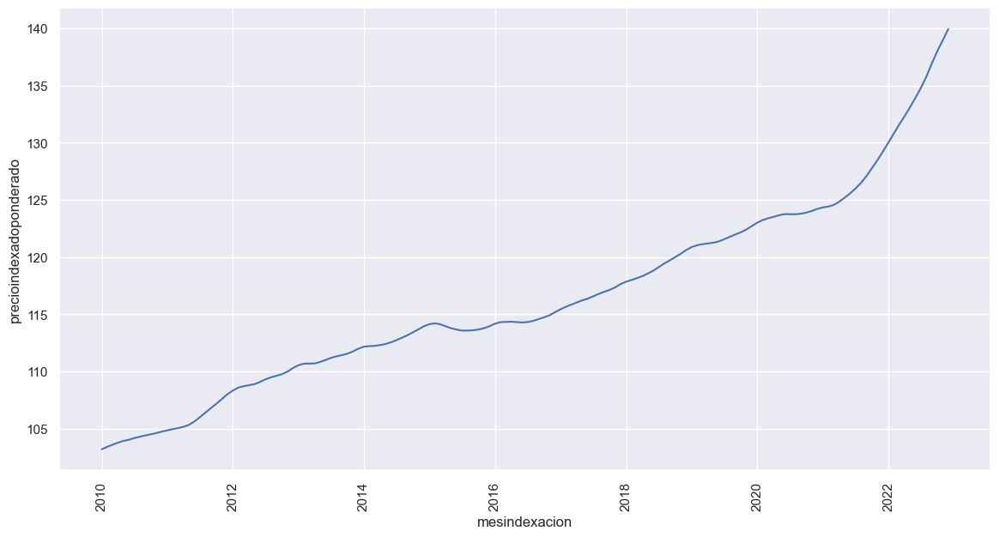

In [269]:
#prueba.plot.scatter(x='mesindexacion', y='precioindexadoponderado')

#plt.plot(prueba['fechaactual'], prueba['precioindexadoponderado'], color='#a12424', linestyle='--', marker='o')

a=sns.lineplot(x = prueba['mesindexacion'], y = prueba['precioindexadoponderado'])

a.tick_params(axis='x', rotation=90)

In [270]:
ejemplo=prueba[['unique_id','mesindexacion','precioindexadoponderado']]

In [271]:
from statsmodels.tsa.seasonal import seasonal_decompose
from dateutil.parser import parse

In [272]:
import datetime

1


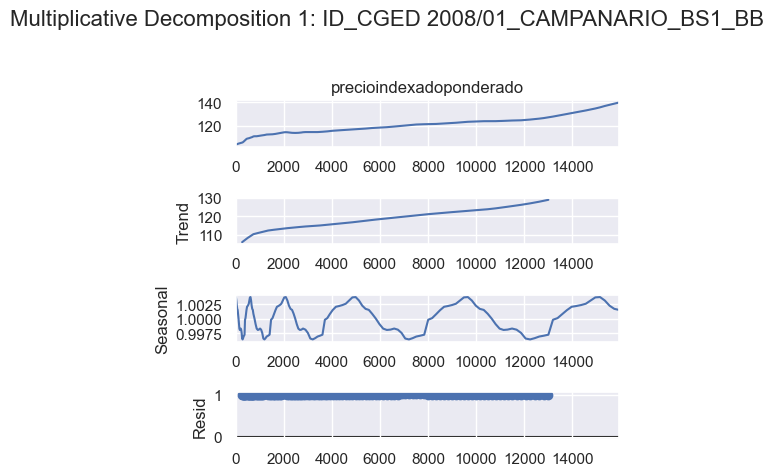

2


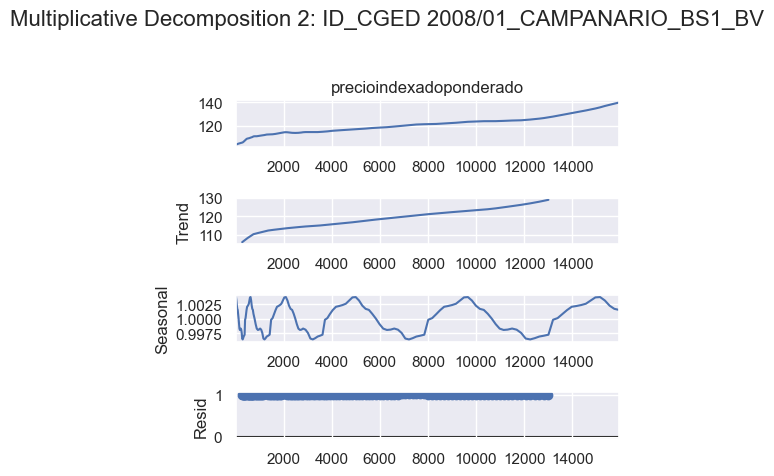

3


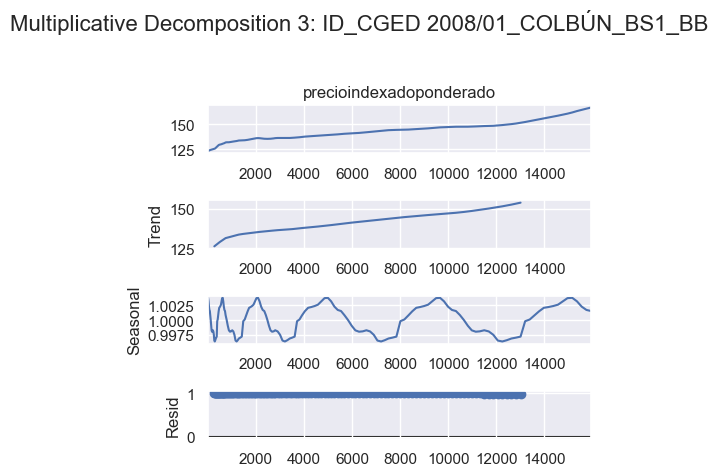

4


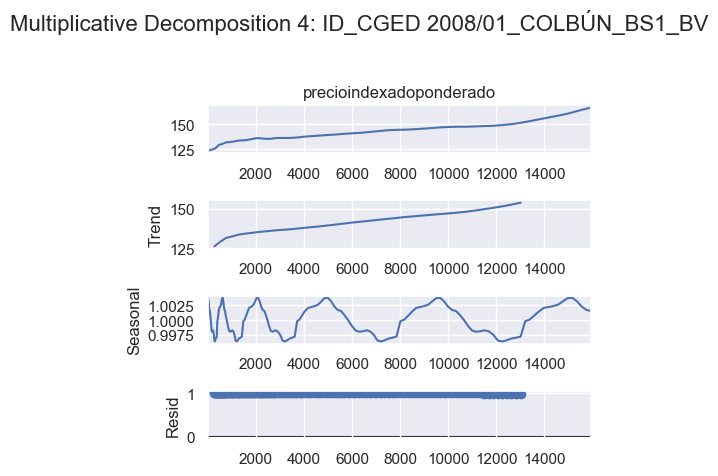

5


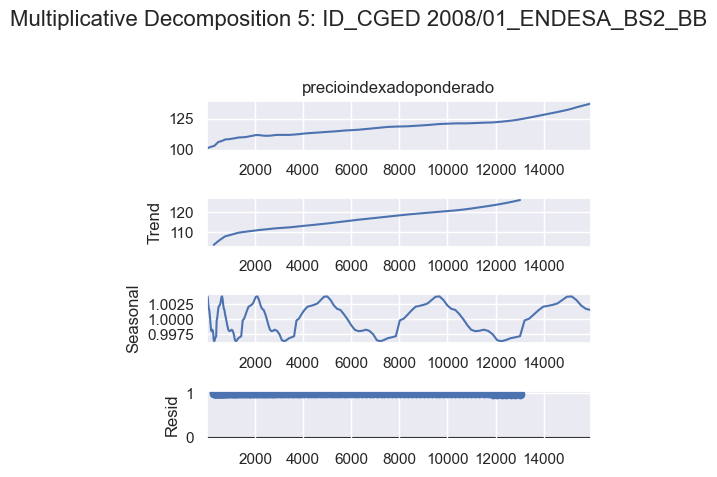

6


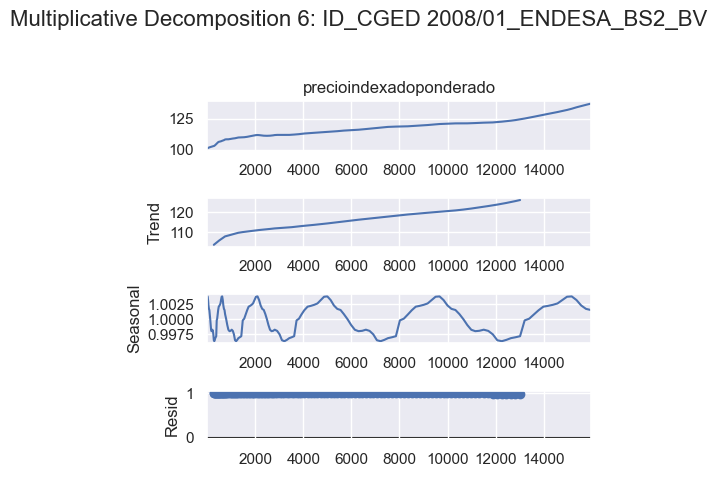

7


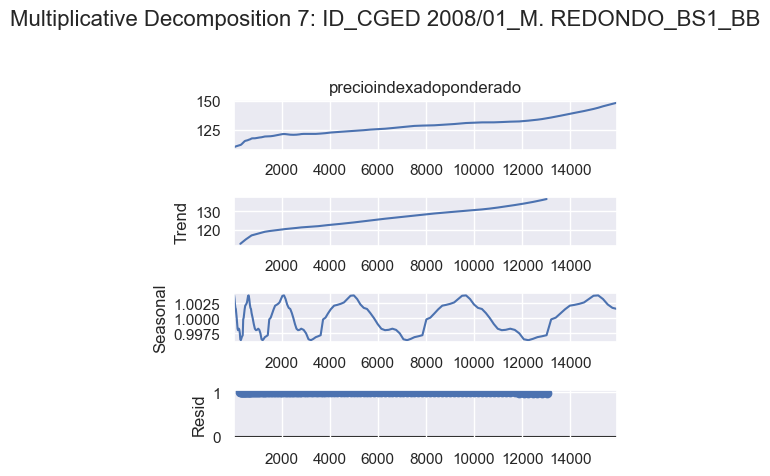

8


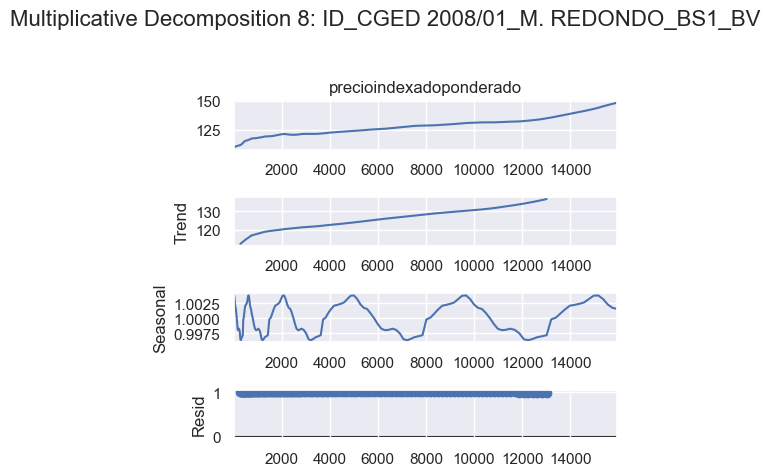

9


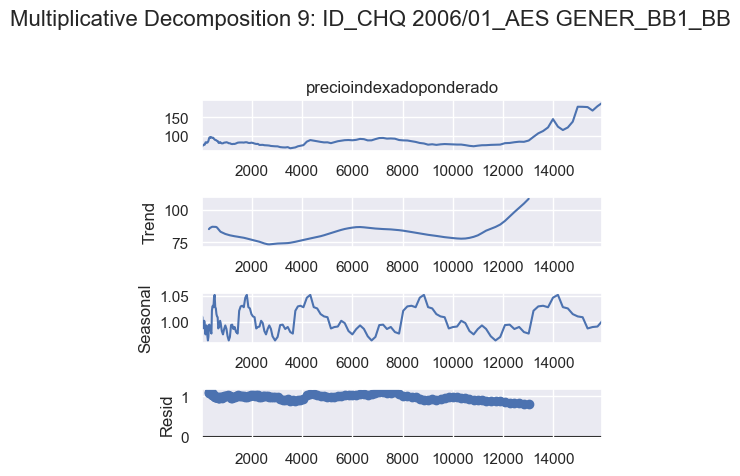

10


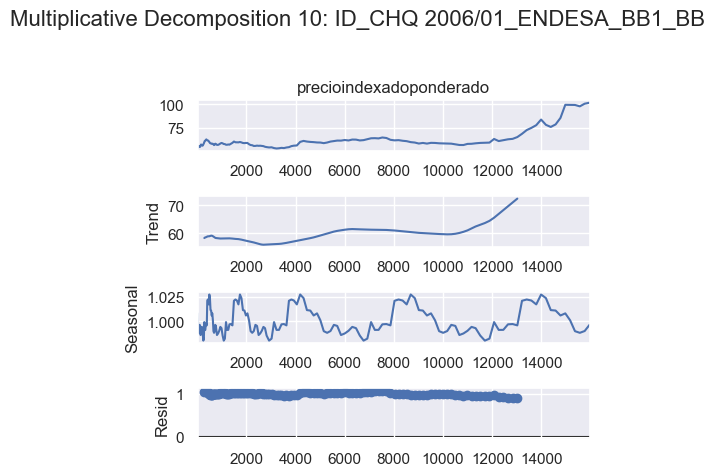

11


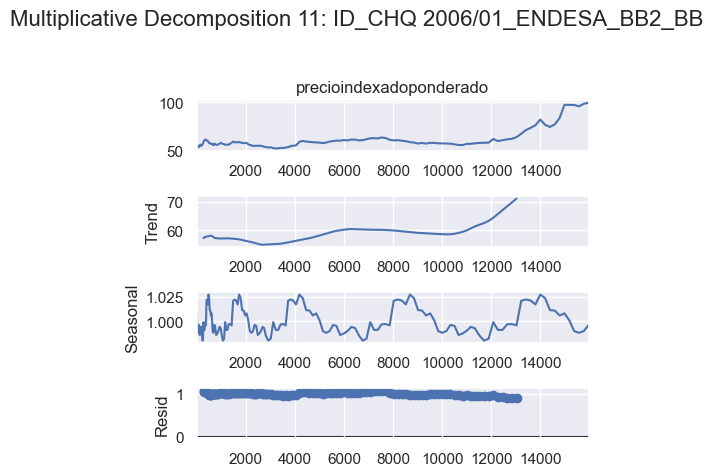

12


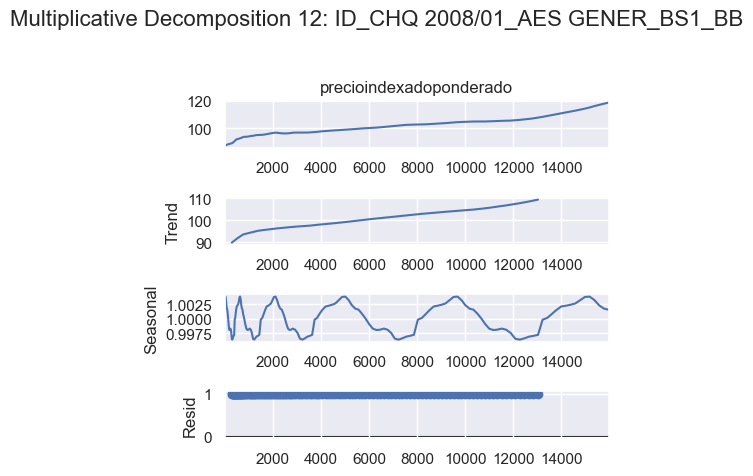

13


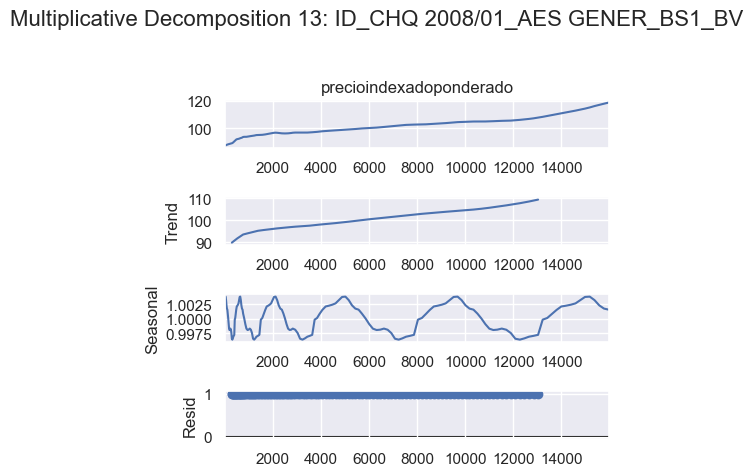

14


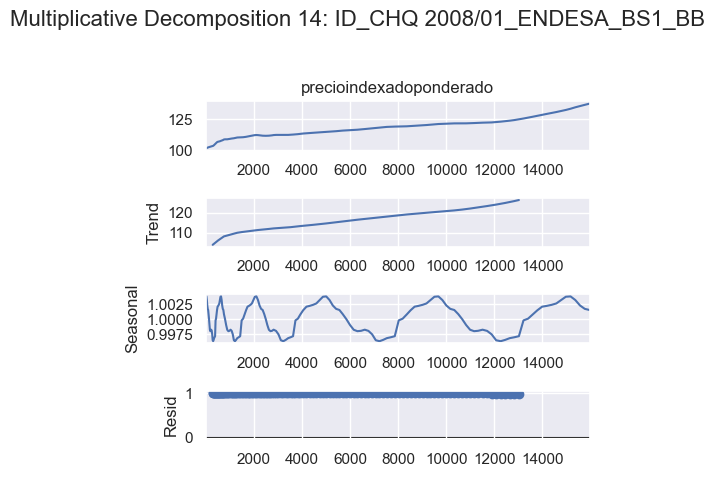

15


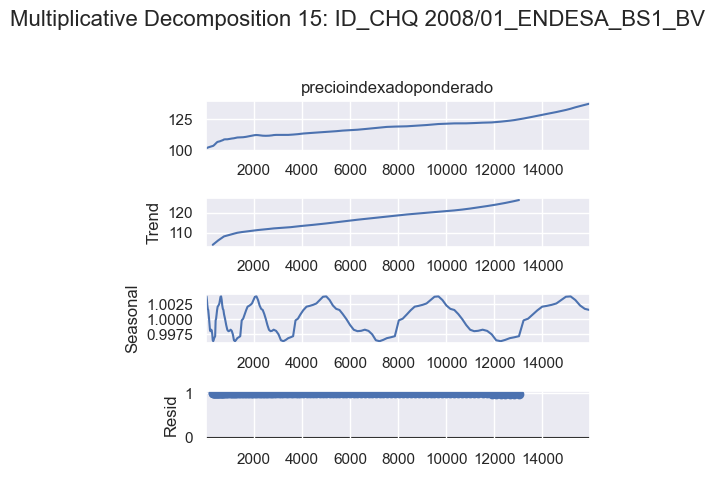

16


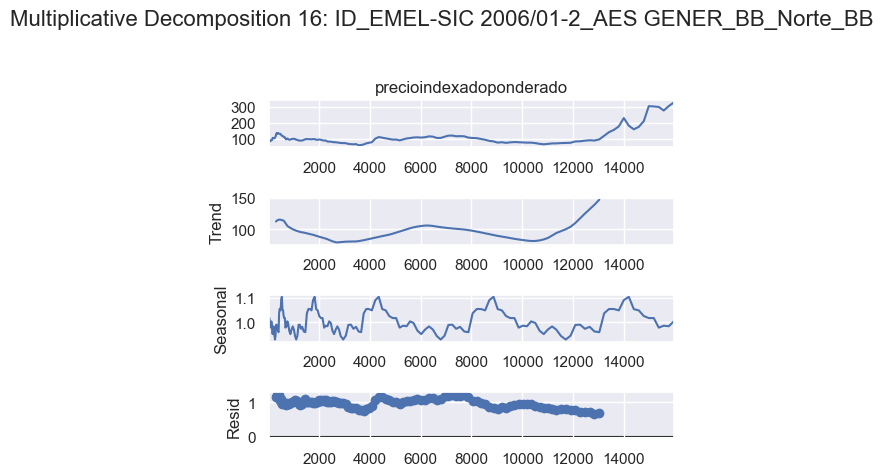

17


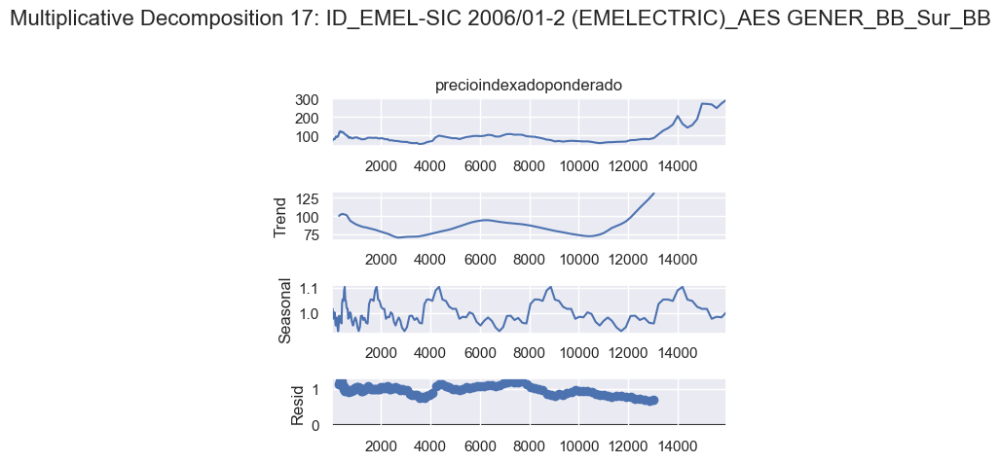

18


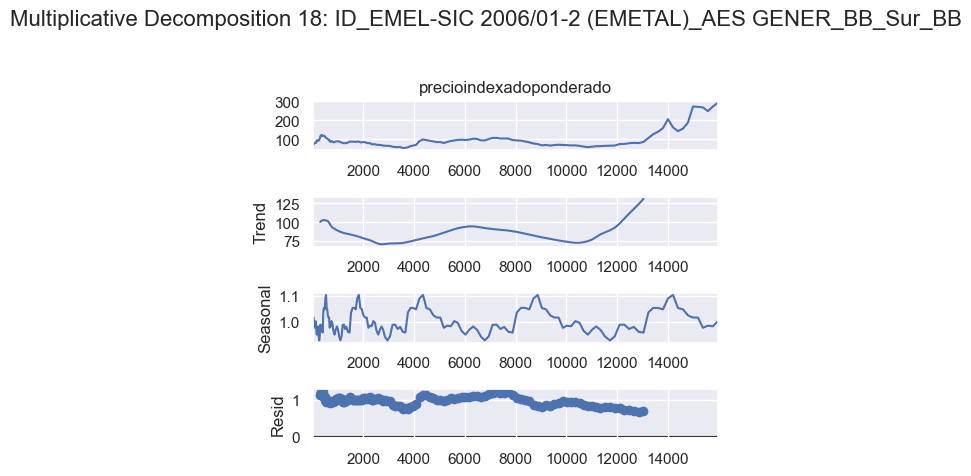

19


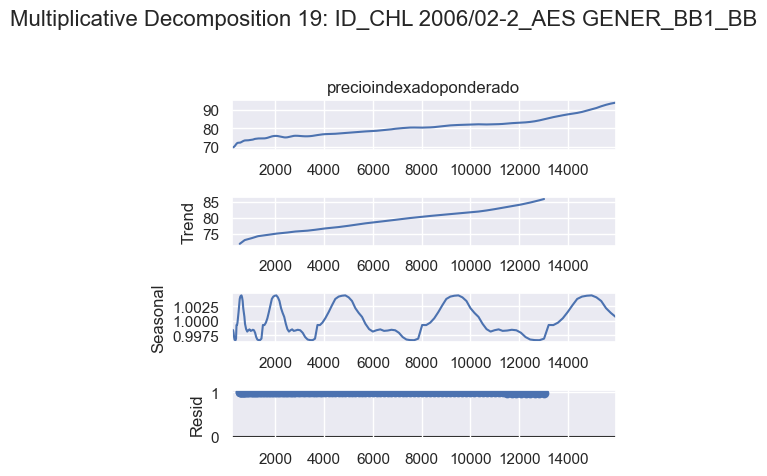

20


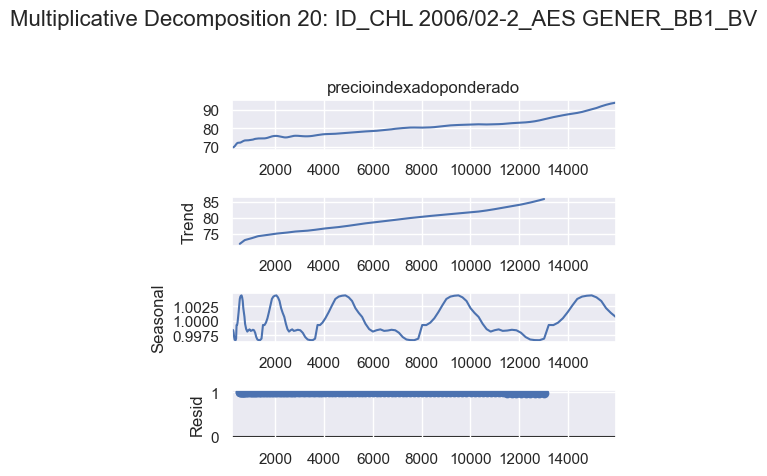

21


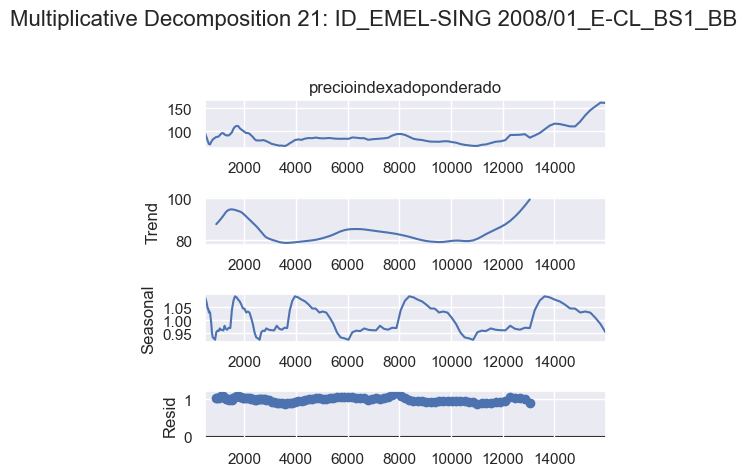

22


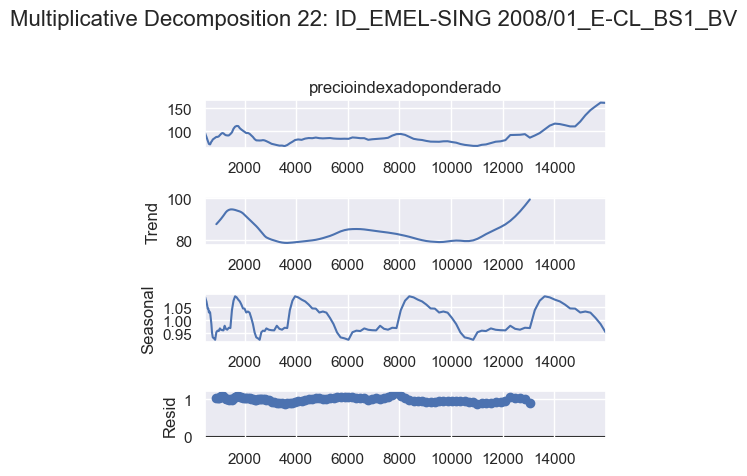

23


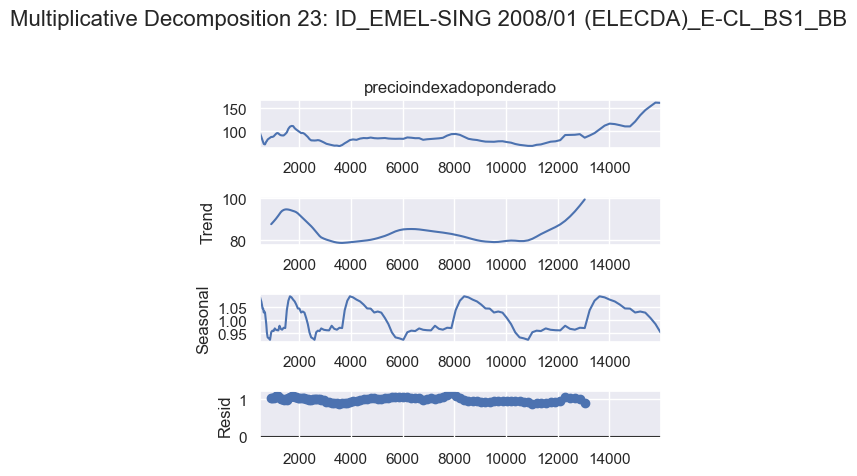

24


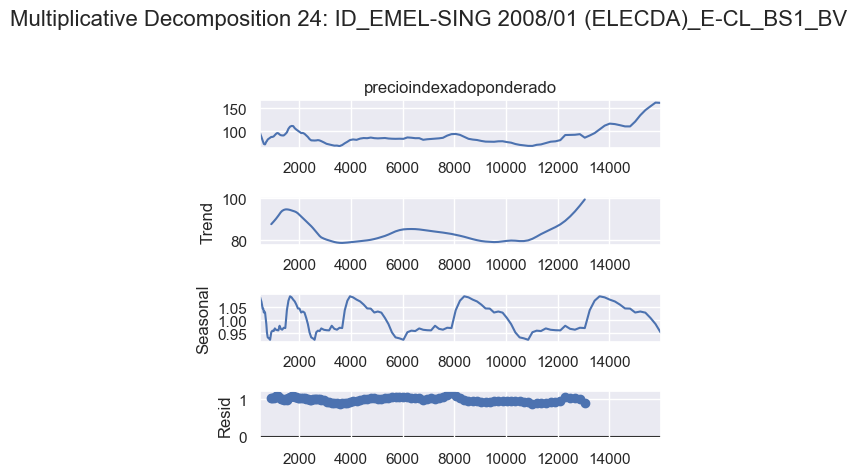

25


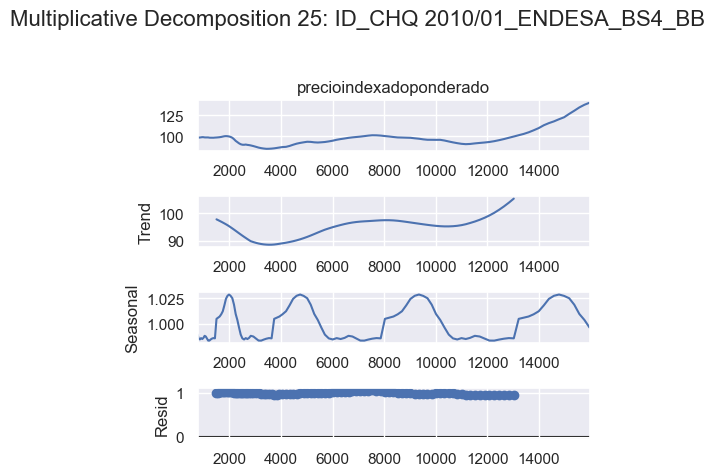

26


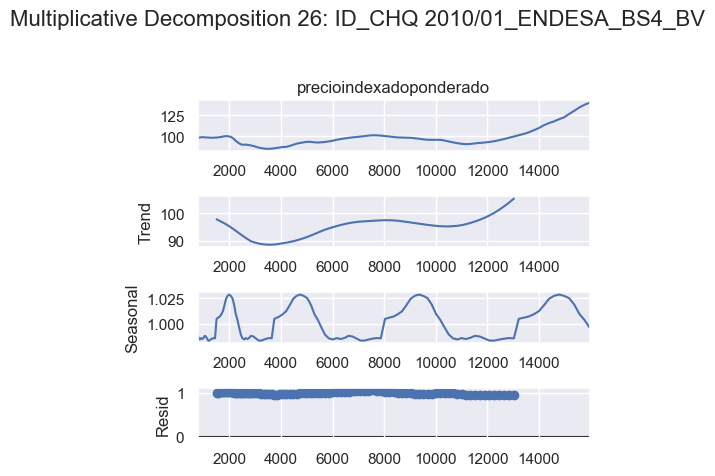

27


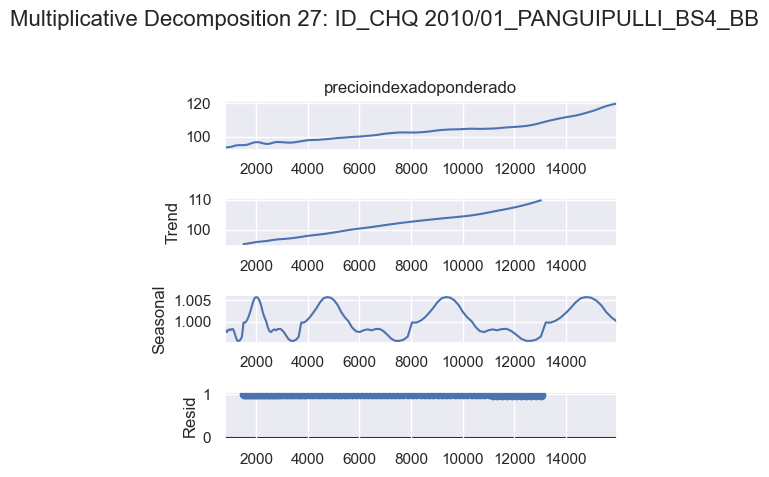

28


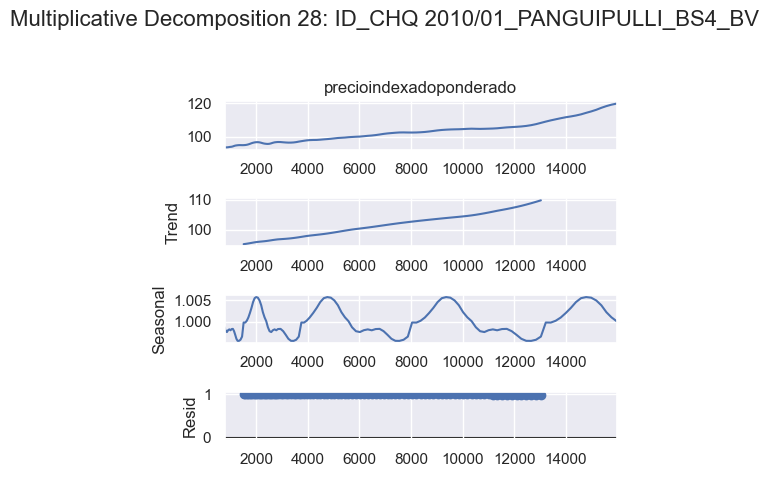

29


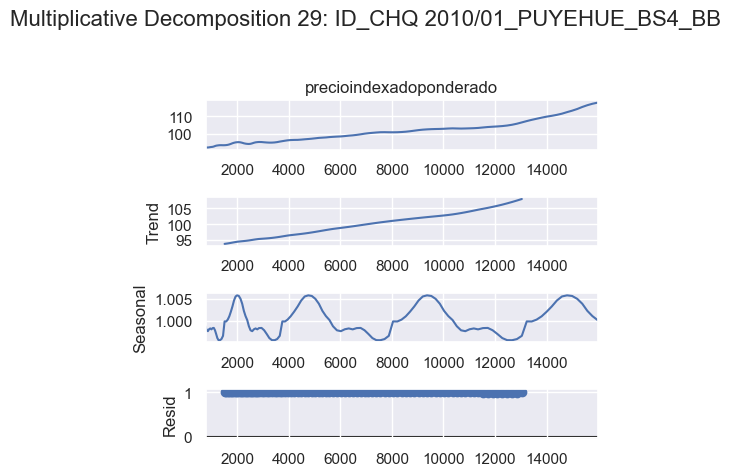

30


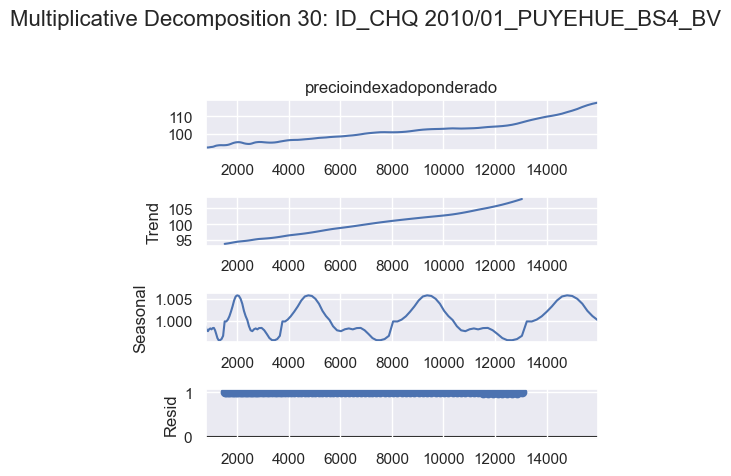

31


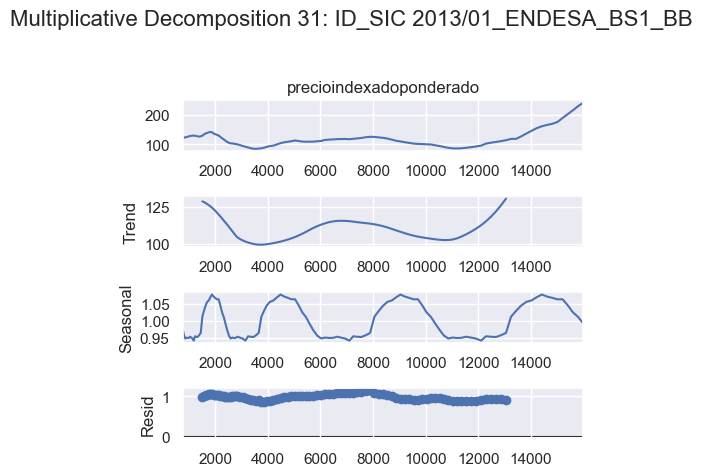

32


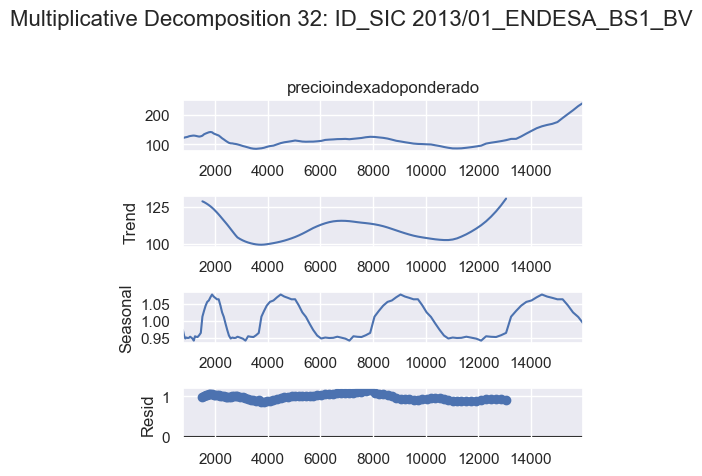

33


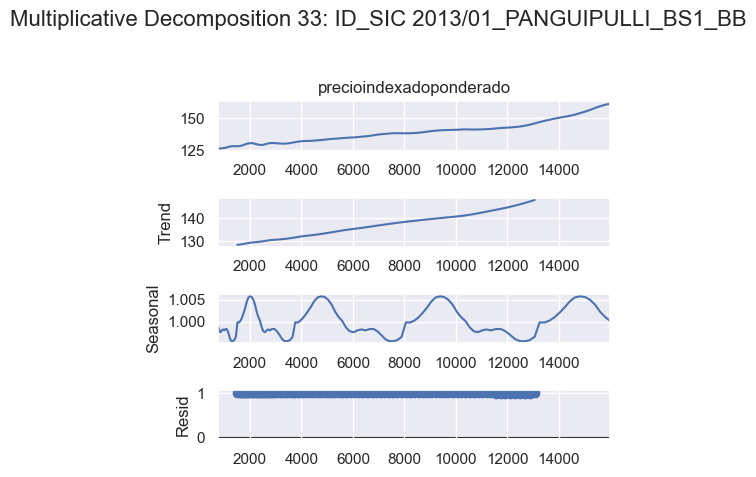

34


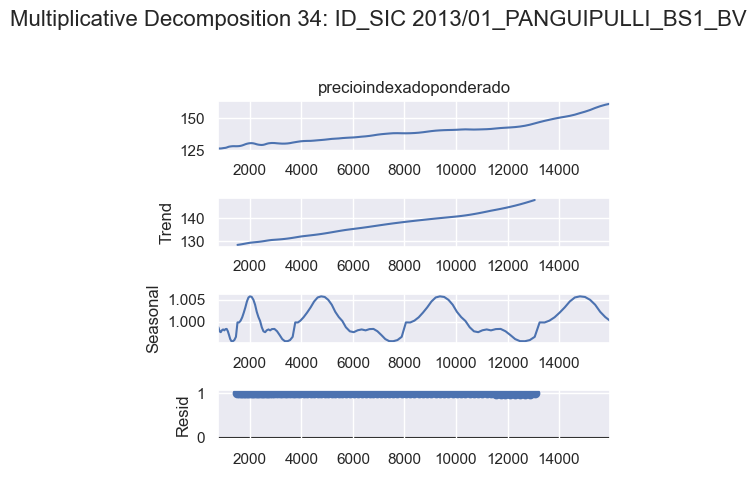

35


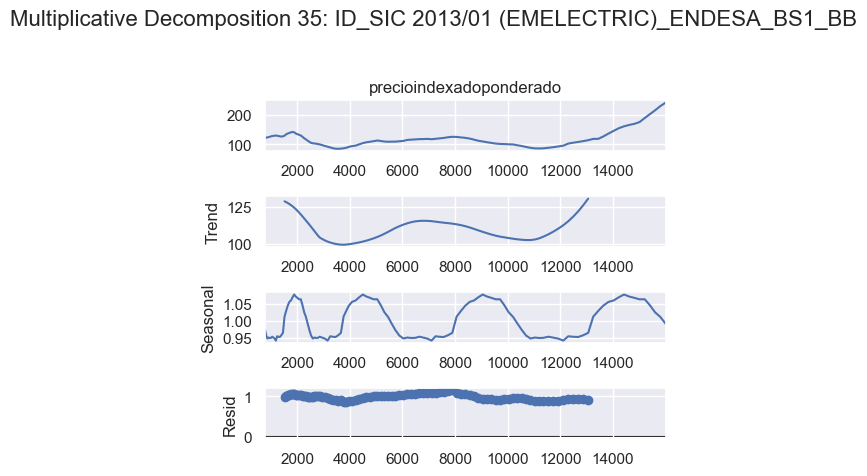

36


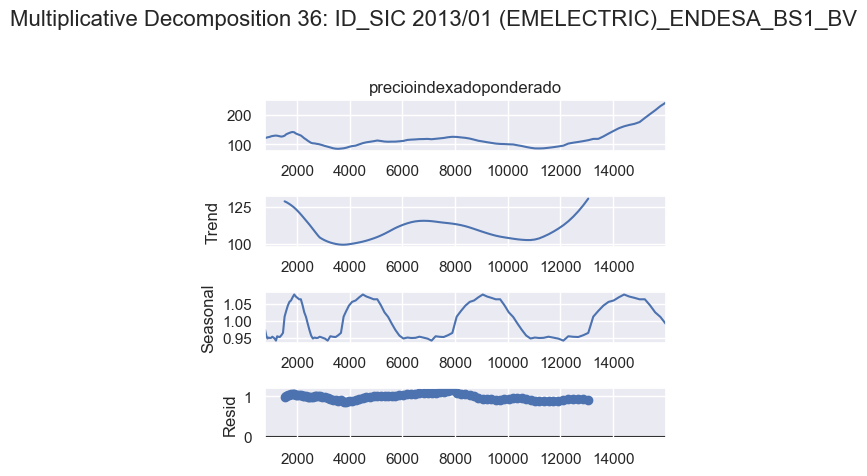

37


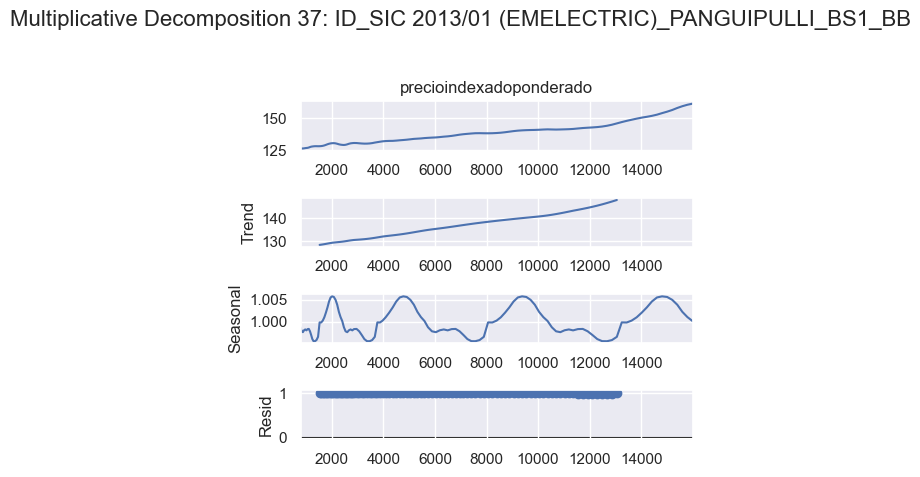

38


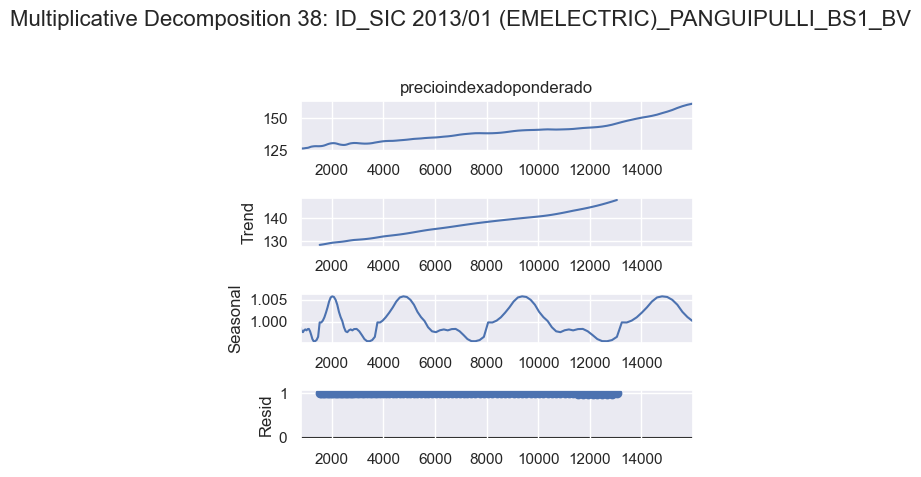

39


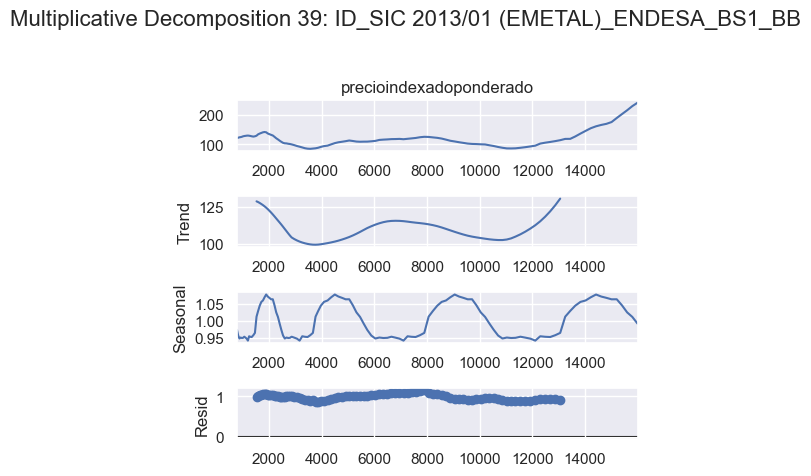

40


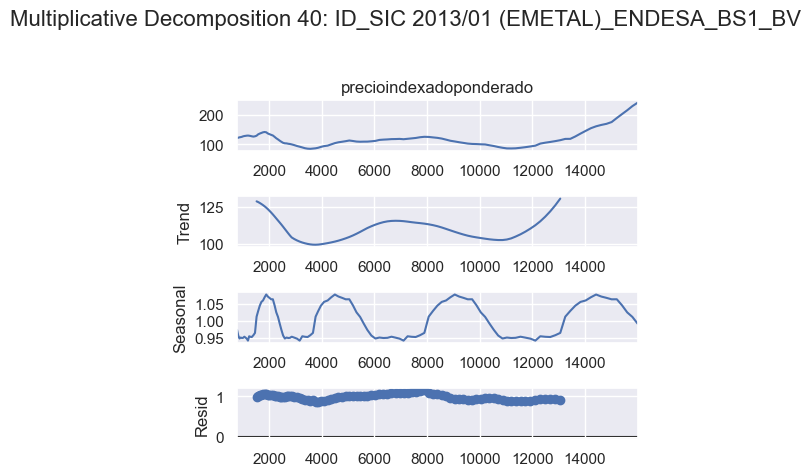

41


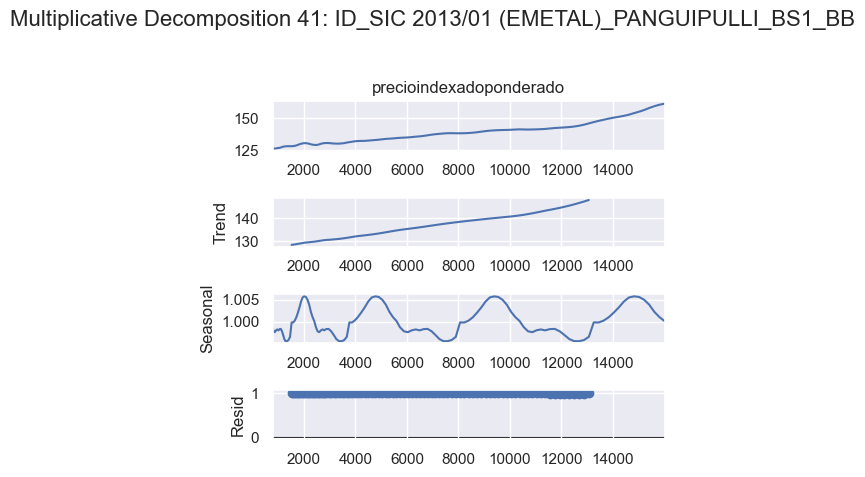

42


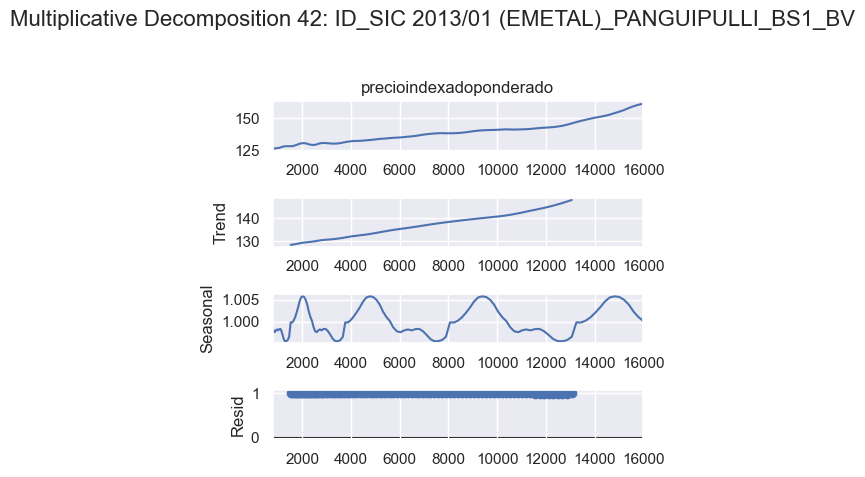

43


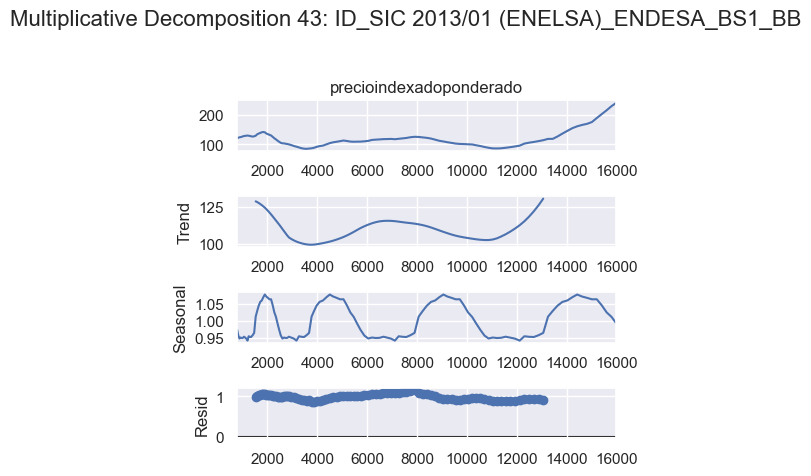

44


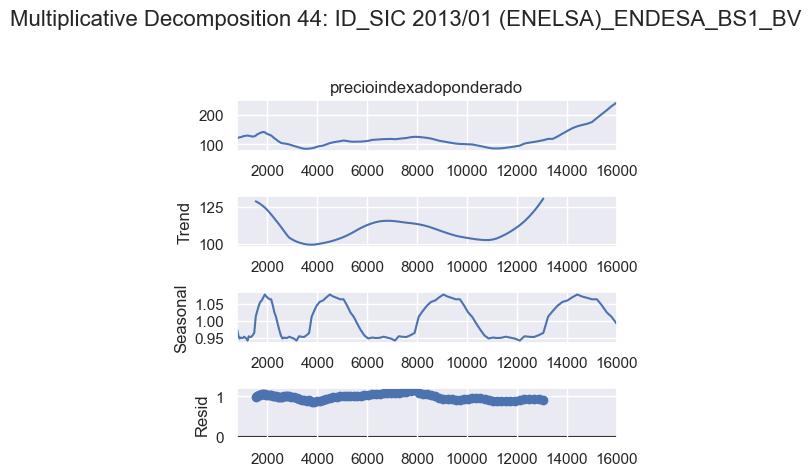

45


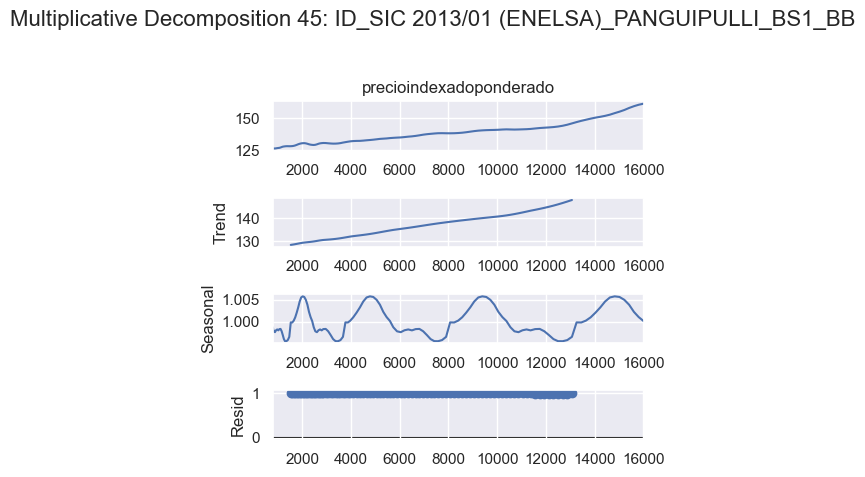

46


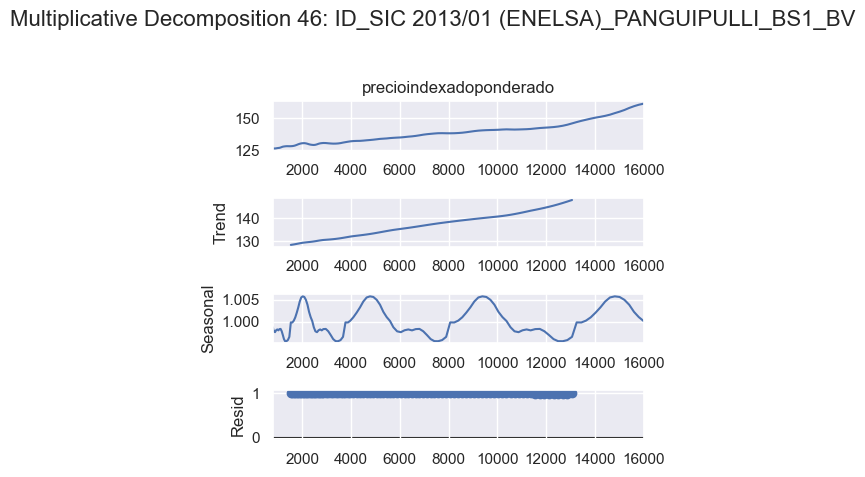

47


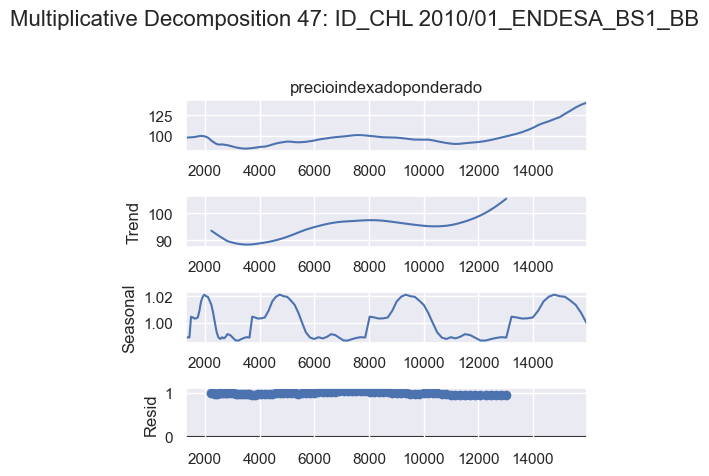

48


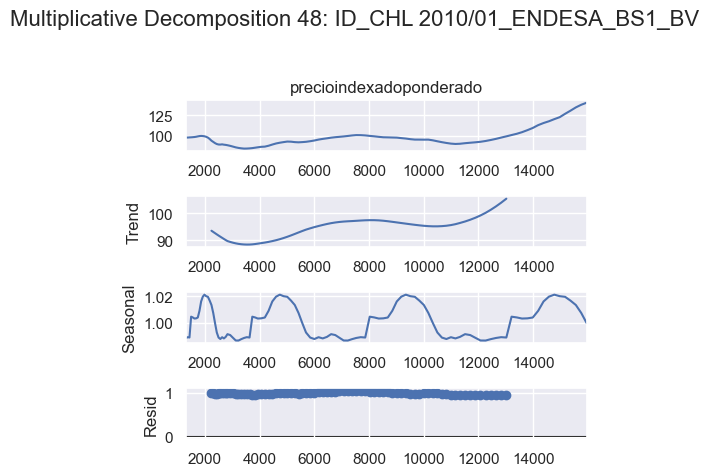

49


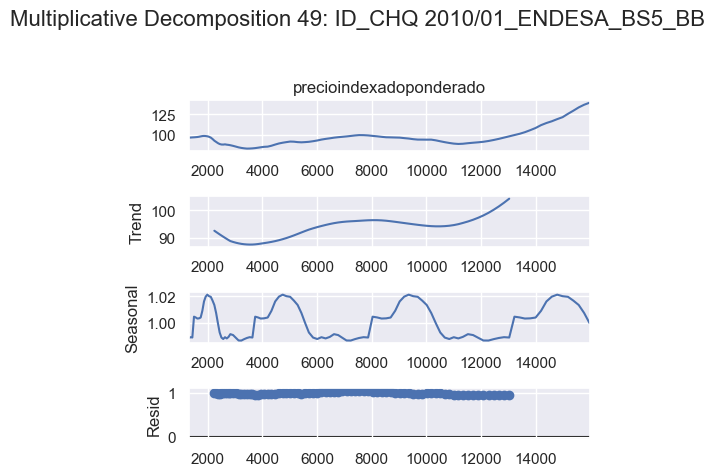

50


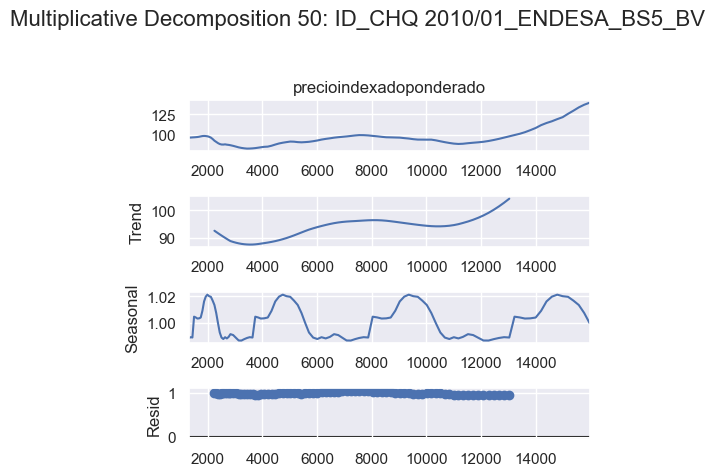

51


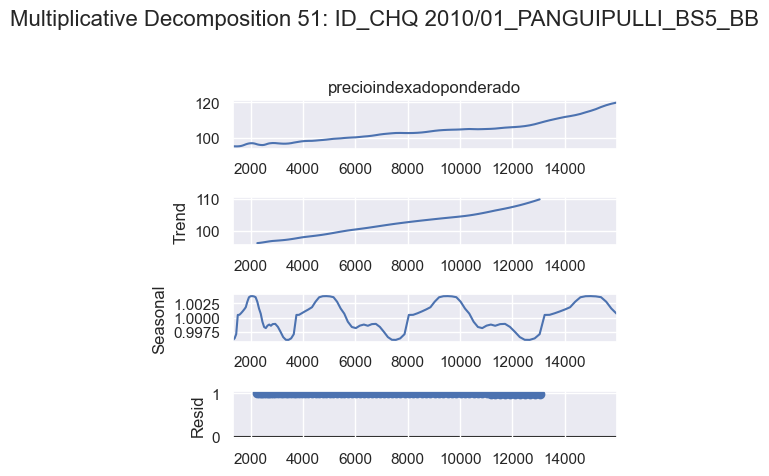

52


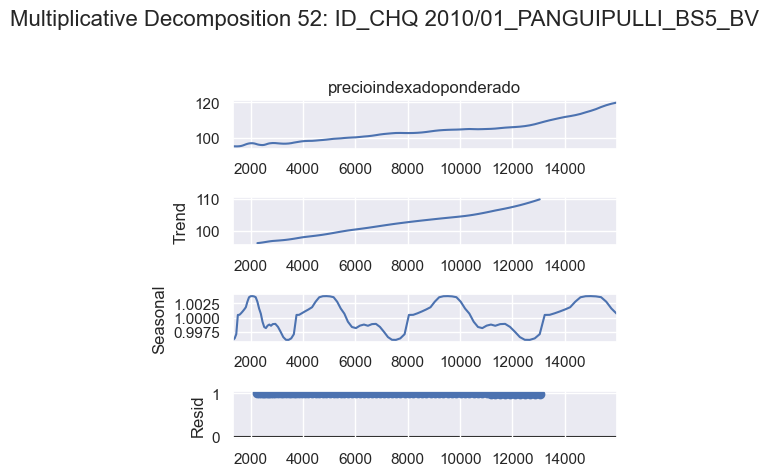

53


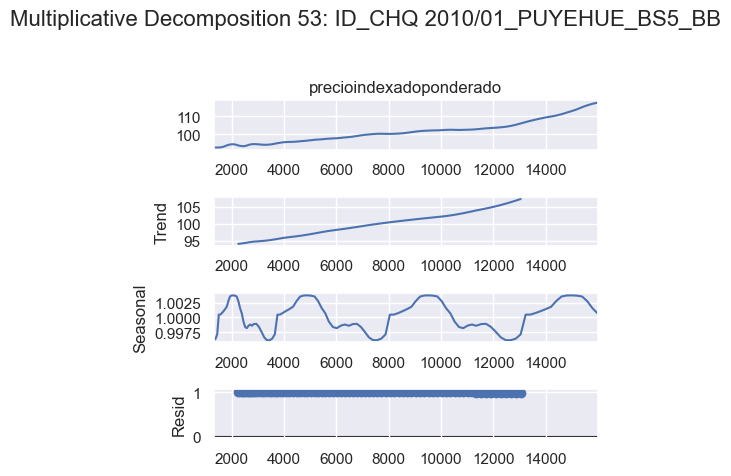

54


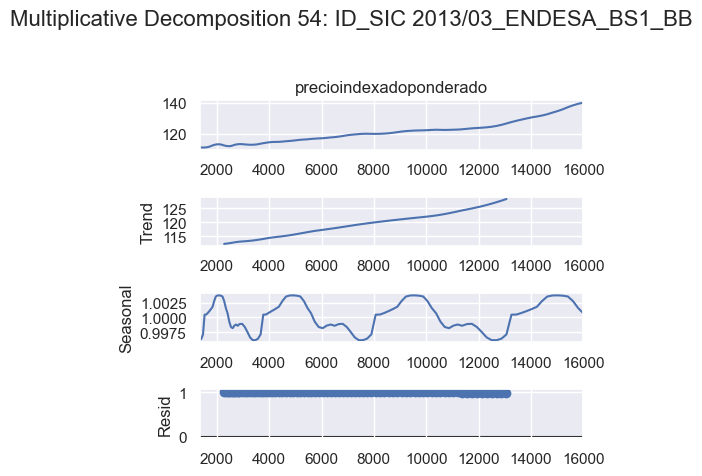

55


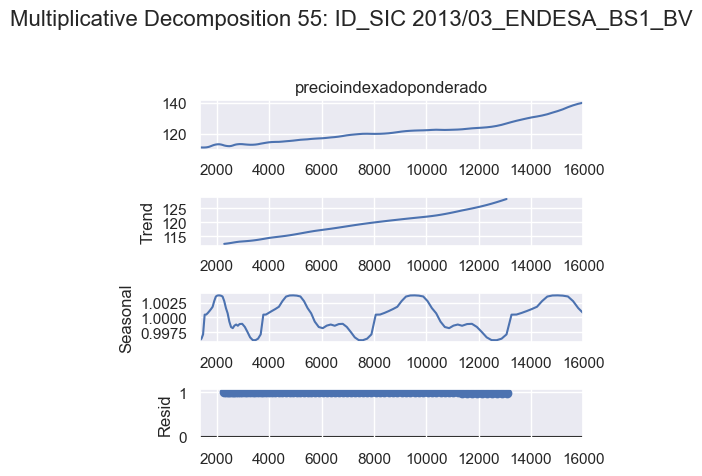

56


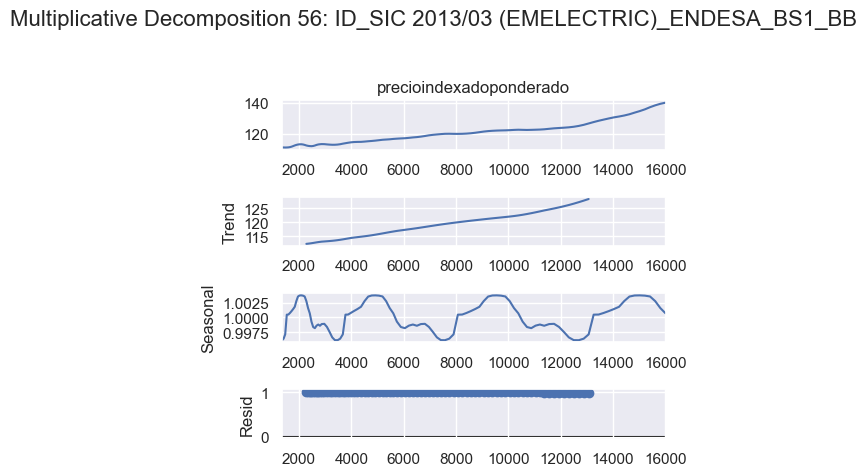

57


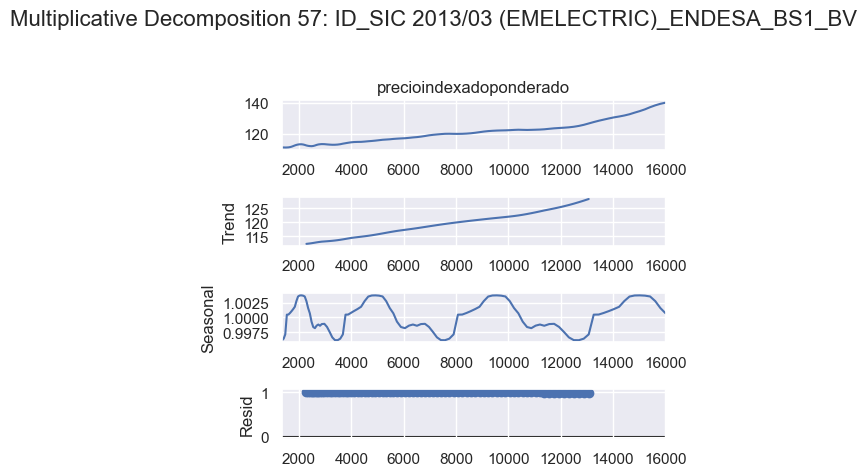

58


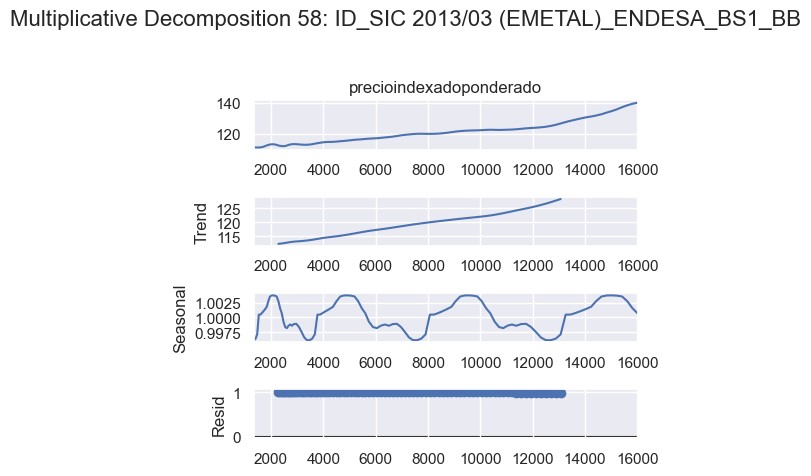

59


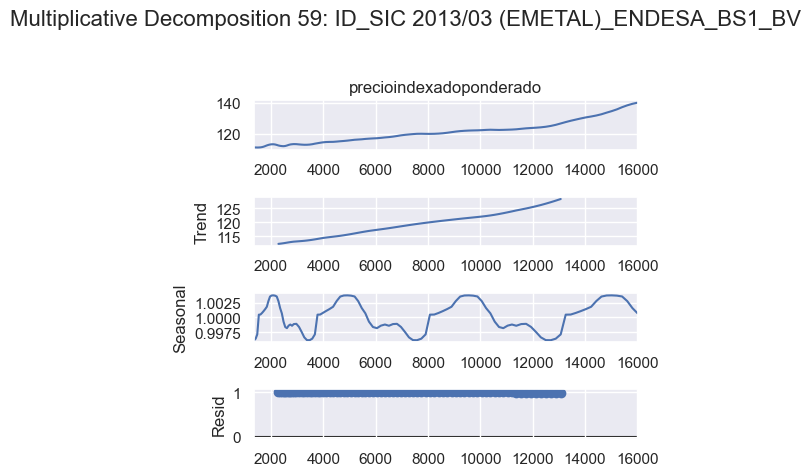

60


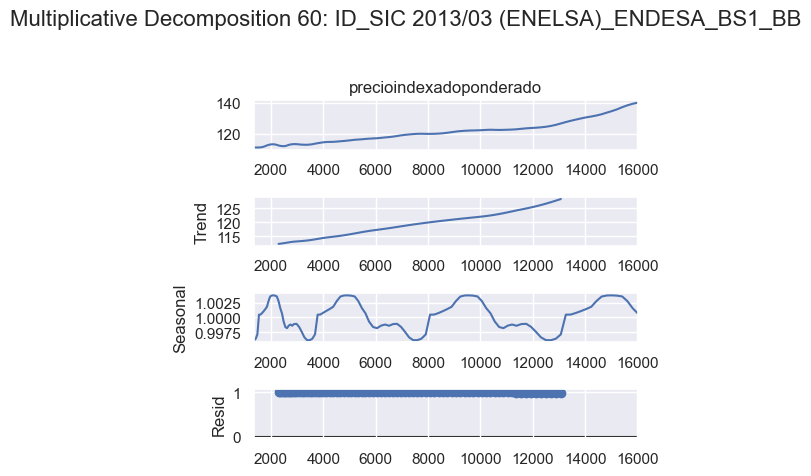

61


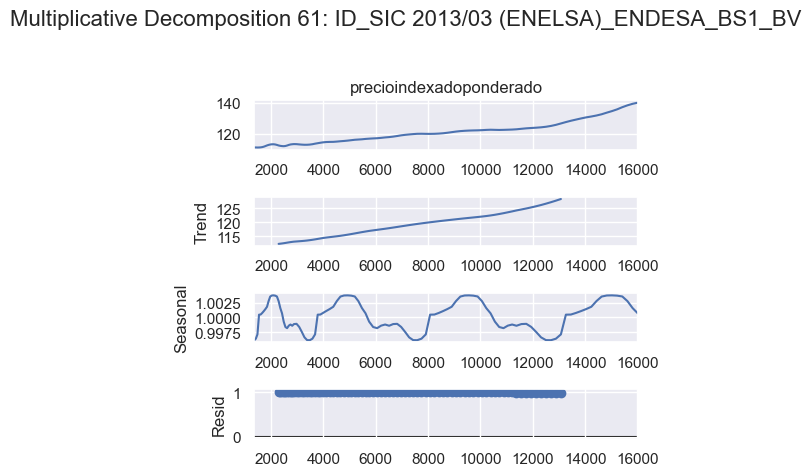

62


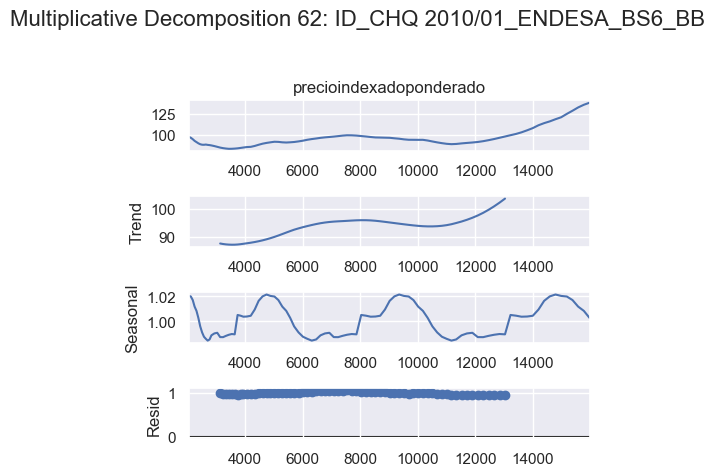

63


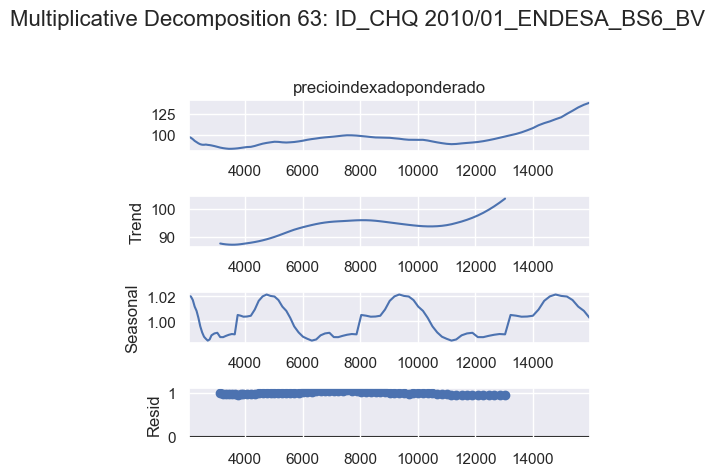

64


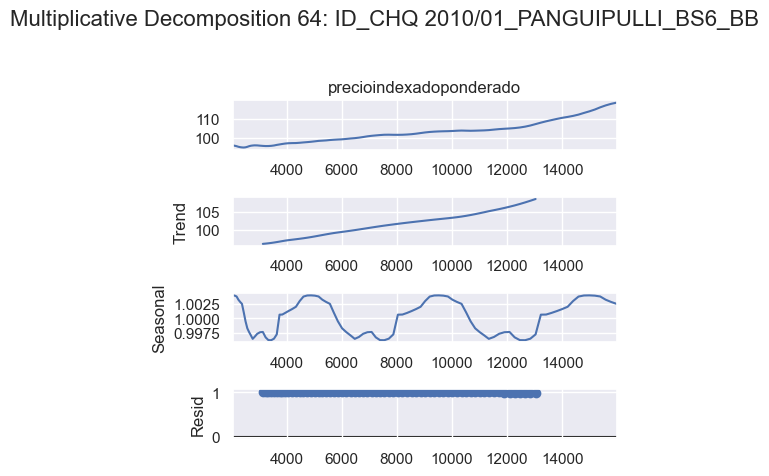

65


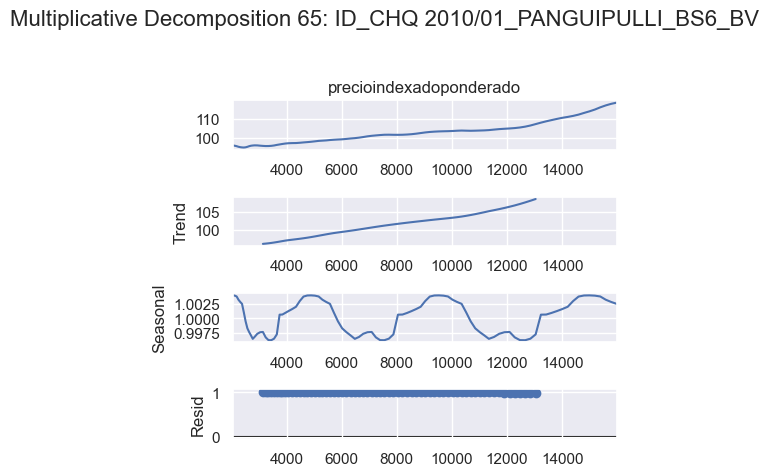

66


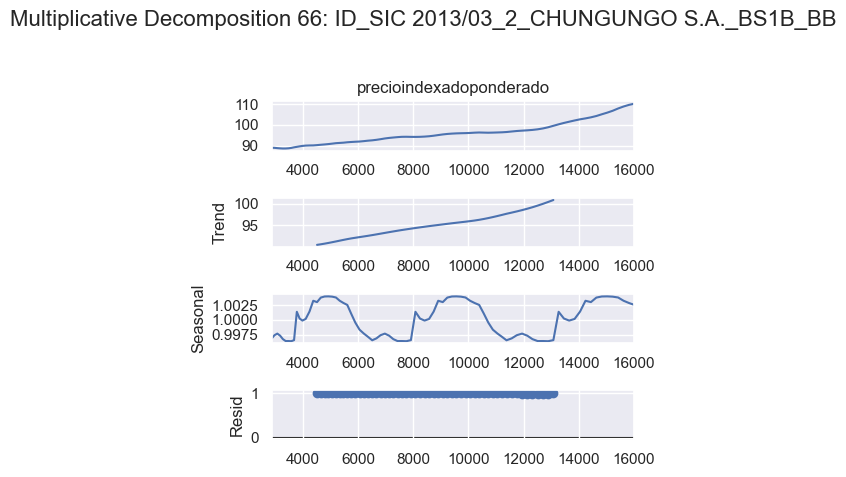

67


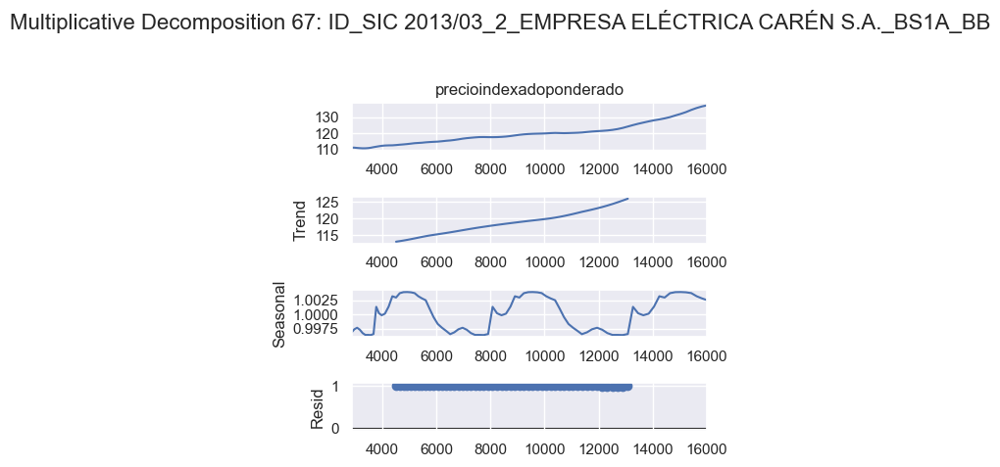

68


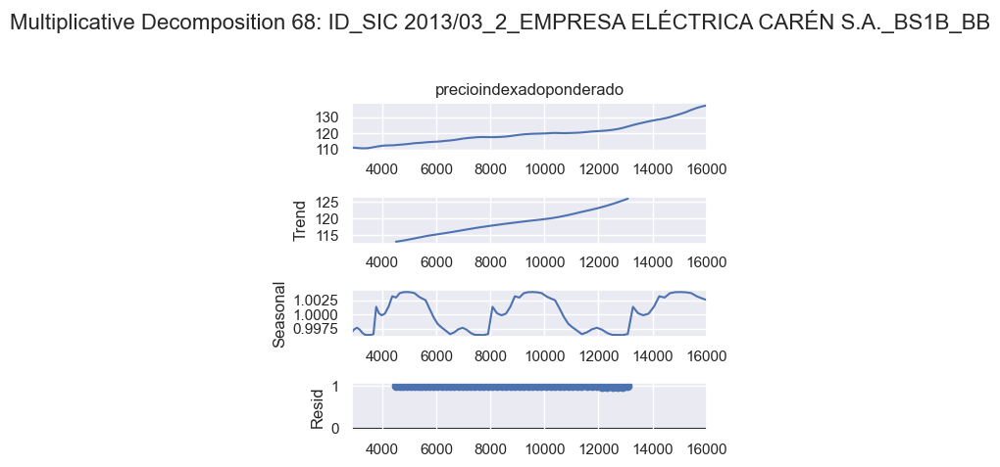

69


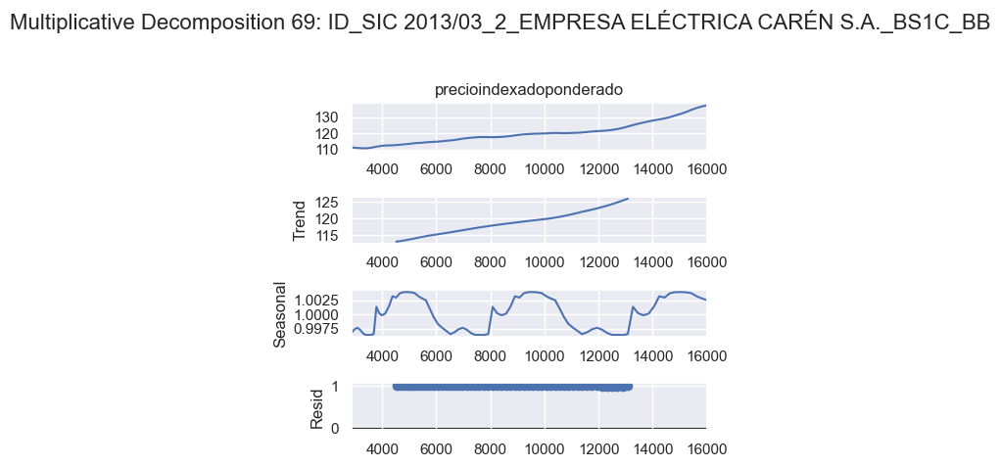

70


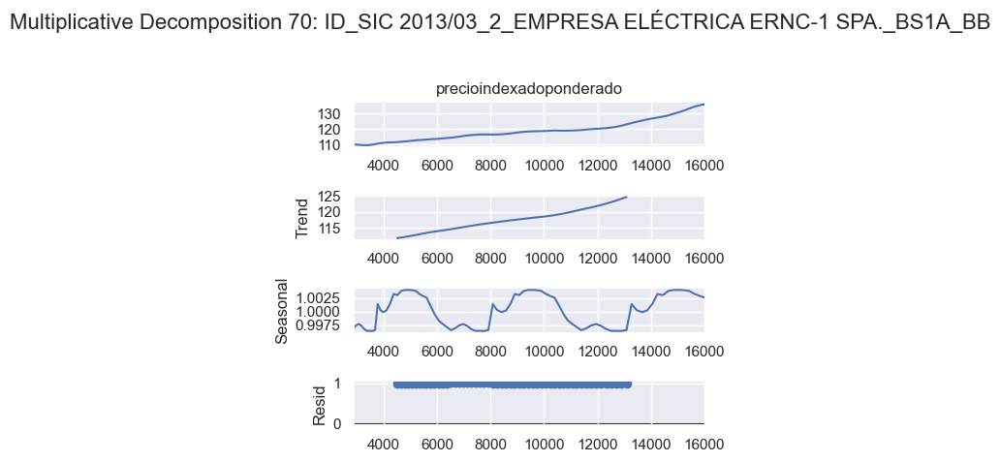

71


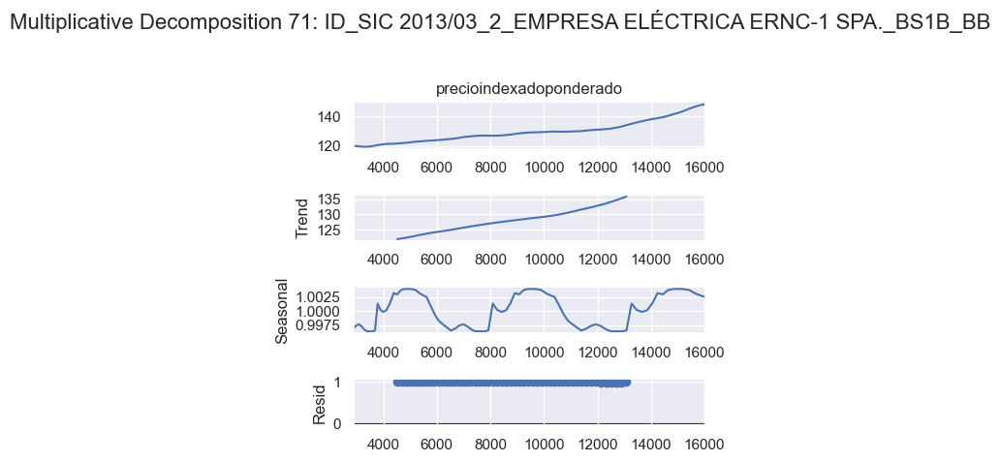

72


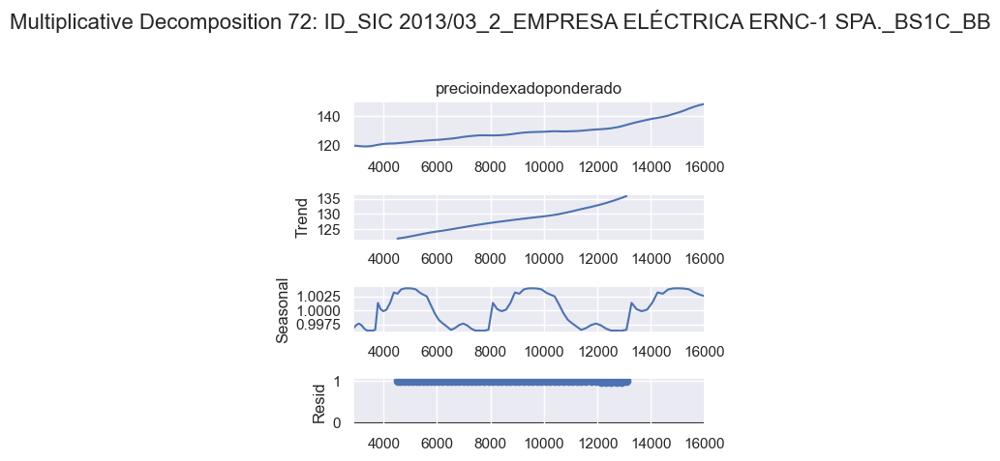

73


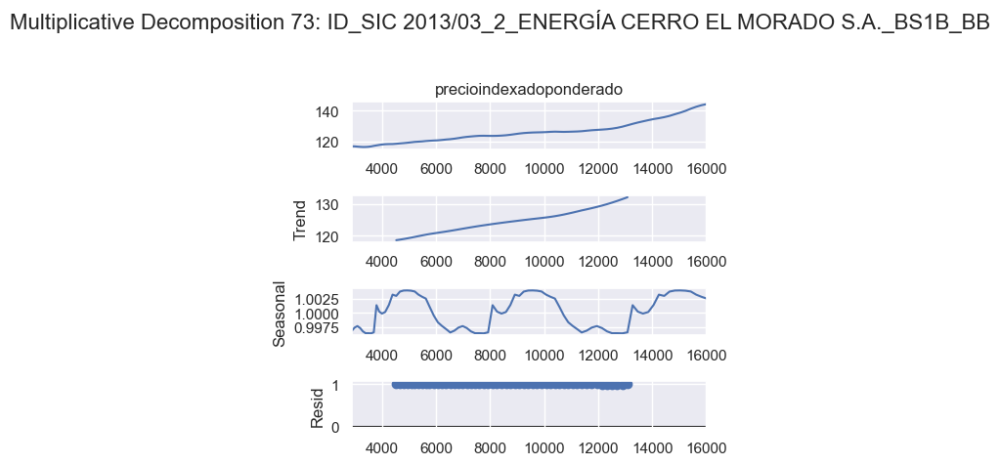

74


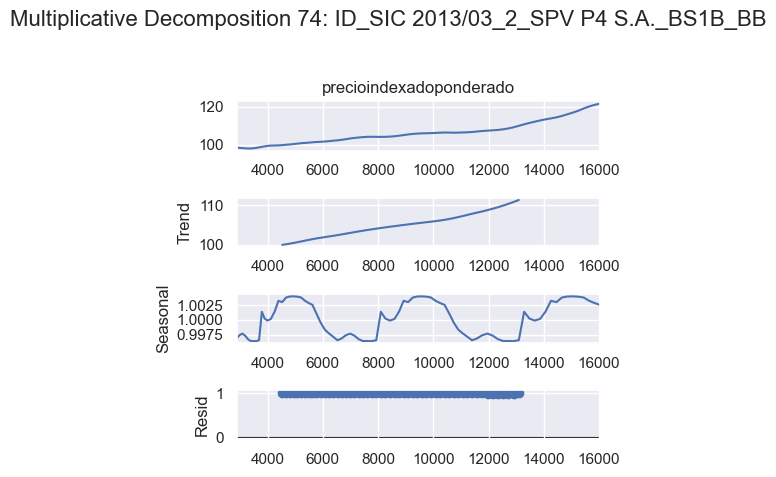

75


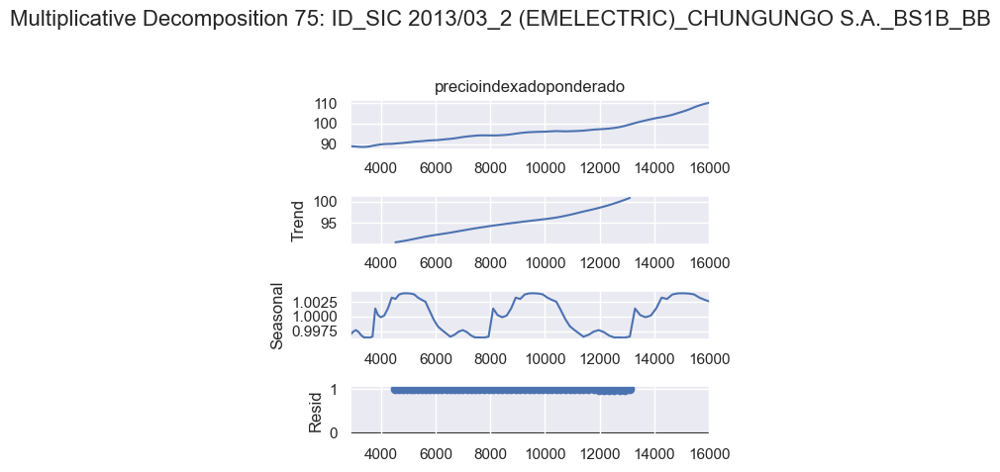

76


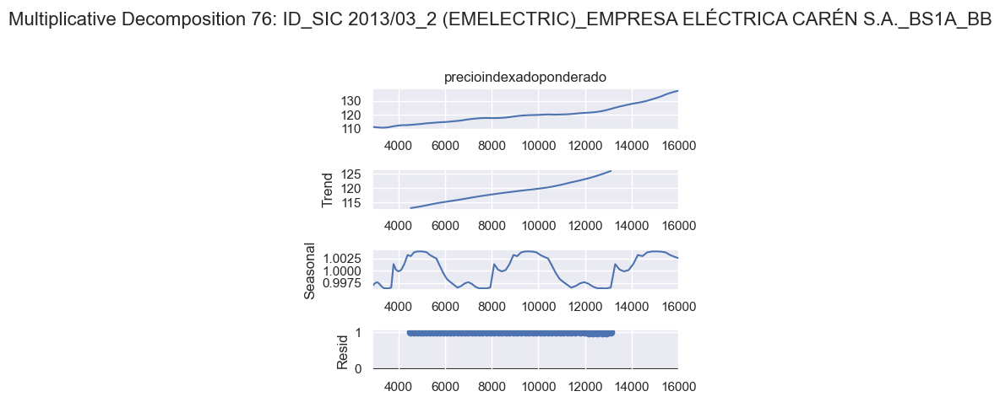

77


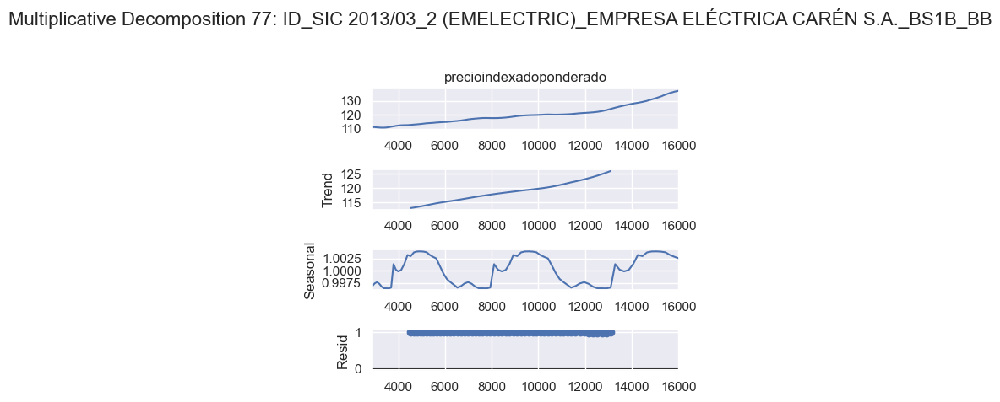

78


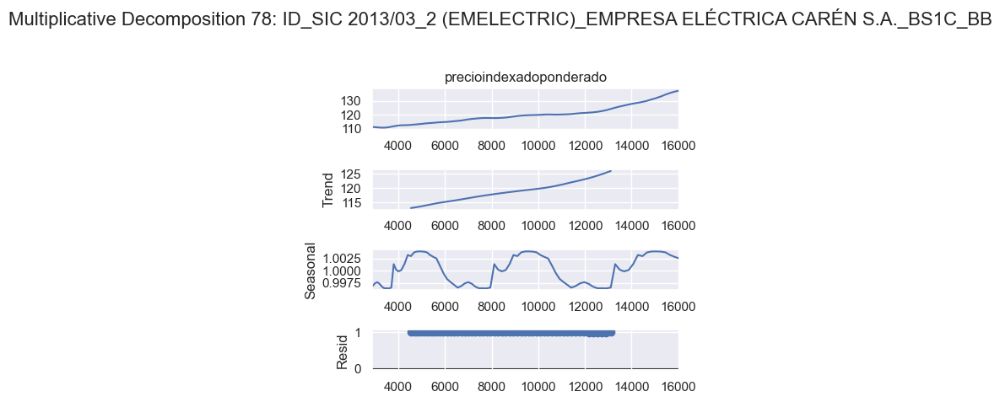

79


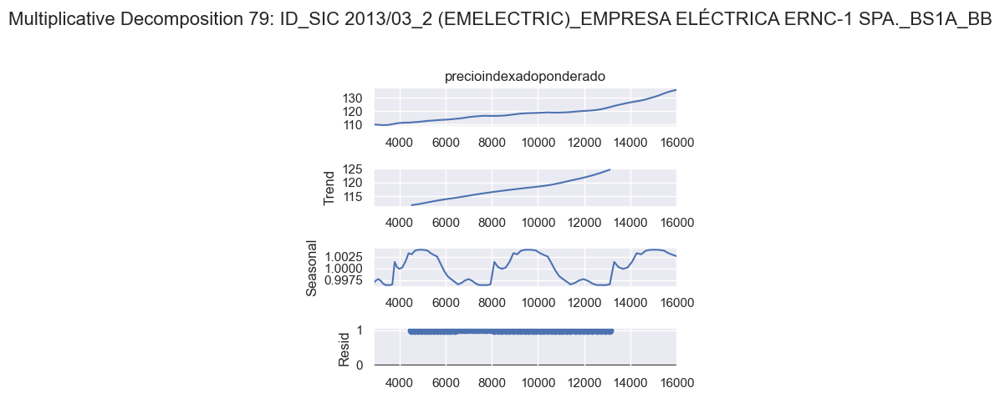

80


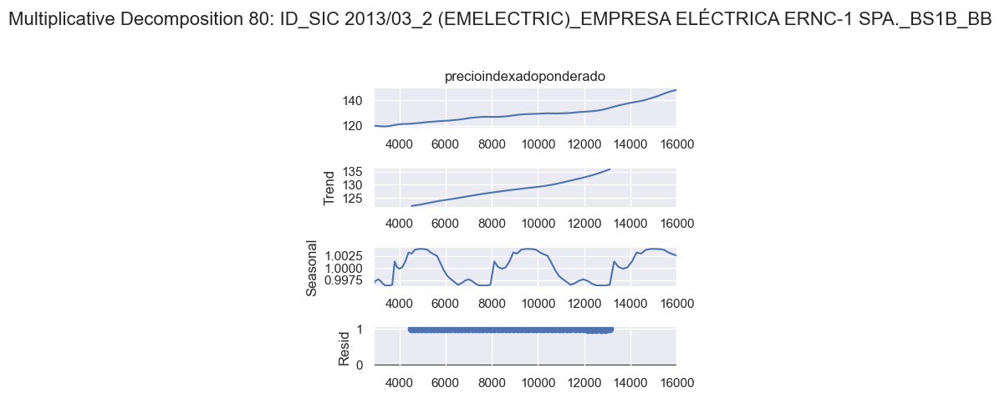

81


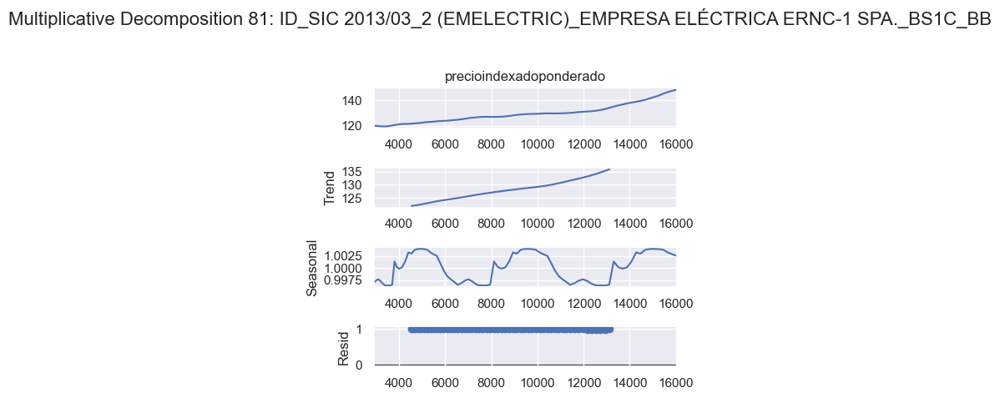

82


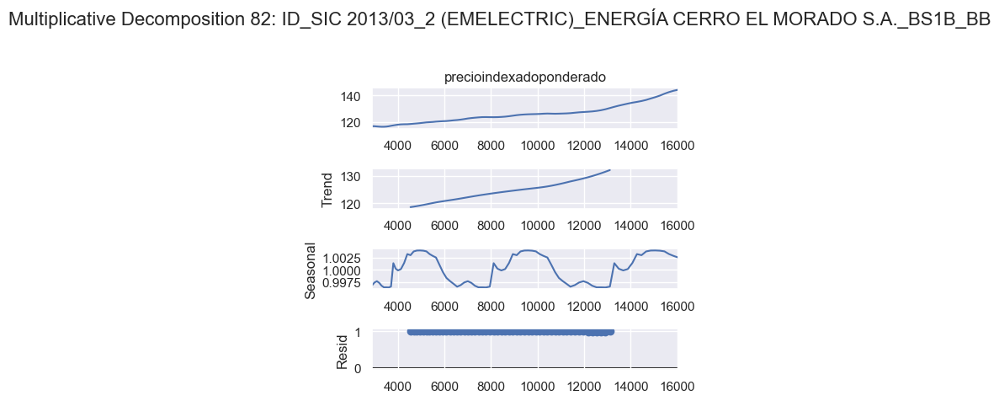

83


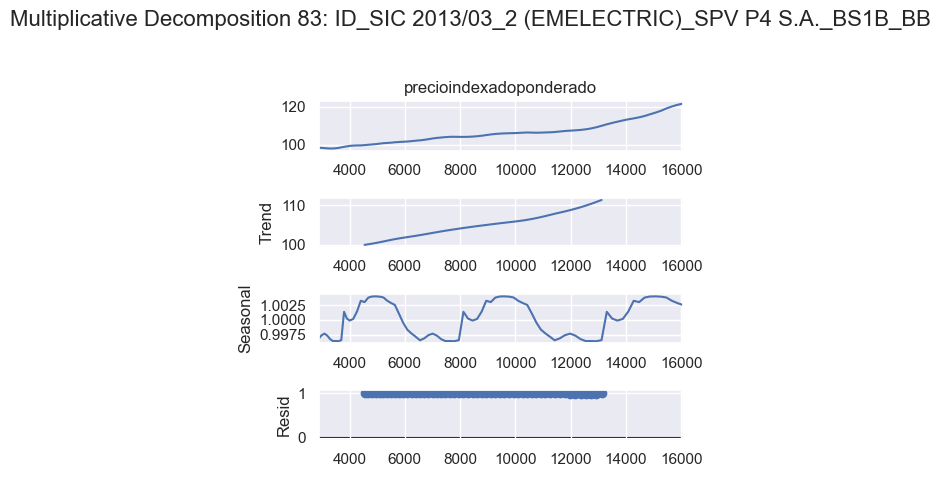

84


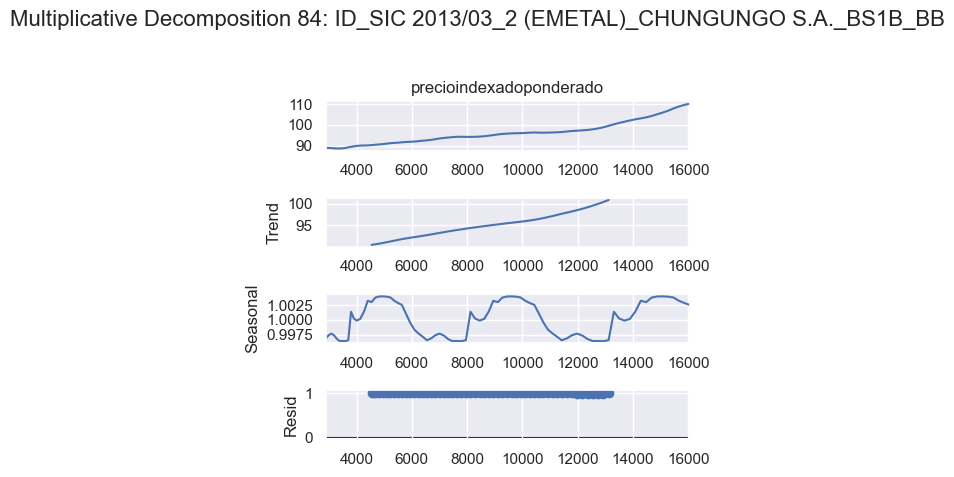

85


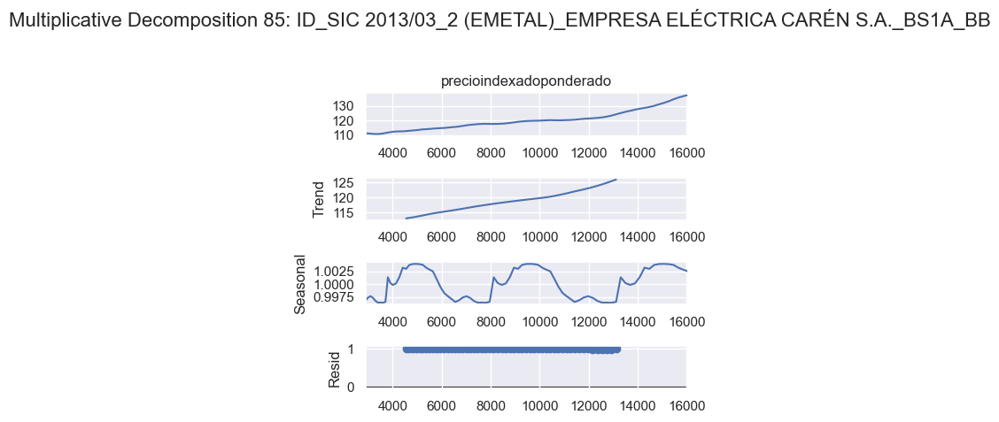

86


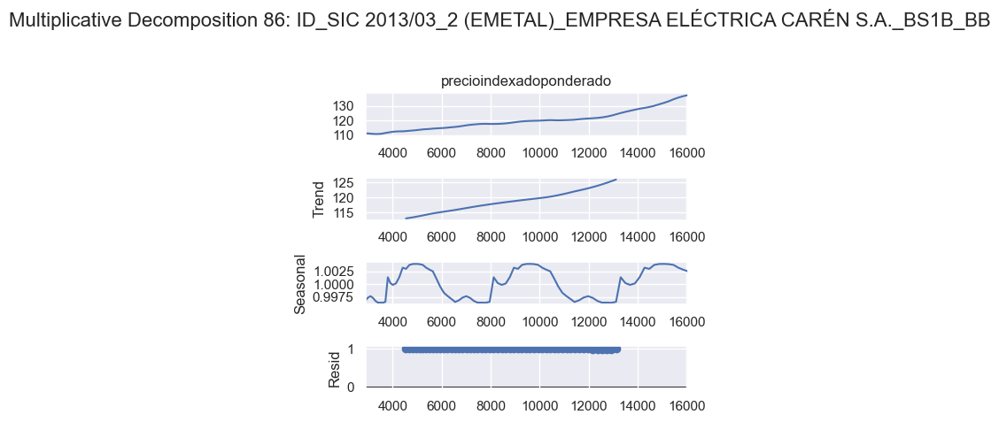

87


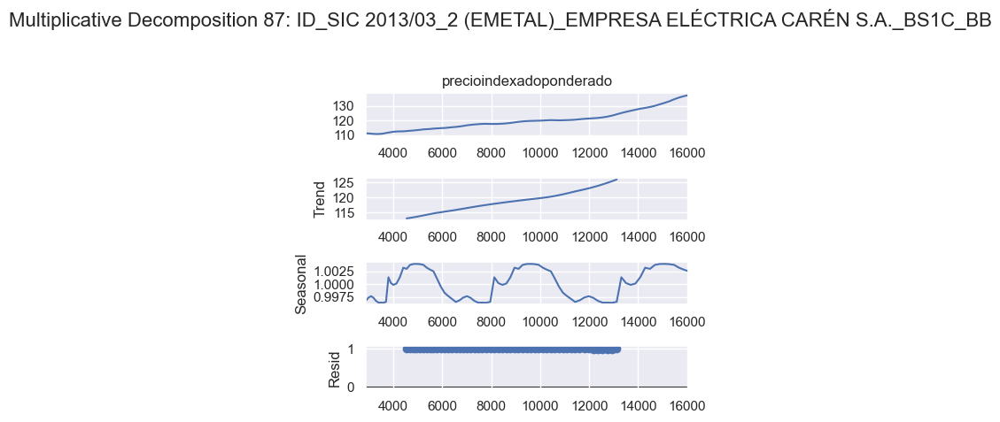

88


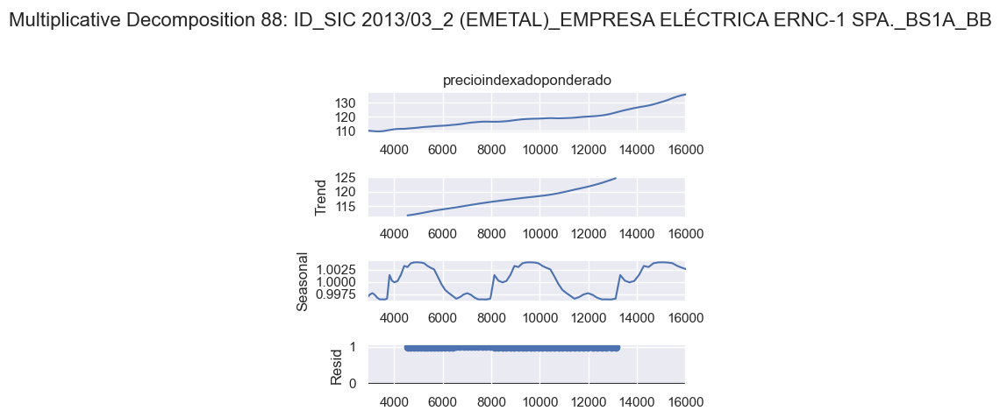

89


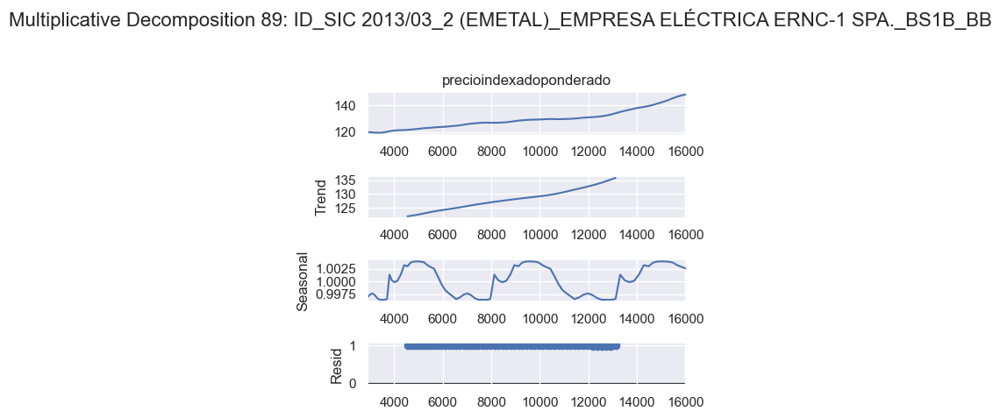

90


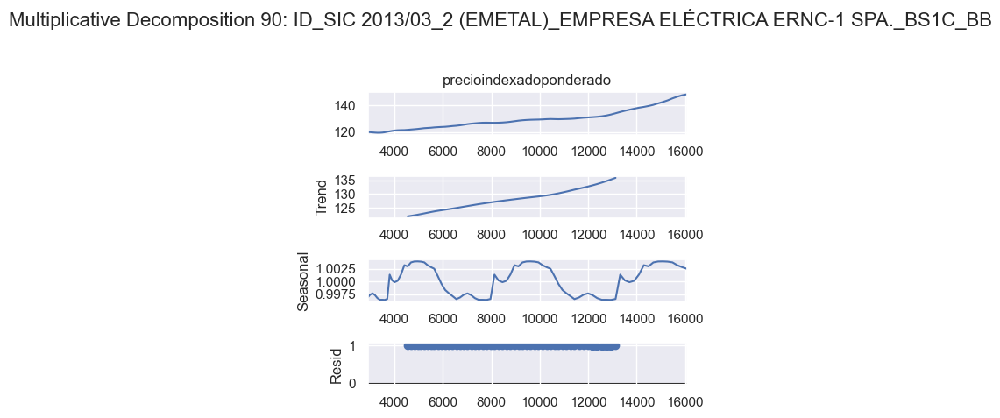

91


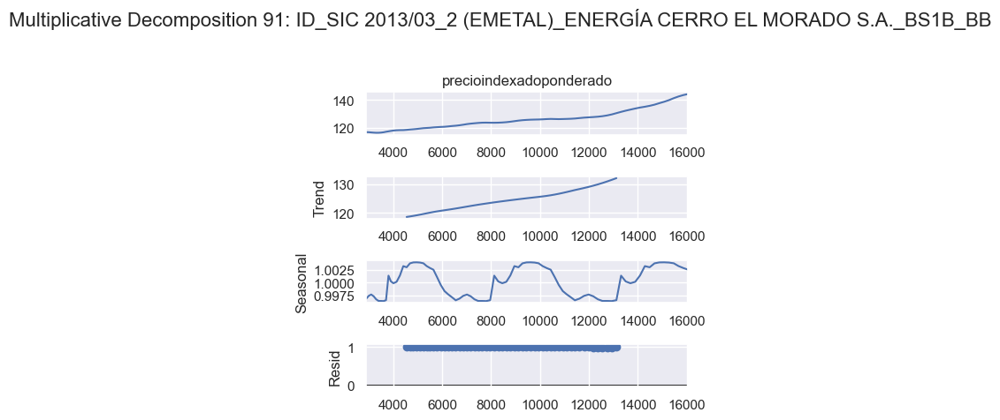

92


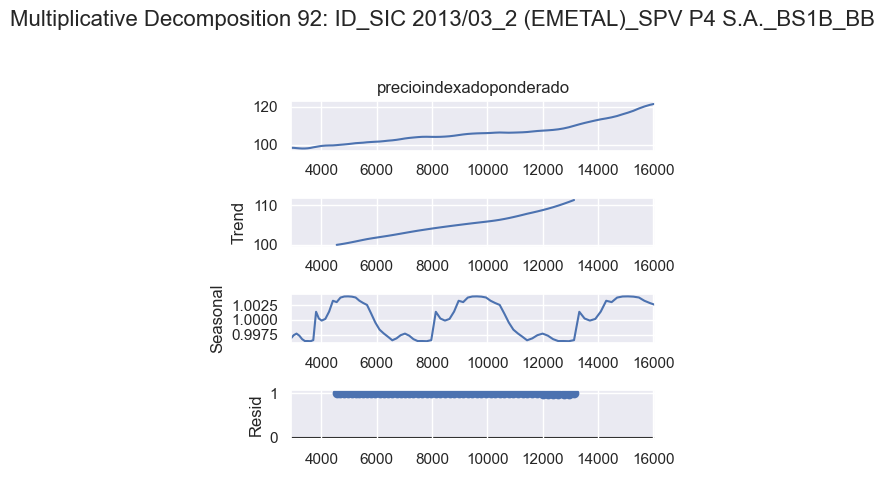

93


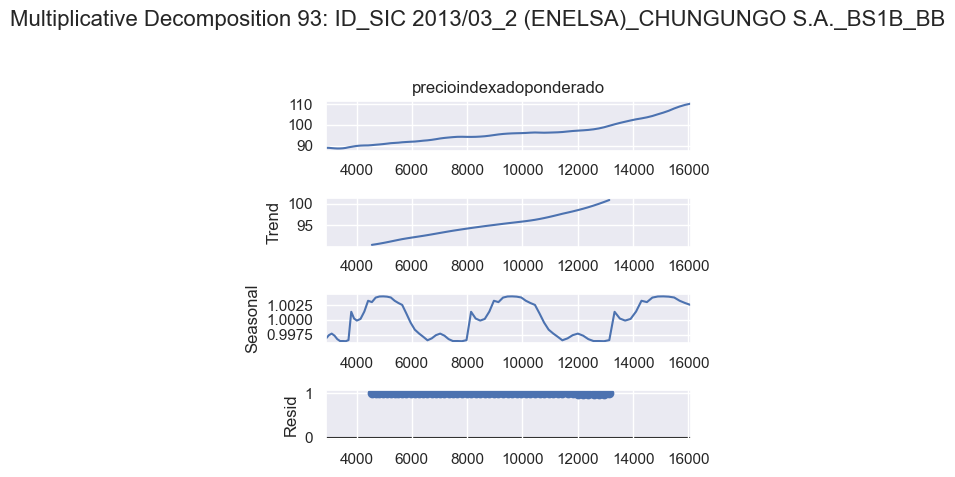

94


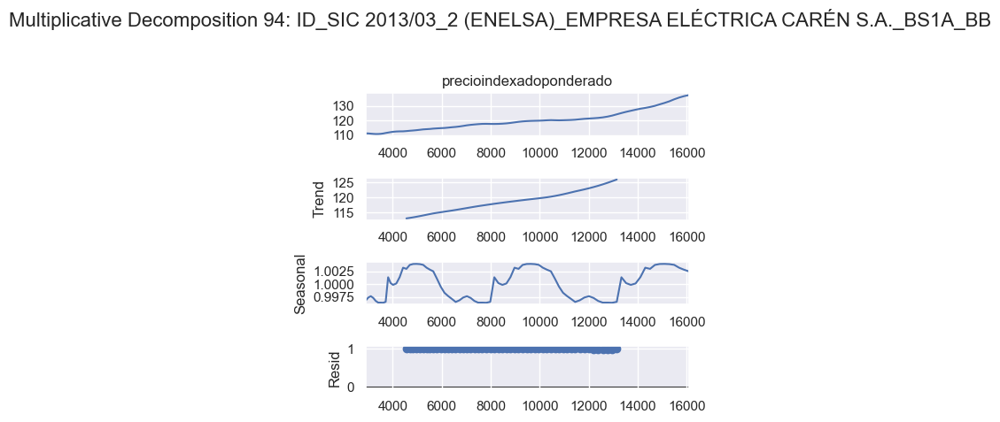

95


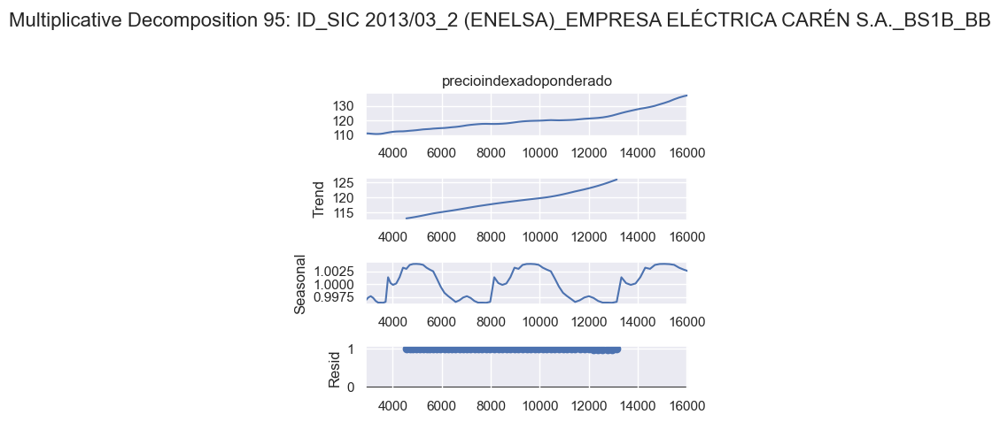

96


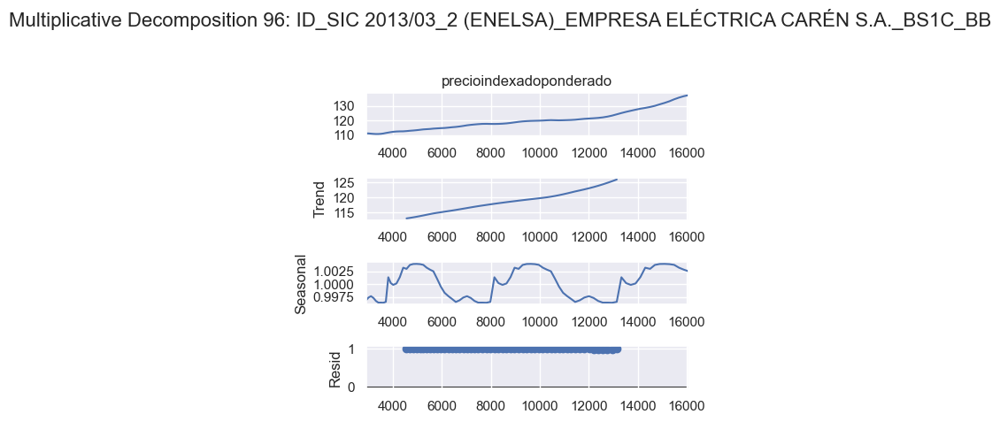

97


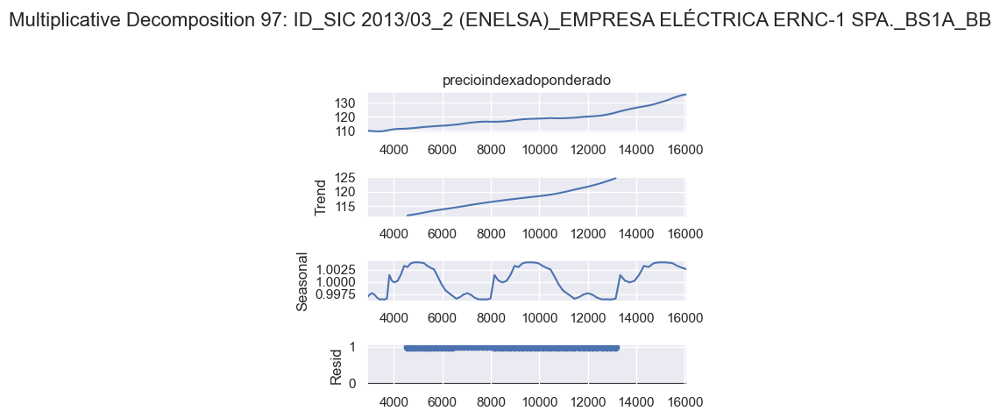

98


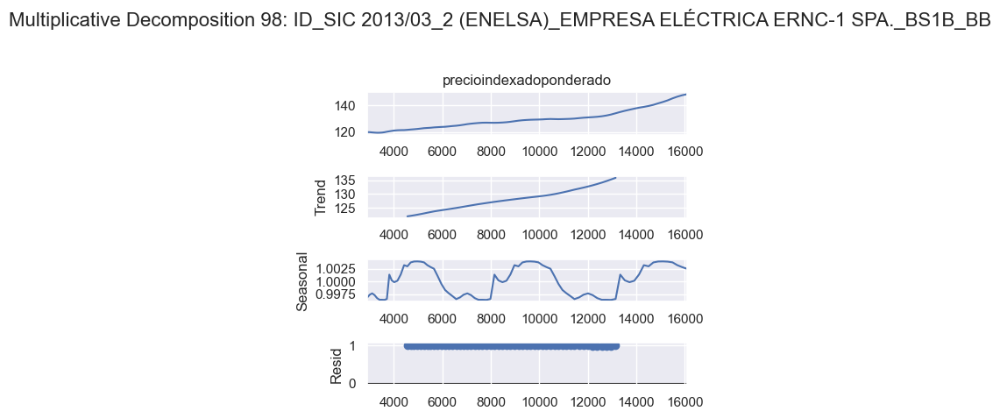

99


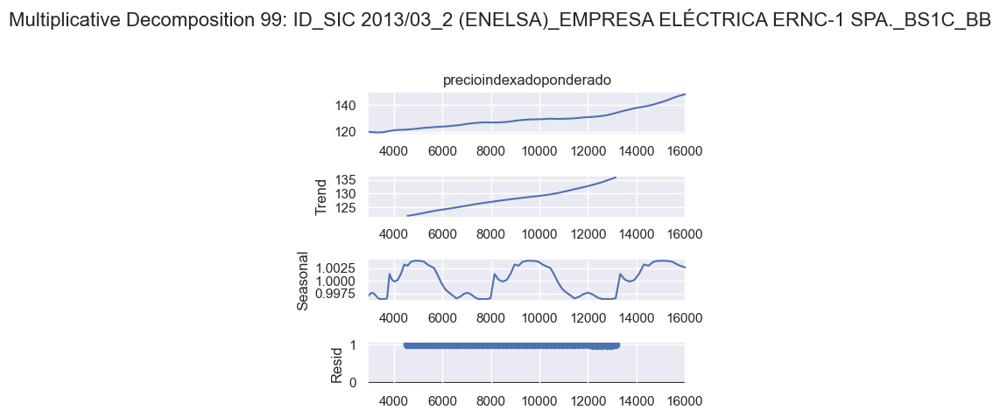

100


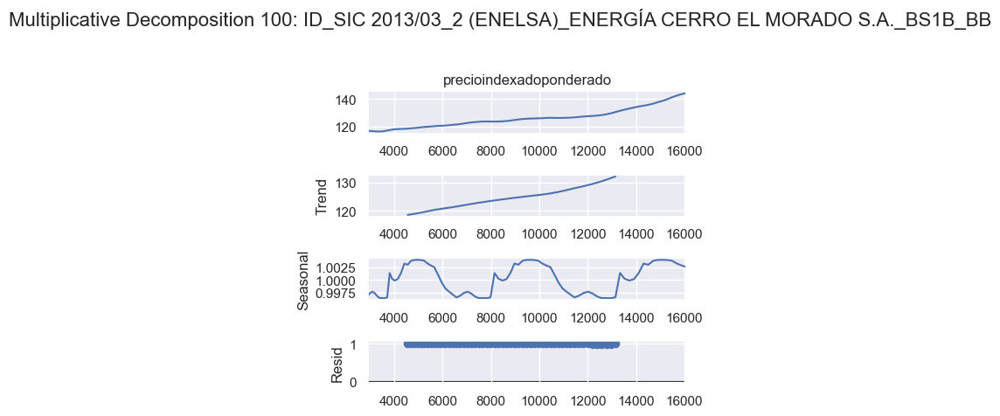

101


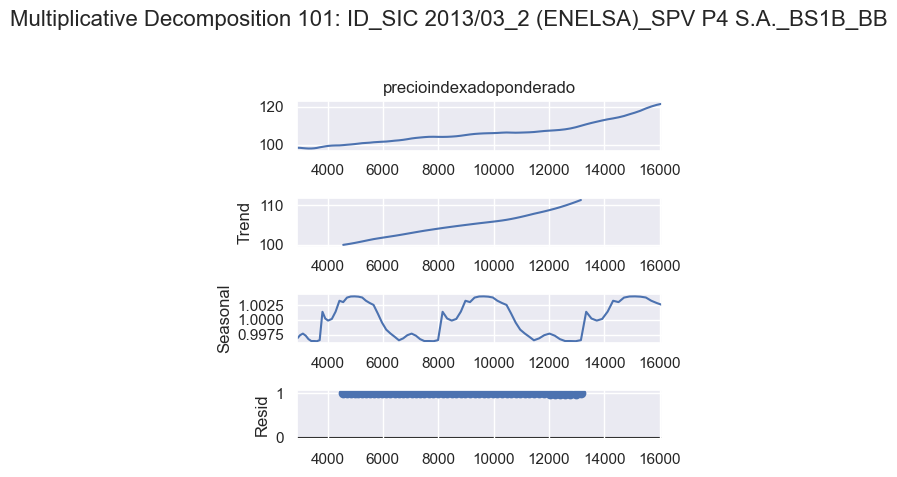

102


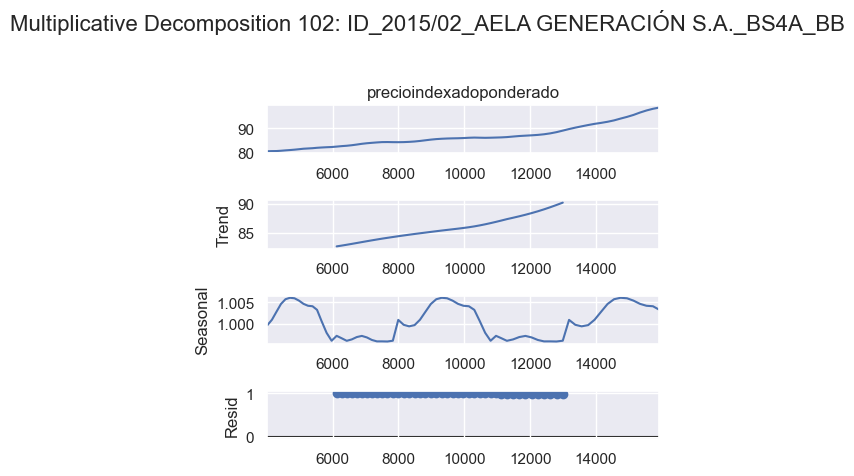

103


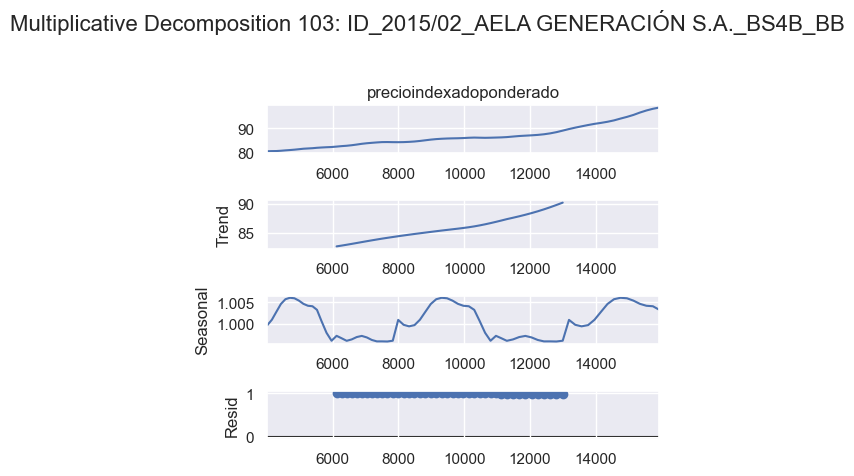

104


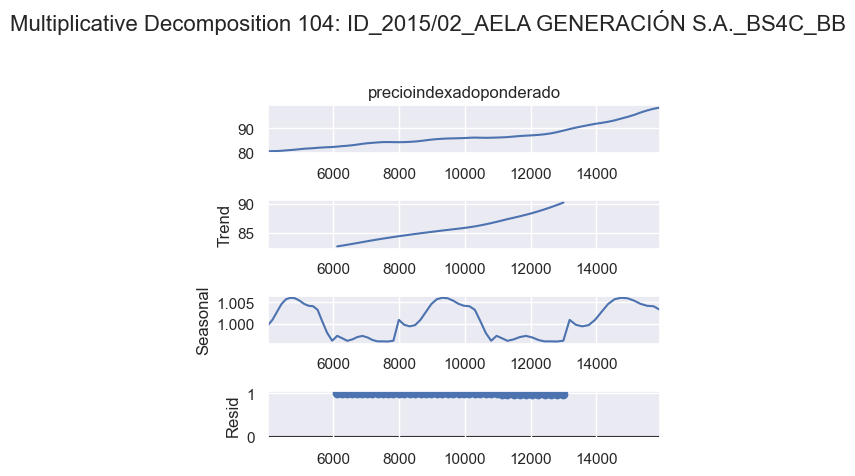

105


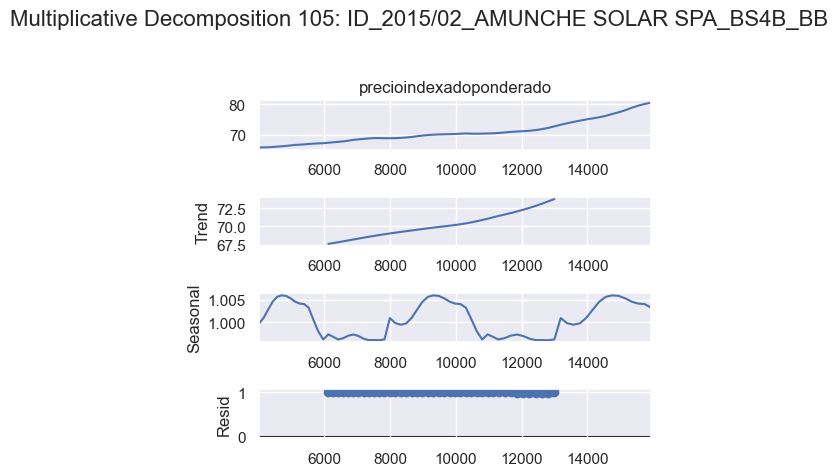

106


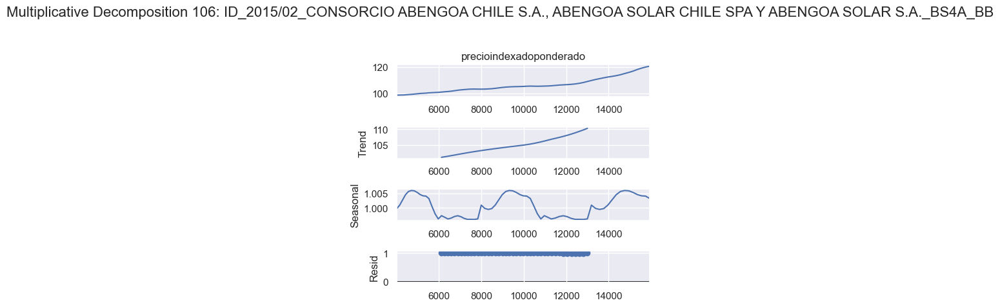

107


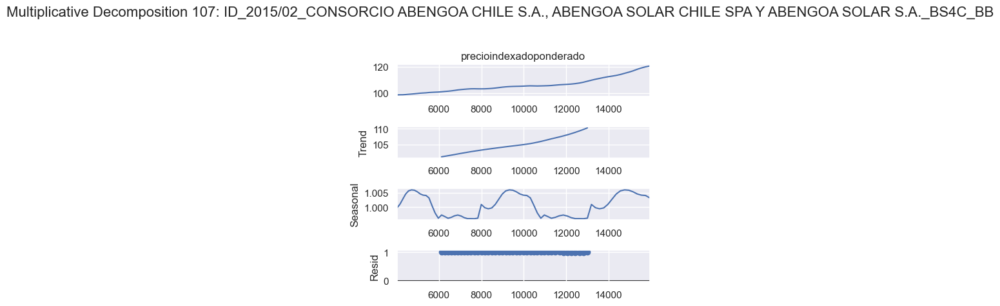

108


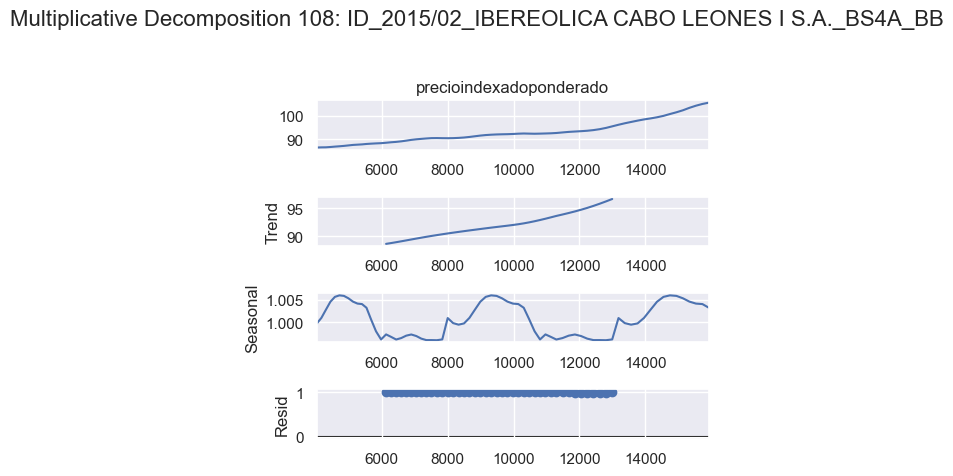

109


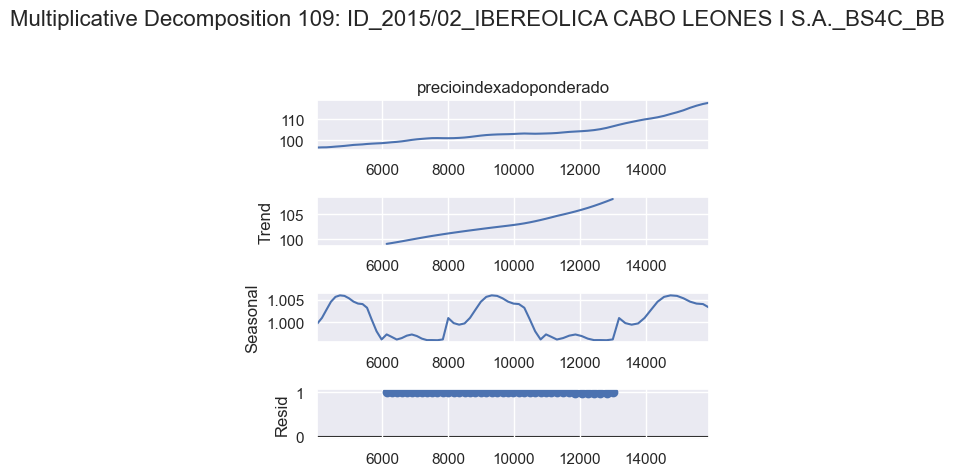

110


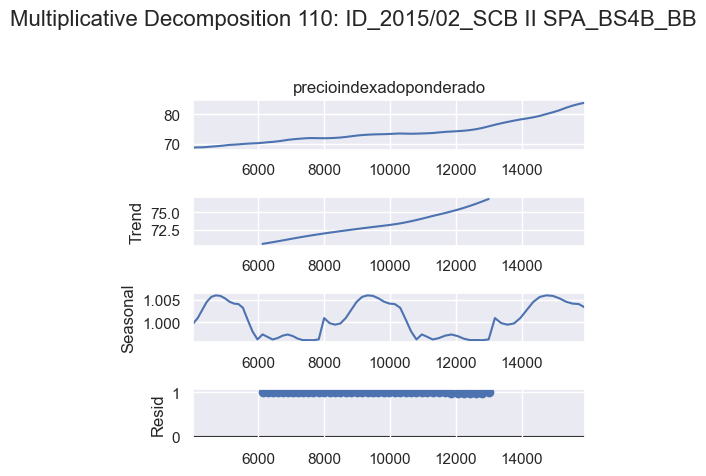

111


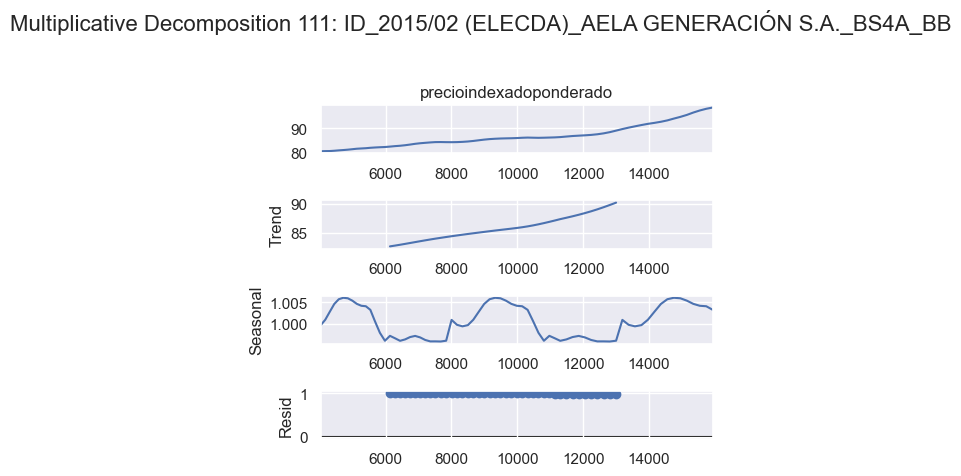

112


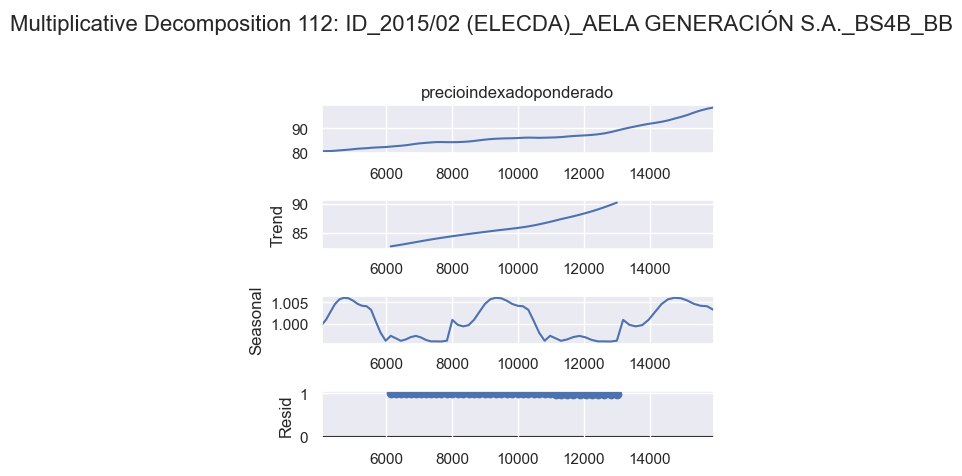

113


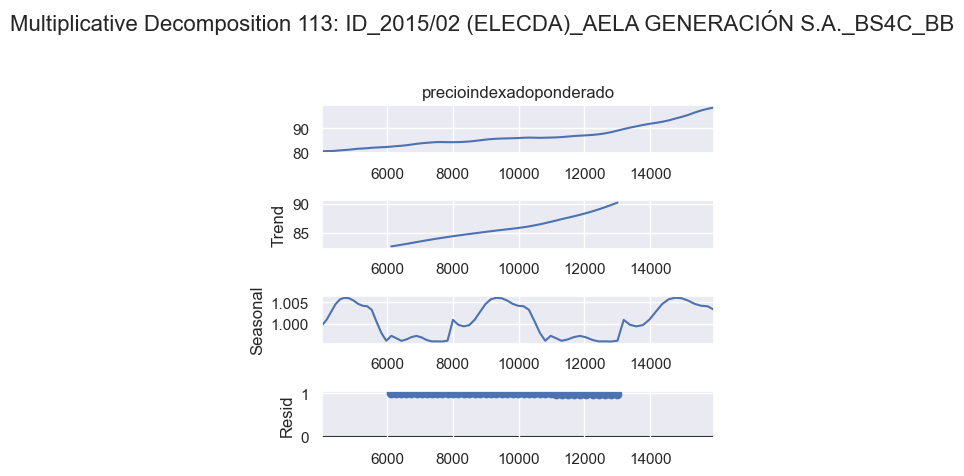

114


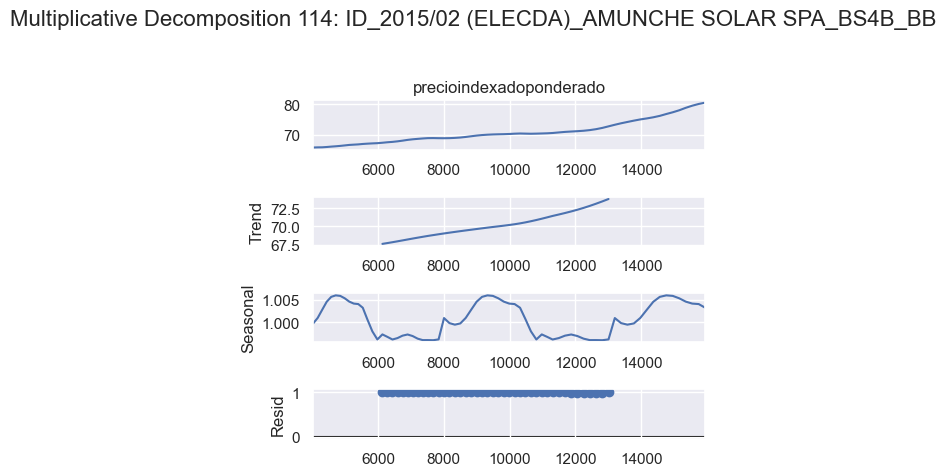

115


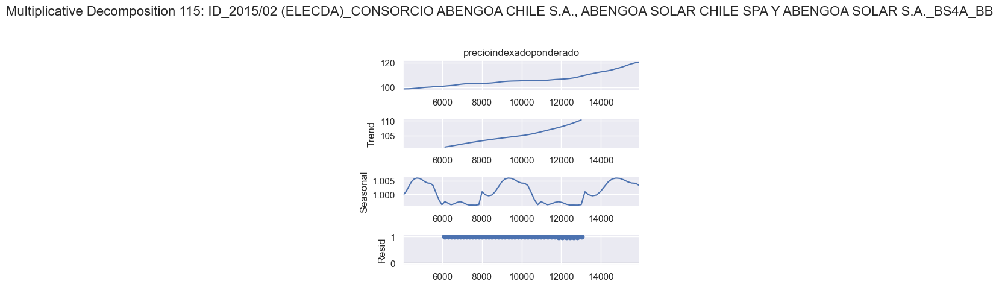

116


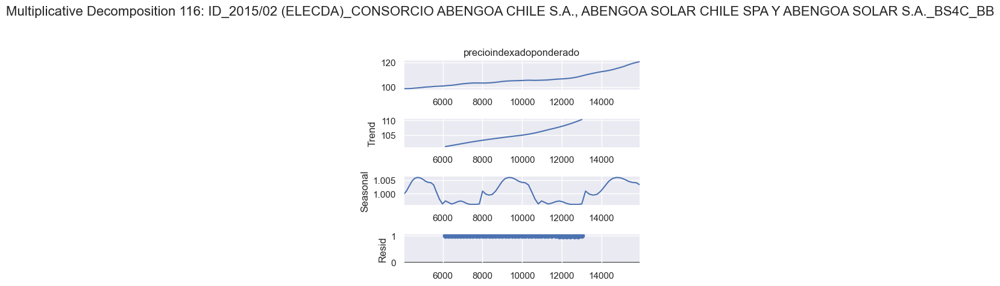

117


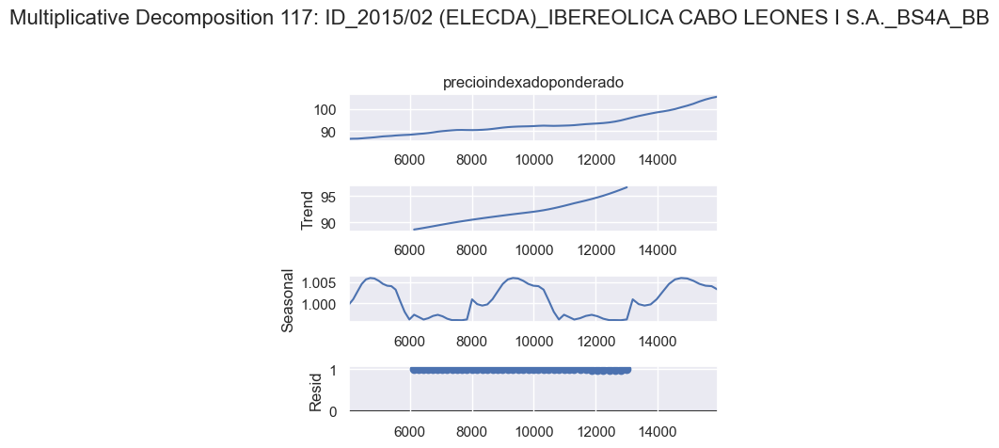

118


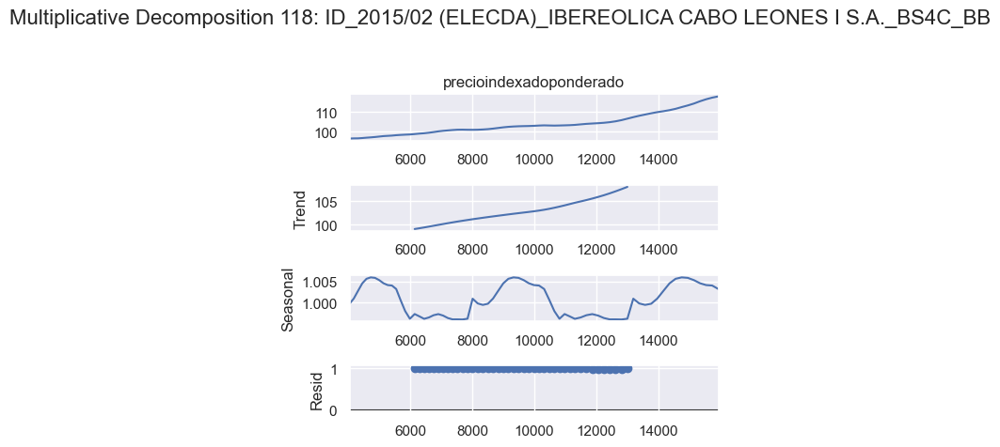

119


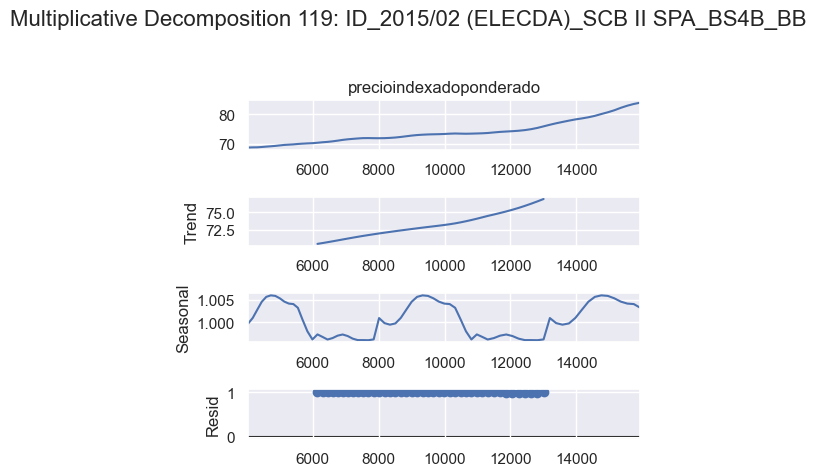

120


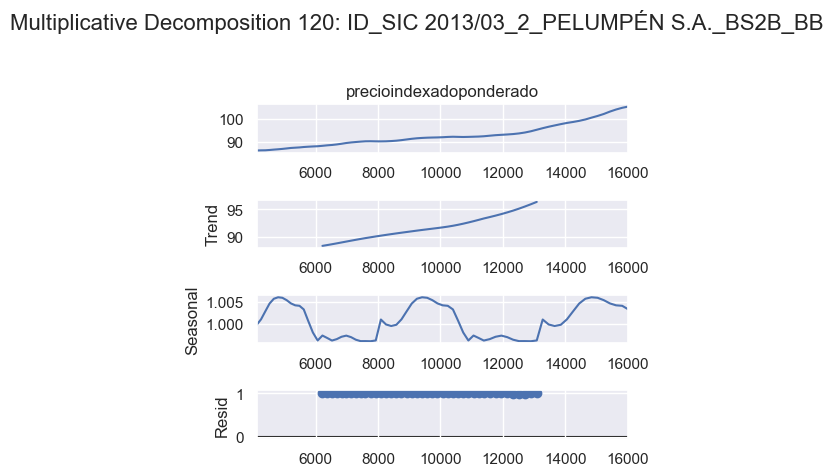

121


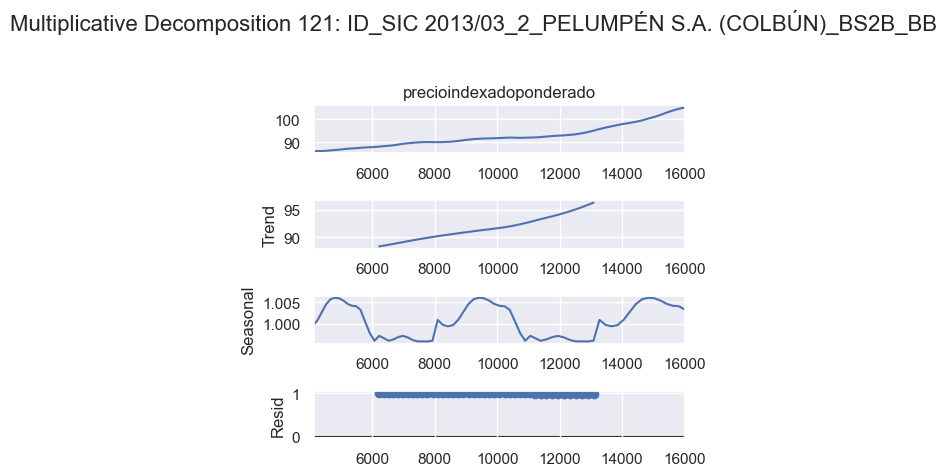

122


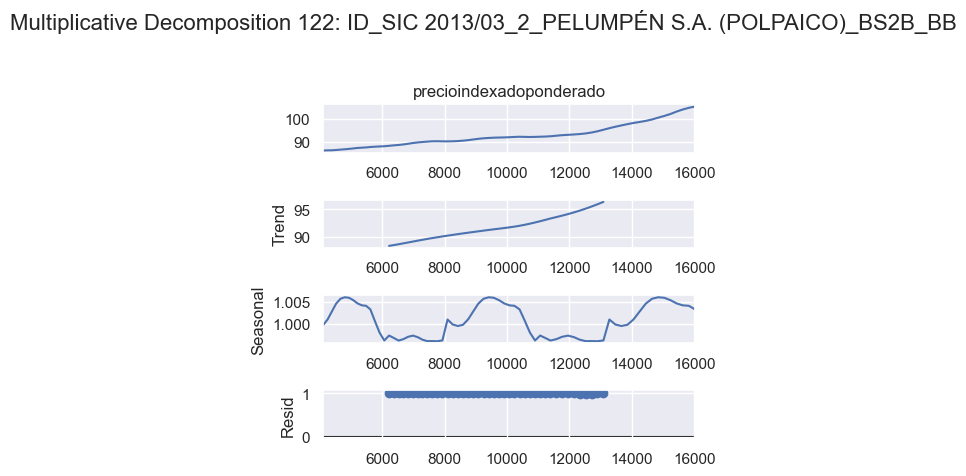

123


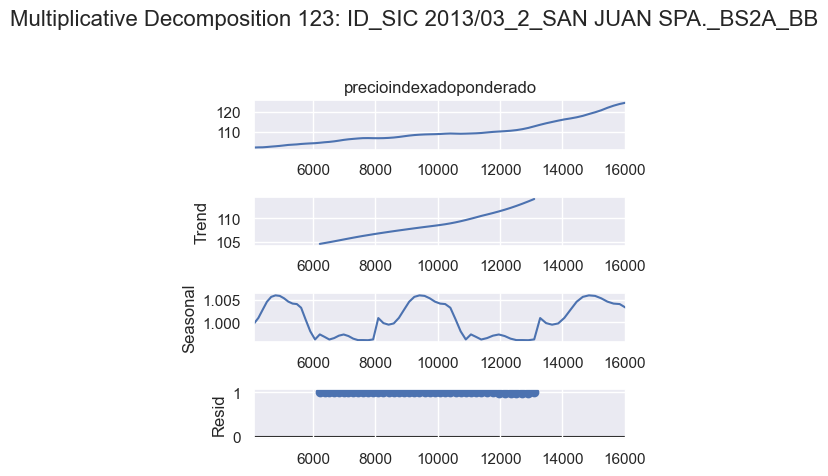

124


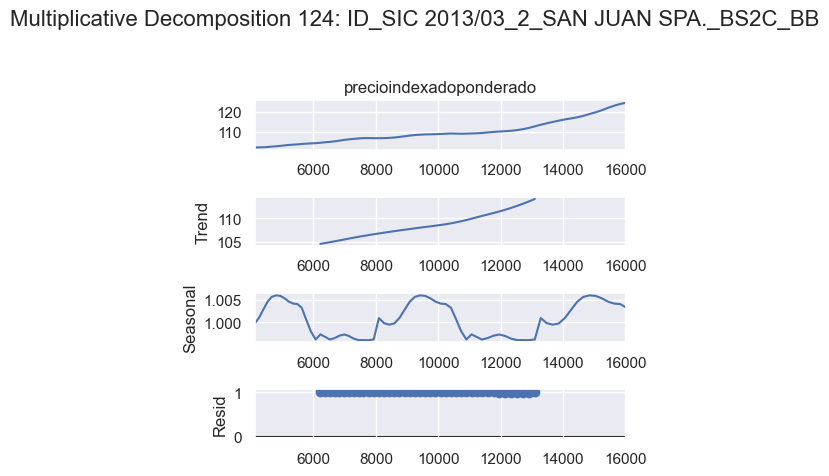

125


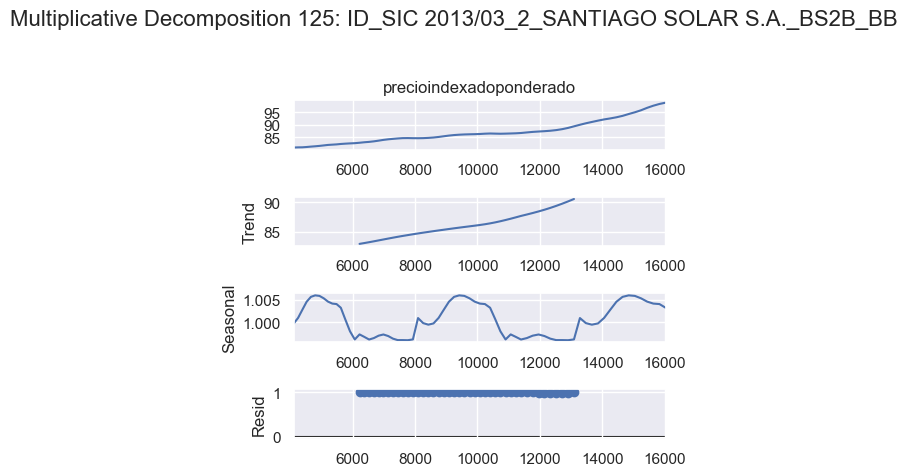

126


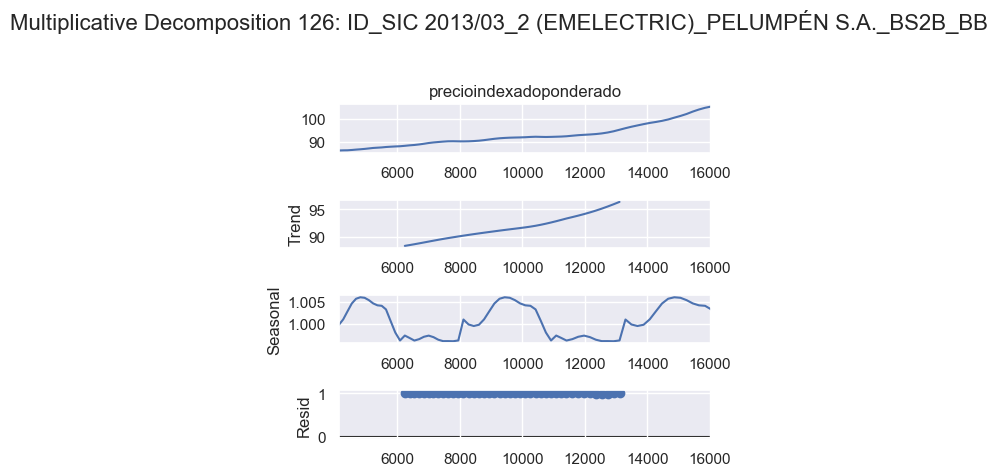

127


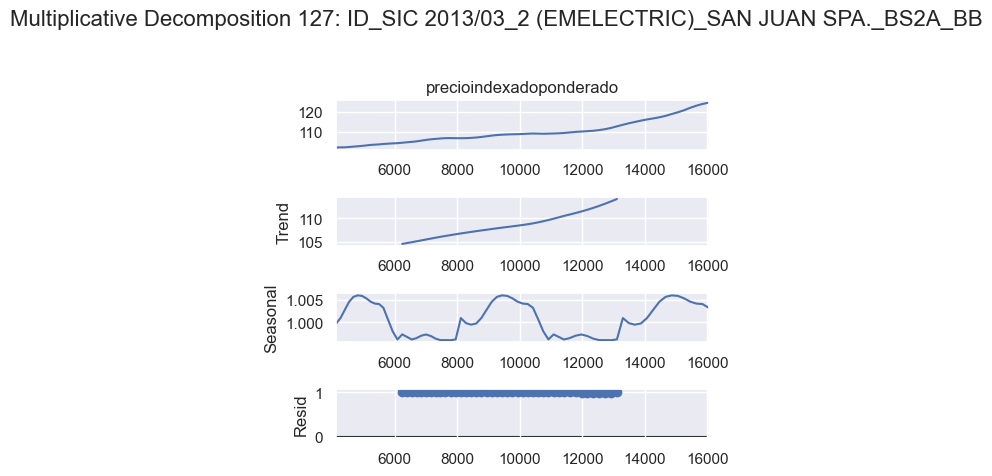

128


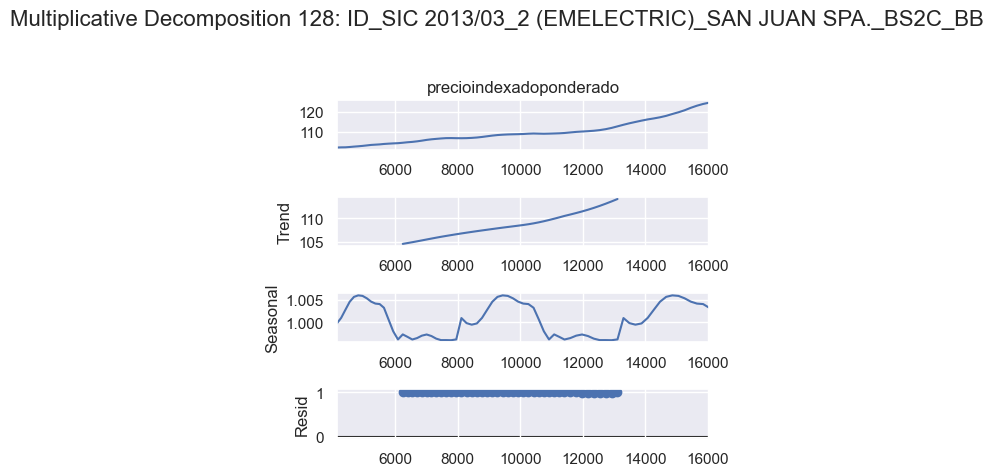

129


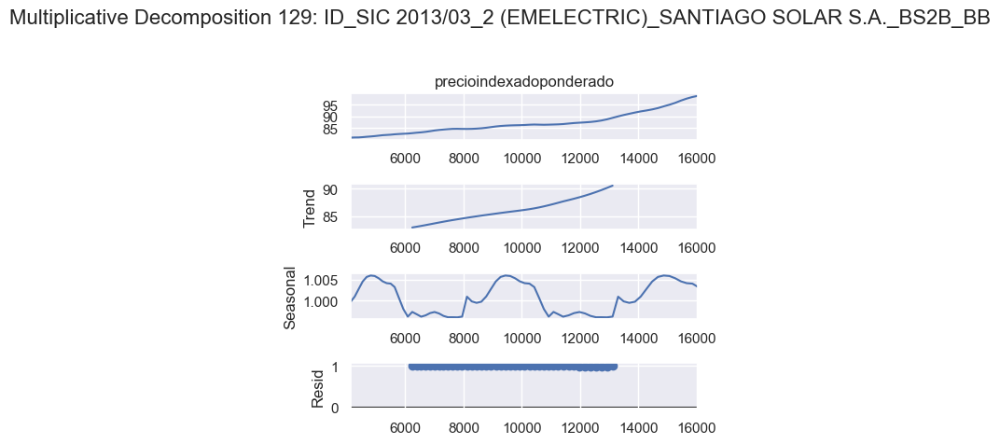

130


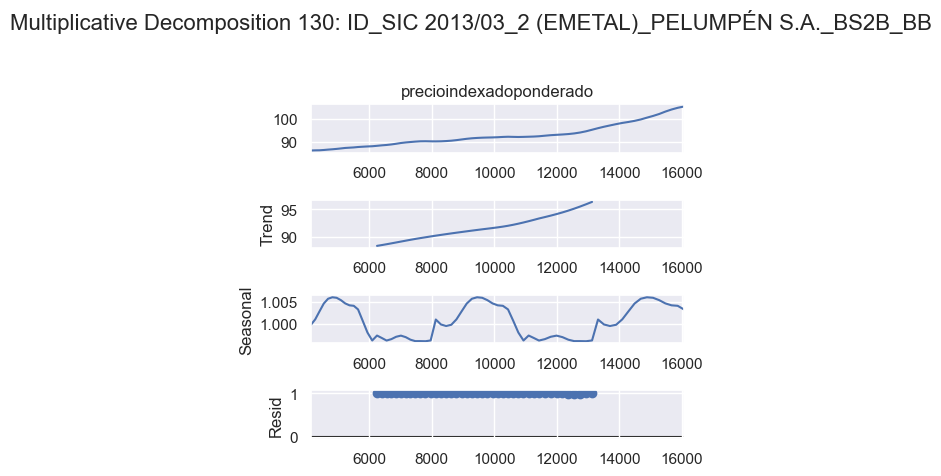

131


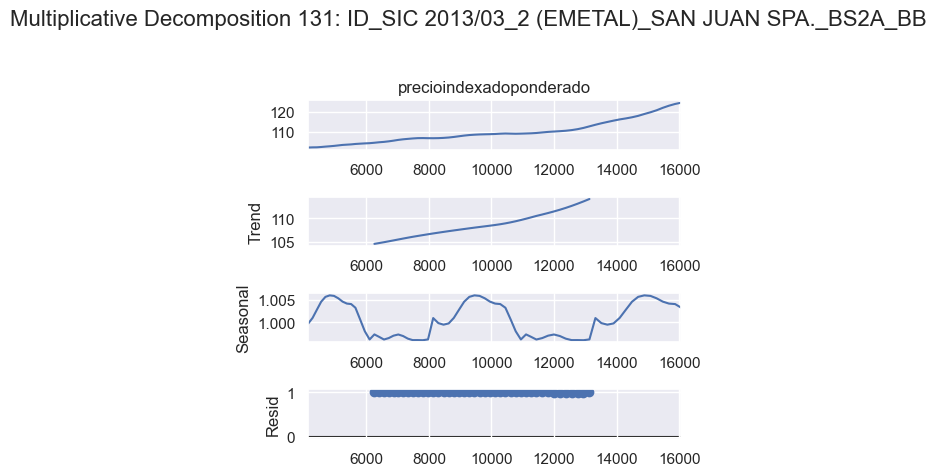

132


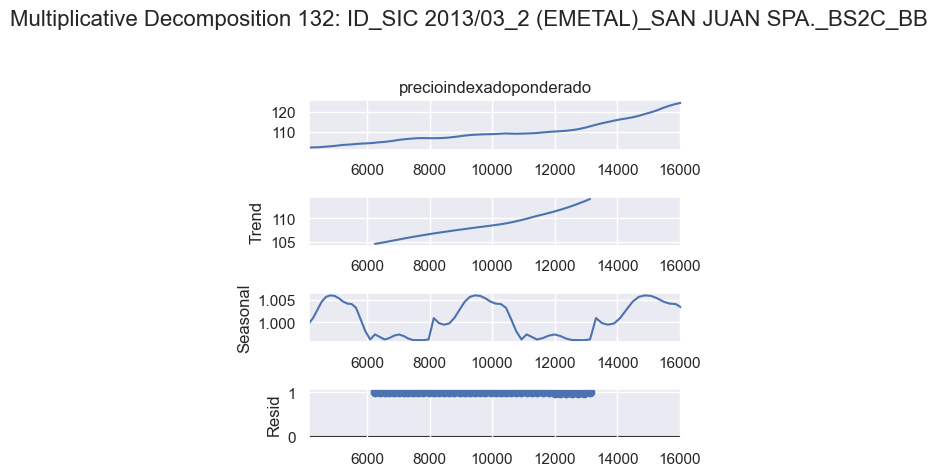

133


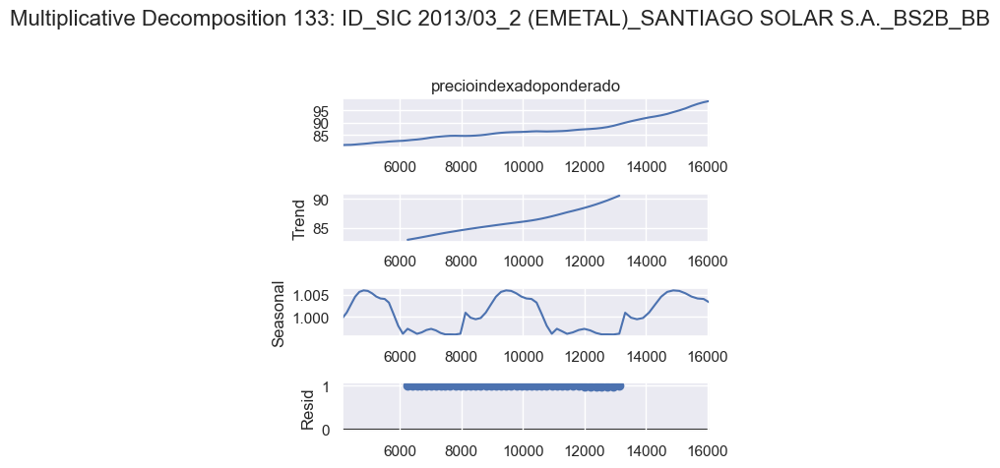

134


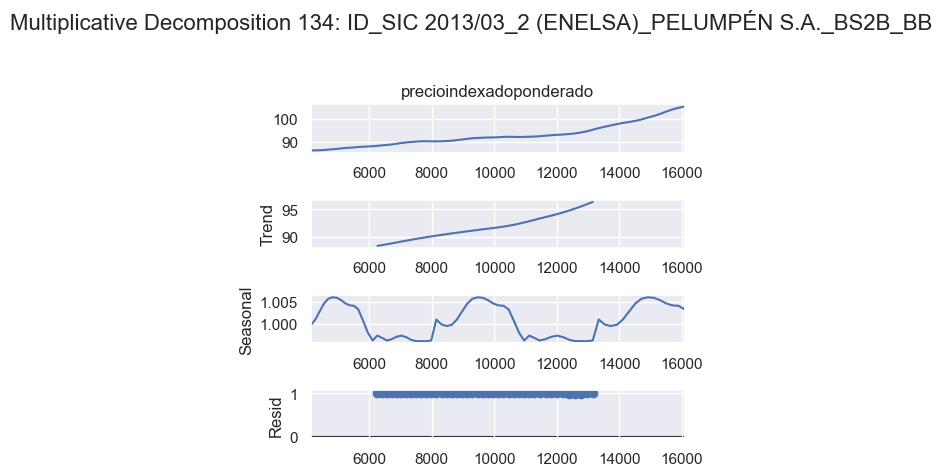

135


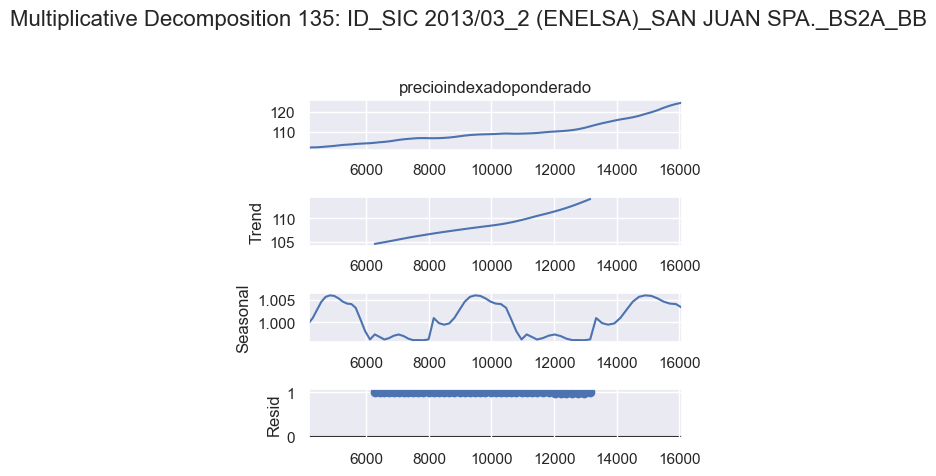

136


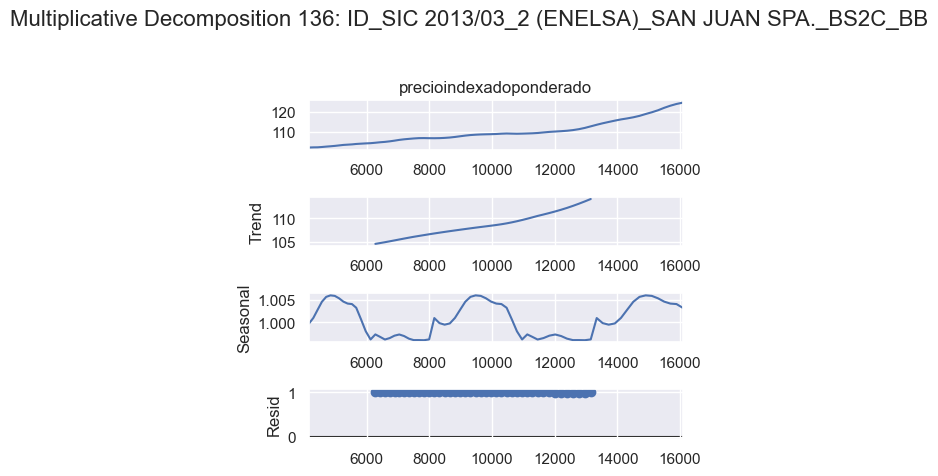

137


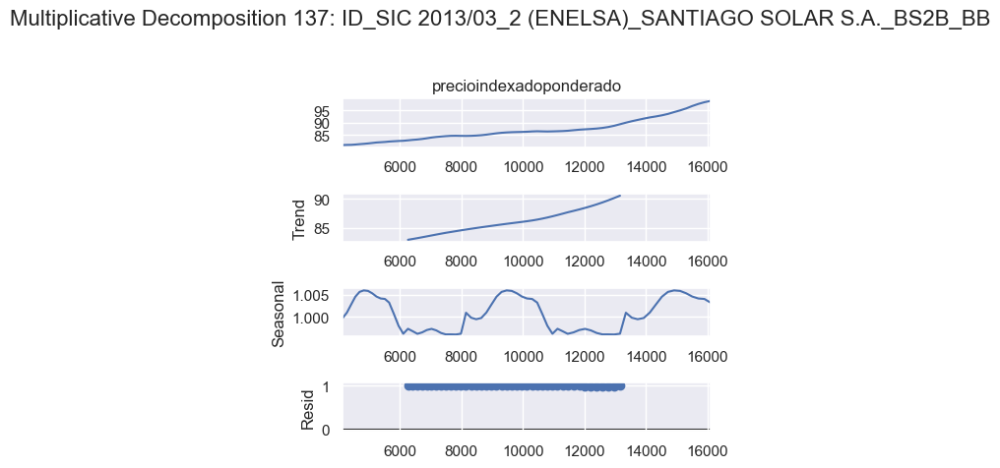

138


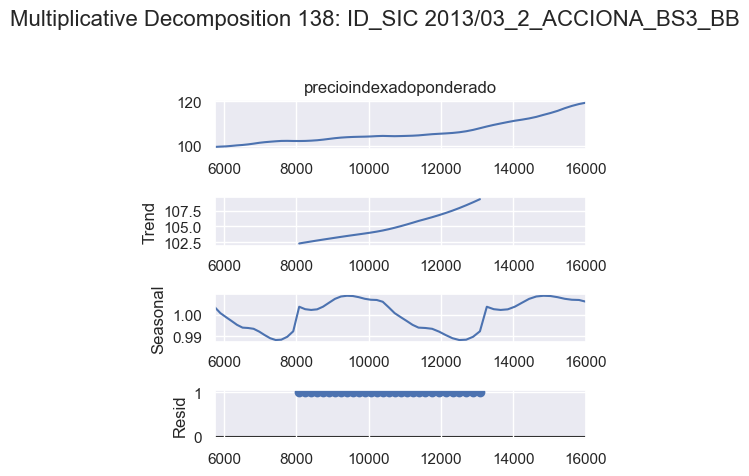

139


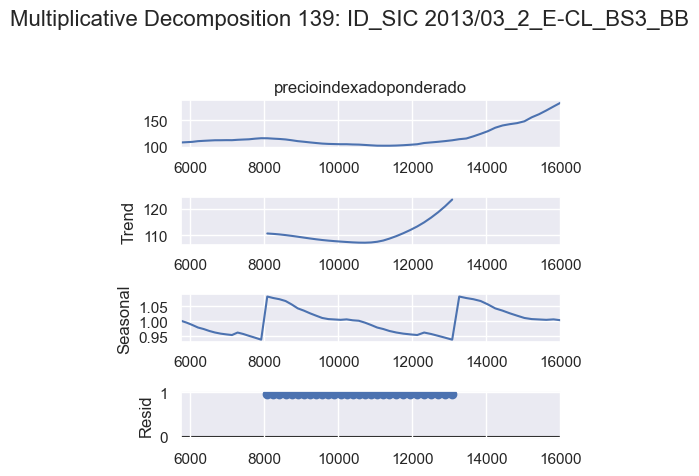

140


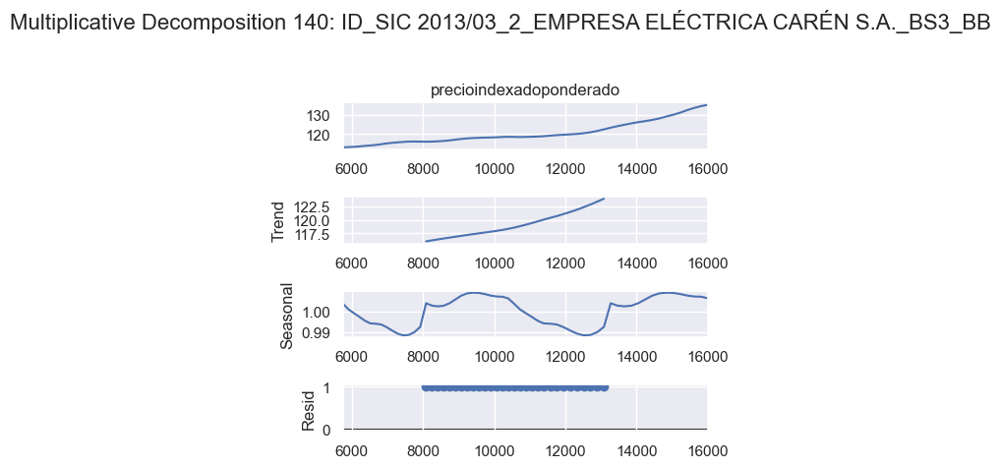

141


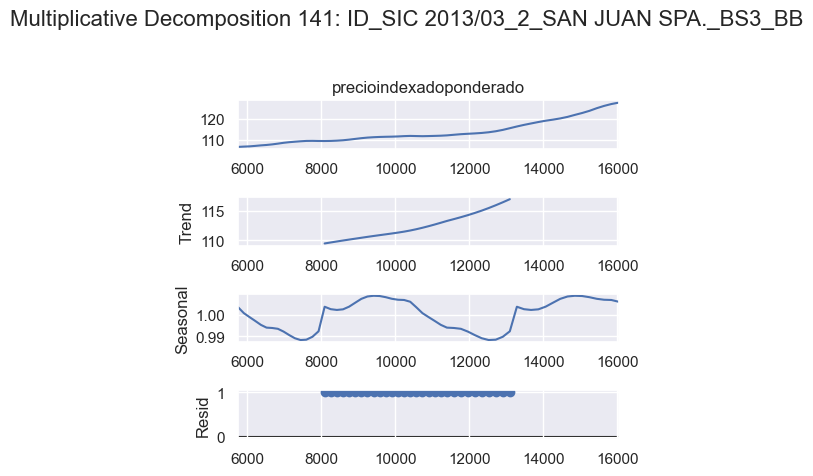

142


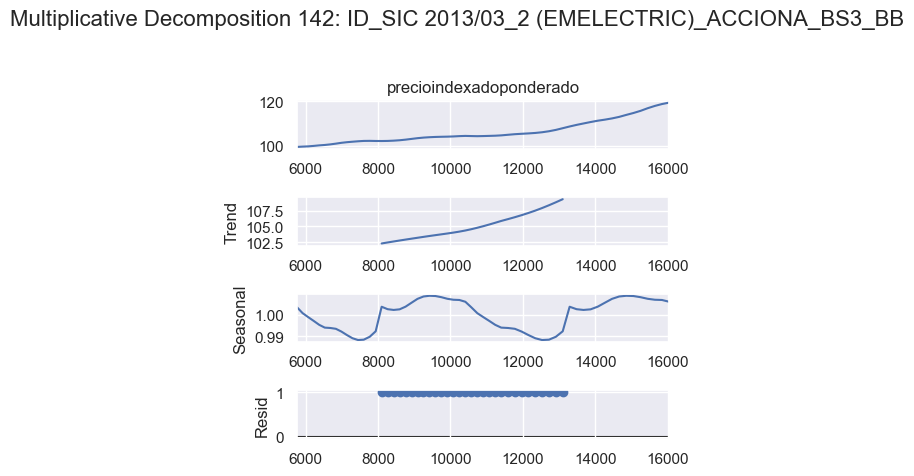

143


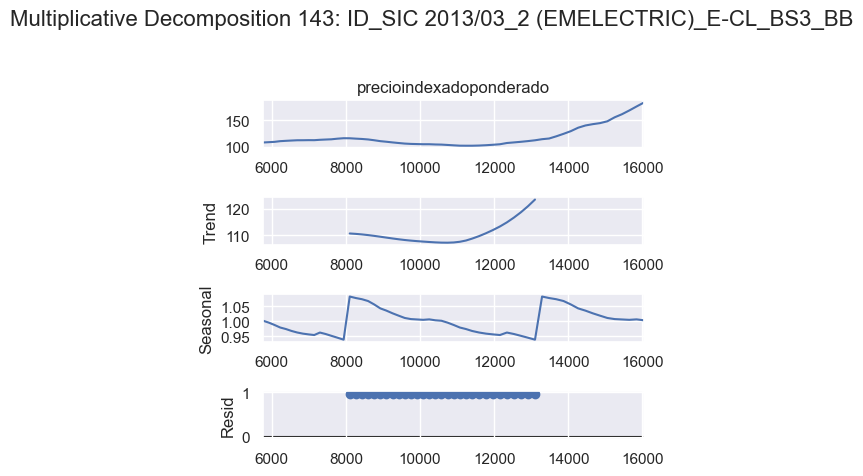

144


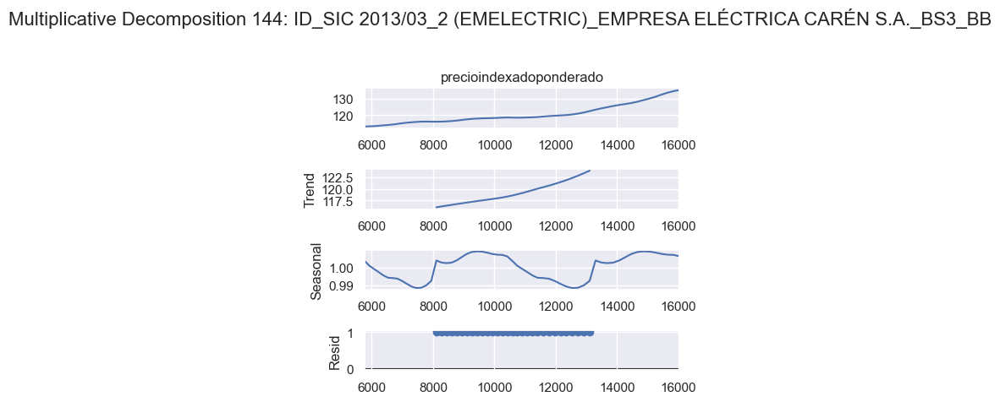

145


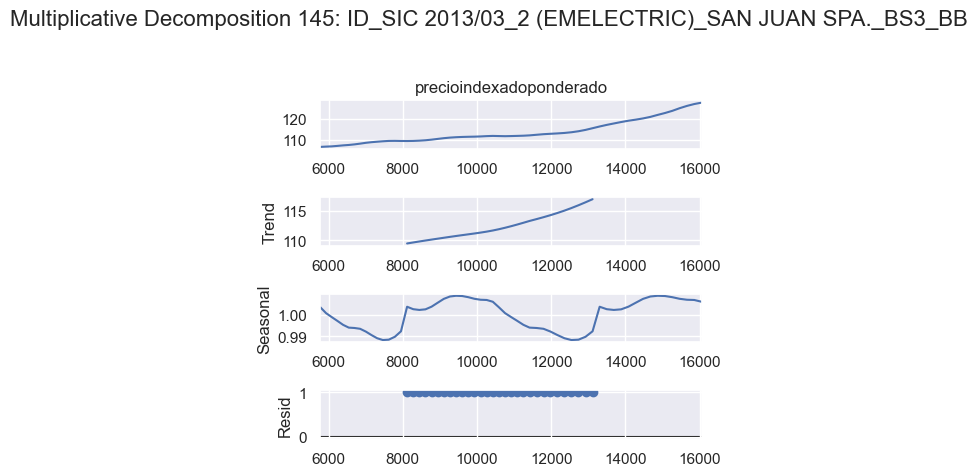

146


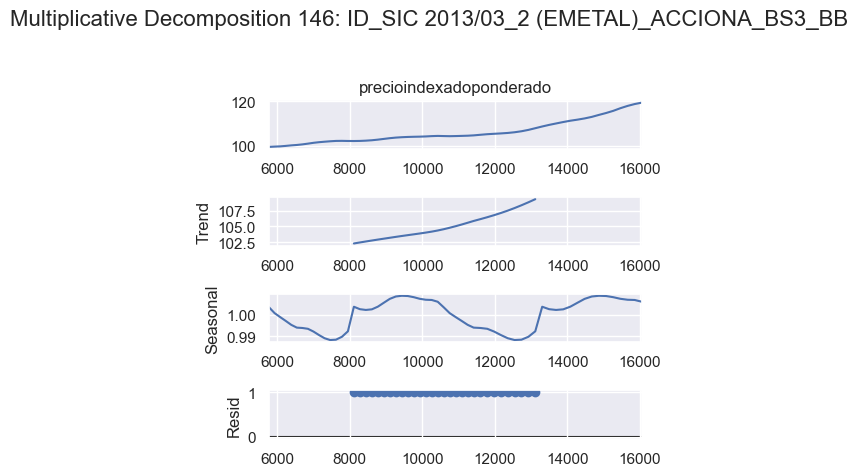

147


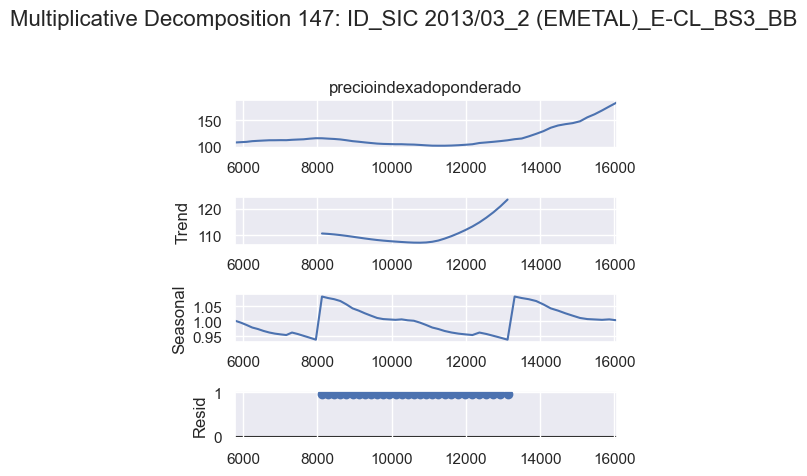

148


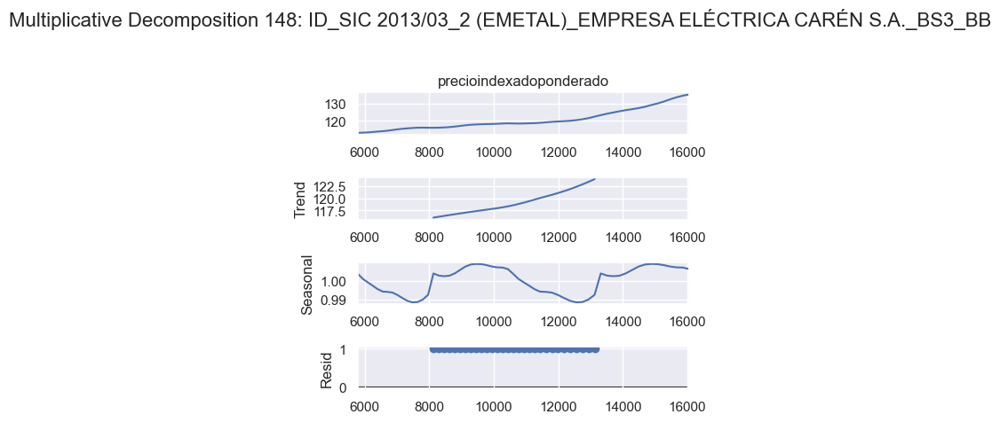

149


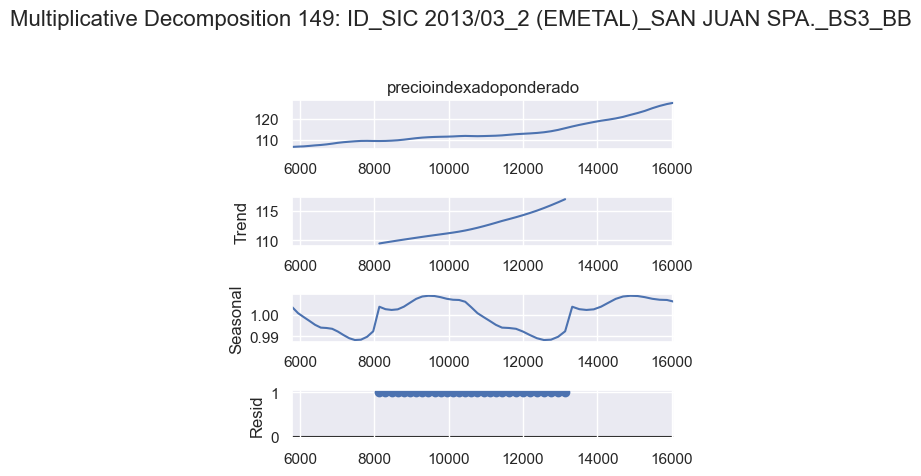

150


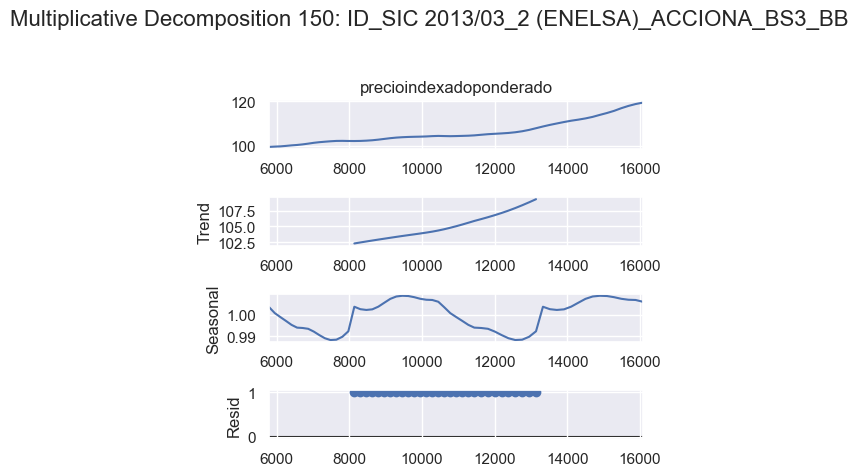

151


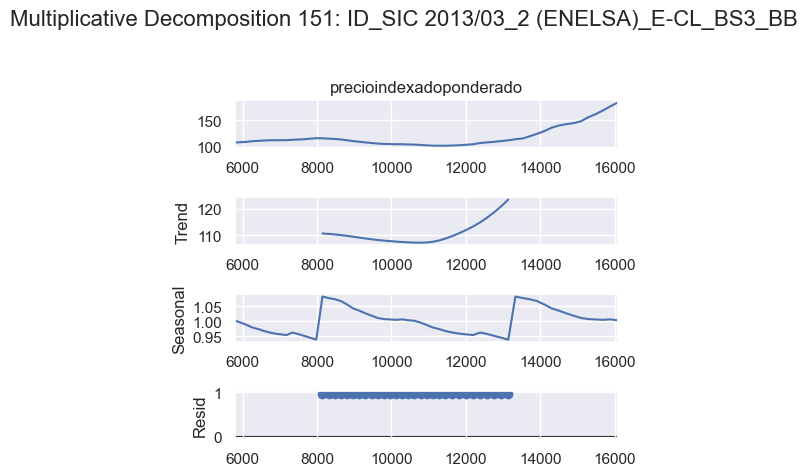

152


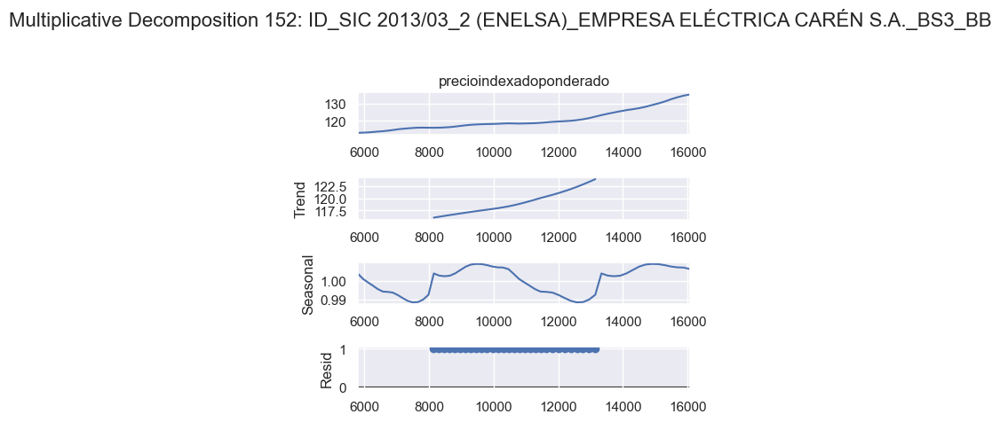

153


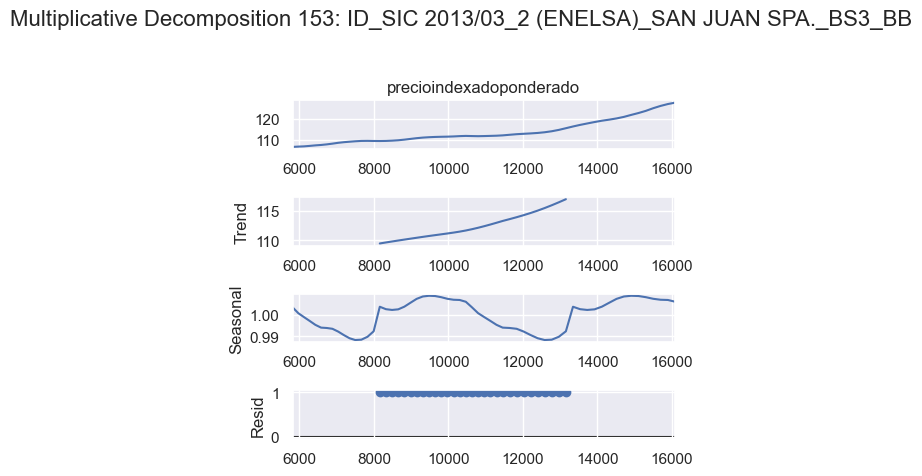

154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197


In [273]:


#print(df1['licitacion/generadora/bloque'].unique())

count=0
lista=[]

for i in series_tiempo['unique_id'].unique():

    try:
        count+=1

        var3=series_tiempo['unique_id'] == i
        ejemplo= series_tiempo[var3]
        prueba = series_tiempo[var3]
        print(count)

        # Multiplicative Decomposition 
        multiplicative_decomposition = seasonal_decompose(ejemplo['precioindexadoponderado'], model='multiplicative', period=30)

        # Additive Decomposition
        #additive_decomposition = seasonal_decompose(ejemplo['precioindexadoponderado'], model='additive', period=30)

        # Plot
        plt.rcParams.update({'figure.figsize': (5,5)})
        multiplicative_decomposition.plot().suptitle(f'Multiplicative Decomposition {count}: {i}', fontsize=16)
        plt.tight_layout(rect=[0, 0.03, 1, 0.95])

        #additive_decomposition.plot().suptitle('Additive Decomposition', fontsize=16)
        #plt.tight_layout(rect=[0, 0.03, 1, 0.95])

        plt.show()

    except Exception as e:
        lista.append(i)
        now = datetime.datetime.now()
        obs=f"{now.strftime('%Y-%m-%d %H:%M:%S')} | {i} | error:{e}"
        with open("errores.txt","a") as file:
            file.write(obs)



In [274]:
print(lista)

['ID_SIC 2013/03_2_ABENGOA_BS4_BB', 'ID_SIC 2013/03_2_EL CAMPESINO_BS4_BB', 'ID_SIC 2013/03_2_NORVIND_BS4_BB', 'ID_SIC 2013/03_2 (EMELECTRIC)_ABENGOA_BS4_BB', 'ID_SIC 2013/03_2 (EMELECTRIC)_EL CAMPESINO_BS4_BB', 'ID_SIC 2013/03_2 (EMELECTRIC)_NORVIND_BS4_BB', 'ID_SIC 2013/03_2 (EMETAL)_ABENGOA_BS4_BB', 'ID_SIC 2013/03_2 (EMETAL)_EL CAMPESINO_BS4_BB', 'ID_SIC 2013/03_2 (EMETAL)_NORVIND_BS4_BB', 'ID_SIC 2013/03_2 (ENELSA)_ABENGOA_BS4_BB', 'ID_SIC 2013/03_2 (ENELSA)_EL CAMPESINO_BS4_BB', 'ID_SIC 2013/03_2 (ENELSA)_NORVIND_BS4_BB', 'ID_2015/01_BESALCO_BS2C_BB', 'ID_2015/01_CONDOR ENERGÍA (ESPERANZA)_BS1_BB', 'ID_2015/01_CONDOR ENERGÍA (ESPERANZA)_BS2_BB', 'ID_2015/01_HUEMUL ENERGÍA (CAMAN)_BS1_BB', 'ID_2015/01_HUEMUL ENERGÍA (COIHUE)_BS1_BB', 'ID_2015/01_IBEREÓLICA CABO LEONES II S.A._BS2_BB', 'ID_2015/01_IBEREÓLICA CABO LEONES III SPA_BS2A_BB', 'ID_2015/01_IBEREÓLICA CABO LEONES III SPA_BS2C_BB', 'ID_2015/01_MARIA ELENA SOLAR_BS2B_BB', 'ID_2015/01_OPDENERGY_BS1_BB', 'ID_2015/01_PARQUE EÓL

c:\Users\Vskah\anaconda3\lib\site-packages\statsmodels\tsa\seasonal.py:324: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(len(series), 1)


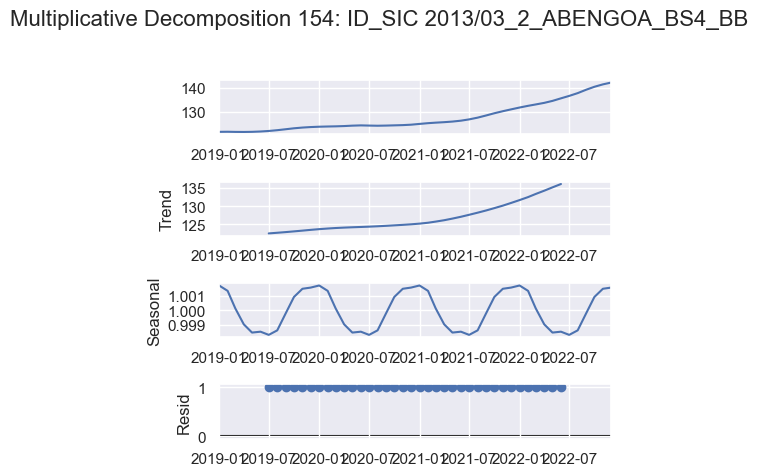

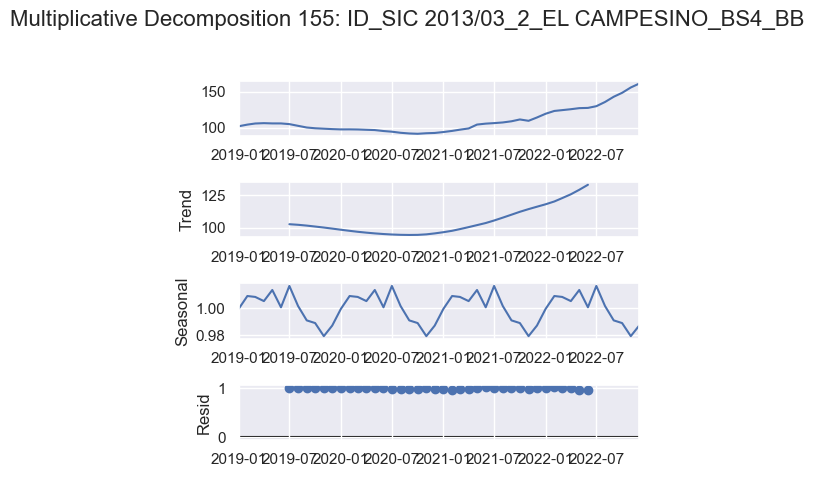

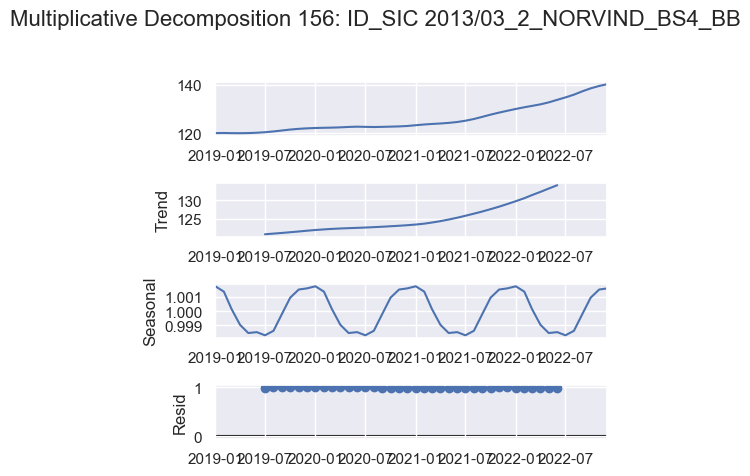

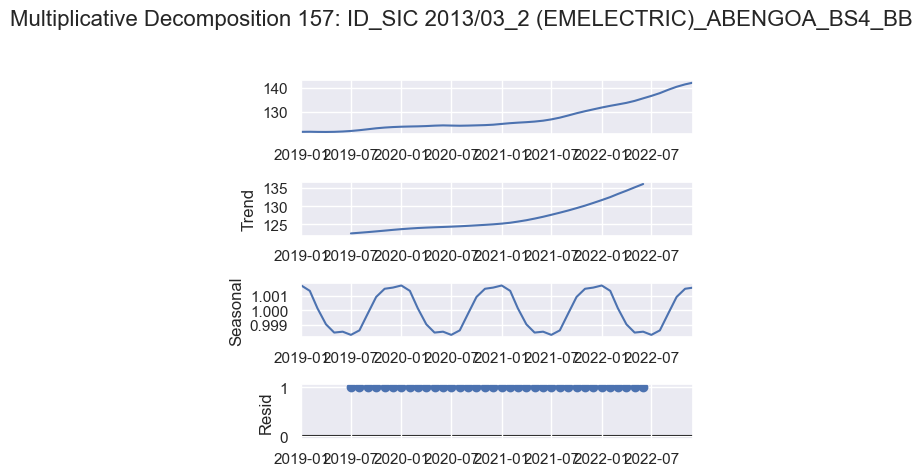

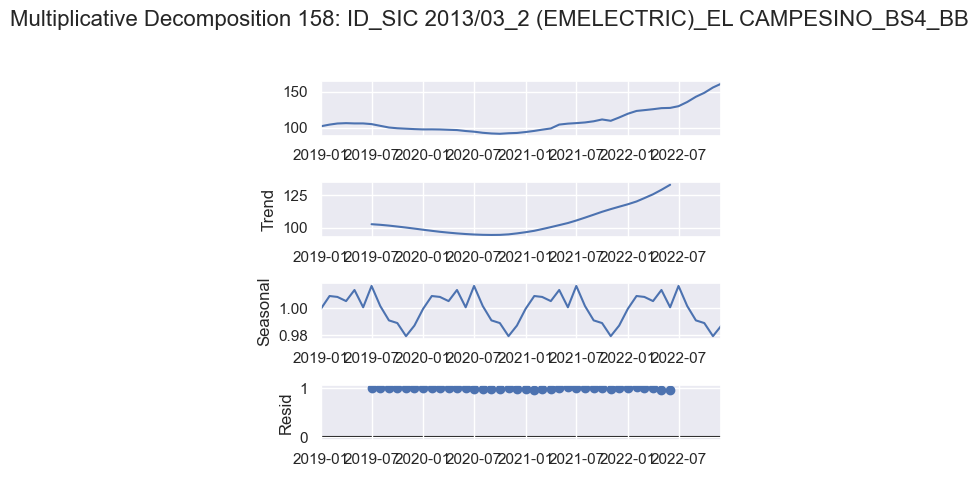

...

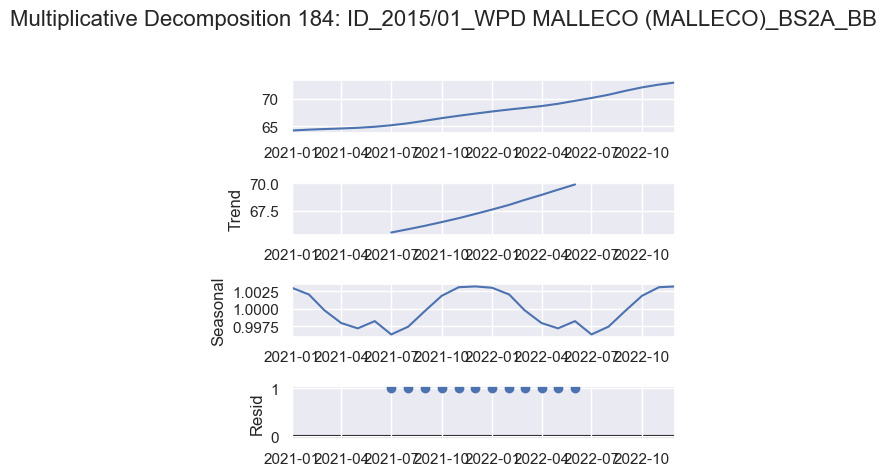

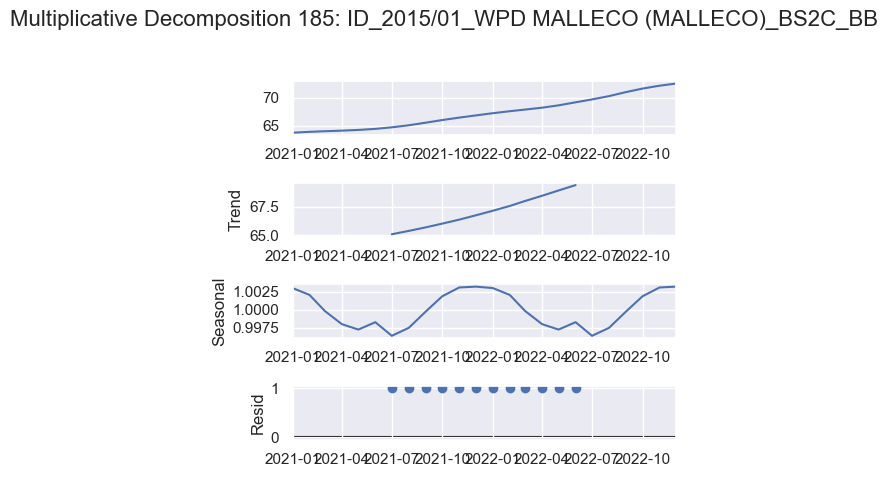

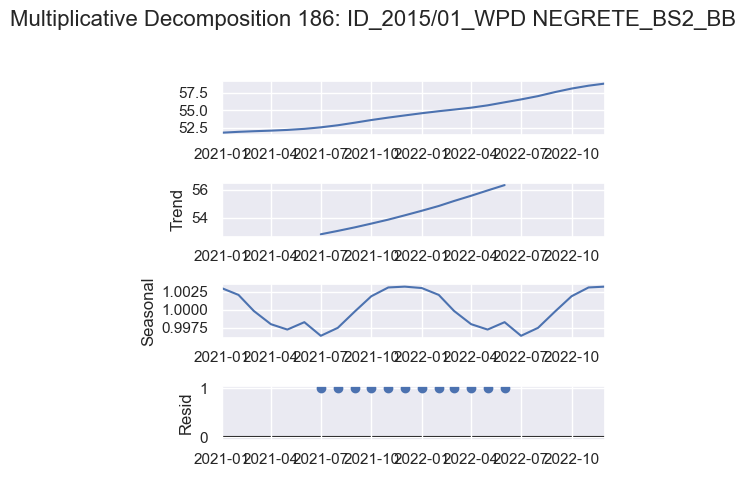

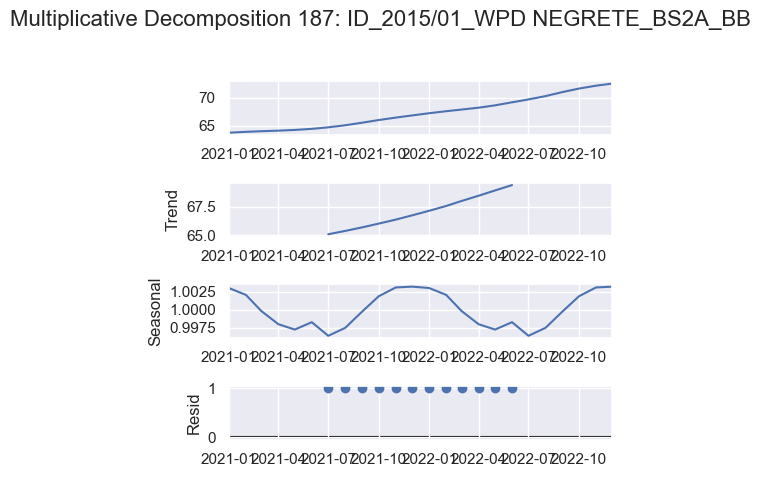

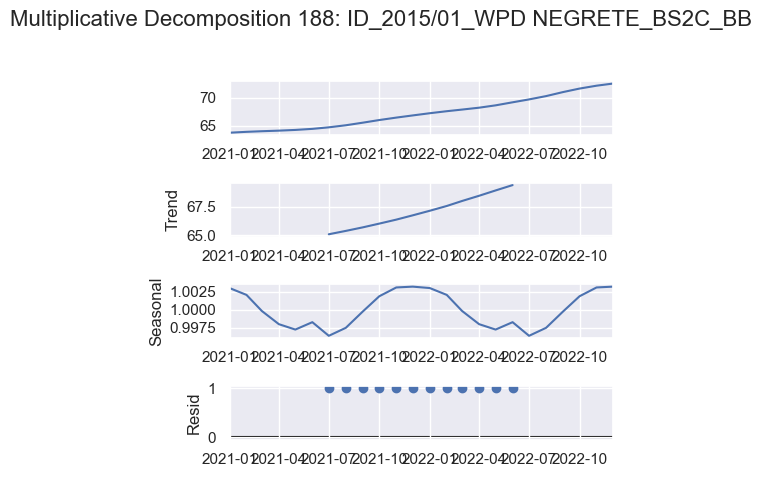

In [275]:
lista2=[]
count=153
for j in lista:



    try:
        count+=1
        var5=series_tiempo['unique_id'] == j
        ejemplo2= series_tiempo[var5]

        ejemplo2.set_index('mesindexacion', inplace=True)

        analysis = ejemplo2[['precioindexadoponderado']].copy()


        decompose_result_mult = seasonal_decompose(analysis, model="multiplicative")

        trend = decompose_result_mult.trend
        seasonal = decompose_result_mult.seasonal
        residual = decompose_result_mult.resid

        decompose_result_mult.plot().suptitle(f'Multiplicative Decomposition {count}: {j}', fontsize=16)
        plt.tight_layout(rect=[0, 0.03, 1, 0.95])


    except Exception as e:
        lista2.append(j)
        now = datetime.datetime.now()
        obs=f"{now.strftime('%Y-%m-%d %H:%M:%S')} | {j} | error:{e}"
        with open("errores2.txt","a") as file:
            file.write(obs)

In [276]:
for k in lista2:
    print(k)

ID_2015/01_CONDOR  ENERGÍA (TCHAMMA)_BS1_BB
ID_2015/01_CONDOR ENERGÍA (C° TIGRE)_BS1_BB
ID_2015/01_HUEMUL ENERGÍA (CKANI)_BS1_BB
ID_2015/01_ACCIONA_BS3_BB
ID_2015/01_AELA GENERACIÓN S.A._BS3_BB
ID_2015/01_ENEL GENERACIÓN_BS3_BB
ID_2015/01_PUELCHE SUR EÓLICA_BS3_BB
ID_2015/01_SONNEDIX COX_BS3_BB
ID_2015/01_WPD DUQUECO (DUQUECO)_BS3_BB


In [277]:
series_cortas = series_tiempo[(series_tiempo['unique_id'] == 'ID_2015/01_CONDOR  ENERGÍA (TCHAMMA)_BS1_BB') 
                              | (series_tiempo['unique_id'] =='ID_2015/01_CONDOR ENERGÍA (C° TIGRE)_BS1_BB')
                              | (series_tiempo['unique_id'] =='ID_2015/01_HUEMUL ENERGÍA (CKANI)_BS1_BB')
                              | (series_tiempo['unique_id'] =='ID_2015/01_ACCIONA_BS3_BB')
                              | (series_tiempo['unique_id'] =='ID_2015/01_AELA GENERACIÓN S.A._BS3_BB')
                              | (series_tiempo['unique_id'] =='ID_2015/01_ENEL GENERACIÓN_BS3_BB')
                              | (series_tiempo['unique_id'] =='ID_2015/01_PUELCHE SUR EÓLICA_BS3_BB')
                              | (series_tiempo['unique_id'] =='ID_2015/01_SONNEDIX COX_BS3_BB')
                              | (series_tiempo['unique_id'] =='ID_2015/01_WPD DUQUECO (DUQUECO)_BS3_BB')
                              ]

series_cortas.head()

,mesindexacion,mesindexacion2,añoindexacion,licitacion,generadora,tipobloque,bloque,decpnudo,tipodecreto,mesreferencia,...,indice_CARBÓN,indice_CARBÓN_6M,indice_CPI,indice_CPI_4M,indice_CPI_6M,indice_CPI_9M,indice_GNL,indice_GNL_4M,indice_GNL_6M,unique_id
12589,2021-07-01,7,2021,2015/01,CONDOR ENERGÍA (TCHAMMA),BB,BS1,10T/2014,Decreto PN,7,...,0,0,0,0,1,0,0,0,0,ID_2015/01_CONDOR ENERGÍA (TCHAMMA)_BS1_BB
12590,2021-07-01,7,2021,2015/01,CONDOR ENERGÍA (C° TIGRE),BB,BS1,10T/2014,Decreto PN,7,...,0,0,0,0,1,0,0,0,0,ID_2015/01_CONDOR ENERGÍA (C° TIGRE)_BS1_BB
12779,2021-08-01,8,2021,2015/01,CONDOR ENERGÍA (TCHAMMA),BB,BS1,10T/2014,Decreto PN,7,...,0,0,0,0,1,0,0,0,0,ID_2015/01_CONDOR ENERGÍA (TCHAMMA)_BS1_BB
12780,2021-08-01,8,2021,2015/01,CONDOR ENERGÍA (C° TIGRE),BB,BS1,10T/2014,Decreto PN,7,...,0,0,0,0,1,0,0,0,0,ID_2015/01_CONDOR ENERGÍA (C° TIGRE)_BS1_BB
12969,2021-09-01,9,2021,2015/01,CONDOR ENERGÍA (TCHAMMA),BB,BS1,10T/2014,Decreto PN,7,...,0,0,0,0,1,0,0,0,0,ID_2015/01_CONDOR ENERGÍA (TCHAMMA)_BS1_BB


In [278]:
intentograf=series_cortas.pivot_table(index='mesindexacion', columns=series_cortas['unique_id'],values='precioindexadoponderado',aggfunc='sum')

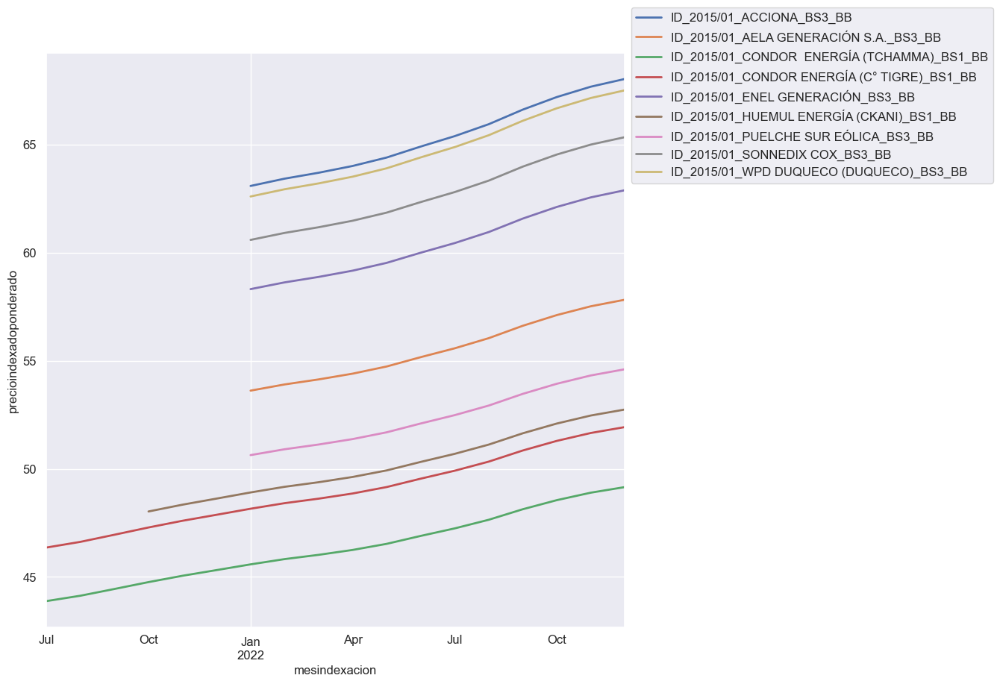

In [279]:
ax=intentograf.plot(linewidth=2,fontsize=12,figsize=(10,10));

ax.set_xlabel('mesindexacion');
ax.set_ylabel('precioindexadoponderado');
ax.legend(fontsize=12,bbox_to_anchor=(1,1.09),loc='upper left')

#   Test de hipótesis

**Dickey-Fuller Test**

Comprueba si existe estacionariedad en una serie de tiempo.

*   $H_{0}$: La serie temporal no es estacionaria.
*   $H_{1}$: La serie de tiempo es estacionaria.

In [280]:
tablaserie=series_tiempo.pivot_table(index='mesindexacion', columns=series_tiempo['unique_id'],values='precioindexadoponderado',aggfunc='sum')

In [281]:
from statsmodels.tsa.stattools import adfuller

In [282]:
#perform augmented Dickey-Fuller test
adfuller(tablaserie['ID_EMEL-SIC 2006/01-2 (EMELECTRIC)_AES GENER_BB_Sur_BB'])

(-1.6567845012441749,
 0.45350455272346024,
 9,
 146,
 {'1%': -3.4759527332353084,
  '5%': -2.881548071241103,
  '10%': -2.577438765246763},
 1030.7802838021294)

Valor p es mayor a 0.05 por lo tanto de acepta la hipótesis nula y no es estacionaria.

In [283]:
alpha=0.05
serie_estacionaria=[]
serie_no_estacionaria=[]


for i in tablaserie:
    tablaserie[i]
    id_serie=tablaserie[i].dropna()
    result=adfuller(id_serie)

    if result[1]<=alpha:
        serie_estacionaria.append(i)

    else:
        serie_no_estacionaria.append(i)


    print(i)
    print('ADF Statistic: %f' % result[0])
    print('p-value: %f' % result[1])
    print('Critical Values:')
    for key, value in result[4].items():
        print('\t%s: %.3f' % (key, value))
    print('****************************')

ID_2015/01_ACCIONA_BS3_BB
ADF Statistic: -10.353300
p-value: 0.000000
Critical Values:
	1%: -4.939
	5%: -3.478
	10%: -2.844
****************************
ID_2015/01_AELA GENERACIÓN S.A._BS3_BB
ADF Statistic: -10.353300
p-value: 0.000000
Critical Values:
	1%: -4.939
	5%: -3.478
	10%: -2.844
****************************
ID_2015/01_BESALCO_BS2C_BB
ADF Statistic: 0.061605
p-value: 0.963340
Critical Values:
	1%: -4.012
	5%: -3.104
	10%: -2.691
****************************
ID_2015/01_CONDOR  ENERGÍA (TCHAMMA)_BS1_BB
ADF Statistic: 2.233016
p-value: 0.998909
Critical Values:
	1%: -4.332
	5%: -3.233
	10%: -2.749
****************************
ID_2015/01_CONDOR ENERGÍA (C° TIGRE)_BS1_BB
ADF Statistic: 2.233016
p-value: 0.998909
Critical Values:
	1%: -4.332
	5%: -3.233
	10%: -2.749
****************************
ID_2015/01_CONDOR ENERGÍA (ESPERANZA)_BS1_BB
ADF Statistic: 0.061605
p-value: 0.963340
Critical Values:
	1%: -4.012
	5%: -3.104
	10%: -2.691
****************************
ID_2015/01_CONDOR ENE

ID_CGED 2008/01_CAMPANARIO_BS1_BV
ADF Statistic: 1.603059
p-value: 0.997867
Critical Values:
	1%: -3.477
	5%: -2.882
	10%: -2.578
****************************
ID_CGED 2008/01_COLBÚN_BS1_BB
ADF Statistic: 1.603059
p-value: 0.997867
Critical Values:
	1%: -3.477
	5%: -2.882
	10%: -2.578
****************************
ID_CGED 2008/01_COLBÚN_BS1_BV
ADF Statistic: 1.603059
p-value: 0.997867
Critical Values:
	1%: -3.477
	5%: -2.882
	10%: -2.578
****************************
ID_CGED 2008/01_ENDESA_BS2_BB
ADF Statistic: 1.603059
p-value: 0.997867
Critical Values:
	1%: -3.477
	5%: -2.882
	10%: -2.578
****************************
ID_CGED 2008/01_ENDESA_BS2_BV
ADF Statistic: 1.603059
p-value: 0.997867
Critical Values:
	1%: -3.477
	5%: -2.882
	10%: -2.578
****************************
ID_CGED 2008/01_M. REDONDO_BS1_BB
ADF Statistic: 1.603059
p-value: 0.997867
Critical Values:
	1%: -3.477
	5%: -2.882
	10%: -2.578
****************************
ID_CGED 2008/01_M. REDONDO_BS1_BV
ADF Statistic: 1.603059
p-va

In [284]:
serie_estacionaria

['ID_2015/01_ACCIONA_BS3_BB',
 'ID_2015/01_AELA GENERACIÓN S.A._BS3_BB',
 'ID_2015/01_ENEL GENERACIÓN_BS3_BB',
 'ID_2015/01_PUELCHE SUR EÓLICA_BS3_BB',
 'ID_2015/01_SONNEDIX COX_BS3_BB',
 'ID_2015/01_WPD DUQUECO (DUQUECO)_BS3_BB']

In [285]:
serie_no_estacionaria

['ID_2015/01_BESALCO_BS2C_BB',
 'ID_2015/01_CONDOR  ENERGÍA (TCHAMMA)_BS1_BB',
 'ID_2015/01_CONDOR ENERGÍA (C° TIGRE)_BS1_BB',
 'ID_2015/01_CONDOR ENERGÍA (ESPERANZA)_BS1_BB',
 'ID_2015/01_CONDOR ENERGÍA (ESPERANZA)_BS2_BB',
 'ID_2015/01_HUEMUL ENERGÍA (CAMAN)_BS1_BB',
 'ID_2015/01_HUEMUL ENERGÍA (CKANI)_BS1_BB',
 'ID_2015/01_HUEMUL ENERGÍA (COIHUE)_BS1_BB',
 'ID_2015/01_IBEREÓLICA CABO LEONES II S.A._BS2_BB',
 'ID_2015/01_IBEREÓLICA CABO LEONES III SPA_BS2A_BB',
 'ID_2015/01_IBEREÓLICA CABO LEONES III SPA_BS2C_BB',
 'ID_2015/01_MARIA ELENA SOLAR_BS2B_BB',
 'ID_2015/01_OPDENERGY_BS1_BB',
 'ID_2015/01_PARQUE EÓLICO CABO LEONES I S.A._BS2A_BB',
 'ID_2015/01_PARQUE EÓLICO CABO LEONES I S.A._BS2C_BB',
 'ID_2015/01_WPD DUQUECO (DUQUECO)_BS2C_BB',
 'ID_2015/01_WPD DUQUECO (STA FE)_BS2C_BB',
 'ID_2015/01_WPD MALLECO (MALLECO II)_BS2A_BB',
 'ID_2015/01_WPD MALLECO (MALLECO II)_BS2C_BB',
 'ID_2015/01_WPD MALLECO (MALLECO II)_BS2_BB',
 'ID_2015/01_WPD MALLECO (MALLECO)_BS2A_BB',
 'ID_2015/01_WPD

#   Grupos series de tiempo

In [286]:
grupo1=['ID_SIC 2013/03_2 (ENELSA)_SAN JUAN SPA._BS3_BB', 
'ID_SIC 2013/03_2 (ENELSA)_EMPRESA ELÉCTRICA CARÉN S.A._BS3_BB',
'ID_SIC 2013/03_2 (ENELSA)_ACCIONA_BS3_BB',
'ID_SIC 2013/03_2 (EMETAL)_SAN UAN SPA._BS3_BB',
'ID_SIC 2013/03_2 (EMETAL)_EMPRESA ELÉCTRICA CARÉN S.A._BS3_BB',
'ID_SIC 2013/03_2 (EMETAL)_ACCIONA_BS3_BB',
'ID_SIC 2013/03_2 (EMELECTRIC)_SAN JUAN SPA._BS3_BB',
'ID_SIC 2013/03_2 (EMELECTRIC)_EMPRESA ELÉCTRICA CARÉN S.A._BS3_BB',
'ID_SIC 2013/03_2 (EMELECTRIC)_ACCIONA_BS3_BB',
'ID_SIC 2013/03_2_SAN JUAN SPA._BS3_BB',
'ID_SIC 2013/03_2_EMPRESA ELÉCTRICA CARÉN S.A._BS3_BB',
'ID_SIC 2013/03_2_ACCIONA_BS3_BB']

In [287]:
grupo2=['ID_SIC 2013/03_2 (ENELSA)_E-CL_BS3_BB','ID_SIC 2013/03_2 (EMETAL)_E-CL_BS3_BB',
'ID_SIC 2013/03_2 (EMELECTRIC)_E-CL_BS3_BB',
'ID_SIC 2013/03_2_E-CL_BS3_BB']

In [288]:
grupo3=['ID_SIC 2013/03_2 (ENELSA)_SANTIAGO SOLAR S.A._BS2B_BB',
'ID_SIC 2013/03_2 (ENELSA)_SAN JUAN SPA._BS2C_BB',
'ID_SIC 2013/03_2 (ENELSA)_SAN JUAN SPA._BS2A_BB',
'ID_SIC 2013/03_2 (ENELSA)_PELUMPÉN S.A._BS2B_BB',
'ID_SIC 2013/03_2 (EMETAL)_SANTIAGO SOLAR S.A._BS2B_BB',
'ID_SIC 2013/03_2 (EMETAL)_SAN JUAN SPA._BS2C_BB',
'ID_SIC 2013/03_2 (EMETAL)_SAN JUAN SPA._BS2A_BB',
'ID_SIC 2013/03_2 (EMETAL)_PELUMPÉN S.A._BS2B_BB',
'ID_SIC 2013/03_2 (EMELECTRIC)_SANTIAGO SOLAR S.A._BS2B_BB',
'ID_SIC 2013/03_2 (EMELECTRIC)_SAN JUAN SPA._BS2C_BB',
'ID_SIC 2013/03_2 (EMELECTRIC)_SAN JUAN SPA._BS2A_BB',
'ID_SIC 2013/03_2 (EMELECTRIC)_PELUMPÉN S.A._BS2B_BB',
'ID_SIC 2013/03_2_SANTIAGO SOLAR S.A._BS2B_BB',
'ID_SIC 2013/03_2_SAN JUAN SPA._BS2C_BB',
'ID_SIC 2013/03_2_SAN JUAN SPA._BS2A_BB',
'ID_SIC 2013/03_2_PELUMPÉN S.A. (POLPAICO)_BS2B_BB',
'ID_SIC 2013/03_2_PELUMPÉN S.A. (COLBÚN)_BS2B_BB',
'ID_SIC 2013/03_2_PELUMPÉN S.A._BS2B_BB',
'ID_2015/02 (ELECDA)_SCB II SPA_BS4B_BB',
'ID_2015/02 (ELECDA)_IBEREOLICA CABO LEONES I S.A._BS4C_BB',
'ID_2015/02 (ELECDA)_IBEREOLICA CABO LEONES I S.A._BS4A_BB',
'ID_2015/02 (ELECDA)_CONSORCIO ABENGOA CHILE S.A., ABENGOA SOLAR CHILE SPA Y ABENGOA SOLAR S.A._BS4C_BB',
'ID_2015/02 (ELECDA)_CONSORCIO ABENGOA CHILE S.A., ABENGOA SOLAR CHILE SPA Y ABENGOA SOLAR S.A._BS4A_BB',
'ID_2015/02 (ELECDA)_AMUNCHE SOLAR SPA_BS4B_BB',
'ID_2015/02 (ELECDA)_AELA GENERACIÓN S.A._BS4C_BB',
'ID_2015/02 (ELECDA)_AELA GENERACIÓN S.A._BS4B_BB',
'ID_2015/02 (ELECDA)_AELA GENERACIÓN S.A._BS4A_BB',
'ID_2015/02_SCB II SPA_BS4B_BB',
'ID_2015/02_IBEREOLICA CABO LEONES I S.A._BS4C_BB',
'ID_2015/02_IBEREOLICA CABO LEONES I S.A._BS4A_BB',
'ID_2015/02_CONSORCIO ABENGOA CHILE S.A., ABENGOA SOLAR CHILE SPA Y ABENGOA SOLAR S.A._BS4C_BB',
'ID_2015/02_CONSORCIO ABENGOA CHILE S.A., ABENGOA SOLAR CHILE SPA Y ABENGOA SOLAR S.A._BS4A_BB',
'ID_2015/02_AMUNCHE SOLAR SPA_BS4B_BB',
'ID_2015/02_AELA GENERACIÓN S.A._BS4C_BB',
'ID_2015/02_AELA GENERACIÓN S.A._BS4B_BB',
'ID_2015/02_AELA GENERACIÓN S.A._BS4A_BB']

In [289]:
grupo4=['ID_SIC 2013/03_2 (ENELSA)_SPV P4 S.A._BS1B_BB',
'ID_SIC 2013/03_2 (ENELSA)_ENERGÍA CERRO EL MORADO S.A._BS1B_BB',
'ID_SIC 2013/03_2 (ENELSA)_EMPRESA ELÉCTRICA ERNC-1 SPA._BS1C_BB',
'ID_SIC 2013/03_2 (ENELSA)_EMPRESA ELÉCTRICA ERNC-1 SPA._BS1B_BB',
'ID_SIC 2013/03_2 (ENELSA)_EMPRESA ELÉCTRICA ERNC-1 SPA._BS1A_BB',
'ID_SIC 2013/03_2 (ENELSA)_EMPRESA ELÉCTRICA CARÉN S.A._BS1C_BB',
'ID_SIC 2013/03_2 (ENELSA)_EMPRESA ELÉCTRICA CARÉN S.A._BS1B_BB',
'ID_SIC 2013/03_2 (ENELSA)_ EMPRESA ELÉCTRICA CARÉN S.A._BS1A_BB',
'ID_SIC 2013/03_2 (ENELSA)_CHUNGUNGO S.A._BS1B_BB',
'ID_SIC 2013/03_2 (EMETAL)_SPV P4 S.S._BS1B_BB',
'ID_SIC 2013/03_2 (EMETAL)_ENERGÍA CERRO EL MORADO S.A._BS1B_BB',
'ID_SIC 2013/03_2 (EMETAL)_EMPRESA ELÉCTRICA ERNC-1 SPA._BS1C_BB',
'ID_SIC 2013/03_2 (EMETAL)_EMPRESA ELÉCTRICA ERNC-1 SPA._BS1B_BB',
'ID_SIC 2013/03_2 (EMETAL)_EMPRESA ELÉCTRICA ERNC-1 SPA._BS1A_BB',
'ID_SIC 2013/03_2 (EMETAL)_EMPRESA ELÉCTRICA CARÉN S.A._BS1C_BB',
'ID_SIC 2013/03_2 (EMETAL)_EMPRESA ELÉCTRICA CARÉN S.A._BS1B_BB',
'ID_SIC 2013/03_2 (EMETAL)_EMPRESA ELÉCTRICA CARÉN S.A._BS1A_BB',
'ID_SIC 2013/03_2 (EMETAL)_CHUNGUNGO S.A._BS1B_BB',
'ID_SIC 2013/03_2 (EMELECTRIC)_SPV P4 S.A._BS1B_BB',
'ID_SIC 2013/03_2 (EMELECTRIC)_ENERGÍA CERRO EL MORADO S.A._BS1B_BB',
'ID_SIC 2013/03_2 (EMELECTRIC)_EMPRESA ELÉCTRICA ERNC-1 SPA._BS1C_BB',
'ID_SIC 2013/03_2 (EMELECTRIC)_EMPRESA ELÉCTRICA ERNC-1 SPA._BS1B_BB',
'ID_SIC 2013/03_2 (EMELECTRIC)_EMPRESA ELÉCTRICA ERNC-1 SPA._BS1A_BB',
'ID_SIC 2013/03_2 (EMELECTRIC)_EMPRESA ELÉCTRICA CARÉN S.A._BS1C_BB',
'ID_SIC 2013/03_2 (EMELECTRIC)_EMPRESA ELÉCTRICA CARÉN S.A._BS1B_BB',
'ID_SIC 2013/03_2 (EMELECTRIC)_EMPRESA ELÉCTRICA CARÉN S.A._BS1A_BB',
'ID_SIC 2013/03_2 (EMELECTRIC)_CHUNGUNGO S.A._BS1B_BB',
'ID_SIC 2013/03_2_SPV P4 S.A._BS1B_BB',
'ID_SIC 2013/03_2_ENERGÍA CERRO EL MORADO S.A._BS1B_BB',
'ID_SIC 2013/03_2_EMPRESA ELÉCTRICA ERNC-1 SPA._BS1C_BB',
'ID_SIC 2013/03_2_EMPRESA ELÉCTRICA ERNC-1 SPA._BS1B_BB',
'ID_SIC 2013/03_2_EMPRESA ELÉCTRICA ERNC-1 SPA._BS1A_BB',
'ID_SIC 2013/03_2_EMPRESA ELÉCTRICA CARÉN S.A._BS1C_BB',
'ID_SIC 2013/03_2_EMPRESA ELÉCTRICA CARÉN S.A._BS1B_BB',
'ID_SIC 2013/03_2_EMPRESA ELÉCTRICA CARÉN S.A._BS1A_BB',
'ID_SIC 2013/03_2_CHUNGUNGO S.A._BS1B_BB']

In [290]:
grupo5=['ID_CHQ 2010/01_PANGUIPULLI_BS6_BV',
'ID_CHQ 2010/01_PANGUIPULLI_BS6_BB']

In [291]:
grupo6=['ID_SIC 2013/03 (ENELSA)_ENDESA_BS1_BV',
'ID_SIC 2013/03 (ENELSA)_ENDESA_BS1_BB',
'ID_SIC 2013/03 (EMETAL)_ENDESA_BS1_BV',
'ID_SIC 2013/03 (EMETAL)_ENDESA_BS1_BB',
'ID_SIC 2013/03 (EMELECTRIC)_ENDESA_BS1_BV',
'ID_SIC 2013/03 (EMELECTRIC)_ENDESA_BS1_BB',
'ID_SIC 2013/03_ENDESA_BS1_BV',
'ID_SIC 2013/03_ENDESA_BS1_BB',
'ID_CHQ 2010/01_PUYEHUE_BS5_BB',
'ID_CHQ 2010/01_PANGUIPULLI_BS5_BV',
'ID_CHQ 2010/01_PANGUIPULLI_BS5_BB']

In [292]:
grupo7=['ID_CHQ 2010/01_ENDESA_BS5_BV',
'ID_CHQ 2010/01_ENDESA_BS5_BB',
'ID_CHL 2010/01_ENDESA_BS1_BV','ID_CHQ 2010/01_ENDESA_BS6_BV',
'ID_CHL 2010/01_ENDESA_BS1_BB','ID_CHQ 2010/01_ENDESA_BS6_BB' ]

In [293]:
grupo8=['ID_SIC 2013/01 (ENELSA)_PANGUIPULLI_BS1_BV',
'ID_SIC 2013/01 (ENELSA)_PANGUIPULLI_BS1_BB',           	
'ID_SIC 2013/01 (EMETAL)_PANGUIPULLI_BS1_BV',           	
'ID_SIC 2013/01 (EMETAL)_PANGUIPULLI_BS1_BB' ,          	
'ID_SIC 2013/01 (EMELECTRIC)_PANGUIPULLI_BS1_BV',       	
'ID_SIC 2013/01 (EMELECTRIC)_PANGUIPULLI_BS1_BB',       	
'ID_SIC 2013/01_PANGUIPULLI_BS1_BV',                     	
'ID_SIC 2013/01_PANGUIPULLI_BS1_BB',                     	
'ID_CHQ 2010/01_PUYEHUE_BS4_BV',                        	
'ID_CHQ 2010/01_PUYEHUE_BS4_BB' ,                      	
'ID_CHQ 2010/01_PANGUIPULLI_BS4_BV',                    	
'ID_CHQ 2010/01_PANGUIPULLI_BS4_BB' ]

In [294]:
grupo9=['ID_SIC 2013/01 (ENELSA)_ENDESA_BS1_BV',
'ID_SIC 2013/01 (ENELSA)_ENDESA_BS1_BB' ,             	
'ID_SIC 2013/01 (EMETAL)_ENDESA_BS1_BV',               	
'ID_SIC 2013/01 (EMETAL)_ENDESA_BS1_BB' ,               	
'ID_SIC 2013/01 (EMELECTRIC)_ENDESA_BS1_BV' ,           	
'ID_SIC 2013/01 (EMELECTRIC)_ENDESA_BS1_BB',            	
'ID_SIC 2013/01_ENDESA_BS1_BV',                        	
'ID_SIC 2013/01_ENDESA_BS1_BB']

In [295]:
grupo10=['ID_CHQ 2010/01_ENDESA_BS4_BV',                        
'ID_CHQ 2010/01_ENDESA_BS4_BB']

In [296]:
grupo11=['ID_EMEL-SING 2008/01 (ELECDA)_E-CL_BS1_BV' ,   
'ID_EMEL-SING 2008/01 (ELECDA)_E-CL_BS1_BB',    
'ID_EMEL-SING 2008/01_E-CL_BS1_BV'  ,           
'ID_EMEL-SING 2008/01E-CL_BS1_BB']

In [297]:
grupo12=['ID_CHL 2006/02-2_AES GENER_BB1_BV',             	
'ID_CHL 2006/02-2_AES GENER_BB1_BB']

In [298]:
grupo13=['ID_EMEL-SIC 2006/01-2 (EMETAL)_AES GENER_BB_Sur_BB' ,      
'ID_EMEL-SIC 2006/01-2 (EMELECTRIC)_AES GENER_BB_Sur_BB'  , 
'ID_EMEL-SIC 2006/01-2_AES GENER_BB_Norte_BB','ID_CHQ 2006/01_AES GENER_BB1_BB'  ]

In [299]:
grupo14=['ID_CHQ 2008/01_ENDESA_BS1_BV',                 	
'ID_CHQ 2008/01_ENDESA_BS1_BB' ,                   
'ID_CHQ 2008/01_AES GENER_BS1_BV' ,             	
'ID_CHQ 2008/01_AES GENER_BS1_BB' ,             	
'ID_CGED 2008/01_M. REDONDO_BS1_BV' ,      	
'ID_CGED 2008/01_M. REDONDO_BS1_BB' ,      	
'ID_CGED 2008/01_ENDESA_BS2_BV' ,          	
'ID_CGED 2008/01_ENDESA_BS2_BB' ,          	
'ID_CGED 2008/01_COLBÚN_BS1_BV' ,          	
'ID_CGED 2008/01_COLBÚN_BS1_BB' ,         	 	
'ID_CGED 2008/01_CAMPANARIO_BS1_BV' ,      	
'ID_CGED 2008/01_CAMPANARIO_BS1_BB']

In [300]:
grupo15=['ID_CHQ 2006/01_ENDESA_BB2_BB' ,             		
'ID_CHQ 2006/01_ENDESA_BB1_BB' ]

In [301]:
grupo16=['ID_SIC 2013/03_2_ABENGOA_BS4_BB',              		
'ID_SIC 2013/03_2_NORVIND_BS4_BB',           		
'ID_SIC 2013/03_2 (EMELECTRIC)_ABENGOA_BS4_BB',   		
'ID_SIC 2013/03_2 (EMELECTRIC)_NORVIND_BS4_BB',    	
'ID_SIC 2013/03_2 (EMETAL)_ABENGOA_BS4_BB',      		
'ID_SIC 2013/03_2 (EMETAL)_NORVIND_BS4_BB',       		
'ID_SIC 2013/03_2 (ENELSA)_ABENGOA_BS4_BB',         	
'ID_SIC 2013/03_2 (ENELSA)_NORVIND_BS4_BB']

In [302]:
grupo17=['ID_SIC 2013/03_2_EL CAMPESINO_BS4_BB',    		
'ID_SIC 2013/03_2 (EMELECTRIC)_EL CAMPESINO_BS4_BB',   	
'ID_SIC 2013/03_2 (EMETAL)_EL CAMPESINO_BS4_BB',     	
'ID_SIC 2013/03_2 (ENELSA)_EL CAMPESINO_BS4_BB']

In [303]:
grupo18=['ID_2015/01_BESALCO_BS2C_BB',               		
'ID_2015/01_CONDOR ENERGÍA (ESPERANZA)_BS1_BB',     	
'ID_2015/01_CONDOR ENERGÍA (ESPERANZA)_BS2_BB',           
'ID_2015/01_HUEMUL ENERGÍA (CAMAN)_BS1_BB',           	
'ID_2015/01_HUEMUL ENERGÍA (COIHUE)_BS1_BB' ,        	
'ID_2015/01_IBEREÓLICA CABO LEONES II S.A._BS2_BB',        
'ID_2015/01_IBEREÓLICA CABO LEONES III SPA_BS2A_BB' ,   	
'ID_2015/01_IBEREÓLICA CABO LEONES III SPA_BS2C_BB' ,     	
'ID_2015/01_MARIA ELENA SOLAR_BS2B_BB' ,           	
'ID_2015/01_OPDENERGY_BS1_BB' ,                    	
'ID_2015/01_PARQUE EÓLICO CABO LEONES I S.A._BS2A_BB'  ,  	
'ID_2015/01_PARQUE EÓLICO CABO LEONES I S.A._BS2C_BB' ,    
'ID_2015/01_WPD DUQUECO (DUQUECO)_BS2C_BB' ,               
'ID_2015/01_WPD DUQUECO (STA FE)_BS2C_BB' ,             	
'ID_2015/01_WPD MALLECO (MALLECO II)_BS2_BB'  ,     
'ID_2015/01_WPD MALLECO (MALLECO II)_BS2A_BB' ,     
'ID_2015/01_WPD MALLECO (MALLECO II)_BS2C_BB',      
'ID_2015/01_WPD MALLECO (MALLECO)_BS2_BB'  ,        
'ID_2015/01_WPD MALLECO (MALLECO)_BS2A_BB' ,        
'ID_2015/01_WPD MALLECO (MALLECO)_BS2C_BB' ,        
'ID_2015/01_WPD NEGRETE_BS2_BB'   ,                 
'ID_2015/01_WPD NEGRETE_BS2A_BB' ,                  
'ID_2015/01_WPD NEGRETE_BS2C_BB']

In [304]:
len(grupo1)+len(grupo2)+len(grupo3)+len(grupo4)+len(grupo5)+len(grupo6)+len(grupo7)+len(grupo8)+len(grupo9)+len(grupo10)+len(grupo11)+len(grupo12)+len(grupo13)+len(grupo14)+len(grupo15)+len(grupo16)+len(grupo17)+len(grupo18)

188

<b>Grupo 1</b>

In [305]:
series_grupo1 = series_tiempo[(series_tiempo['unique_id'] == grupo1[0]) 
                              | (series_tiempo['unique_id'] ==grupo1[1])
                              | (series_tiempo['unique_id'] ==grupo1[2])
                              | (series_tiempo['unique_id'] ==grupo1[3])
                              | (series_tiempo['unique_id'] ==grupo1[4])
                              | (series_tiempo['unique_id'] ==grupo1[5])
                              | (series_tiempo['unique_id'] ==grupo1[6])
                               | (series_tiempo['unique_id'] ==grupo1[7])
                               | (series_tiempo['unique_id'] ==grupo1[8])
                               | (series_tiempo['unique_id'] ==grupo1[9])
                               | (series_tiempo['unique_id'] ==grupo1[10])
                               | (series_tiempo['unique_id'] ==grupo1[11])
                              ]

series_grupo1.head()

,mesindexacion,mesindexacion2,añoindexacion,licitacion,generadora,tipobloque,bloque,decpnudo,tipodecreto,mesreferencia,...,indice_CARBÓN,indice_CARBÓN_6M,indice_CPI,indice_CPI_4M,indice_CPI_6M,indice_CPI_9M,indice_GNL,indice_GNL_4M,indice_GNL_6M,unique_id
5747,2018-01-01,1,2018,SIC 2013/03_2,ACCIONA,BB,BS3,4T/2013,Decreto PN,12,...,0,0,0,0,1,0,0,0,0,ID_SIC 2013/03_2_ACCIONA_BS3_BB
5753,2018-01-01,1,2018,SIC 2013/03_2,EMPRESA ELÉCTRICA CARÉN S.A.,BB,BS3,4T/2013,Decreto PN,12,...,0,0,0,0,1,0,0,0,0,ID_SIC 2013/03_2_EMPRESA ELÉCTRICA CARÉN S.A._...
5763,2018-01-01,1,2018,SIC 2013/03_2,SAN JUAN SPA.,BB,BS3,4T/2013,Decreto PN,12,...,0,0,0,0,1,0,0,0,0,ID_SIC 2013/03_2_SAN JUAN SPA._BS3_BB
5766,2018-01-01,1,2018,SIC 2013/03_2 (EMELECTRIC),ACCIONA,BB,BS3,4T/2013,Decreto PN,12,...,0,0,0,0,1,0,0,0,0,ID_SIC 2013/03_2 (EMELECTRIC)_ACCIONA_BS3_BB
5772,2018-01-01,1,2018,SIC 2013/03_2 (EMELECTRIC),EMPRESA ELÉCTRICA CARÉN S.A.,BB,BS3,4T/2013,Decreto PN,12,...,0,0,0,0,1,0,0,0,0,ID_SIC 2013/03_2 (EMELECTRIC)_EMPRESA ELÉCTRIC...


In [306]:
tablagrupo1=series_grupo1.pivot_table(index='mesindexacion', columns=series_grupo1['unique_id'],values='precioindexadoponderado',aggfunc='sum')

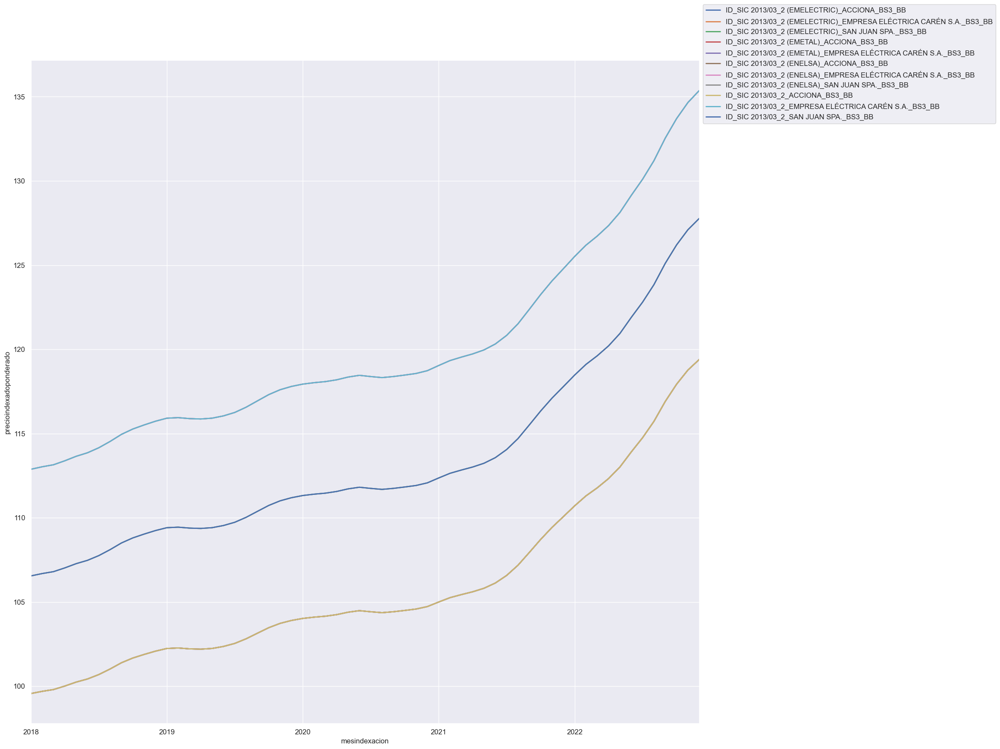

In [307]:
ax=tablagrupo1.plot(linewidth=2,fontsize=12,figsize=(20,20));

ax.set_xlabel('mesindexacion');
ax.set_ylabel('precioindexadoponderado');
ax.legend(fontsize=12,bbox_to_anchor=(1,1.09),loc='upper left')

<b>Grupo 2</b>

In [308]:
series_grupo2 = series_tiempo[(series_tiempo['unique_id'] == grupo2[0]) 
                              | (series_tiempo['unique_id'] ==grupo2[1])
                              | (series_tiempo['unique_id'] ==grupo2[2])
                              | (series_tiempo['unique_id'] ==grupo2[3])
                              ]

series_grupo2.head()

,mesindexacion,mesindexacion2,añoindexacion,licitacion,generadora,tipobloque,bloque,decpnudo,tipodecreto,mesreferencia,...,indice_CARBÓN,indice_CARBÓN_6M,indice_CPI,indice_CPI_4M,indice_CPI_6M,indice_CPI_9M,indice_GNL,indice_GNL_4M,indice_GNL_6M,unique_id
5749,2018-01-01,1,2018,SIC 2013/03_2,E-CL,BB,BS3,4T/2013,Decreto PN,12,...,0,1,0,0,1,0,0,0,1,ID_SIC 2013/03_2_E-CL_BS3_BB
5768,2018-01-01,1,2018,SIC 2013/03_2 (EMELECTRIC),E-CL,BB,BS3,4T/2013,Decreto PN,12,...,0,1,0,0,1,0,0,0,1,ID_SIC 2013/03_2 (EMELECTRIC)_E-CL_BS3_BB
5785,2018-01-01,1,2018,SIC 2013/03_2 (EMETAL),E-CL,BB,BS3,4T/2013,Decreto PN,12,...,0,1,0,0,1,0,0,0,1,ID_SIC 2013/03_2 (EMETAL)_E-CL_BS3_BB
5802,2018-01-01,1,2018,SIC 2013/03_2 (ENELSA),E-CL,BB,BS3,4T/2013,Decreto PN,12,...,0,1,0,0,1,0,0,0,1,ID_SIC 2013/03_2 (ENELSA)_E-CL_BS3_BB
5902,2018-02-01,2,2018,SIC 2013/03_2,E-CL,BB,BS3,4T/2013,Decreto PN,12,...,0,1,0,0,1,0,0,0,1,ID_SIC 2013/03_2_E-CL_BS3_BB


In [309]:
tablagrupo2=series_grupo2.pivot_table(index='mesindexacion', columns=series_grupo2['unique_id'],values='precioindexadoponderado',aggfunc='sum')

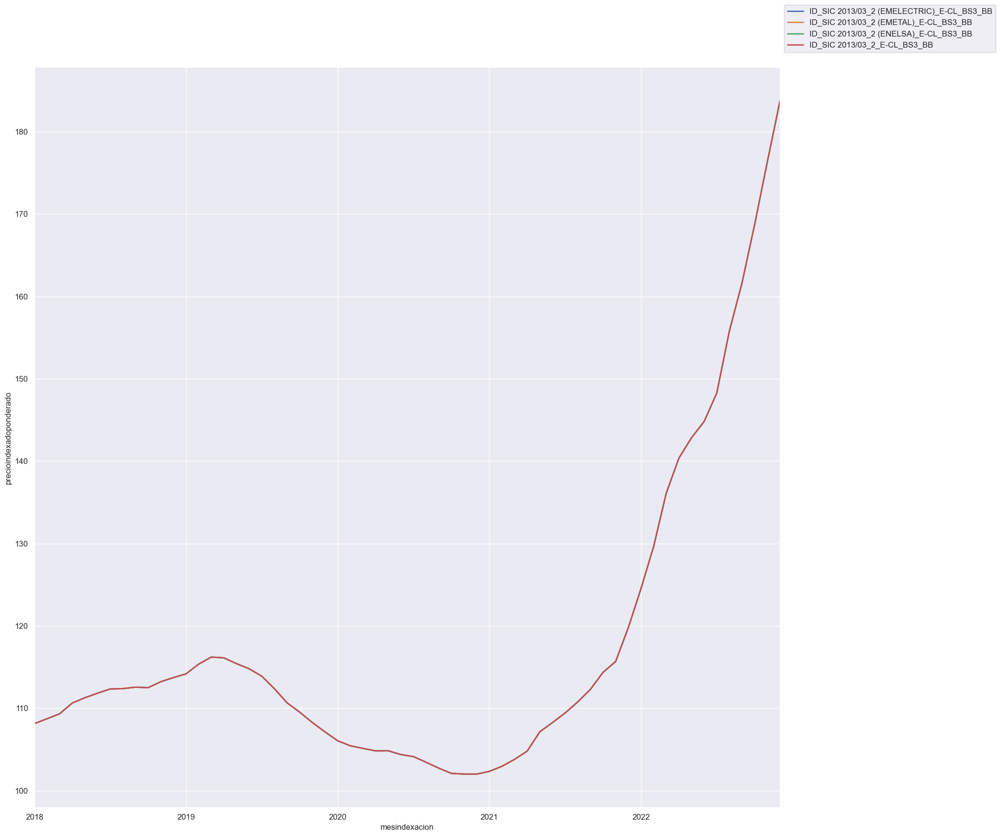

In [310]:
ax=tablagrupo2.plot(linewidth=2,fontsize=12,figsize=(20,20));

ax.set_xlabel('mesindexacion');
ax.set_ylabel('precioindexadoponderado');
ax.legend(fontsize=12,bbox_to_anchor=(1,1.09),loc='upper left')

<b>Grupo 3</b>

In [311]:
len(grupo3)

36

In [312]:
series_grupo3 = series_tiempo[(series_tiempo['unique_id'] == grupo3[0]) 
                              | (series_tiempo['unique_id'] ==grupo3[1])
                              | (series_tiempo['unique_id'] ==grupo3[2])
                              | (series_tiempo['unique_id'] ==grupo3[3])
                              | (series_tiempo['unique_id'] ==grupo3[4])
                              | (series_tiempo['unique_id'] ==grupo3[5])
                              | (series_tiempo['unique_id'] ==grupo3[6])
                               | (series_tiempo['unique_id'] ==grupo3[7])
                               | (series_tiempo['unique_id'] ==grupo3[8])
                               | (series_tiempo['unique_id'] ==grupo3[9])
                               | (series_tiempo['unique_id'] ==grupo3[10])
                               | (series_tiempo['unique_id'] ==grupo3[11])
                              | (series_tiempo['unique_id'] == grupo3[12]) 
                              | (series_tiempo['unique_id'] ==grupo3[13])
                              | (series_tiempo['unique_id'] ==grupo3[14])
                              | (series_tiempo['unique_id'] ==grupo3[15])
                              | (series_tiempo['unique_id'] ==grupo3[16])
                              | (series_tiempo['unique_id'] ==grupo3[17])
                              | (series_tiempo['unique_id'] ==grupo3[18])
                               | (series_tiempo['unique_id'] ==grupo3[19])
                               | (series_tiempo['unique_id'] ==grupo3[20])
                               | (series_tiempo['unique_id'] ==grupo3[21])
                               | (series_tiempo['unique_id'] ==grupo3[22])
                               | (series_tiempo['unique_id'] ==grupo3[23])
                              | (series_tiempo['unique_id'] == grupo3[24]) 
                              | (series_tiempo['unique_id'] ==grupo3[25])
                              | (series_tiempo['unique_id'] ==grupo3[26])
                              | (series_tiempo['unique_id'] ==grupo3[27])
                              | (series_tiempo['unique_id'] ==grupo3[28])
                              | (series_tiempo['unique_id'] ==grupo3[29])
                              | (series_tiempo['unique_id'] ==grupo3[30])
                               | (series_tiempo['unique_id'] ==grupo3[31])
                               | (series_tiempo['unique_id'] ==grupo3[32])
                               | (series_tiempo['unique_id'] ==grupo3[33])
                               | (series_tiempo['unique_id'] ==grupo3[34])
                               | (series_tiempo['unique_id'] ==grupo3[35])
                              ]

series_grupo3.head()

,mesindexacion,mesindexacion2,añoindexacion,licitacion,generadora,tipobloque,bloque,decpnudo,tipodecreto,mesreferencia,...,indice_CARBÓN,indice_CARBÓN_6M,indice_CPI,indice_CPI_4M,indice_CPI_6M,indice_CPI_9M,indice_GNL,indice_GNL_4M,indice_GNL_6M,unique_id
4020,2017-01-01,1,2017,2015/02,AELA GENERACIÓN S.A.,BB,BS4A,10T/2014,Decreto PN,10,...,0,0,0,0,1,0,0,0,0,ID_2015/02_AELA GENERACIÓN S.A._BS4A_BB
4021,2017-01-01,1,2017,2015/02,AELA GENERACIÓN S.A.,BB,BS4B,10T/2014,Decreto PN,10,...,0,0,0,0,1,0,0,0,0,ID_2015/02_AELA GENERACIÓN S.A._BS4B_BB
4022,2017-01-01,1,2017,2015/02,AELA GENERACIÓN S.A.,BB,BS4C,10T/2014,Decreto PN,10,...,0,0,0,0,1,0,0,0,0,ID_2015/02_AELA GENERACIÓN S.A._BS4C_BB
4023,2017-01-01,1,2017,2015/02,AMUNCHE SOLAR SPA,BB,BS4B,10T/2014,Decreto PN,10,...,0,0,0,0,1,0,0,0,0,ID_2015/02_AMUNCHE SOLAR SPA_BS4B_BB
4024,2017-01-01,1,2017,2015/02,"CONSORCIO ABENGOA CHILE S.A., ABENGOA SOLAR CH...",BB,BS4A,10T/2014,Decreto PN,10,...,0,0,0,0,1,0,0,0,0,"ID_2015/02_CONSORCIO ABENGOA CHILE S.A., ABENG..."


In [313]:
tablagrupo3=series_grupo3.pivot_table(index='mesindexacion', columns=series_grupo3['unique_id'],values='precioindexadoponderado',aggfunc='sum')

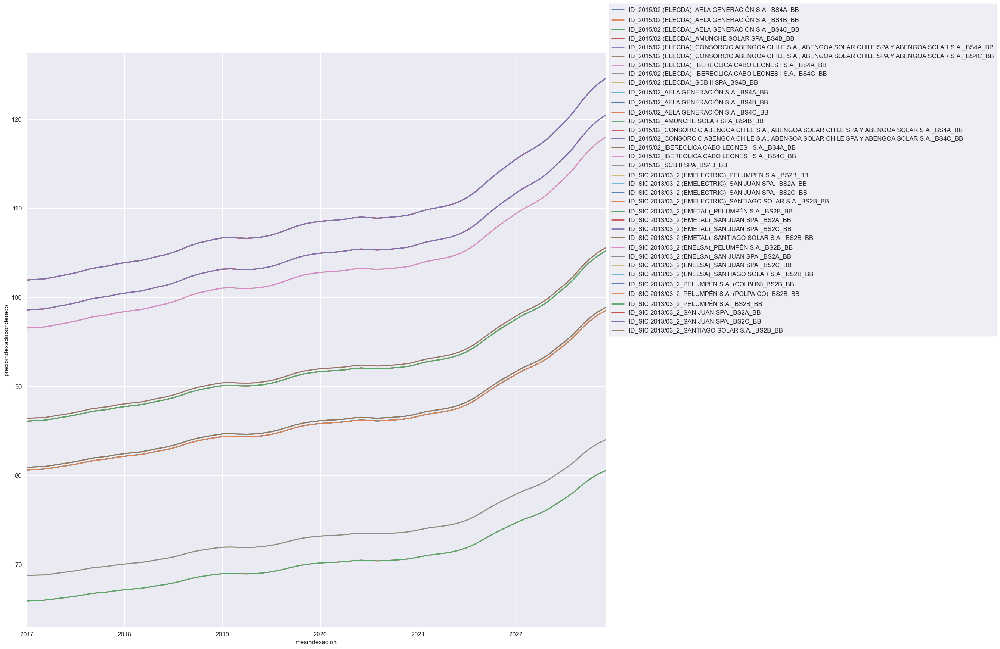

In [314]:
ax=tablagrupo3.plot(linewidth=2,fontsize=12,figsize=(20,20));

ax.set_xlabel('mesindexacion');
ax.set_ylabel('precioindexadoponderado');
ax.legend(fontsize=12,bbox_to_anchor=(1,1.09),loc='upper left')

<b>Grupo 4</b>

In [315]:
series_grupo4 = series_tiempo[(series_tiempo['unique_id'] == grupo4[0]) 
                              | (series_tiempo['unique_id'] ==grupo4[1])
                              | (series_tiempo['unique_id'] ==grupo4[2])
                              | (series_tiempo['unique_id'] ==grupo4[3])
                              | (series_tiempo['unique_id'] ==grupo4[4])
                              | (series_tiempo['unique_id'] ==grupo4[5])
                              | (series_tiempo['unique_id'] ==grupo4[6])
                               | (series_tiempo['unique_id'] ==grupo4[7])
                               | (series_tiempo['unique_id'] ==grupo4[8])
                               | (series_tiempo['unique_id'] ==grupo4[9])
                               | (series_tiempo['unique_id'] ==grupo4[10])
                               | (series_tiempo['unique_id'] ==grupo4[11])
                              | (series_tiempo['unique_id'] == grupo4[12]) 
                              | (series_tiempo['unique_id'] ==grupo4[13])
                              | (series_tiempo['unique_id'] ==grupo4[14])
                              | (series_tiempo['unique_id'] ==grupo4[15])
                              | (series_tiempo['unique_id'] ==grupo4[16])
                              | (series_tiempo['unique_id'] ==grupo4[17])
                              | (series_tiempo['unique_id'] ==grupo4[18])
                               | (series_tiempo['unique_id'] ==grupo4[19])
                               | (series_tiempo['unique_id'] ==grupo4[20])
                               | (series_tiempo['unique_id'] ==grupo4[21])
                               | (series_tiempo['unique_id'] ==grupo4[22])
                               | (series_tiempo['unique_id'] ==grupo4[23])
                              | (series_tiempo['unique_id'] == grupo4[24]) 
                              | (series_tiempo['unique_id'] ==grupo4[25])
                              | (series_tiempo['unique_id'] ==grupo4[26])
                              | (series_tiempo['unique_id'] ==grupo4[27])
                              | (series_tiempo['unique_id'] ==grupo4[28])
                              | (series_tiempo['unique_id'] ==grupo4[29])
                              | (series_tiempo['unique_id'] ==grupo4[30])
                               | (series_tiempo['unique_id'] ==grupo4[31])
                               | (series_tiempo['unique_id'] ==grupo4[32])
                               | (series_tiempo['unique_id'] ==grupo4[33])
                               | (series_tiempo['unique_id'] ==grupo4[34])
                               | (series_tiempo['unique_id'] ==grupo4[35])
                              ]

series_grupo4.head()

,mesindexacion,mesindexacion2,añoindexacion,licitacion,generadora,tipobloque,bloque,decpnudo,tipodecreto,mesreferencia,...,indice_CARBÓN,indice_CARBÓN_6M,indice_CPI,indice_CPI_4M,indice_CPI_6M,indice_CPI_9M,indice_GNL,indice_GNL_4M,indice_GNL_6M,unique_id
2873,2016-01-01,1,2016,SIC 2013/03_2,CHUNGUNGO S.A.,BB,BS1B,4T/2013,Decreto PN,12,...,0,0,0,0,1,0,0,0,0,ID_SIC 2013/03_2_CHUNGUNGO S.A._BS1B_BB
2874,2016-01-01,1,2016,SIC 2013/03_2,EMPRESA ELÉCTRICA CARÉN S.A.,BB,BS1A,4T/2013,Decreto PN,12,...,0,0,0,0,1,0,0,0,0,ID_SIC 2013/03_2_EMPRESA ELÉCTRICA CARÉN S.A._...
2875,2016-01-01,1,2016,SIC 2013/03_2,EMPRESA ELÉCTRICA CARÉN S.A.,BB,BS1B,4T/2013,Decreto PN,12,...,0,0,0,0,1,0,0,0,0,ID_SIC 2013/03_2_EMPRESA ELÉCTRICA CARÉN S.A._...
2876,2016-01-01,1,2016,SIC 2013/03_2,EMPRESA ELÉCTRICA CARÉN S.A.,BB,BS1C,4T/2013,Decreto PN,12,...,0,0,0,0,1,0,0,0,0,ID_SIC 2013/03_2_EMPRESA ELÉCTRICA CARÉN S.A._...
2877,2016-01-01,1,2016,SIC 2013/03_2,EMPRESA ELÉCTRICA ERNC-1 SPA.,BB,BS1A,4T/2013,Decreto PN,12,...,0,0,0,0,1,0,0,0,0,ID_SIC 2013/03_2_EMPRESA ELÉCTRICA ERNC-1 SPA....


In [316]:
tablagrupo4=series_grupo4.pivot_table(index='mesindexacion', columns=series_grupo4['unique_id'],values='precioindexadoponderado',aggfunc='sum')

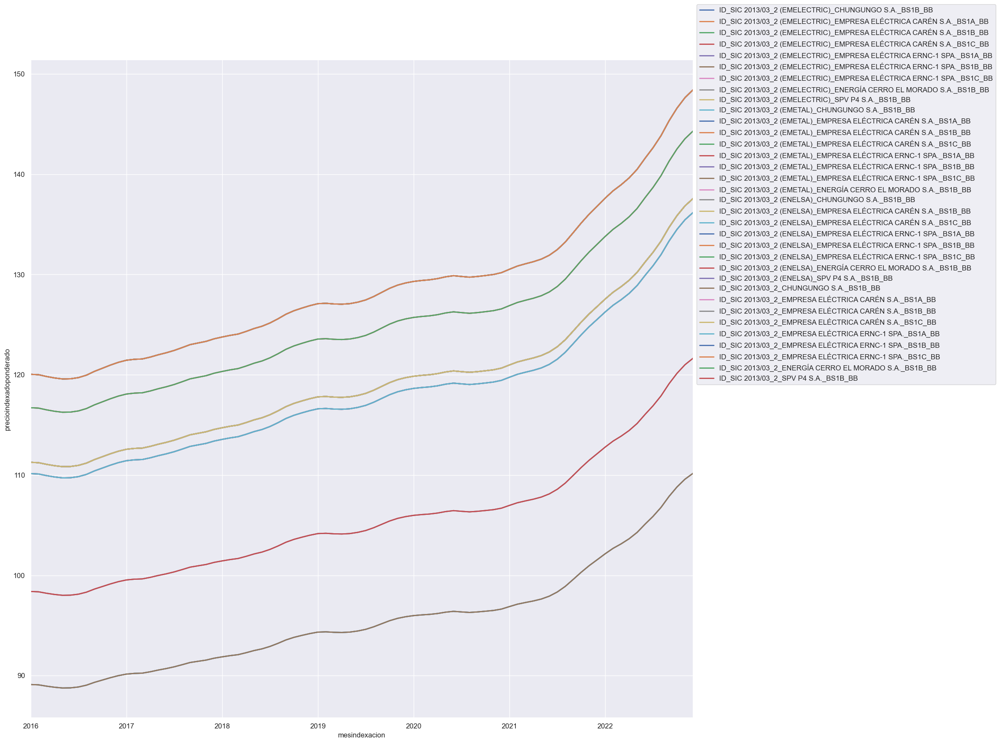

In [317]:
ax=tablagrupo4.plot(linewidth=2,fontsize=12,figsize=(20,20));

ax.set_xlabel('mesindexacion');
ax.set_ylabel('precioindexadoponderado');
ax.legend(fontsize=12,bbox_to_anchor=(1,1.09),loc='upper left')

<b>Grupo 5</b>

In [318]:
series_grupo5 = series_tiempo[(series_tiempo['unique_id'] == grupo5[0]) 
                              | (series_tiempo['unique_id'] ==grupo5[1])
                              ]

series_grupo5.head()

,mesindexacion,mesindexacion2,añoindexacion,licitacion,generadora,tipobloque,bloque,decpnudo,tipodecreto,mesreferencia,...,indice_CARBÓN,indice_CARBÓN_6M,indice_CPI,indice_CPI_4M,indice_CPI_6M,indice_CPI_9M,indice_GNL,indice_GNL_4M,indice_GNL_6M,unique_id
2055,2015-01-01,1,2015,CHQ 2010/01,PANGUIPULLI,BB,BS6,82/2010,Decreto PN,3,...,0,0,0,0,1,0,0,0,0,ID_CHQ 2010/01_PANGUIPULLI_BS6_BB
2058,2015-01-01,1,2015,CHQ 2010/01,PANGUIPULLI,BV,BS6,82/2010,Decreto PN,3,...,0,0,0,0,1,0,0,0,0,ID_CHQ 2010/01_PANGUIPULLI_BS6_BV
2120,2015-02-01,2,2015,CHQ 2010/01,PANGUIPULLI,BB,BS6,82/2010,Decreto PN,3,...,0,0,0,0,1,0,0,0,0,ID_CHQ 2010/01_PANGUIPULLI_BS6_BB
2123,2015-02-01,2,2015,CHQ 2010/01,PANGUIPULLI,BV,BS6,82/2010,Decreto PN,3,...,0,0,0,0,1,0,0,0,0,ID_CHQ 2010/01_PANGUIPULLI_BS6_BV
2185,2015-03-01,3,2015,CHQ 2010/01,PANGUIPULLI,BB,BS6,82/2010,Decreto PN,3,...,0,0,0,0,1,0,0,0,0,ID_CHQ 2010/01_PANGUIPULLI_BS6_BB


In [319]:
tablagrupo5=series_grupo5.pivot_table(index='mesindexacion', columns=series_grupo5['unique_id'],values='precioindexadoponderado',aggfunc='sum')

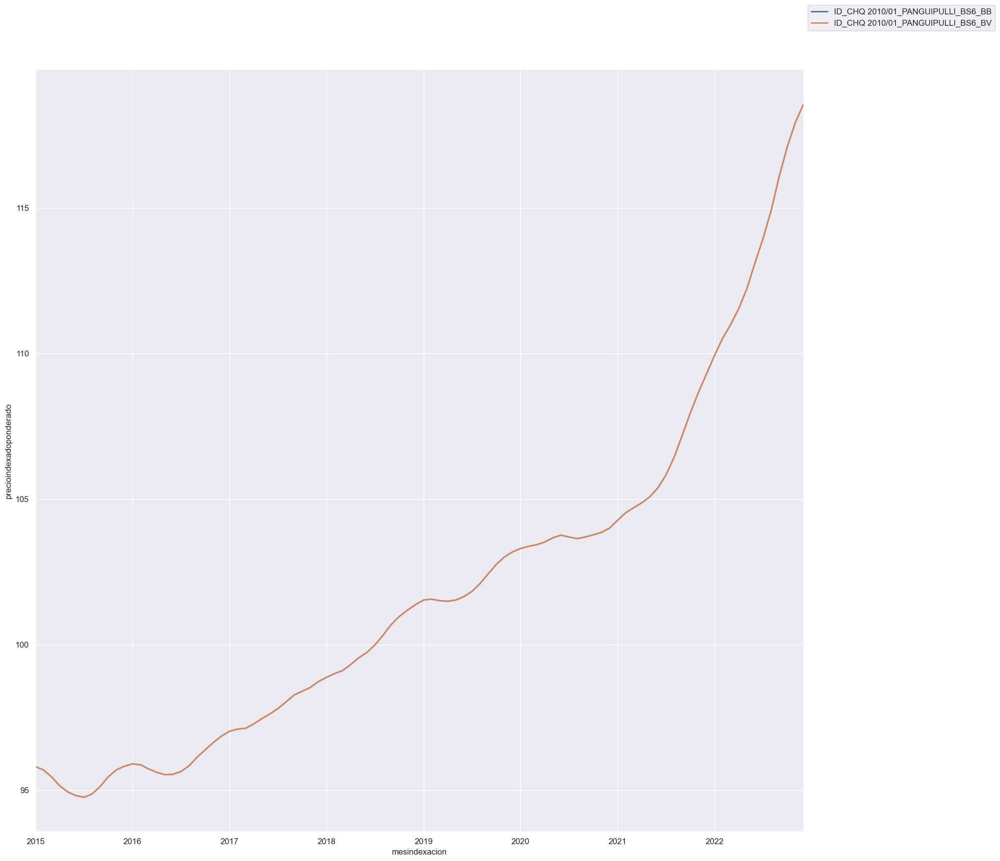

In [320]:
ax=tablagrupo5.plot(linewidth=2,fontsize=12,figsize=(20,20));

ax.set_xlabel('mesindexacion');
ax.set_ylabel('precioindexadoponderado');
ax.legend(fontsize=12,bbox_to_anchor=(1,1.09),loc='upper left')

<b>Grupo 6</b>

In [321]:
series_grupo6 = series_tiempo[(series_tiempo['unique_id'] == grupo6[0]) 
                              | (series_tiempo['unique_id'] ==grupo6[1])
                              | (series_tiempo['unique_id'] ==grupo6[2])
                              | (series_tiempo['unique_id'] ==grupo6[3])
                              | (series_tiempo['unique_id'] ==grupo6[4])
                              | (series_tiempo['unique_id'] ==grupo6[5])
                              | (series_tiempo['unique_id'] ==grupo6[6])
                               | (series_tiempo['unique_id'] ==grupo6[7])
                               | (series_tiempo['unique_id'] ==grupo6[8])
                               | (series_tiempo['unique_id'] ==grupo6[9])
                               | (series_tiempo['unique_id'] ==grupo6[10])
                              ]

series_grupo6.head()

,mesindexacion,mesindexacion2,añoindexacion,licitacion,generadora,tipobloque,bloque,decpnudo,tipodecreto,mesreferencia,...,indice_CARBÓN,indice_CARBÓN_6M,indice_CPI,indice_CPI_4M,indice_CPI_6M,indice_CPI_9M,indice_GNL,indice_GNL_4M,indice_GNL_6M,unique_id
1320,2014-01-01,1,2014,CHQ 2010/01,PANGUIPULLI,BB,BS5,82/2010,Decreto PN,3,...,0,0,0,0,1,0,0,0,0,ID_CHQ 2010/01_PANGUIPULLI_BS5_BB
1322,2014-01-01,1,2014,CHQ 2010/01,PANGUIPULLI,BV,BS5,82/2010,Decreto PN,3,...,0,0,0,0,1,0,0,0,0,ID_CHQ 2010/01_PANGUIPULLI_BS5_BV
1324,2014-01-01,1,2014,CHQ 2010/01,PUYEHUE,BB,BS5,82/2010,Decreto PN,3,...,0,0,0,0,1,0,0,0,0,ID_CHQ 2010/01_PUYEHUE_BS5_BB
1349,2014-01-01,1,2014,SIC 2013/03,ENDESA,BB,BS1,4T/2013,Decreto PN,8,...,0,0,0,0,1,0,0,0,0,ID_SIC 2013/03_ENDESA_BS1_BB
1350,2014-01-01,1,2014,SIC 2013/03,ENDESA,BV,BS1,4T/2013,Decreto PN,8,...,0,0,0,0,1,0,0,0,0,ID_SIC 2013/03_ENDESA_BS1_BV


In [322]:
tablagrupo6=series_grupo6.pivot_table(index='mesindexacion', columns=series_grupo6['unique_id'],values='precioindexadoponderado',aggfunc='sum')

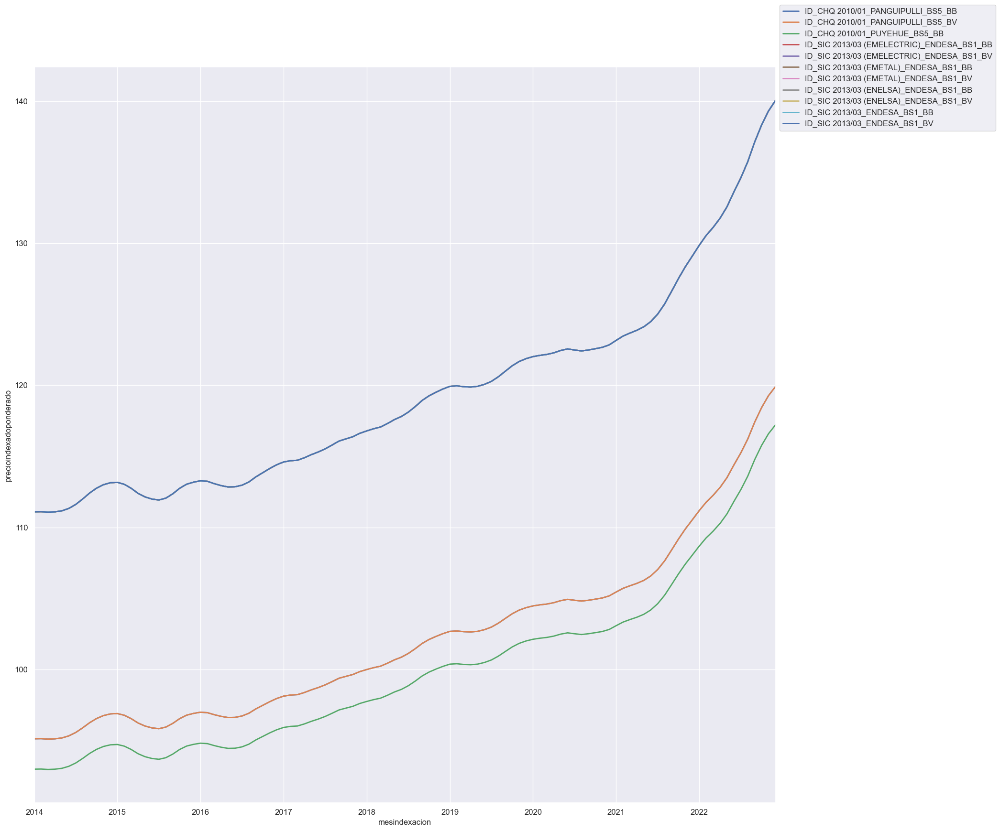

In [323]:
ax=tablagrupo6.plot(linewidth=2,fontsize=12,figsize=(20,20));

ax.set_xlabel('mesindexacion');
ax.set_ylabel('precioindexadoponderado');
ax.legend(fontsize=12,bbox_to_anchor=(1,1.09),loc='upper left')

<b>Grupo 7</b>

In [324]:
series_grupo7 = series_tiempo[(series_tiempo['unique_id'] == grupo7[0]) 
                              | (series_tiempo['unique_id'] ==grupo7[1])
                              | (series_tiempo['unique_id'] ==grupo7[2])
                              | (series_tiempo['unique_id'] ==grupo7[3])
                              | (series_tiempo['unique_id'] ==grupo7[4])
                              | (series_tiempo['unique_id'] ==grupo7[5])
                              ]

series_grupo7.head()

,mesindexacion,mesindexacion2,añoindexacion,licitacion,generadora,tipobloque,bloque,decpnudo,tipodecreto,mesreferencia,...,indice_CARBÓN,indice_CARBÓN_6M,indice_CPI,indice_CPI_4M,indice_CPI_6M,indice_CPI_9M,indice_GNL,indice_GNL_4M,indice_GNL_6M,unique_id
1306,2014-01-01,1,2014,CHL 2010/01,ENDESA,BB,BS1,82/2010,Decreto PN,3,...,0,1,0,0,1,0,0,0,0,ID_CHL 2010/01_ENDESA_BS1_BB
1307,2014-01-01,1,2014,CHL 2010/01,ENDESA,BV,BS1,82/2010,Decreto PN,3,...,0,1,0,0,1,0,0,0,0,ID_CHL 2010/01_ENDESA_BS1_BV
1316,2014-01-01,1,2014,CHQ 2010/01,ENDESA,BB,BS5,82/2010,Decreto PN,3,...,0,1,0,0,1,0,0,0,0,ID_CHQ 2010/01_ENDESA_BS5_BB
1318,2014-01-01,1,2014,CHQ 2010/01,ENDESA,BV,BS5,82/2010,Decreto PN,3,...,0,1,0,0,1,0,0,0,0,ID_CHQ 2010/01_ENDESA_BS5_BV
1367,2014-02-01,2,2014,CHL 2010/01,ENDESA,BB,BS1,82/2010,Decreto PN,3,...,0,1,0,0,1,0,0,0,0,ID_CHL 2010/01_ENDESA_BS1_BB


In [325]:
tablagrupo7=series_grupo7.pivot_table(index='mesindexacion', columns=series_grupo7['unique_id'],values='precioindexadoponderado',aggfunc='sum')

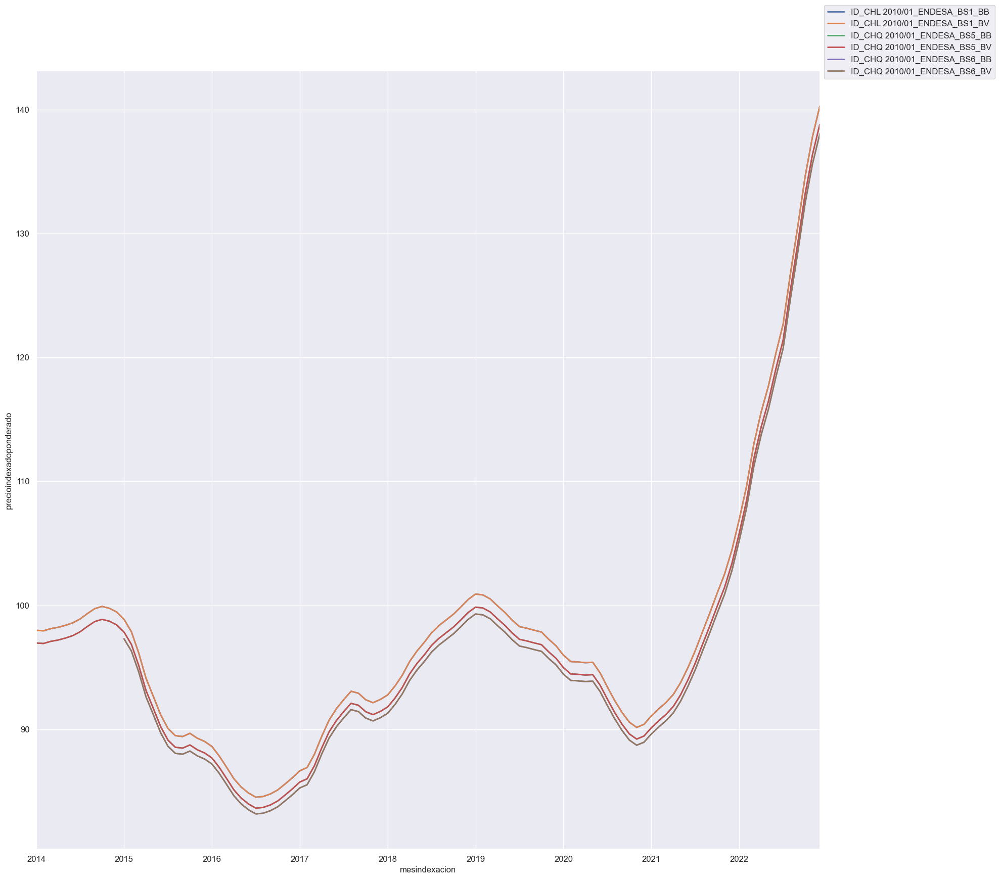

In [326]:
ax=tablagrupo7.plot(linewidth=2,fontsize=12,figsize=(20,20));

ax.set_xlabel('mesindexacion');
ax.set_ylabel('precioindexadoponderado');
ax.legend(fontsize=12,bbox_to_anchor=(1,1.09),loc='upper left')

<b>Grupo 8</b>

In [327]:
series_grupo8 = series_tiempo[(series_tiempo['unique_id'] == grupo8[0]) 
                              | (series_tiempo['unique_id'] ==grupo8[1])
                              | (series_tiempo['unique_id'] ==grupo8[2])
                              | (series_tiempo['unique_id'] ==grupo8[3])
                              | (series_tiempo['unique_id'] ==grupo8[4])
                              | (series_tiempo['unique_id'] ==grupo8[5])
                              | (series_tiempo['unique_id'] ==grupo8[6])
                               | (series_tiempo['unique_id'] ==grupo8[7])
                               | (series_tiempo['unique_id'] ==grupo8[8])
                               | (series_tiempo['unique_id'] ==grupo8[9])
                               | (series_tiempo['unique_id'] ==grupo8[10])
                               | (series_tiempo['unique_id'] ==grupo8[11])
                              ]

series_grupo8.head()

,mesindexacion,mesindexacion2,añoindexacion,licitacion,generadora,tipobloque,bloque,decpnudo,tipodecreto,mesreferencia,...,indice_CARBÓN,indice_CARBÓN_6M,indice_CPI,indice_CPI_4M,indice_CPI_6M,indice_CPI_9M,indice_GNL,indice_GNL_4M,indice_GNL_6M,unique_id
763,2013-01-01,1,2013,CHQ 2010/01,PANGUIPULLI,BB,BS4,82/2010,Decreto PN,3,...,0,0,0,0,1,0,0,0,0,ID_CHQ 2010/01_PANGUIPULLI_BS4_BB
764,2013-01-01,1,2013,CHQ 2010/01,PANGUIPULLI,BV,BS4,82/2010,Decreto PN,3,...,0,0,0,0,1,0,0,0,0,ID_CHQ 2010/01_PANGUIPULLI_BS4_BV
765,2013-01-01,1,2013,CHQ 2010/01,PUYEHUE,BB,BS4,82/2010,Decreto PN,3,...,0,0,0,0,1,0,0,0,0,ID_CHQ 2010/01_PUYEHUE_BS4_BB
766,2013-01-01,1,2013,CHQ 2010/01,PUYEHUE,BV,BS4,82/2010,Decreto PN,3,...,0,0,0,0,1,0,0,0,0,ID_CHQ 2010/01_PUYEHUE_BS4_BV
776,2013-01-01,1,2013,SIC 2013/01,PANGUIPULLI,BB,BS1,107/2012,Decreto PN,11,...,0,0,0,0,1,0,0,0,0,ID_SIC 2013/01_PANGUIPULLI_BS1_BB


In [328]:
tablagrupo8=series_grupo8.pivot_table(index='mesindexacion', columns=series_grupo8['unique_id'],values='precioindexadoponderado',aggfunc='sum')

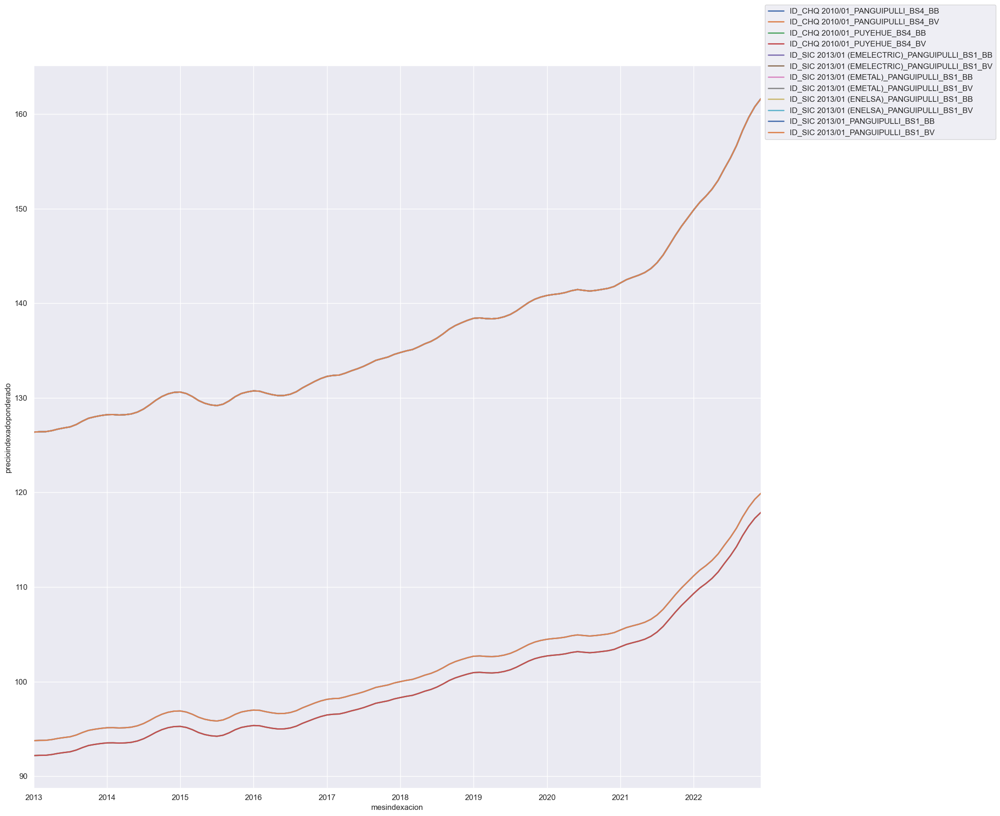

In [329]:
ax=tablagrupo8.plot(linewidth=2,fontsize=12,figsize=(20,20));

ax.set_xlabel('mesindexacion');
ax.set_ylabel('precioindexadoponderado');
ax.legend(fontsize=12,bbox_to_anchor=(1,1.09),loc='upper left')

<b>Grupo 9</b>

In [330]:
series_grupo9 = series_tiempo[(series_tiempo['unique_id'] == grupo9[0]) 
                              | (series_tiempo['unique_id'] ==grupo9[1])
                              | (series_tiempo['unique_id'] ==grupo9[2])
                              | (series_tiempo['unique_id'] ==grupo9[3])
                              | (series_tiempo['unique_id'] ==grupo9[4])
                              | (series_tiempo['unique_id'] ==grupo9[5])
                              | (series_tiempo['unique_id'] ==grupo9[6])
                               | (series_tiempo['unique_id'] ==grupo9[7])
                              ]

series_grupo9.head()

,mesindexacion,mesindexacion2,añoindexacion,licitacion,generadora,tipobloque,bloque,decpnudo,tipodecreto,mesreferencia,...,indice_CARBÓN,indice_CARBÓN_6M,indice_CPI,indice_CPI_4M,indice_CPI_6M,indice_CPI_9M,indice_GNL,indice_GNL_4M,indice_GNL_6M,unique_id
774,2013-01-01,1,2013,SIC 2013/01,ENDESA,BB,BS1,107/2012,Decreto PN,11,...,0,1,0,0,1,0,0,0,1,ID_SIC 2013/01_ENDESA_BS1_BB
775,2013-01-01,1,2013,SIC 2013/01,ENDESA,BV,BS1,107/2012,Decreto PN,11,...,0,1,0,0,1,0,0,0,1,ID_SIC 2013/01_ENDESA_BS1_BV
778,2013-01-01,1,2013,SIC 2013/01 (EMELECTRIC),ENDESA,BB,BS1,107/2012,Decreto PN,11,...,0,1,0,0,1,0,0,0,1,ID_SIC 2013/01 (EMELECTRIC)_ENDESA_BS1_BB
779,2013-01-01,1,2013,SIC 2013/01 (EMELECTRIC),ENDESA,BV,BS1,107/2012,Decreto PN,11,...,0,1,0,0,1,0,0,0,1,ID_SIC 2013/01 (EMELECTRIC)_ENDESA_BS1_BV
782,2013-01-01,1,2013,SIC 2013/01 (EMETAL),ENDESA,BB,BS1,107/2012,Decreto PN,11,...,0,1,0,0,1,0,0,0,1,ID_SIC 2013/01 (EMETAL)_ENDESA_BS1_BB


In [331]:
tablagrupo9=series_grupo9.pivot_table(index='mesindexacion', columns=series_grupo9['unique_id'],values='precioindexadoponderado',aggfunc='sum')

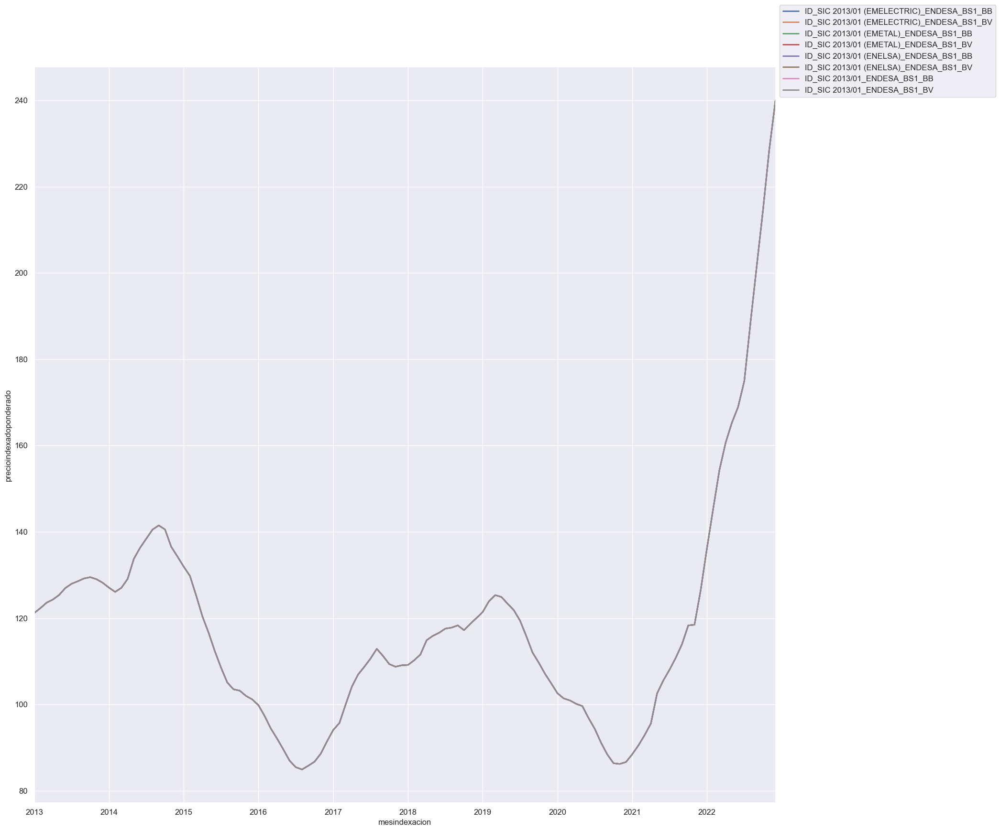

In [332]:
ax=tablagrupo9.plot(linewidth=2,fontsize=12,figsize=(20,20));

ax.set_xlabel('mesindexacion');
ax.set_ylabel('precioindexadoponderado');
ax.legend(fontsize=12,bbox_to_anchor=(1,1.09),loc='upper left')

<b>Grupo 10</b>

In [333]:
series_grupo10 = series_tiempo[(series_tiempo['unique_id'] == grupo10[0]) 
                              | (series_tiempo['unique_id'] ==grupo10[1])
                              ]

series_grupo10.head()

,mesindexacion,mesindexacion2,añoindexacion,licitacion,generadora,tipobloque,bloque,decpnudo,tipodecreto,mesreferencia,...,indice_CARBÓN,indice_CARBÓN_6M,indice_CPI,indice_CPI_4M,indice_CPI_6M,indice_CPI_9M,indice_GNL,indice_GNL_4M,indice_GNL_6M,unique_id
761,2013-01-01,1,2013,CHQ 2010/01,ENDESA,BB,BS4,82/2010,Decreto PN,3,...,0,1,0,0,1,0,0,0,0,ID_CHQ 2010/01_ENDESA_BS4_BB
762,2013-01-01,1,2013,CHQ 2010/01,ENDESA,BV,BS4,82/2010,Decreto PN,3,...,0,1,0,0,1,0,0,0,0,ID_CHQ 2010/01_ENDESA_BS4_BV
807,2013-02-01,2,2013,CHQ 2010/01,ENDESA,BB,BS4,82/2010,Decreto PN,3,...,0,1,0,0,1,0,0,0,0,ID_CHQ 2010/01_ENDESA_BS4_BB
808,2013-02-01,2,2013,CHQ 2010/01,ENDESA,BV,BS4,82/2010,Decreto PN,3,...,0,1,0,0,1,0,0,0,0,ID_CHQ 2010/01_ENDESA_BS4_BV
853,2013-03-01,3,2013,CHQ 2010/01,ENDESA,BB,BS4,82/2010,Decreto PN,3,...,0,1,0,0,1,0,0,0,0,ID_CHQ 2010/01_ENDESA_BS4_BB


In [334]:
tablagrupo10=series_grupo10.pivot_table(index='mesindexacion', columns=series_grupo10['unique_id'],values='precioindexadoponderado',aggfunc='sum')

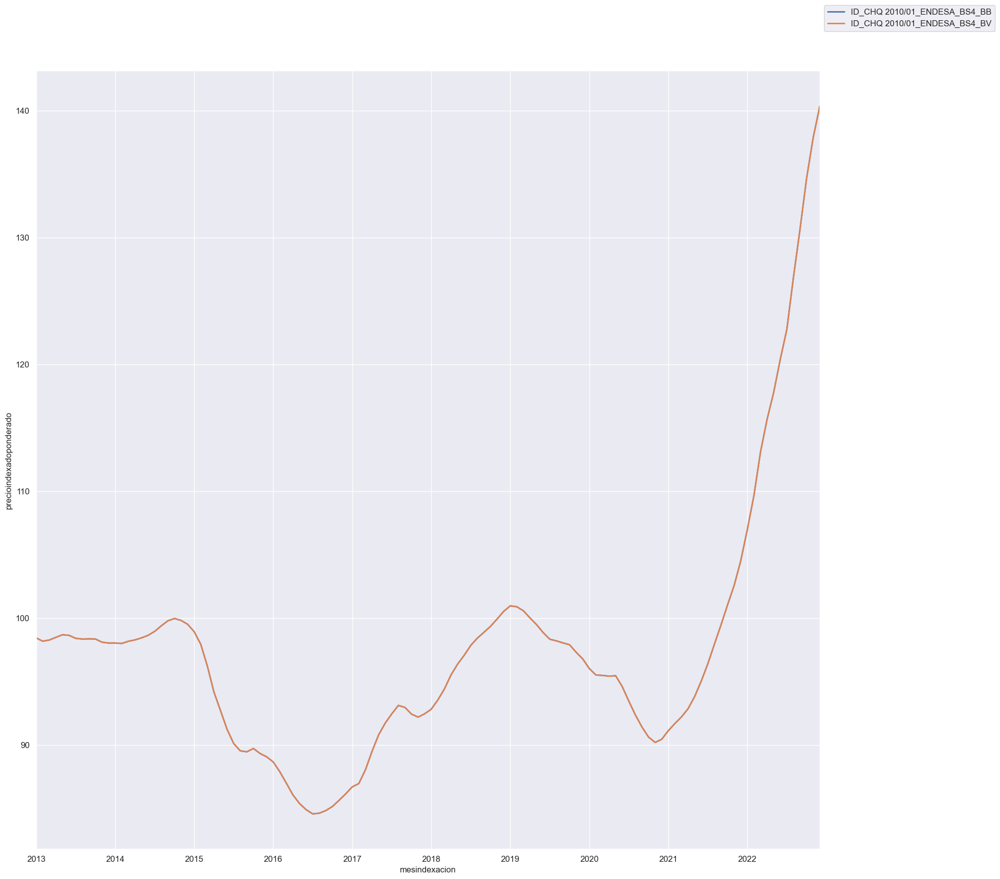

In [335]:
ax=tablagrupo10.plot(linewidth=2,fontsize=12,figsize=(20,20));

ax.set_xlabel('mesindexacion');
ax.set_ylabel('precioindexadoponderado');
ax.legend(fontsize=12,bbox_to_anchor=(1,1.09),loc='upper left')

<b>Grupo 11</b>

In [336]:
series_grupo11 = series_tiempo[(series_tiempo['unique_id'] == grupo11[0]) 
                              | (series_tiempo['unique_id'] ==grupo11[1])
                              | (series_tiempo['unique_id'] ==grupo11[2])
                              | (series_tiempo['unique_id'] ==grupo11[3])
                              ]

series_grupo11.head()

,mesindexacion,mesindexacion2,añoindexacion,licitacion,generadora,tipobloque,bloque,decpnudo,tipodecreto,mesreferencia,...,indice_CARBÓN,indice_CARBÓN_6M,indice_CPI,indice_CPI_4M,indice_CPI_6M,indice_CPI_9M,indice_GNL,indice_GNL_4M,indice_GNL_6M,unique_id
477,2012-01-01,1,2012,EMEL-SING 2008/01,E-CL,BV,BS1,130/2008,Decreto PN SING,9,...,0,0,0,1,0,0,0,1,0,ID_EMEL-SING 2008/01_E-CL_BS1_BV
478,2012-01-01,1,2012,EMEL-SING 2008/01 (ELECDA),E-CL,BB,BS1,130/2008,Decreto PN SING,9,...,0,0,0,1,0,0,0,1,0,ID_EMEL-SING 2008/01 (ELECDA)_E-CL_BS1_BB
479,2012-01-01,1,2012,EMEL-SING 2008/01 (ELECDA),E-CL,BV,BS1,130/2008,Decreto PN SING,9,...,0,0,0,1,0,0,0,1,0,ID_EMEL-SING 2008/01 (ELECDA)_E-CL_BS1_BV
501,2012-02-01,2,2012,EMEL-SING 2008/01,E-CL,BV,BS1,130/2008,Decreto PN SING,9,...,0,0,0,1,0,0,0,1,0,ID_EMEL-SING 2008/01_E-CL_BS1_BV
502,2012-02-01,2,2012,EMEL-SING 2008/01 (ELECDA),E-CL,BB,BS1,130/2008,Decreto PN SING,9,...,0,0,0,1,0,0,0,1,0,ID_EMEL-SING 2008/01 (ELECDA)_E-CL_BS1_BB


In [337]:
tablagrupo11=series_grupo11.pivot_table(index='mesindexacion', columns=series_grupo11['unique_id'],values='precioindexadoponderado',aggfunc='sum')

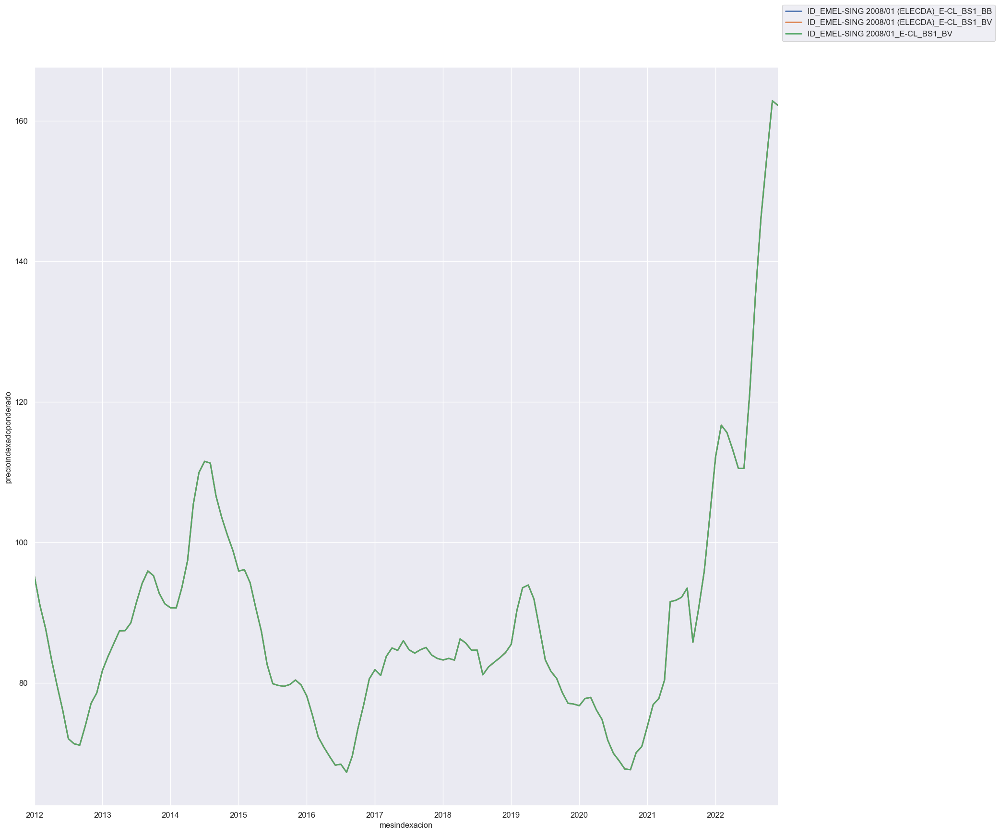

In [338]:
ax=tablagrupo11.plot(linewidth=2,fontsize=12,figsize=(20,20));

ax.set_xlabel('mesindexacion');
ax.set_ylabel('precioindexadoponderado');
ax.legend(fontsize=12,bbox_to_anchor=(1,1.09),loc='upper left')

<b>Grupo 12</b>

In [339]:
series_grupo12 = series_tiempo[(series_tiempo['unique_id'] == grupo12[0]) 
                              | (series_tiempo['unique_id'] ==grupo12[1])
                              ]

series_grupo12.head()

,mesindexacion,mesindexacion2,añoindexacion,licitacion,generadora,tipobloque,bloque,decpnudo,tipodecreto,mesreferencia,...,indice_CARBÓN,indice_CARBÓN_6M,indice_CPI,indice_CPI_4M,indice_CPI_6M,indice_CPI_9M,indice_GNL,indice_GNL_4M,indice_GNL_6M,unique_id
224,2011-01-01,1,2011,CHL 2006/02-2,AES GENER,BB,BB1,147/2006,Decreto PN,10,...,0,0,0,0,1,0,0,0,0,ID_CHL 2006/02-2_AES GENER_BB1_BB
225,2011-01-01,1,2011,CHL 2006/02-2,AES GENER,BV,BB1,147/2006,Decreto PN,10,...,0,0,0,0,1,0,0,0,0,ID_CHL 2006/02-2_AES GENER_BB1_BV
244,2011-02-01,2,2011,CHL 2006/02-2,AES GENER,BB,BB1,147/2006,Decreto PN,10,...,0,0,0,0,1,0,0,0,0,ID_CHL 2006/02-2_AES GENER_BB1_BB
245,2011-02-01,2,2011,CHL 2006/02-2,AES GENER,BV,BB1,147/2006,Decreto PN,10,...,0,0,0,0,1,0,0,0,0,ID_CHL 2006/02-2_AES GENER_BB1_BV
264,2011-03-01,3,2011,CHL 2006/02-2,AES GENER,BB,BB1,147/2006,Decreto PN,10,...,0,0,0,0,1,0,0,0,0,ID_CHL 2006/02-2_AES GENER_BB1_BB


In [340]:
tablagrupo12=series_grupo12.pivot_table(index='mesindexacion', columns=series_grupo12['unique_id'],values='precioindexadoponderado',aggfunc='sum')

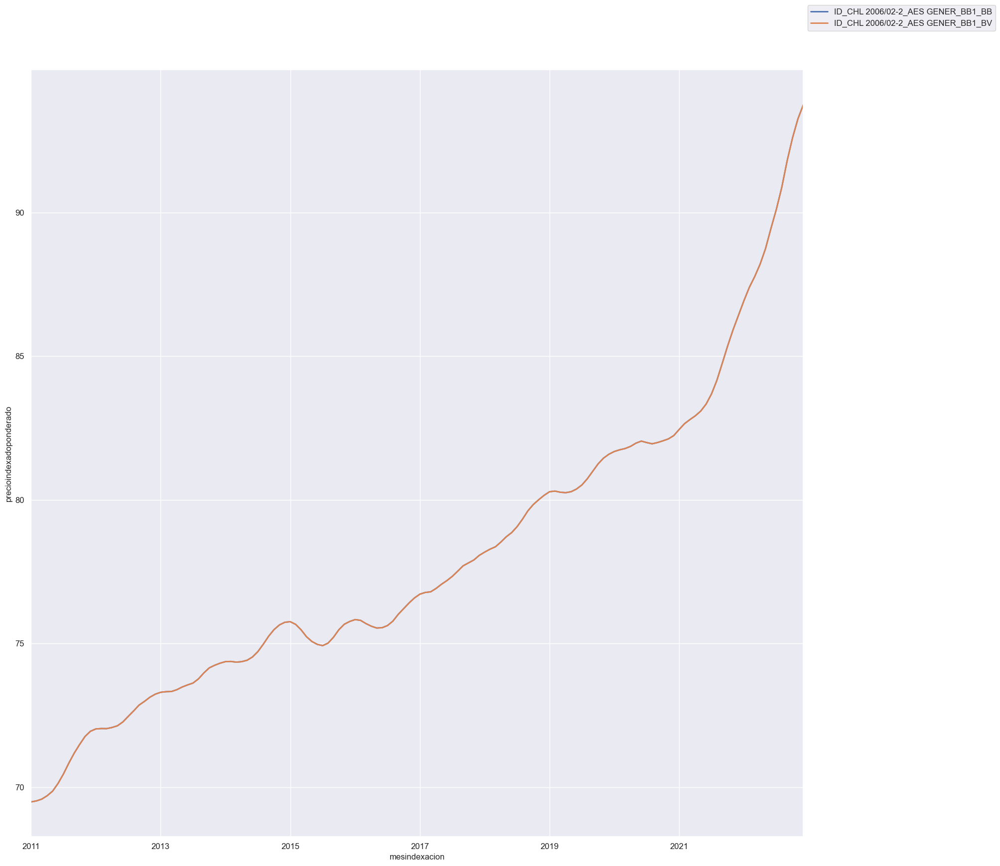

In [341]:
ax=tablagrupo12.plot(linewidth=2,fontsize=12,figsize=(20,20));

ax.set_xlabel('mesindexacion');
ax.set_ylabel('precioindexadoponderado');
ax.legend(fontsize=12,bbox_to_anchor=(1,1.09),loc='upper left')

<b>Grupo 13</b>

In [342]:
series_grupo13 = series_tiempo[(series_tiempo['unique_id'] == grupo13[0]) 
                              | (series_tiempo['unique_id'] ==grupo13[1])
                              | (series_tiempo['unique_id'] ==grupo13[2])
                              | (series_tiempo['unique_id'] ==grupo13[3])
                              ]

series_grupo13.head()

,mesindexacion,mesindexacion2,añoindexacion,licitacion,generadora,tipobloque,bloque,decpnudo,tipodecreto,mesreferencia,...,indice_CARBÓN,indice_CARBÓN_6M,indice_CPI,indice_CPI_4M,indice_CPI_6M,indice_CPI_9M,indice_GNL,indice_GNL_4M,indice_GNL_6M,unique_id
8,2010-01-01,1,2010,CHQ 2006/01,AES GENER,BB,BB1,283/2005,Decreto PN,3,...,1,0,1,0,0,0,0,0,0,ID_CHQ 2006/01_AES GENER_BB1_BB
15,2010-01-01,1,2010,EMEL-SIC 2006/01-2,AES GENER,BB,BB_Norte,283/2005,Decreto PN,3,...,1,0,0,0,0,0,0,0,0,ID_EMEL-SIC 2006/01-2_AES GENER_BB_Norte_BB
16,2010-01-01,1,2010,EMEL-SIC 2006/01-2 (EMELECTRIC),AES GENER,BB,BB_Sur,283/2005,Decreto PN,3,...,1,0,0,0,0,0,0,0,0,ID_EMEL-SIC 2006/01-2 (EMELECTRIC)_AES GENER_B...
17,2010-01-01,1,2010,EMEL-SIC 2006/01-2 (EMETAL),AES GENER,BB,BB_Sur,283/2005,Decreto PN,3,...,1,0,0,0,0,0,0,0,0,ID_EMEL-SIC 2006/01-2 (EMETAL)_AES GENER_BB_Su...
26,2010-02-01,2,2010,CHQ 2006/01,AES GENER,BB,BB1,283/2005,Decreto PN,3,...,1,0,1,0,0,0,0,0,0,ID_CHQ 2006/01_AES GENER_BB1_BB


In [343]:
tablagrupo13=series_grupo13.pivot_table(index='mesindexacion', columns=series_grupo13['unique_id'],values='precioindexadoponderado',aggfunc='sum')

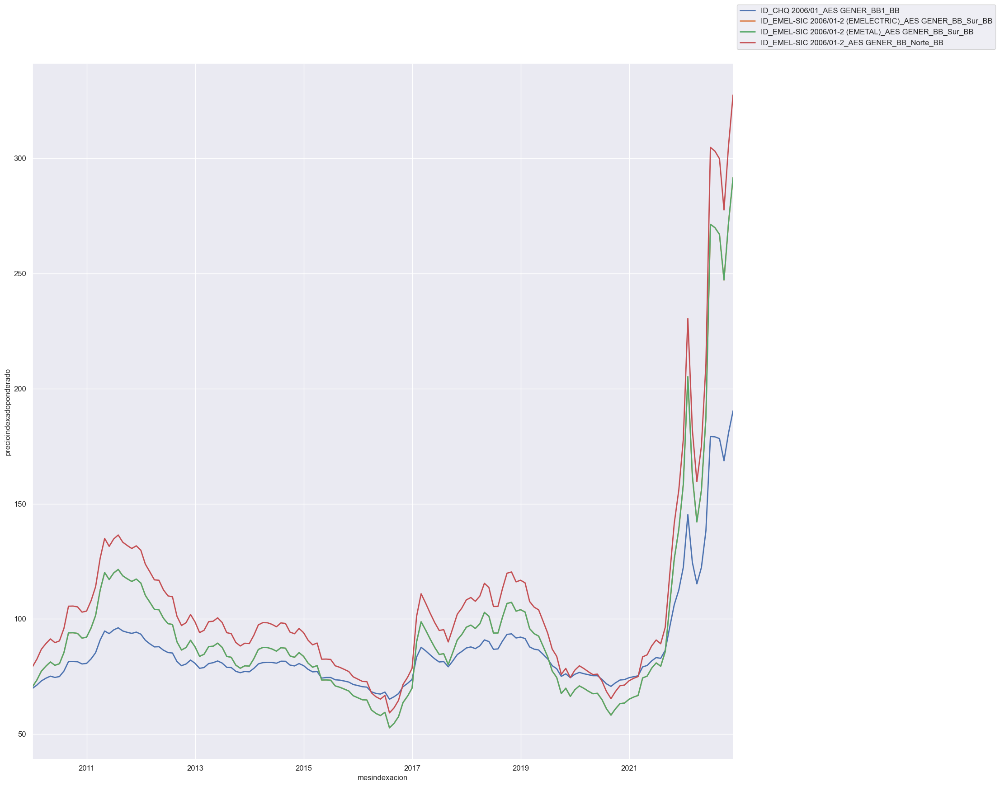

In [344]:
ax=tablagrupo13.plot(linewidth=2,fontsize=12,figsize=(20,20));

ax.set_xlabel('mesindexacion');
ax.set_ylabel('precioindexadoponderado');
ax.legend(fontsize=12,bbox_to_anchor=(1,1.09),loc='upper left')

<b>Grupo 14</b>

In [345]:
series_grupo14 = series_tiempo[(series_tiempo['unique_id'] == grupo14[0]) 
                              | (series_tiempo['unique_id'] ==grupo14[1])
                              | (series_tiempo['unique_id'] ==grupo14[2])
                              | (series_tiempo['unique_id'] ==grupo14[3])
                              | (series_tiempo['unique_id'] ==grupo14[4])
                              | (series_tiempo['unique_id'] ==grupo14[5])
                              | (series_tiempo['unique_id'] ==grupo14[6])
                               | (series_tiempo['unique_id'] ==grupo14[7])
                               | (series_tiempo['unique_id'] ==grupo14[8])
                               | (series_tiempo['unique_id'] ==grupo14[9])
                               | (series_tiempo['unique_id'] ==grupo14[10])
                               | (series_tiempo['unique_id'] ==grupo14[11])
                              ]

series_grupo14.head()

,mesindexacion,mesindexacion2,añoindexacion,licitacion,generadora,tipobloque,bloque,decpnudo,tipodecreto,mesreferencia,...,indice_CARBÓN,indice_CARBÓN_6M,indice_CPI,indice_CPI_4M,indice_CPI_6M,indice_CPI_9M,indice_GNL,indice_GNL_4M,indice_GNL_6M,unique_id
0,2010-01-01,1,2010,CGED 2008/01,CAMPANARIO,BB,BS1,130/2008,Decreto PN,1,...,0,0,0,0,0,1,0,0,0,ID_CGED 2008/01_CAMPANARIO_BS1_BB
1,2010-01-01,1,2010,CGED 2008/01,CAMPANARIO,BV,BS1,130/2008,Decreto PN,1,...,0,0,0,0,0,1,0,0,0,ID_CGED 2008/01_CAMPANARIO_BS1_BV
2,2010-01-01,1,2010,CGED 2008/01,COLBÚN,BB,BS1,130/2008,Decreto PN,1,...,0,0,0,0,0,1,0,0,0,ID_CGED 2008/01_COLBÚN_BS1_BB
3,2010-01-01,1,2010,CGED 2008/01,COLBÚN,BV,BS1,130/2008,Decreto PN,1,...,0,0,0,0,0,1,0,0,0,ID_CGED 2008/01_COLBÚN_BS1_BV
4,2010-01-01,1,2010,CGED 2008/01,ENDESA,BB,BS2,130/2008,Decreto PN,1,...,0,0,0,0,0,1,0,0,0,ID_CGED 2008/01_ENDESA_BS2_BB


In [346]:
tablagrupo14=series_grupo14.pivot_table(index='mesindexacion', columns=series_grupo14['unique_id'],values='precioindexadoponderado',aggfunc='sum')

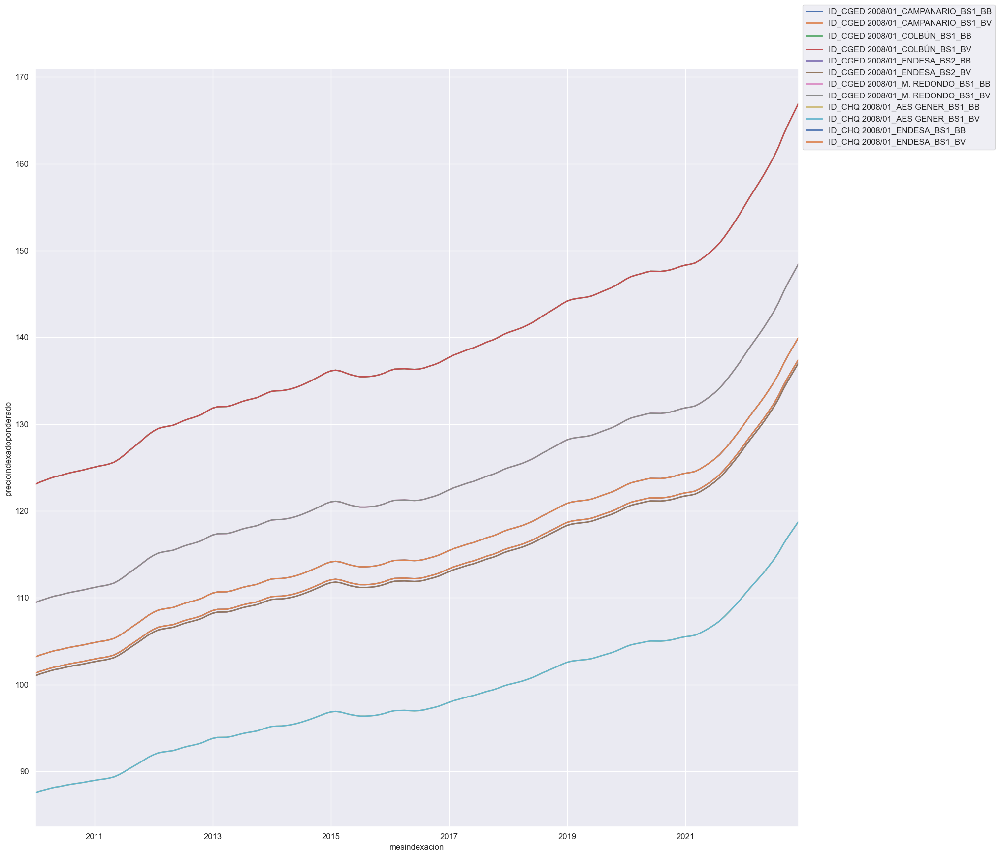

In [347]:
ax=tablagrupo14.plot(linewidth=2,fontsize=12,figsize=(20,20));

ax.set_xlabel('mesindexacion');
ax.set_ylabel('precioindexadoponderado');
ax.legend(fontsize=12,bbox_to_anchor=(1,1.09),loc='upper left')

<b>Grupo 15</b>

In [348]:
series_grupo15 = series_tiempo[(series_tiempo['unique_id'] == grupo15[0]) 
                              | (series_tiempo['unique_id'] ==grupo15[1])
                              ]

series_grupo15.head()

,mesindexacion,mesindexacion2,añoindexacion,licitacion,generadora,tipobloque,bloque,decpnudo,tipodecreto,mesreferencia,...,indice_CARBÓN,indice_CARBÓN_6M,indice_CPI,indice_CPI_4M,indice_CPI_6M,indice_CPI_9M,indice_GNL,indice_GNL_4M,indice_GNL_6M,unique_id
9,2010-01-01,1,2010,CHQ 2006/01,ENDESA,BB,BB1,283/2005,Decreto PN,3,...,1,0,1,0,0,0,1,0,0,ID_CHQ 2006/01_ENDESA_BB1_BB
10,2010-01-01,1,2010,CHQ 2006/01,ENDESA,BB,BB2,283/2005,Decreto PN,3,...,1,0,1,0,0,0,1,0,0,ID_CHQ 2006/01_ENDESA_BB2_BB
27,2010-02-01,2,2010,CHQ 2006/01,ENDESA,BB,BB1,283/2005,Decreto PN,3,...,1,0,1,0,0,0,1,0,0,ID_CHQ 2006/01_ENDESA_BB1_BB
28,2010-02-01,2,2010,CHQ 2006/01,ENDESA,BB,BB2,283/2005,Decreto PN,3,...,1,0,1,0,0,0,1,0,0,ID_CHQ 2006/01_ENDESA_BB2_BB
45,2010-03-01,3,2010,CHQ 2006/01,ENDESA,BB,BB1,283/2005,Decreto PN,3,...,1,0,1,0,0,0,1,0,0,ID_CHQ 2006/01_ENDESA_BB1_BB


In [349]:
tablagrupo15=series_grupo15.pivot_table(index='mesindexacion', columns=series_grupo15['unique_id'],values='precioindexadoponderado',aggfunc='sum')

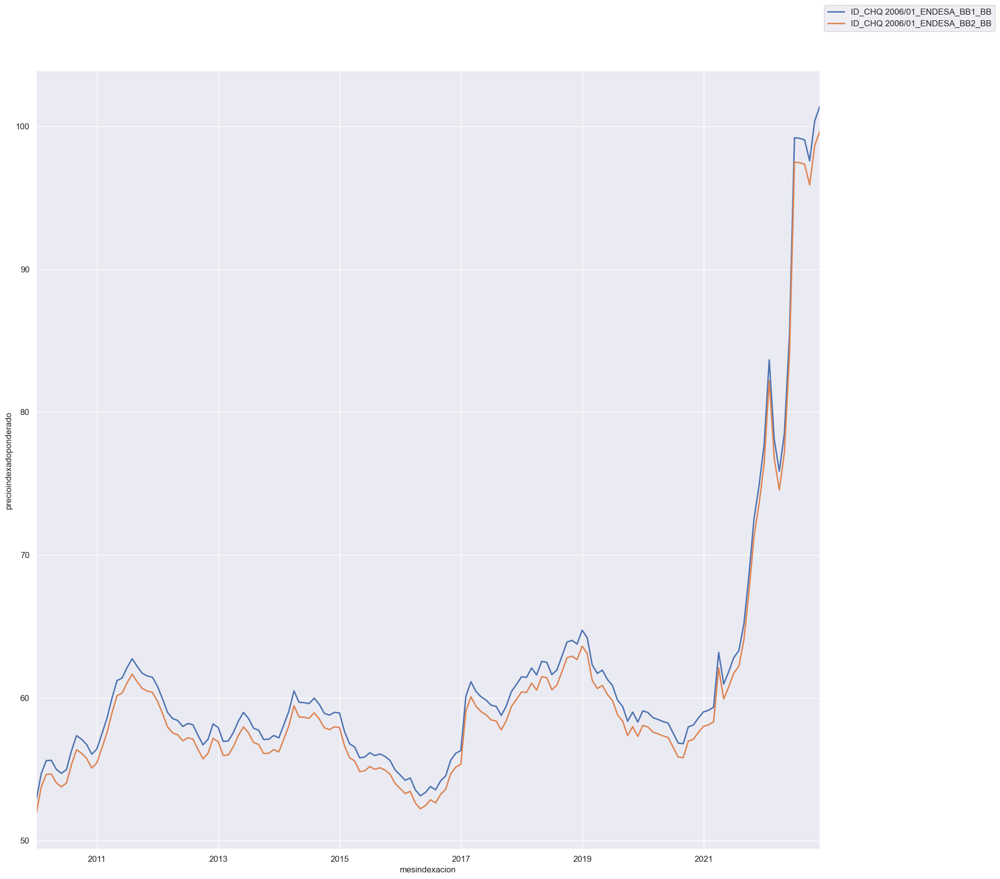

In [350]:
ax=tablagrupo15.plot(linewidth=2,fontsize=12,figsize=(20,20));

ax.set_xlabel('mesindexacion');
ax.set_ylabel('precioindexadoponderado');
ax.legend(fontsize=12,bbox_to_anchor=(1,1.09),loc='upper left')

<b>Grupo 16</b>

In [351]:
series_grupo16 = series_tiempo[(series_tiempo['unique_id'] == grupo16[0]) 
                              | (series_tiempo['unique_id'] ==grupo16[1])
                              | (series_tiempo['unique_id'] ==grupo16[2])
                              | (series_tiempo['unique_id'] ==grupo16[3])
                              | (series_tiempo['unique_id'] ==grupo16[4])
                              | (series_tiempo['unique_id'] ==grupo16[5])
                              | (series_tiempo['unique_id'] ==grupo16[6])
                               | (series_tiempo['unique_id'] ==grupo16[7])
                              ]

series_grupo16.head()

,mesindexacion,mesindexacion2,añoindexacion,licitacion,generadora,tipobloque,bloque,decpnudo,tipodecreto,mesreferencia,...,indice_CARBÓN,indice_CARBÓN_6M,indice_CPI,indice_CPI_4M,indice_CPI_6M,indice_CPI_9M,indice_GNL,indice_GNL_4M,indice_GNL_6M,unique_id
7583,2019-01-01,1,2019,SIC 2013/03_2,ABENGOA,BB,BS4,4T/2013,Decreto PN,12,...,0,0,0,0,1,0,0,0,0,ID_SIC 2013/03_2_ABENGOA_BS4_BB
7596,2019-01-01,1,2019,SIC 2013/03_2,NORVIND,BB,BS4,4T/2013,Decreto PN,12,...,0,0,0,0,1,0,0,0,0,ID_SIC 2013/03_2_NORVIND_BS4_BB
7605,2019-01-01,1,2019,SIC 2013/03_2 (EMELECTRIC),ABENGOA,BB,BS4,4T/2013,Decreto PN,12,...,0,0,0,0,1,0,0,0,0,ID_SIC 2013/03_2 (EMELECTRIC)_ABENGOA_BS4_BB
7618,2019-01-01,1,2019,SIC 2013/03_2 (EMELECTRIC),NORVIND,BB,BS4,4T/2013,Decreto PN,12,...,0,0,0,0,1,0,0,0,0,ID_SIC 2013/03_2 (EMELECTRIC)_NORVIND_BS4_BB
7625,2019-01-01,1,2019,SIC 2013/03_2 (EMETAL),ABENGOA,BB,BS4,4T/2013,Decreto PN,12,...,0,0,0,0,1,0,0,0,0,ID_SIC 2013/03_2 (EMETAL)_ABENGOA_BS4_BB


In [352]:
tablagrupo16=series_grupo16.pivot_table(index='mesindexacion', columns=series_grupo16['unique_id'],values='precioindexadoponderado',aggfunc='sum')

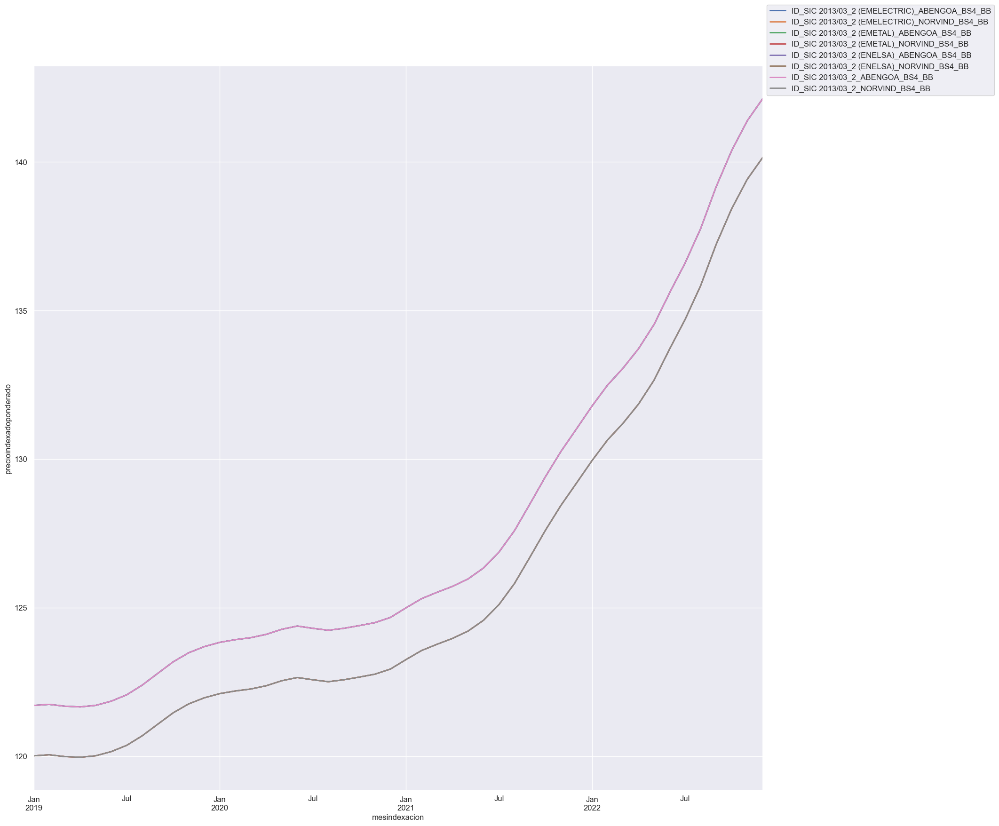

In [353]:
ax=tablagrupo16.plot(linewidth=2,fontsize=12,figsize=(20,20));

ax.set_xlabel('mesindexacion');
ax.set_ylabel('precioindexadoponderado');
ax.legend(fontsize=12,bbox_to_anchor=(1,1.09),loc='upper left')

<b>Grupo 17</b>

In [354]:
series_grupo17 = series_tiempo[(series_tiempo['unique_id'] == grupo17[0]) 
                              | (series_tiempo['unique_id'] ==grupo17[1])
                              | (series_tiempo['unique_id'] ==grupo17[2])
                              | (series_tiempo['unique_id'] ==grupo17[3])
                              ]

series_grupo17.head()

,mesindexacion,mesindexacion2,añoindexacion,licitacion,generadora,tipobloque,bloque,decpnudo,tipodecreto,mesreferencia,...,indice_CARBÓN,indice_CARBÓN_6M,indice_CPI,indice_CPI_4M,indice_CPI_6M,indice_CPI_9M,indice_GNL,indice_GNL_4M,indice_GNL_6M,unique_id
7587,2019-01-01,1,2019,SIC 2013/03_2,EL CAMPESINO,BB,BS4,4T/2013,Decreto PN,12,...,0,0,0,0,1,0,0,0,1,ID_SIC 2013/03_2_EL CAMPESINO_BS4_BB
7609,2019-01-01,1,2019,SIC 2013/03_2 (EMELECTRIC),EL CAMPESINO,BB,BS4,4T/2013,Decreto PN,12,...,0,0,0,0,1,0,0,0,1,ID_SIC 2013/03_2 (EMELECTRIC)_EL CAMPESINO_BS4_BB
7629,2019-01-01,1,2019,SIC 2013/03_2 (EMETAL),EL CAMPESINO,BB,BS4,4T/2013,Decreto PN,12,...,0,0,0,0,1,0,0,0,1,ID_SIC 2013/03_2 (EMETAL)_EL CAMPESINO_BS4_BB
7649,2019-01-01,1,2019,SIC 2013/03_2 (ENELSA),EL CAMPESINO,BB,BS4,4T/2013,Decreto PN,12,...,0,0,0,0,1,0,0,0,1,ID_SIC 2013/03_2 (ENELSA)_EL CAMPESINO_BS4_BB
7752,2019-02-01,2,2019,SIC 2013/03_2,EL CAMPESINO,BB,BS4,4T/2013,Decreto PN,12,...,0,0,0,0,1,0,0,0,1,ID_SIC 2013/03_2_EL CAMPESINO_BS4_BB


In [355]:
tablagrupo17=series_grupo17.pivot_table(index='mesindexacion', columns=series_grupo17['unique_id'],values='precioindexadoponderado',aggfunc='sum')

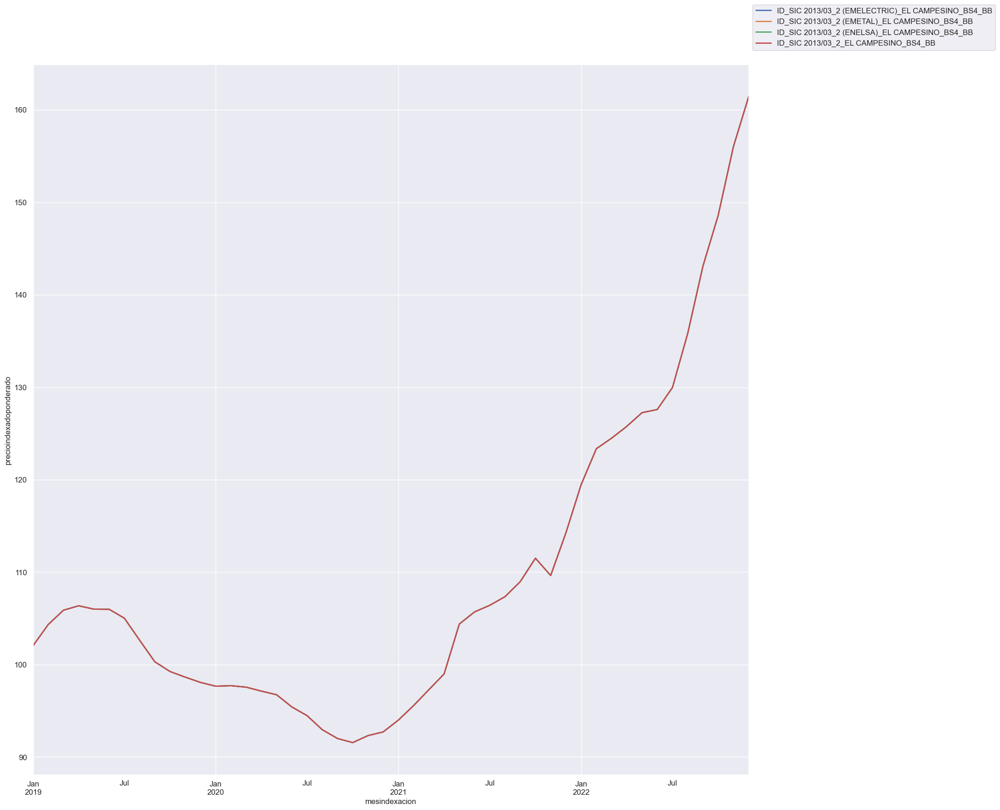

In [356]:
ax=tablagrupo17.plot(linewidth=2,fontsize=12,figsize=(20,20));

ax.set_xlabel('mesindexacion');
ax.set_ylabel('precioindexadoponderado');
ax.legend(fontsize=12,bbox_to_anchor=(1,1.09),loc='upper left')

<b>Grupo 18</b>

In [357]:
series_grupo18 = series_tiempo[(series_tiempo['unique_id'] == grupo18[0]) 
                              | (series_tiempo['unique_id'] ==grupo18[1])
                              | (series_tiempo['unique_id'] ==grupo18[2])
                              | (series_tiempo['unique_id'] ==grupo18[3])
                              | (series_tiempo['unique_id'] ==grupo18[4])
                              | (series_tiempo['unique_id'] ==grupo18[5])
                              | (series_tiempo['unique_id'] ==grupo18[6])
                               | (series_tiempo['unique_id'] ==grupo18[7])
                               | (series_tiempo['unique_id'] ==grupo18[8])
                               | (series_tiempo['unique_id'] ==grupo18[9])
                               | (series_tiempo['unique_id'] ==grupo18[10])
                               | (series_tiempo['unique_id'] ==grupo18[11])
                               | (series_tiempo['unique_id'] ==grupo18[12])
                              | (series_tiempo['unique_id'] ==grupo18[13])
                              | (series_tiempo['unique_id'] ==grupo18[14])
                              | (series_tiempo['unique_id'] ==grupo18[15])
                              | (series_tiempo['unique_id'] ==grupo18[16])
                              | (series_tiempo['unique_id'] ==grupo18[17])
                               | (series_tiempo['unique_id'] ==grupo18[18])
                               | (series_tiempo['unique_id'] ==grupo18[19])
                               | (series_tiempo['unique_id'] ==grupo18[20])
                               | (series_tiempo['unique_id'] ==grupo18[21])
                               | (series_tiempo['unique_id'] ==grupo18[22])
                              ]

series_grupo18.head()

,mesindexacion,mesindexacion2,añoindexacion,licitacion,generadora,tipobloque,bloque,decpnudo,tipodecreto,mesreferencia,...,indice_CARBÓN,indice_CARBÓN_6M,indice_CPI,indice_CPI_4M,indice_CPI_6M,indice_CPI_9M,indice_GNL,indice_GNL_4M,indice_GNL_6M,unique_id
11460,2021-01-01,1,2021,2015/01,BESALCO,BB,BS2C,10T/2014,Decreto PN,7,...,0,0,0,0,1,0,0,0,0,ID_2015/01_BESALCO_BS2C_BB
11461,2021-01-01,1,2021,2015/01,CONDOR ENERGÍA (ESPERANZA),BB,BS1,10T/2014,Decreto PN,7,...,0,0,0,0,1,0,0,0,0,ID_2015/01_CONDOR ENERGÍA (ESPERANZA)_BS1_BB
11462,2021-01-01,1,2021,2015/01,CONDOR ENERGÍA (ESPERANZA),BB,BS2,10T/2014,Decreto PN,7,...,0,0,0,0,1,0,0,0,0,ID_2015/01_CONDOR ENERGÍA (ESPERANZA)_BS2_BB
11463,2021-01-01,1,2021,2015/01,HUEMUL ENERGÍA (CAMAN),BB,BS1,10T/2014,Decreto PN,7,...,0,0,0,0,1,0,0,0,0,ID_2015/01_HUEMUL ENERGÍA (CAMAN)_BS1_BB
11464,2021-01-01,1,2021,2015/01,HUEMUL ENERGÍA (COIHUE),BB,BS1,10T/2014,Decreto PN,7,...,0,0,0,0,1,0,0,0,0,ID_2015/01_HUEMUL ENERGÍA (COIHUE)_BS1_BB


In [358]:
tablagrupo18=series_grupo18.pivot_table(index='mesindexacion', columns=series_grupo18['unique_id'],values='precioindexadoponderado',aggfunc='sum')

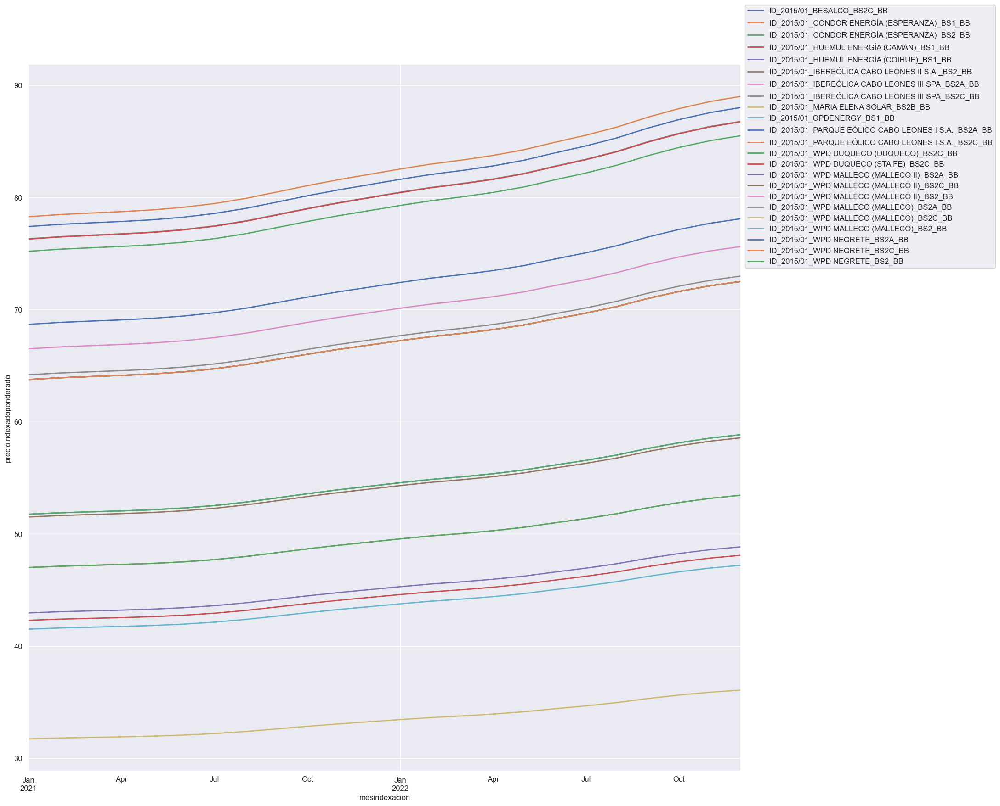

In [359]:
ax=tablagrupo18.plot(linewidth=2,fontsize=12,figsize=(20,20));

ax.set_xlabel('mesindexacion');
ax.set_ylabel('precioindexadoponderado');
ax.legend(fontsize=12,bbox_to_anchor=(1,1.09),loc='upper left')

In [360]:
arima_g13=series_grupo13[['mesindexacion','unique_id','precioindexadoponderado']]
arima_g13.columns = ['ds','unique_id','y']
arima_g13.head()

,ds,unique_id,y
8,2010-01-01,ID_CHQ 2006/01_AES GENER_BB1_BB,69.764658
15,2010-01-01,ID_EMEL-SIC 2006/01-2_AES GENER_BB_Norte_BB,79.104743
16,2010-01-01,ID_EMEL-SIC 2006/01-2 (EMELECTRIC)_AES GENER_B...,70.433561
17,2010-01-01,ID_EMEL-SIC 2006/01-2 (EMETAL)_AES GENER_BB_Su...,70.433561
26,2010-02-01,ID_CHQ 2006/01_AES GENER_BB1_BB,71.240667


In [361]:
train = arima_g13.loc[arima_g13['ds'] < '2017-01-01']
valid = arima_g13.loc[(arima_g13['ds'] >= '2017-01-01')]
h = valid['ds'].nunique()

In [362]:
from statsforecast import StatsForecast
from statsforecast.models import AutoARIMA

model = StatsForecast(models=[AutoARIMA(season_length=12)], freq='M', n_jobs=-1)
model.fit(train)

StatsForecast(models=[AutoARIMA])

In [363]:
p = model.predict(h=h)
p = p.reset_index().merge(valid, on=['ds', 'unique_id'], how='left')


In [364]:
p

,unique_id,ds,AutoARIMA,y
0,ID_CHQ 2006/01_AES GENER_BB1_BB,2016-12-31,72.542946,NaN
1,ID_CHQ 2006/01_AES GENER_BB1_BB,2017-01-31,72.765129,NaN
2,ID_CHQ 2006/01_AES GENER_BB1_BB,2017-02-28,72.852943,NaN
3,ID_CHQ 2006/01_AES GENER_BB1_BB,2017-03-31,72.887650,NaN
4,ID_CHQ 2006/01_AES GENER_BB1_BB,2017-04-30,72.901360,NaN
...,...,...,...,...
283,ID_EMEL-SIC 2006/01-2_AES GENER_BB_Norte_BB,2022-07-31,76.501724,NaN
284,ID_EMEL-SIC 2006/01-2_AES GENER_BB_Norte_BB,2022-08-31,76.501724,NaN
285,ID_EMEL-SIC 2006/01-2_AES GENER_BB_Norte_BB,2022-09-30,76.501724,NaN
286,ID_EMEL-SIC 2006/01-2_AES GENER_BB_Norte_BB,2022-10-31,76.501724,NaN


In [365]:
var_graf=p.pivot_table(index='ds', columns=p['unique_id'],values='AutoARIMA',aggfunc='sum')

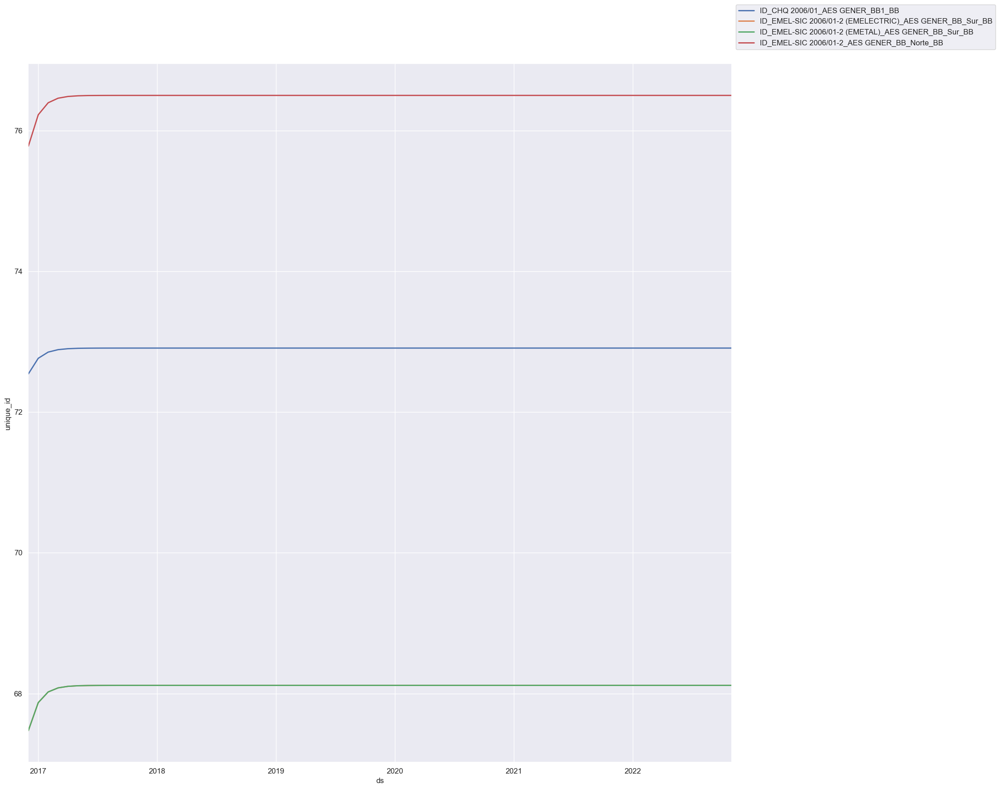

In [366]:
ax=var_graf.plot(linewidth=2,fontsize=12,figsize=(20,20));

ax.set_xlabel('ds');
ax.set_ylabel('unique_id');
ax.legend(fontsize=12,bbox_to_anchor=(1,1.09),loc='upper left')

#   Arima

Serie 1 'ID_CHQ 2008/01_ENDESA_BS1_BV' comportamiento lineal

Estacionariedad

In [367]:
series_grupo14 = series_tiempo[(series_tiempo['unique_id'] == grupo14[0]) 
                              ]

series_grupo14.head()

,mesindexacion,mesindexacion2,añoindexacion,licitacion,generadora,tipobloque,bloque,decpnudo,tipodecreto,mesreferencia,...,indice_CARBÓN,indice_CARBÓN_6M,indice_CPI,indice_CPI_4M,indice_CPI_6M,indice_CPI_9M,indice_GNL,indice_GNL_4M,indice_GNL_6M,unique_id
14,2010-01-01,1,2010,CHQ 2008/01,ENDESA,BV,BS1,130/2008,Decreto PN,1,...,0,0,0,0,0,1,0,0,0,ID_CHQ 2008/01_ENDESA_BS1_BV
32,2010-02-01,2,2010,CHQ 2008/01,ENDESA,BV,BS1,130/2008,Decreto PN,1,...,0,0,0,0,0,1,0,0,0,ID_CHQ 2008/01_ENDESA_BS1_BV
50,2010-03-01,3,2010,CHQ 2008/01,ENDESA,BV,BS1,130/2008,Decreto PN,1,...,0,0,0,0,0,1,0,0,0,ID_CHQ 2008/01_ENDESA_BS1_BV
68,2010-04-01,4,2010,CHQ 2008/01,ENDESA,BV,BS1,130/2008,Decreto PN,1,...,0,0,0,0,0,1,0,0,0,ID_CHQ 2008/01_ENDESA_BS1_BV
86,2010-05-01,5,2010,CHQ 2008/01,ENDESA,BV,BS1,130/2008,Decreto PN,1,...,0,0,0,0,0,1,0,0,0,ID_CHQ 2008/01_ENDESA_BS1_BV


In [368]:
tablagrupo14=series_grupo14.pivot_table(index='mesindexacion', columns=series_grupo14['unique_id'],values='precioindexadoponderado',aggfunc='sum')

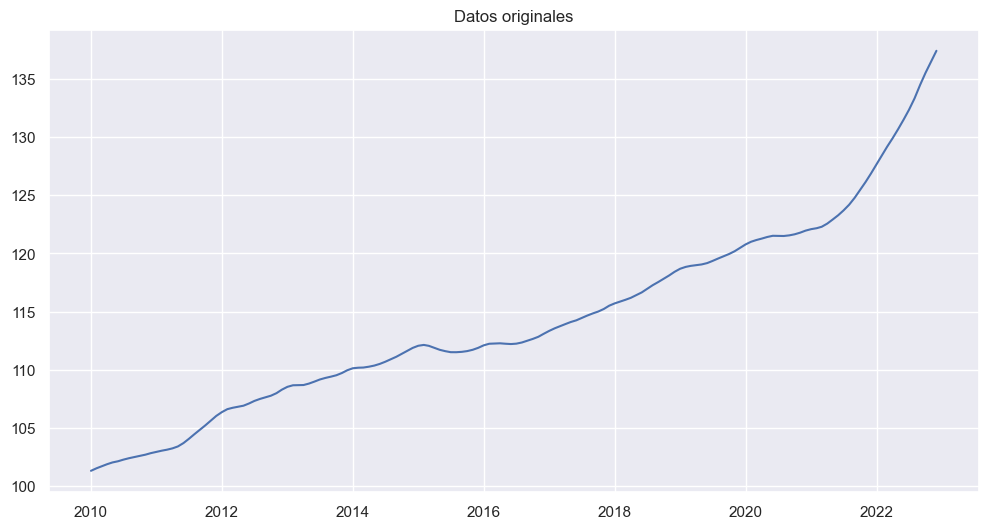

In [369]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Visualiza los datos originales
plt.figure(figsize=(12, 6))
plt.plot(tablagrupo14)
plt.title("Datos originales")
plt.show()

In [370]:
tabla_estandar = tablagrupo14.reset_index()
print(tabla_estandar)

unique_id mesindexacion  ID_CHQ 2008/01_ENDESA_BS1_BV
0            2010-01-01                    101.309840
1            2010-02-01                    101.527043
2            2010-03-01                    101.697027
3            2010-04-01                    101.877872
4            2010-05-01                    102.028969
..                  ...                           ...
151          2022-08-01                    133.333983
152          2022-09-01                    134.488461
153          2022-10-01                    135.521117
154          2022-11-01                    136.477280
155          2022-12-01                    137.422111

[156 rows x 2 columns]


In [371]:
tabla_estandar.columns

Index(['mesindexacion', 'ID_CHQ 2008/01_ENDESA_BS1_BV'], dtype='object', name='unique_id')

Se aplica diferenciación para que la serie sea estacionaria

In [372]:
# Aplica la diferenciación de primer orden
tabla_estandar['Diferencia'] = tabla_estandar['ID_CHQ 2008/01_ENDESA_BS1_BV'].diff()
tabla_estandar['Diferencia2'] = tabla_estandar['Diferencia'].diff()
tabla_estandar['Diferencia3'] = tabla_estandar['Diferencia2'].diff()

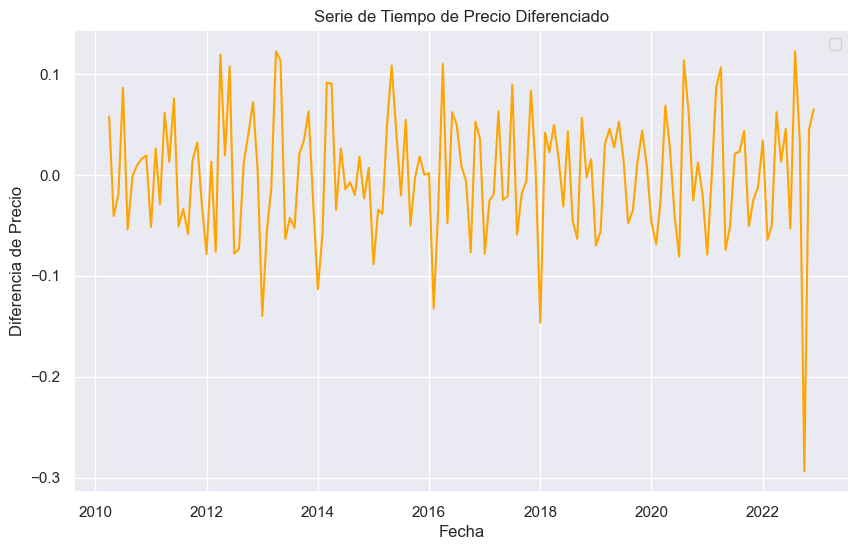

In [373]:
plt.figure(figsize=(10, 6))
plt.plot(tabla_estandar['mesindexacion'], tabla_estandar['Diferencia3'], color='orange')
plt.title('Serie de Tiempo de Precio Diferenciado')
plt.xlabel('Fecha')
plt.ylabel('Diferencia de Precio')
plt.legend()
plt.show()

In [374]:
tabla_estandar

unique_id,mesindexacion,ID_CHQ 2008/01_ENDESA_BS1_BV,Diferencia,Diferencia2,Diferencia3
0,2010-01-01,101.309840,NaN,NaN,NaN
1,2010-02-01,101.527043,0.217202,NaN,NaN
2,2010-03-01,101.697027,0.169985,-0.047218,NaN
3,2010-04-01,101.877872,0.180845,0.010860,0.058078
4,2010-05-01,102.028969,0.151097,-0.029747,-0.040607
...,...,...,...,...,...
151,2022-08-01,133.333983,0.982605,0.137876,0.122767
152,2022-09-01,134.488461,1.154478,0.171873,0.033997
153,2022-10-01,135.521117,1.032656,-0.121822,-0.293696
154,2022-11-01,136.477280,0.956163,-0.076493,0.045329


Recién en la diferenciación de orden 3 se vuelve estacionaria comprobando con el test de Dickey-Fuller

In [375]:
from statsmodels.tsa.stattools import adfuller
# Realiza el test de Dickey-Fuller
result = adfuller( tabla_estandar['Diferencia3'].iloc[4:])

# Imprime los resultados del test
print('Estadística de Dickey-Fuller:', result[0])
print('Valor p:', result[1])
print('Valores críticos:', result[4])
print('Número de retrasos utilizados:', result[2])
print('Número de observaciones utilizadas:', result[3])

# Interpreta los resultados
if result[1] <= 0.05:
    print('La serie temporal es estacionaria (rechazamos la hipótesis nula)')
else:
    print('La serie temporal no es estacionaria (no podemos rechazar la hipótesis nula)')

Estadística de Dickey-Fuller: -8.270192095779342
Valor p: 4.816494324865927e-13
Valores críticos: {'1%': -3.4776006742422374, '5%': -2.882265832283648, '10%': -2.5778219289774156}
Número de retrasos utilizados: 10
Número de observaciones utilizadas: 141
La serie temporal es estacionaria (rechazamos la hipótesis nula)


In [376]:
#importar librerías
import os

import pandas as pd

import matplotlib.pyplot as plt

import plotly.graph_objects as go

from statsmodels.graphics.tsaplots import plot_acf

from statsmodels.tsa.stattools import acf

import pmdarima as pm

import plotly.io as pio

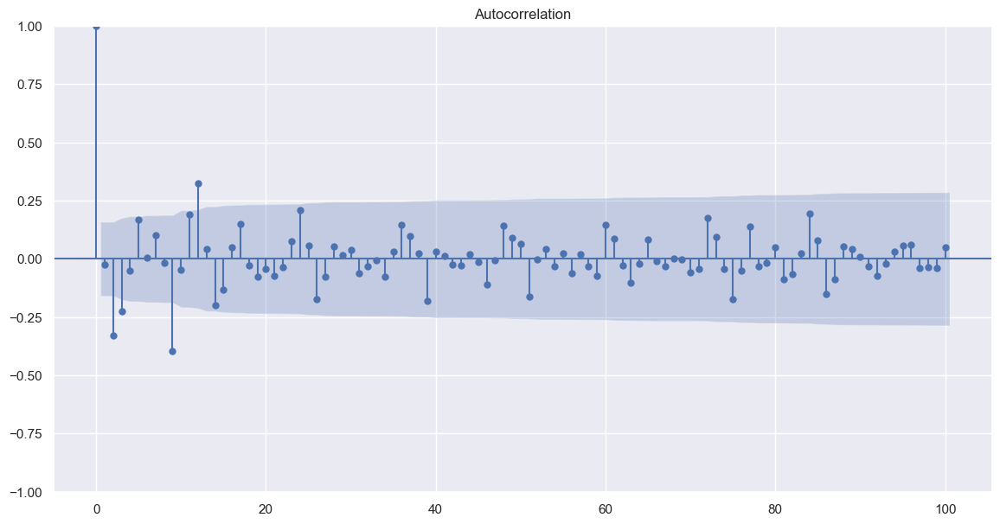

In [412]:
#realizar grafico acf
plot_acf(tabla_estandar['Diferencia3'].iloc[4:],lags=100)
plt.show()

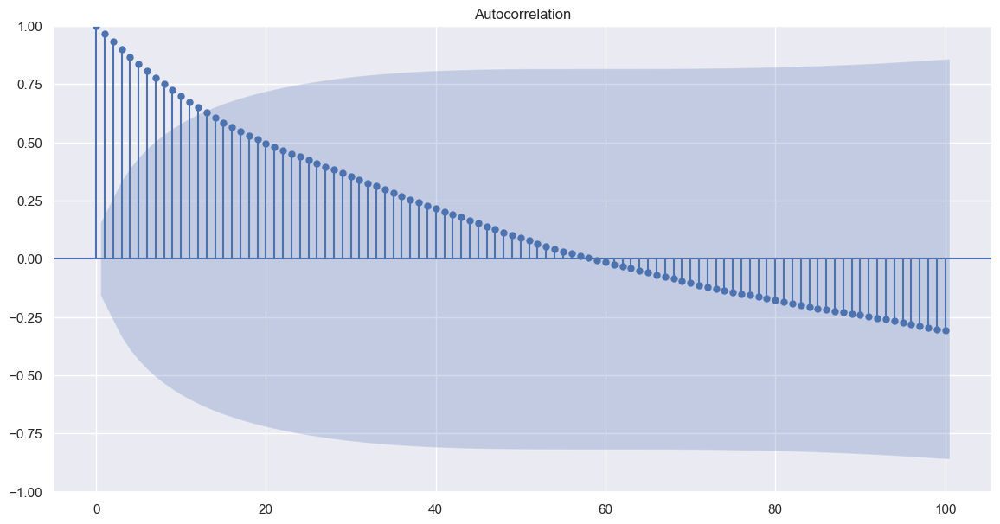

In [411]:
#realizar grafico acf
plot_acf(tabla_estandar['ID_CHQ 2008/01_ENDESA_BS1_BV'],lags=100)
plt.show()

In [378]:
#obtener datos acf para ver exactamente en donde esta el maximo
acf_data=acf(tabla_estandar['Diferencia3'].iloc[4:],nlags=400)

acf_data=pd.DataFrame(acf_data,columns=['acf'])

print(acf_data.head(60))

         acf
0   1.000000
1  -0.025991
2  -0.329377
3  -0.223899
4  -0.050336
5   0.168101
6   0.005564
7   0.101892
8  -0.016774
9  -0.396949
10 -0.046458
11  0.188738
12  0.324670
13  0.040964
14 -0.199878
15 -0.131681
16  0.050147
17  0.149235
18 -0.027007
19 -0.075583
20 -0.043524
21 -0.074292
22 -0.034802
23  0.077114
24  0.207518
25  0.055032
26 -0.174865
27 -0.076459
28  0.052040
29  0.014893
30  0.037948
31 -0.061045
32 -0.032362
33 -0.008137
34 -0.075482
35  0.031589
36  0.144304
37  0.097734
38  0.022142
39 -0.181372
40  0.029455
41  0.012004
42 -0.023998
43 -0.030108
44  0.020540
45 -0.013885
46 -0.110112
47 -0.005222
48  0.141350
49  0.088380
50  0.064532
51 -0.162672
52 -0.002353
53  0.043101
54 -0.033696
55  0.023397
56 -0.063655
57  0.018277
58 -0.033699
59 -0.071655


Hasta el momento ARIMA(5,3,4)

In [379]:
tabla_estandar

unique_id,mesindexacion,ID_CHQ 2008/01_ENDESA_BS1_BV,Diferencia,Diferencia2,Diferencia3
0,2010-01-01,101.309840,NaN,NaN,NaN
1,2010-02-01,101.527043,0.217202,NaN,NaN
2,2010-03-01,101.697027,0.169985,-0.047218,NaN
3,2010-04-01,101.877872,0.180845,0.010860,0.058078
4,2010-05-01,102.028969,0.151097,-0.029747,-0.040607
...,...,...,...,...,...
151,2022-08-01,133.333983,0.982605,0.137876,0.122767
152,2022-09-01,134.488461,1.154478,0.171873,0.033997
153,2022-10-01,135.521117,1.032656,-0.121822,-0.293696
154,2022-11-01,136.477280,0.956163,-0.076493,0.045329


c:\Users\Vskah\anaconda3\lib\site-packages\scalecast\_utils.py:60: Warning: Confidence intervals not found for arima1. To turn on confidence intervals for future evaluated models, call the eval_cis() method.
  warnings.warn(


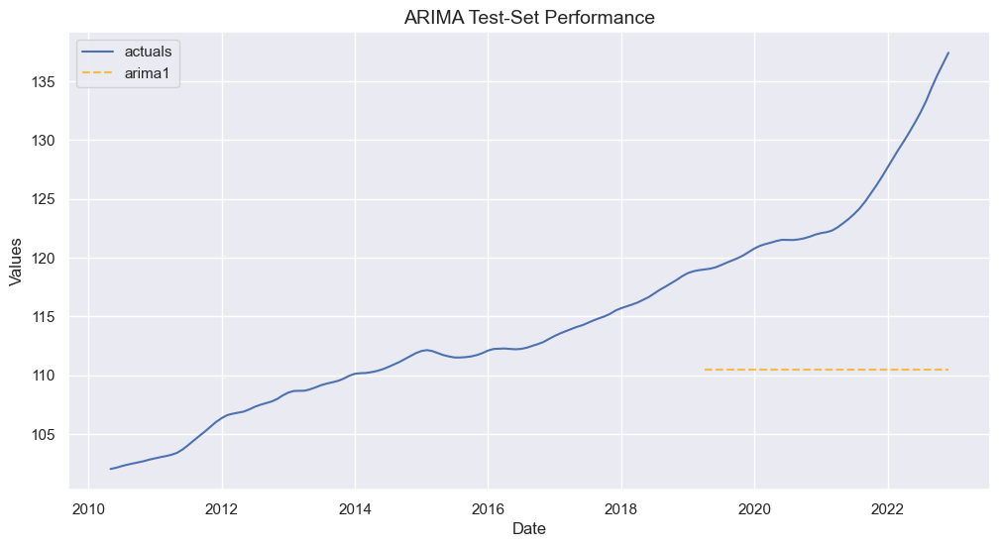

In [380]:

import pandas as pd
import numpy as np
from scalecast.Forecaster import Forecaster
from pmdarima import auto_arima
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(rc={'figure.figsize':(14,7)})


f = Forecaster(y=tabla_estandar['ID_CHQ 2008/01_ENDESA_BS1_BV'],current_dates=tabla_estandar['mesindexacion'])

f.generate_future_dates(12) # 12-month forecast horizon
f.set_test_length(.3) # 30% test set
f.set_estimator('arima') # set arima
f.manual_forecast(call_me='arima1') # forecast with arima

f.plot_test_set(ci=True) # view test results
plt.title('ARIMA Test-Set Performance',size=14)
plt.show()

Performing stepwise search to minimize aic
 ARIMA(2,2,1)(1,0,1)[12]             : AIC=-489.823, Time=0.48 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=-418.154, Time=0.03 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=-479.680, Time=0.13 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=-483.088, Time=0.11 sec
 ARIMA(2,2,1)(0,0,1)[12]             : AIC=-479.472, Time=0.38 sec
 ARIMA(2,2,1)(1,0,0)[12]             : AIC=-484.603, Time=0.37 sec
 ARIMA(2,2,1)(2,0,1)[12]             : AIC=-487.706, Time=1.45 sec
 ARIMA(2,2,1)(1,0,2)[12]             : AIC=-487.551, Time=1.83 sec
 ARIMA(2,2,1)(0,0,0)[12]             : AIC=-467.790, Time=0.06 sec
 ARIMA(2,2,1)(0,0,2)[12]             : AIC=-480.145, Time=1.08 sec
 ARIMA(2,2,1)(2,0,0)[12]             : AIC=-484.714, Time=1.01 sec
 ARIMA(2,2,1)(2,0,2)[12]             : AIC=-486.481, Time=1.80 sec
 ARIMA(1,2,1)(1,0,1)[12]             : AIC=-491.768, Time=0.33 sec
 ARIMA(1,2,1)(0,0,1)[12]             : AIC=-481.128, Time=0.22 sec
 ARIMA(1,2,1)(1,0,0

c:\Users\Vskah\anaconda3\lib\site-packages\scalecast\_utils.py:60: Warning: Confidence intervals not found for arima3. To turn on confidence intervals for future evaluated models, call the eval_cis() method.
  warnings.warn(


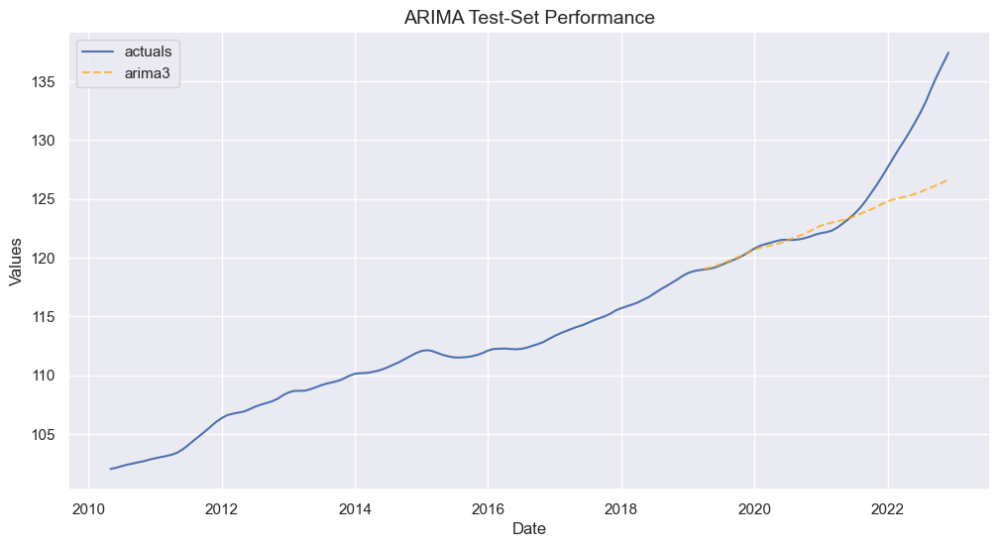

c:\Users\Vskah\anaconda3\lib\site-packages\scalecast\_utils.py:60: Warning: Confidence intervals not found for arima3. To turn on confidence intervals for future evaluated models, call the eval_cis() method.
  warnings.warn(


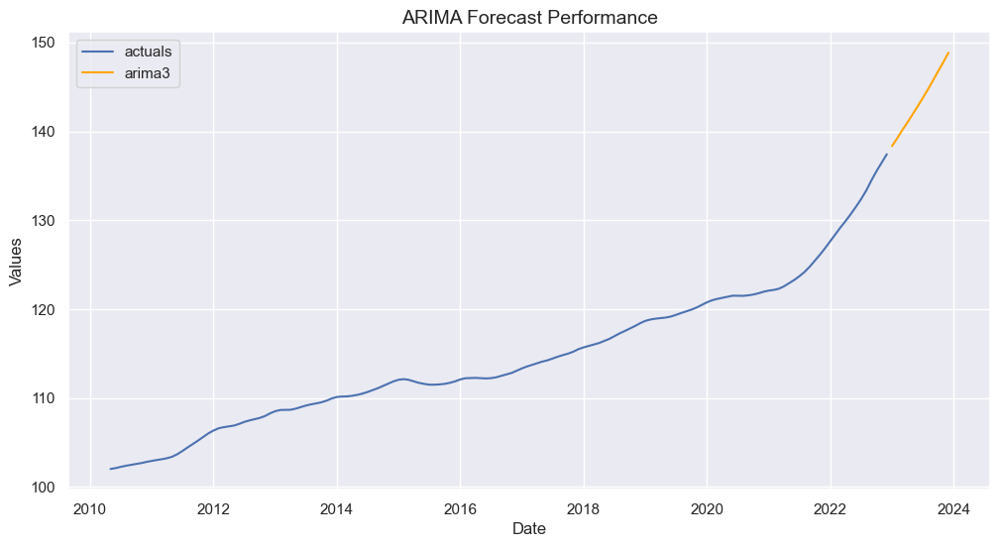

In [382]:
from scalecast.auxmodels import auto_arima
from sklearn.metrics import mean_absolute_error, mean_squared_error

auto_arima(
    f,
    start_P=1,
    start_q=1,
    max_p=6,
    max_q=6,
    m=12,
    seasonal=True,
    max_P=2, 
    max_D=2,
    max_Q=2,
    max_d=3,
    trace=True,
    error_action='ignore',
    suppress_warnings=True,
    stepwise=True,
    information_criterion="aic",
    alpha=0.05,
    scoring='mse',
    call_me='arima3',
)

f.plot_test_set(ci=True,models='arima3')
plt.title('ARIMA Test-Set Performance',size=14)
plt.show()

f.plot(ci=True,models='arima3')
plt.title('ARIMA Forecast Performance',size=14)
plt.show()



In [385]:
tabla_estandar

unique_id,mesindexacion,ID_CHQ 2008/01_ENDESA_BS1_BV,Diferencia,Diferencia2,Diferencia3
0,2010-01-01,101.309840,NaN,NaN,NaN
1,2010-02-01,101.527043,0.217202,NaN,NaN
2,2010-03-01,101.697027,0.169985,-0.047218,NaN
3,2010-04-01,101.877872,0.180845,0.010860,0.058078
4,2010-05-01,102.028969,0.151097,-0.029747,-0.040607
...,...,...,...,...,...
151,2022-08-01,133.333983,0.982605,0.137876,0.122767
152,2022-09-01,134.488461,1.154478,0.171873,0.033997
153,2022-10-01,135.521117,1.032656,-0.121822,-0.293696
154,2022-11-01,136.477280,0.956163,-0.076493,0.045329


MAPE: 1.41%
MSE: 8.64


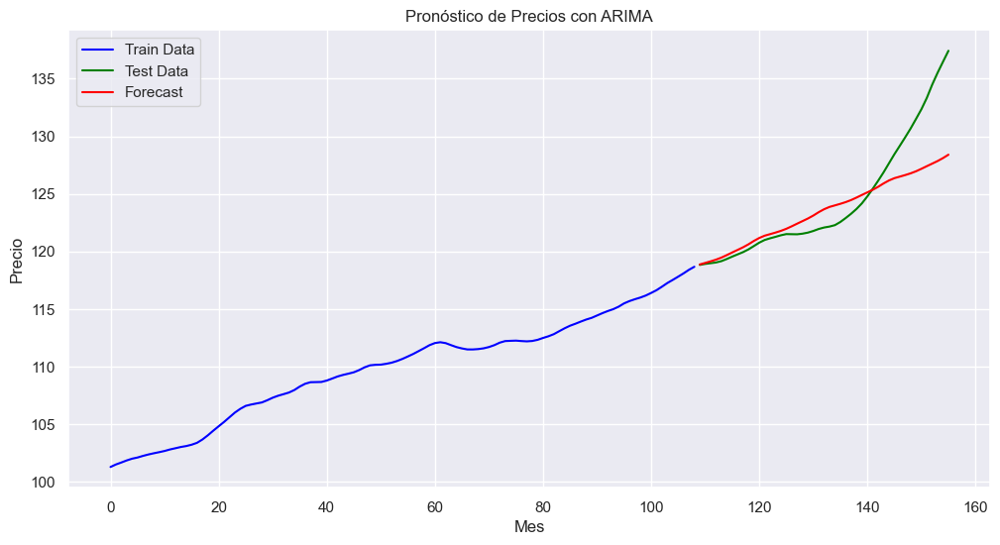

In [387]:
import statsmodels.api as sm
train_size = int(len(tabla_estandar) * 0.7)
train, test = tabla_estandar.iloc[:train_size], tabla_estandar.iloc[train_size:]

# Ajusta el modelo ARIMA
order = (0, 2, 1)
seasonal_order = (1, 0, 1, 12)
model = sm.tsa.SARIMAX(train['ID_CHQ 2008/01_ENDESA_BS1_BV'], order=order, seasonal_order=seasonal_order)
results = model.fit()

# Realiza pronósticos en el conjunto de prueba
forecast_steps = len(test)
forecast = results.get_forecast(steps=forecast_steps)

# Extrae la serie de precios pronosticados
predicted_prices = forecast.predicted_mean

# Extrae la serie de precios reales del conjunto de prueba
actual_prices = test['ID_CHQ 2008/01_ENDESA_BS1_BV']

# Calcula el MAPE (Error Absoluto Porcentual Medio)
mape = (np.abs(predicted_prices - actual_prices) / actual_prices).mean() * 100

# Calcula el MSE (Error Cuadrático Medio)
mse = mean_squared_error(actual_prices, predicted_prices)

print(f'MAPE: {mape:.2f}%')
print(f'MSE: {mse:.2f}')

# Visualiza los resultados
plt.figure(figsize=(12, 6))
plt.plot(train['ID_CHQ 2008/01_ENDESA_BS1_BV'], label='Train Data', color='blue')
plt.plot(test['ID_CHQ 2008/01_ENDESA_BS1_BV'], label='Test Data', color='green')
plt.plot(test.index, predicted_prices, label='Forecast', color='red')
plt.title('Pronóstico de Precios con ARIMA')
plt.xlabel('Mes')
plt.ylabel('Precio')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
# A continuación, elimina el índice actual (por ejemplo, el índice numérico predeterminado)
tabla_estandar.reset_index(drop=True, inplace=True)

In [ ]:
# Establece la columna "mes" como el índice del DataFrame
tabla_estandar.set_index('mesindexacion', inplace=True)

In [ ]:
tabla_estandar

unique_id,ID_CHQ 2008/01_ENDESA_BS1_BV,Diferencia,Diferencia2,Diferencia3
mesindexacion,,,,
2010-01-01,101.309840,NaN,NaN,NaN
2010-02-01,101.527043,0.217202,NaN,NaN
2010-03-01,101.697027,0.169985,-0.047218,NaN
2010-04-01,101.877872,0.180845,0.010860,0.058078
2010-05-01,102.028969,0.151097,-0.029747,-0.040607
...,...,...,...,...
2022-08-01,133.333983,0.982605,0.137876,0.122767
2022-09-01,134.488461,1.154478,0.171873,0.033997
2022-10-01,135.521117,1.032656,-0.121822,-0.293696


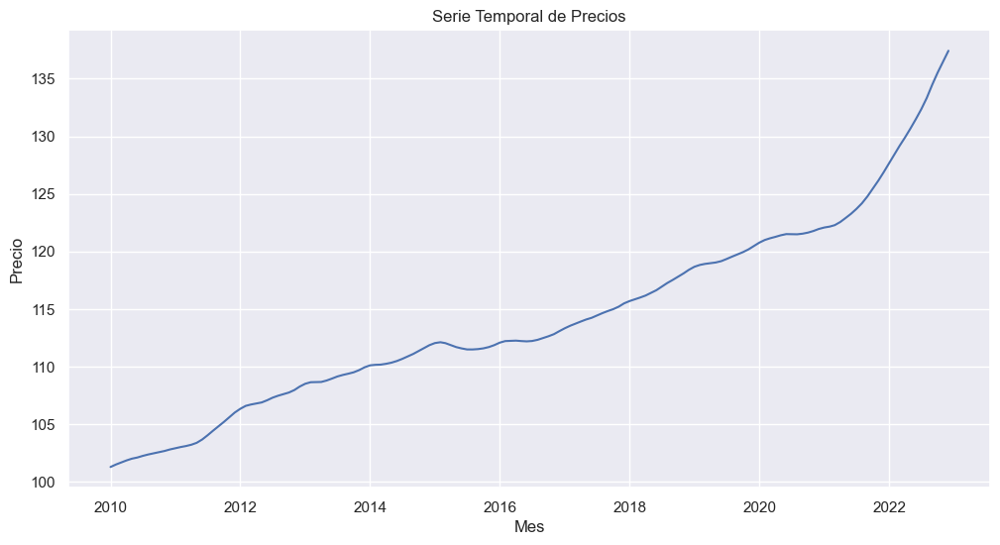

In [ ]:
# Visualiza tus datos
plt.figure(figsize=(12, 6))
plt.plot(tabla_estandar['ID_CHQ 2008/01_ENDESA_BS1_BV'])
plt.title('Serie Temporal de Precios')
plt.xlabel('Mes')
plt.ylabel('Precio')
plt.show()

In [192]:
from sklearn.metrics import mean_squared_error, mean_absolute_error

c:\Users\Vskah\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
c:\Users\Vskah\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
c:\Users\Vskah\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


MAPE: 1.49%
MSE: 6.98


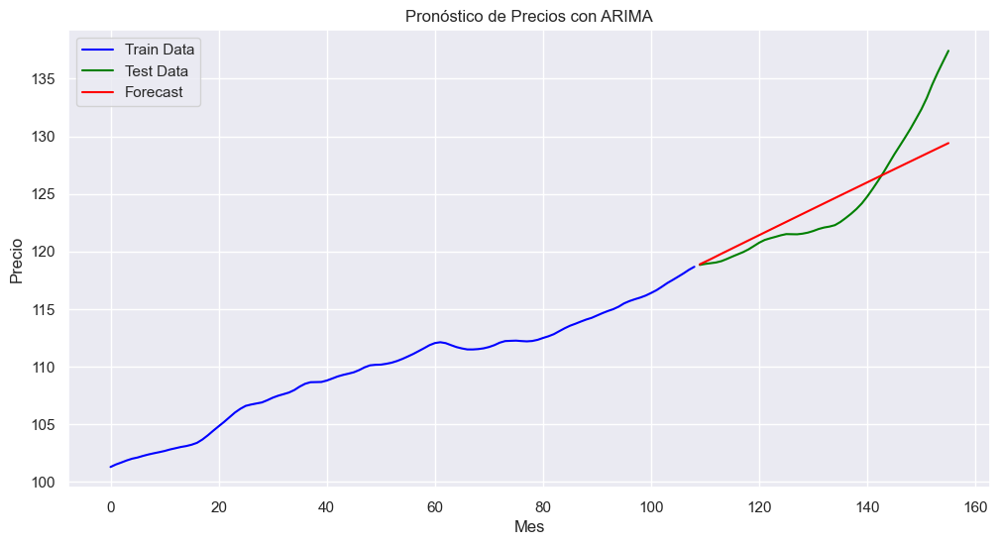

In [388]:
import pandas as pd
import statsmodels.api as sm  # Importa statsmodels
train_size = int(len(tabla_estandar) * 0.7)
train, test = tabla_estandar.iloc[:train_size], tabla_estandar.iloc[train_size:]

# Ajusta el modelo ARIMA en el conjunto de entrenamiento
p = 5  # Orden AR
d = 3  # Diferenciación
q = 4  # Orden MA
model = sm.tsa.ARIMA(train['ID_CHQ 2008/01_ENDESA_BS1_BV'], order=(p, d, q))
results = model.fit()

# Realiza pronósticos en el conjunto de prueba
forecast_steps = len(test)
forecast = results.forecast(steps=forecast_steps)

# Calcular el MAPE (Error Absoluto Porcentual Medio)
actual = test['ID_CHQ 2008/01_ENDESA_BS1_BV'].values
predicted = forecast
mape = np.mean(np.abs((actual - predicted) / actual)) * 100

# Calcular el MSE (Error Cuadrático Medio)
mse = np.mean((actual - predicted) ** 2)

print(f'MAPE: {mape:.2f}%')
print(f'MSE: {mse:.2f}')

# Visualiza los resultados
plt.figure(figsize=(12, 6))
plt.plot(train['ID_CHQ 2008/01_ENDESA_BS1_BV'], label='Train Data', color='blue')
plt.plot(test['ID_CHQ 2008/01_ENDESA_BS1_BV'], label='Test Data', color='green')
plt.plot(test.index, forecast, label='Forecast', color='red')
plt.title('Pronóstico de Precios con ARIMA')
plt.xlabel('Mes')
plt.ylabel('Precio')
plt.legend()
plt.grid(True)
plt.show()


Serie 2

In [392]:
series_grupo13 = series_tiempo[(series_tiempo['unique_id'] == grupo13[0])  ]

series_grupo13.head()

,mesindexacion,mesindexacion2,añoindexacion,licitacion,generadora,tipobloque,bloque,decpnudo,tipodecreto,mesreferencia,...,indice_CARBÓN,indice_CARBÓN_6M,indice_CPI,indice_CPI_4M,indice_CPI_6M,indice_CPI_9M,indice_GNL,indice_GNL_4M,indice_GNL_6M,unique_id
17,2010-01-01,1,2010,EMEL-SIC 2006/01-2 (EMETAL),AES GENER,BB,BB_Sur,283/2005,Decreto PN,3,...,1,0,0,0,0,0,0,0,0,ID_EMEL-SIC 2006/01-2 (EMETAL)_AES GENER_BB_Su...
35,2010-02-01,2,2010,EMEL-SIC 2006/01-2 (EMETAL),AES GENER,BB,BB_Sur,283/2005,Decreto PN,3,...,1,0,0,0,0,0,0,0,0,ID_EMEL-SIC 2006/01-2 (EMETAL)_AES GENER_BB_Su...
53,2010-03-01,3,2010,EMEL-SIC 2006/01-2 (EMETAL),AES GENER,BB,BB_Sur,283/2005,Decreto PN,3,...,1,0,0,0,0,0,0,0,0,ID_EMEL-SIC 2006/01-2 (EMETAL)_AES GENER_BB_Su...
71,2010-04-01,4,2010,EMEL-SIC 2006/01-2 (EMETAL),AES GENER,BB,BB_Sur,283/2005,Decreto PN,3,...,1,0,0,0,0,0,0,0,0,ID_EMEL-SIC 2006/01-2 (EMETAL)_AES GENER_BB_Su...
89,2010-05-01,5,2010,EMEL-SIC 2006/01-2 (EMETAL),AES GENER,BB,BB_Sur,283/2005,Decreto PN,3,...,1,0,0,0,0,0,0,0,0,ID_EMEL-SIC 2006/01-2 (EMETAL)_AES GENER_BB_Su...


In [393]:
tablagrupo13=series_grupo13.pivot_table(index='mesindexacion', columns=series_grupo13['unique_id'],values='precioindexadoponderado',aggfunc='sum')

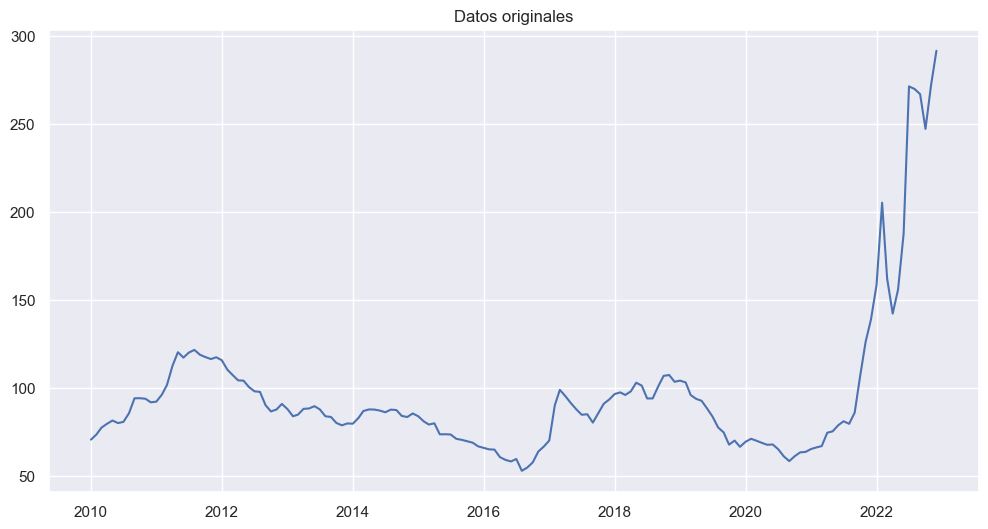

In [394]:
# Visualiza los datos originales
plt.figure(figsize=(12, 6))
plt.plot(tablagrupo13)
plt.title("Datos originales")
plt.show()

In [396]:
tabla_estandar2 = tablagrupo13.reset_index()
print(tabla_estandar2)

unique_id mesindexacion  ID_EMEL-SIC 2006/01-2 (EMETAL)_AES GENER_BB_Sur_BB
0            2010-01-01                                          70.433561 
1            2010-02-01                                          73.424321 
2            2010-03-01                                          77.296080 
3            2010-04-01                                          79.467666 
4            2010-05-01                                          81.299217 
..                  ...                                                ... 
151          2022-08-01                                         269.887124 
152          2022-09-01                                         266.973645 
153          2022-10-01                                         247.182077 
154          2022-11-01                                         272.035525 
155          2022-12-01                                         291.602980 

[156 rows x 2 columns]


c:\Users\Vskah\anaconda3\lib\site-packages\scalecast\_utils.py:60: Warning: Confidence intervals not found for arima1. To turn on confidence intervals for future evaluated models, call the eval_cis() method.
  warnings.warn(


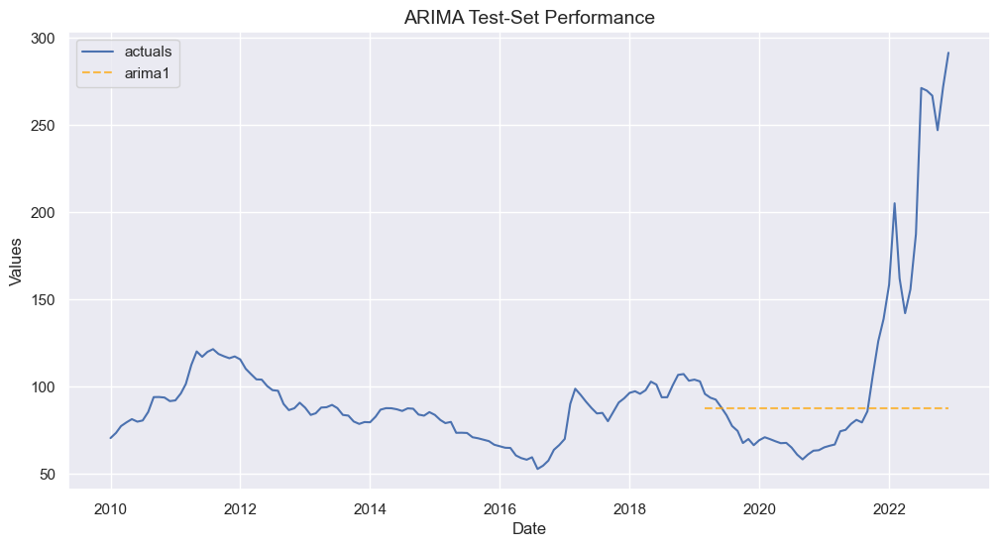

In [397]:
sns.set(rc={'figure.figsize':(14,7)})


f = Forecaster(y=tabla_estandar2['ID_EMEL-SIC 2006/01-2 (EMETAL)_AES GENER_BB_Sur_BB'],current_dates=tabla_estandar2['mesindexacion'])

f.generate_future_dates(12) # 12-month forecast horizon
f.set_test_length(.3) # 30% test set
f.set_estimator('arima') # set arima
f.manual_forecast(call_me='arima1') # forecast with arima

f.plot_test_set(ci=True) # view test results
plt.title('ARIMA Test-Set Performance',size=14)
plt.show()

Performing stepwise search to minimize aic
 ARIMA(2,2,1)(1,0,1)[12]             : AIC=1160.667, Time=0.29 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=1228.282, Time=0.01 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=1217.490, Time=0.05 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=1166.364, Time=0.07 sec
 ARIMA(2,2,1)(0,0,1)[12]             : AIC=1159.738, Time=0.17 sec
 ARIMA(2,2,1)(0,0,0)[12]             : AIC=1157.880, Time=0.08 sec
 ARIMA(2,2,1)(1,0,0)[12]             : AIC=1159.764, Time=0.17 sec
 ARIMA(1,2,1)(0,0,0)[12]             : AIC=1161.781, Time=0.04 sec
 ARIMA(2,2,0)(0,0,0)[12]             : AIC=1211.853, Time=0.03 sec
 ARIMA(3,2,1)(0,0,0)[12]             : AIC=1138.938, Time=0.07 sec
 ARIMA(3,2,1)(1,0,0)[12]             : AIC=1140.048, Time=0.29 sec
 ARIMA(3,2,1)(0,0,1)[12]             : AIC=1139.942, Time=0.19 sec
 ARIMA(3,2,1)(1,0,1)[12]             : AIC=1140.934, Time=0.79 sec
 ARIMA(3,2,0)(0,0,0)[12]             : AIC=1189.596, Time=0.03 sec
 ARIMA(4,2,1)(0,0,0

c:\Users\Vskah\anaconda3\lib\site-packages\scalecast\_utils.py:60: Warning: Confidence intervals not found for arima3. To turn on confidence intervals for future evaluated models, call the eval_cis() method.
  warnings.warn(


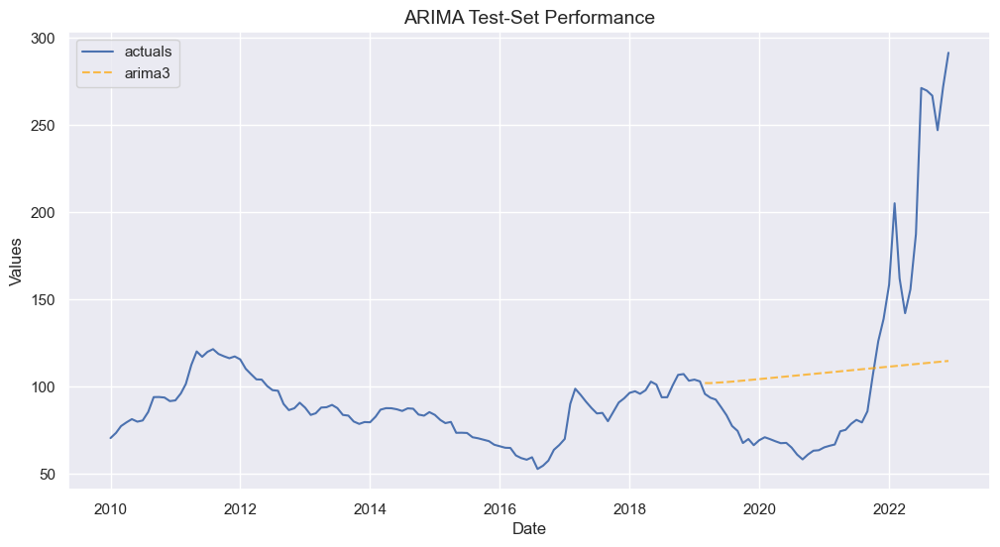

c:\Users\Vskah\anaconda3\lib\site-packages\scalecast\_utils.py:60: Warning: Confidence intervals not found for arima3. To turn on confidence intervals for future evaluated models, call the eval_cis() method.
  warnings.warn(


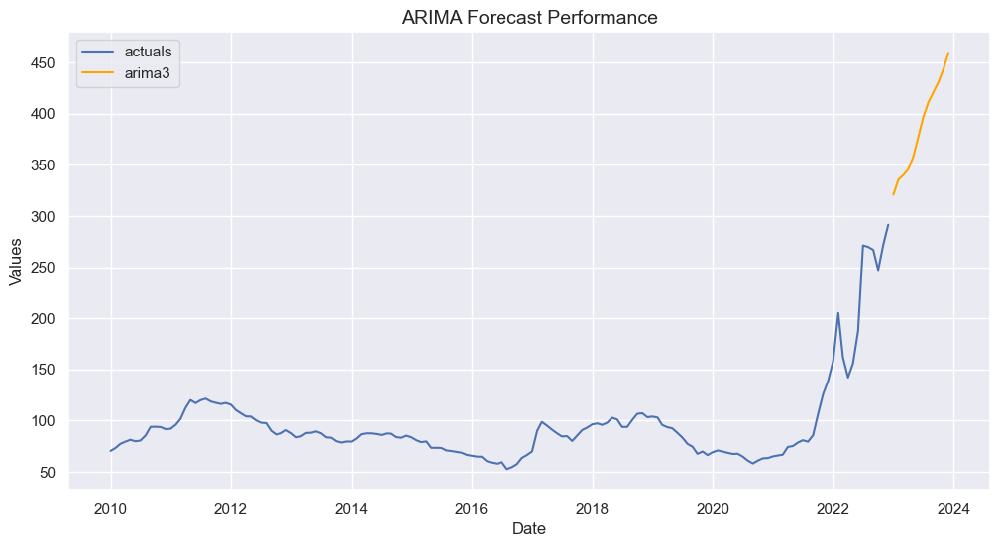

In [398]:
auto_arima(
    f,
    start_P=1,
    start_q=1,
    max_p=6,
    max_q=6,
    m=12,
    seasonal=True,
    max_P=2, 
    max_D=2,
    max_Q=2,
    max_d=3,
    trace=True,
    error_action='ignore',
    suppress_warnings=True,
    stepwise=True,
    information_criterion="aic",
    alpha=0.05,
    scoring='mse',
    call_me='arima3',
)

f.plot_test_set(ci=True,models='arima3')
plt.title('ARIMA Test-Set Performance',size=14)
plt.show()

f.plot(ci=True,models='arima3')
plt.title('ARIMA Forecast Performance',size=14)
plt.show()

MAPE: 47.35%
MSE: 4302.58


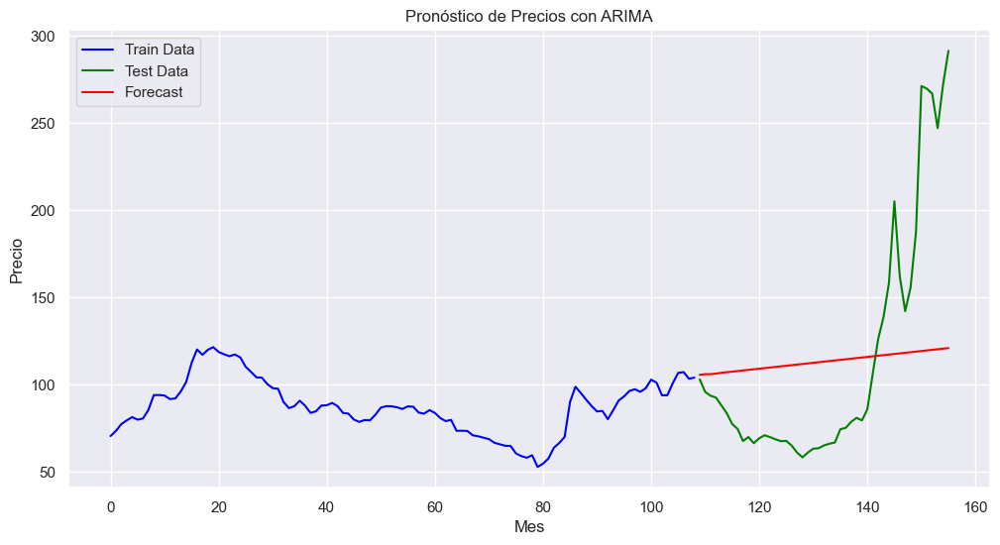

In [402]:
# Divide los datos en conjuntos de entrenamiento (train) y prueba (test)
# Por ejemplo, puedes utilizar el 80% de los datos para entrenamiento y el 20% para prueba
train_size = int(len(tabla_estandar2) * 0.7)
train, test = tabla_estandar2.iloc[:train_size], tabla_estandar2.iloc[train_size:]

# Ajusta el modelo ARIMA
order = (4, 2, 1)
seasonal_order = (0, 0, 0, 12)
model = sm.tsa.SARIMAX(train['ID_EMEL-SIC 2006/01-2 (EMETAL)_AES GENER_BB_Sur_BB'], order=order, seasonal_order=seasonal_order)
results = model.fit()

# Realiza pronósticos en el conjunto de prueba
forecast_steps = len(test)
forecast = results.get_forecast(steps=forecast_steps)

# Extrae la serie de precios pronosticados
predicted_prices = forecast.predicted_mean

# Extrae la serie de precios reales del conjunto de prueba
actual_prices = test['ID_EMEL-SIC 2006/01-2 (EMETAL)_AES GENER_BB_Sur_BB']

# Calcula el MAPE (Error Absoluto Porcentual Medio)
mape = (np.abs(predicted_prices - actual_prices) / actual_prices).mean() * 100

# Calcula el MSE (Error Cuadrático Medio)
mse = mean_squared_error(actual_prices, predicted_prices)

print(f'MAPE: {mape:.2f}%')
print(f'MSE: {mse:.2f}')

# Visualiza los resultados
plt.figure(figsize=(12, 6))
plt.plot(train['ID_EMEL-SIC 2006/01-2 (EMETAL)_AES GENER_BB_Sur_BB'], label='Train Data', color='blue')
plt.plot(test['ID_EMEL-SIC 2006/01-2 (EMETAL)_AES GENER_BB_Sur_BB'], label='Test Data', color='green')
plt.plot(test.index, predicted_prices, label='Forecast', color='red')
plt.title('Pronóstico de Precios con ARIMA')
plt.xlabel('Mes')
plt.ylabel('Precio')
plt.legend()
plt.grid(True)
plt.show()

Serie 3 

In [403]:
series_grupo18 = series_tiempo[(series_tiempo['unique_id'] == grupo18[0]) 
                              ]

series_grupo18.head()

,mesindexacion,mesindexacion2,añoindexacion,licitacion,generadora,tipobloque,bloque,decpnudo,tipodecreto,mesreferencia,...,indice_CARBÓN,indice_CARBÓN_6M,indice_CPI,indice_CPI_4M,indice_CPI_6M,indice_CPI_9M,indice_GNL,indice_GNL_4M,indice_GNL_6M,unique_id
11460,2021-01-01,1,2021,2015/01,BESALCO,BB,BS2C,10T/2014,Decreto PN,7,...,0,0,0,0,1,0,0,0,0,ID_2015/01_BESALCO_BS2C_BB
11648,2021-02-01,2,2021,2015/01,BESALCO,BB,BS2C,10T/2014,Decreto PN,7,...,0,0,0,0,1,0,0,0,0,ID_2015/01_BESALCO_BS2C_BB
11836,2021-03-01,3,2021,2015/01,BESALCO,BB,BS2C,10T/2014,Decreto PN,7,...,0,0,0,0,1,0,0,0,0,ID_2015/01_BESALCO_BS2C_BB
12024,2021-04-01,4,2021,2015/01,BESALCO,BB,BS2C,10T/2014,Decreto PN,7,...,0,0,0,0,1,0,0,0,0,ID_2015/01_BESALCO_BS2C_BB
12212,2021-05-01,5,2021,2015/01,BESALCO,BB,BS2C,10T/2014,Decreto PN,7,...,0,0,0,0,1,0,0,0,0,ID_2015/01_BESALCO_BS2C_BB


In [404]:
tablagrupo18=series_grupo18.pivot_table(index='mesindexacion', columns=series_grupo18['unique_id'],values='precioindexadoponderado',aggfunc='sum')

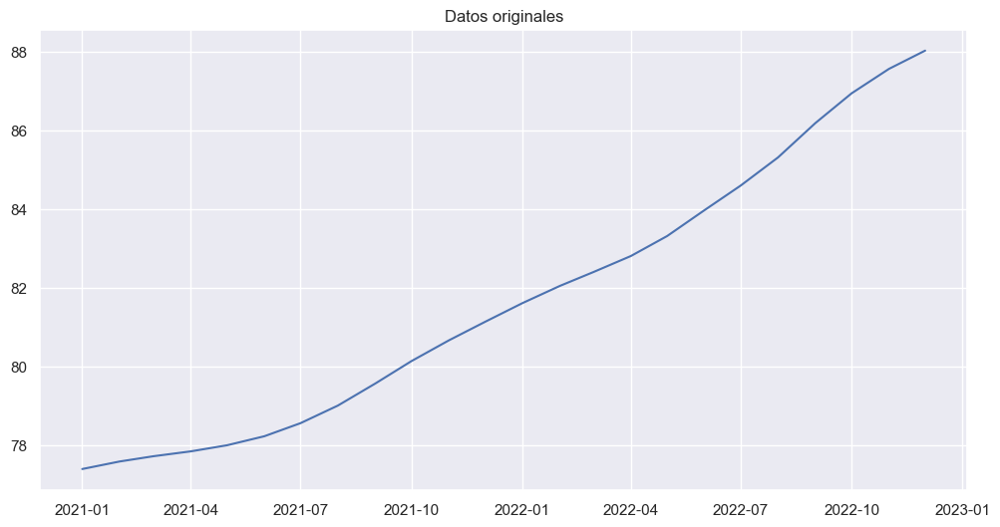

In [405]:
# Visualiza los datos originales
plt.figure(figsize=(12, 6))
plt.plot(tablagrupo18)
plt.title("Datos originales")
plt.show()

In [406]:
tabla_estandar3 = tablagrupo18.reset_index()
print(tabla_estandar3)

unique_id mesindexacion  ID_2015/01_BESALCO_BS2C_BB
0            2021-01-01                   77.406071
1            2021-02-01                   77.597061
2            2021-03-01                   77.730365
3            2021-04-01                   77.854105
4            2021-05-01                   78.008331
5            2021-06-01                   78.237279
6            2021-07-01                   78.569344
7            2021-08-01                   79.015883
8            2021-09-01                   79.574804
9            2021-10-01                   80.143887
10           2021-11-01                   80.669632
11           2021-12-01                   81.139484
12           2022-01-01                   81.614417
13           2022-02-01                   82.050495
14           2022-03-01                   82.404379
15           2022-04-01                   82.810269
16           2022-05-01                   83.315689
17           2022-06-01                   83.972944
18          

c:\Users\Vskah\anaconda3\lib\site-packages\scalecast\_utils.py:60: Warning: Confidence intervals not found for arima1. To turn on confidence intervals for future evaluated models, call the eval_cis() method.
  warnings.warn(


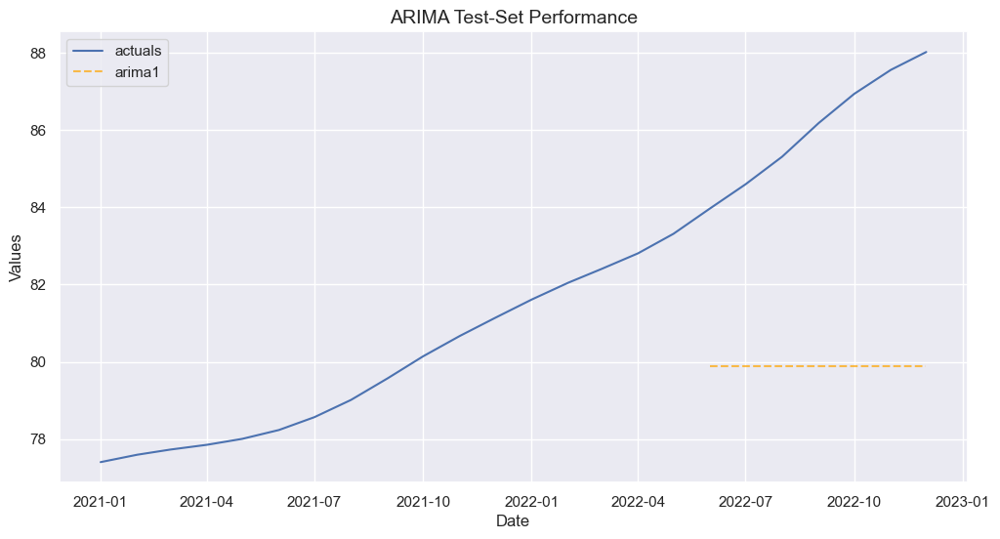

In [407]:
sns.set(rc={'figure.figsize':(14,7)})


f = Forecaster(y=tabla_estandar3['ID_2015/01_BESALCO_BS2C_BB'],current_dates=tabla_estandar3['mesindexacion'])

f.generate_future_dates(12) # 12-month forecast horizon
f.set_test_length(.3) # 30% test set
f.set_estimator('arima') # set arima
f.manual_forecast(call_me='arima1') # forecast with arima

f.plot_test_set(ci=True) # view test results
plt.title('ARIMA Test-Set Performance',size=14)
plt.show()

Performing stepwise search to minimize aic
 ARIMA(2,2,1)(1,0,1)[12]             : AIC=-42.201, Time=0.24 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=-40.569, Time=0.02 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=-44.879, Time=0.04 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=-45.432, Time=0.08 sec
 ARIMA(0,2,1)(0,0,0)[12]             : AIC=-44.646, Time=0.03 sec
 ARIMA(0,2,1)(1,0,1)[12]             : AIC=-43.433, Time=0.07 sec
 ARIMA(0,2,1)(0,0,2)[12]             : AIC=-43.433, Time=0.24 sec
 ARIMA(0,2,1)(1,0,0)[12]             : AIC=-45.433, Time=0.08 sec
 ARIMA(0,2,1)(2,0,0)[12]             : AIC=-43.433, Time=0.21 sec
 ARIMA(0,2,1)(2,0,1)[12]             : AIC=-41.433, Time=0.26 sec
 ARIMA(0,2,0)(1,0,0)[12]             : AIC=-43.326, Time=0.04 sec
 ARIMA(1,2,1)(1,0,0)[12]             : AIC=-45.563, Time=0.17 sec
 ARIMA(1,2,1)(0,0,0)[12]             : AIC=inf, Time=0.07 sec
 ARIMA(1,2,1)(2,0,0)[12]             : AIC=inf, Time=0.85 sec
 ARIMA(1,2,1)(1,0,1)[12]             : AI

c:\Users\Vskah\anaconda3\lib\site-packages\scalecast\_utils.py:60: Warning: Confidence intervals not found for arima3. To turn on confidence intervals for future evaluated models, call the eval_cis() method.
  warnings.warn(


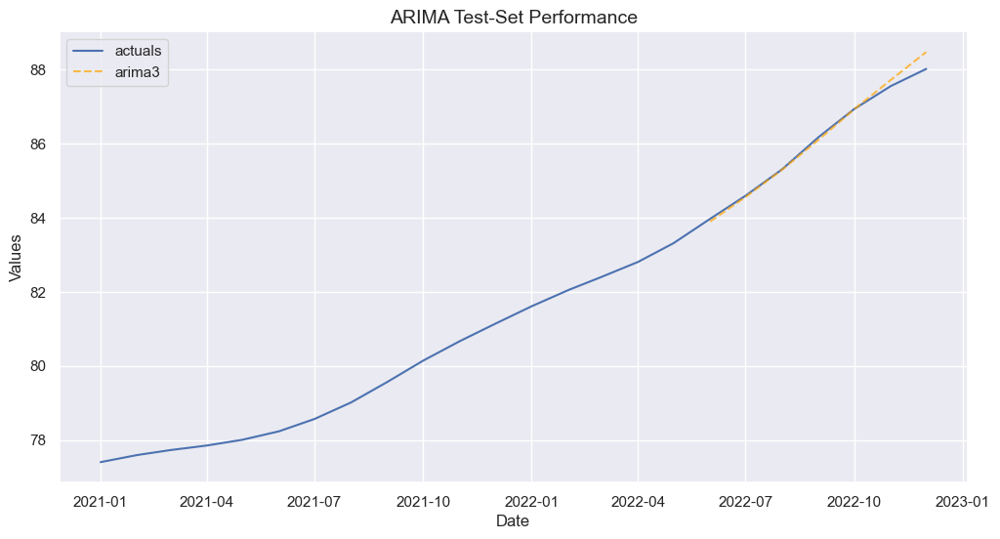

c:\Users\Vskah\anaconda3\lib\site-packages\scalecast\_utils.py:60: Warning: Confidence intervals not found for arima3. To turn on confidence intervals for future evaluated models, call the eval_cis() method.
  warnings.warn(


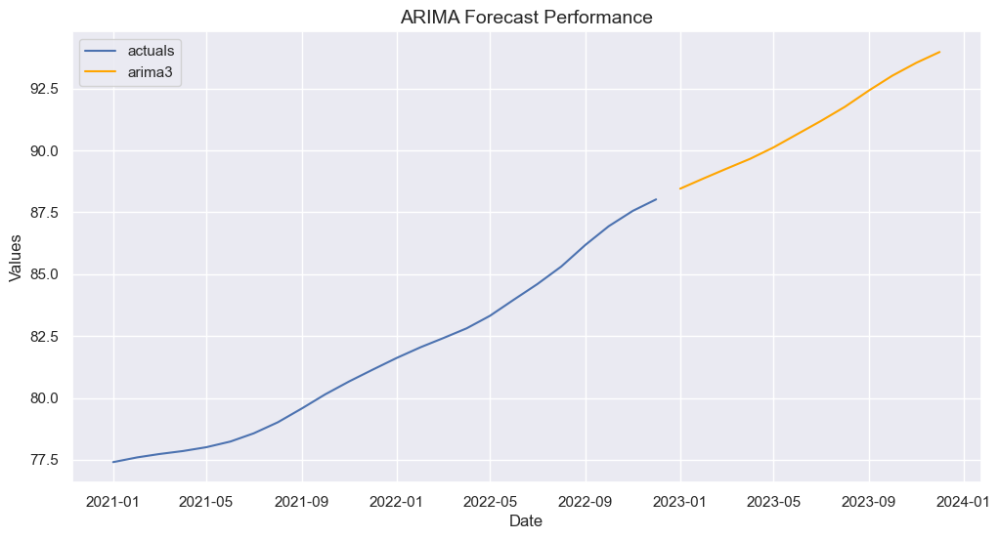

In [408]:
auto_arima(
    f,
    start_P=1,
    start_q=1,
    max_p=6,
    max_q=6,
    m=12,
    seasonal=True,
    max_P=2, 
    max_D=2,
    max_Q=2,
    max_d=3,
    trace=True,
    error_action='ignore',
    suppress_warnings=True,
    stepwise=True,
    information_criterion="aic",
    alpha=0.05,
    scoring='mse',
    call_me='arima3',
)

f.plot_test_set(ci=True,models='arima3')
plt.title('ARIMA Test-Set Performance',size=14)
plt.show()

f.plot(ci=True,models='arima3')
plt.title('ARIMA Forecast Performance',size=14)
plt.show()

c:\Users\Vskah\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


MAPE: 0.23%
MSE: 0.05


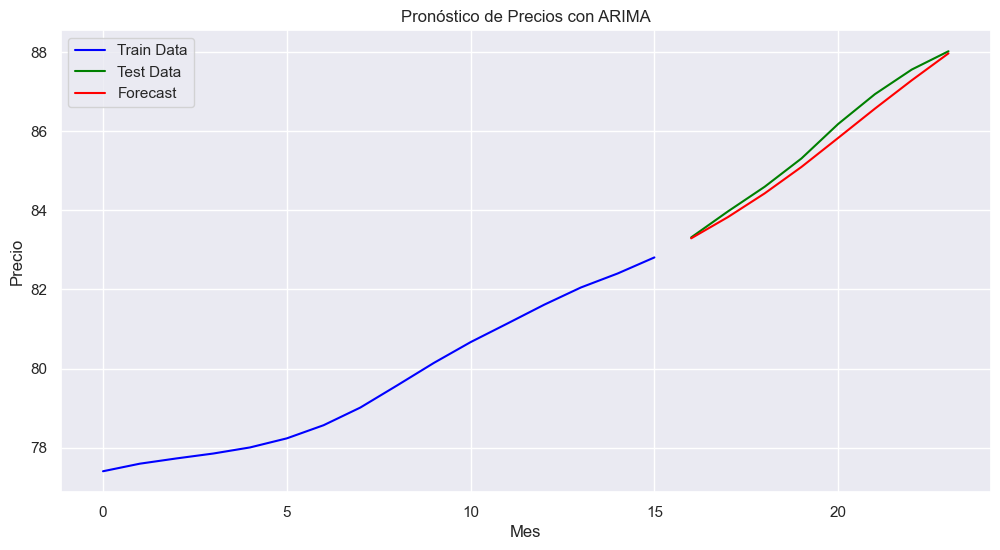

In [410]:
# Divide los datos en conjuntos de entrenamiento (train) y prueba (test)
# Por ejemplo, puedes utilizar el 80% de los datos para entrenamiento y el 20% para prueba
train_size = int(len(tabla_estandar3) * 0.7)
train, test = tabla_estandar3.iloc[:train_size], tabla_estandar3.iloc[train_size:]

# Ajusta el modelo ARIMA
order = (1, 2, 1)
seasonal_order = (1, 0, 0, 12)
model = sm.tsa.SARIMAX(train['ID_2015/01_BESALCO_BS2C_BB'], order=order, seasonal_order=seasonal_order)
results = model.fit()

# Realiza pronósticos en el conjunto de prueba
forecast_steps = len(test)
forecast = results.get_forecast(steps=forecast_steps)

# Extrae la serie de precios pronosticados
predicted_prices = forecast.predicted_mean

# Extrae la serie de precios reales del conjunto de prueba
actual_prices = test['ID_2015/01_BESALCO_BS2C_BB']

# Calcula el MAPE (Error Absoluto Porcentual Medio)
mape = (np.abs(predicted_prices - actual_prices) / actual_prices).mean() * 100

# Calcula el MSE (Error Cuadrático Medio)
mse = mean_squared_error(actual_prices, predicted_prices)

print(f'MAPE: {mape:.2f}%')
print(f'MSE: {mse:.2f}')

# Visualiza los resultados
plt.figure(figsize=(12, 6))
plt.plot(train['ID_2015/01_BESALCO_BS2C_BB'], label='Train Data', color='blue')
plt.plot(test['ID_2015/01_BESALCO_BS2C_BB'], label='Test Data', color='green')
plt.plot(test.index, predicted_prices, label='Forecast', color='red')
plt.title('Pronóstico de Precios con ARIMA')
plt.xlabel('Mes')
plt.ylabel('Precio')
plt.legend()
plt.grid(True)
plt.show()